# Merged Global Analysis: GABA-only vs Dual Imaging Data

This notebook merges analysis from two different data sources:
1. **GABA-only data** (P0-P10) from pixelNMF data processing
2. **Dual imaging data** from rg_dev_pipeline

Both datasets contain `beh_dict` with decoder outputs including R², F1-score, and active percentage metrics.


In [7]:
# Import required libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('dark_background')
sns.set_palette("husl")

# Set common plot parameters
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['figure.autolayout'] = True


## Data Loading Functions


In [8]:
# def get_parent_folder(dsname):
#     """Extract parent folder from dataset name"""
#     import re
#     # Handle cases like 'sz91_2024-06-05_b_cell_control' -> 'sz091'
#     match = re.match(r'(sz)(\d{2})', dsname)
#     if match:
#         prefix, digits = match.groups()
#         return f"{prefix}0{digits}"  # insert a 0 before the two digits
#     else:
#         return dsname


# def load_gaba_data(gaba_sessions_by_age, base_path='C:/Users/zaggila/Documents/pixelNMF/data_proc/cells'):
#     """
#     Load GABA-only data from beh_dict.npy files with general session structure:
#     base_path / mouse_id / session_folder / behavior_outputs / beh_dict.npy
#     """
#     gaba_data = []

#     for age, sessions in gaba_sessions_by_age.items():
#         for session in sessions:
#             try:
#                 # Split session string to get mouse ID and session folder
#                 if '/' in session:
#                     parent_folder, session_folder = session.split('/', 1)
#                 else:
#                     # fallback: assume session is like 'sz089_2025_06_30_a'
#                     parts = session.split('_', 1)
#                     parent_folder = parts[0]
#                     session_folder = parts[1] if len(parts) > 1 else session

#                 # Build file path
#                 file_path = os.path.join(base_path, parent_folder, session_folder, 'behavior_outputs', 'beh_dict.npy')

#                 if not os.path.exists(file_path):
#                     print(f"GABA file not found, skipping: {file_path}")
#                     continue

#                 beh_dict = np.load(file_path, allow_pickle=True).item()

#                 # Base info
#                 data_point = {
#                     'age': age,
#                     'session': session,
#                     'group': 'GABA',
#                     'file_path': file_path
#                 }

#                 # Linear decoder outputs
#                 linear_decoder = beh_dict.get('decoder_outputs_data', {})
#                 data_point.update({
#                     'r2_linear': linear_decoder.get('mean_r2', np.nan),
#                     'all_y_true_linear': linear_decoder.get('all_y_true', []),
#                     'all_y_pred_linear': linear_decoder.get('all_y_pred', [])
#                 })

#                                 # Linear decoder outputs
#                 linear_decoder = beh_dict.get('decoder_outputs_data', {})
#                 data_point.update({
#                     'med_r2_linear': linear_decoder.get('median_r2', np.nan)

#                 })

#                 # Logistic decoder outputs
#                 logistic_decoder = beh_dict.get('logistic_decoder_outputs_data', {})
#                 data_point.update({
#                     'f1_score_logistic': logistic_decoder.get('f1_both_classes', np.nan),
#                     'all_y_true_logistic': logistic_decoder.get('all_y_true', []),
#                     'all_y_pred_logistic': logistic_decoder.get('all_y_pred', [])
#                 })

#                 # Active percentage GET FROM VAL ANNOT DICT 
#                 active_pct = beh_dict.get('active_percentage', beh_dict.get('active_time_percentage', np.nan)) # from val annot dict reload
#                 data_point['active_percentage'] = active_pct

#                 gaba_data.append(data_point)
#                 print(f"✅ Loaded GABA {session} ({age})")

#             except Exception as e:
#                 print(f"⚠️ Error loading GABA {session}: {e}")

#     return gaba_data

# def load_dual_imaging_data(dual_sessions_by_age, base_path='C:/Users/zaggila/Documents/rg_dev_pipeline/test_data'):
#     """Load dual imaging data from beh_dict files"""
#     dual_data = []
    
#     for age, sessions in dual_sessions_by_age.items():
#         for session in sessions:
#             try:
#                 file_path = os.path.join(base_path, session, 'videography_processing', 'dual_img_cell_beh_dict.npy')
                
#                 if not os.path.exists(file_path):
#                     print(f"Dual imaging file not found, skipping: {file_path}")
#                     continue
                    
#                 beh_dict = np.load(file_path, allow_pickle=True).tolist()
                
#                 # Extract metrics
#                 data_point = {
#                     'age': age,
#                     'session': session,
#                     'group': 'Dual Imaging',
#                     'file_path': file_path
#                 }
                
#                 # Extract decoder outputs
#                 if 'decoder_outputs_data' in beh_dict:
#                     decoder_data = beh_dict['decoder_outputs_data']
#                     data_point.update({
#                         'r2_linear': decoder_data.get('mean_r2', np.nan),
#                         'all_y_true_linear': decoder_data.get('all_y_true', []),
#                         'all_y_pred_linear': decoder_data.get('all_y_pred', [])
#                     })
                
#                 if 'logistic_decoder_outputs_data' in beh_dict:
#                     logistic_data = beh_dict['logistic_decoder_outputs_data']
#                     data_point.update({
#                         'f1_score_logistic': logistic_data.get('f1_both_classes', np.nan),
#                         'all_y_true_logistic': logistic_data.get('all_y_true', []),
#                         'all_y_pred_logistic': logistic_data.get('all_y_pred', [])
#                     })
                
#                 # Extract active percentage if available
#                 if 'active_percentage' in beh_dict:  
#                     data_point['active_percentage'] = beh_dict['active_percentage']
#                 elif 'active_time_percentage' in beh_dict:
#                     data_point['active_percentage'] = beh_dict['active_time_percentage']
                
#                 dual_data.append(data_point)
#                 print(f'Loaded Dual Imaging {session} ({age})')
                
#             except Exception as e:
#                 print(f'Error loading Dual Imaging {session}: {e}')
    
#     return dual_data


## Define Data Sources


In [9]:
# GABA-only sessions by age (P0-P10)
gaba_sessions_by_age = {
    'p1': ['sz091_2024_06_05_b', 'sz105_2025_05_29_a', 'sz106_2025_05_29_a'],
    'p2': ['sz089_2024_06_04_a', 'sz092_2024_06_06_a', 'sz108_2025_05_30_a','sz106_2025_05_30_a', 'sz105_2025_05_30_a', 'sz107_2025_05_30_b'], # 'sz095-2025-01-09_b'
    'p3': ['sz092_2024_06_07_a', 'sz106_2025_05_31_a', 'sz107_2025_05_31_a', 'sz106_2025_05_31_a', 'sz108_2025_05_31_a'], # 'sz101_2025_04_12_a'
    'p4': ['sz110_2025_06_01_a', 'sz089_2024_06_06_a', 'sz106_2025_06_01_a', 'sz106_2025_06_01_a', 'sz108_2025_06_01_a'],
    'p5': ['sz110_2025_06_02_a', 'sz090_2024_06_07_a', 'sz89_2024_06_07_a', 'sz108_2025_06_02_a'], # 'sz101_2025_04_13_b'
    'p6': ['sz110_2025_06_03_a'],
    'p7': ['sz110_2025_06_04_a'],
    'p8': ['sz110_2025_06_05_a'],
    'p9': ['sz110_2025_06_06_a'],
    # 'p10': ['sz110_2025_06_07_a']
}

emx_sessions_by_age = {
    'p2': ['sz095_2025_01_09_b'], 
    'p3': ['sz101_2025_04_12_a', 'sz116_2025_06_07_a'], # sz114 ? sz080 can we extract behavior ? 
    'p4': ['sz101_2025_04_13_b', 'sz119_2025_06_08_a']
}

# Dual imaging sessions by age (P5-P10)
dual_sessions_by_age = {
    'p5': ['sz067_2023-10-09_c', 'sz085_2024-04-20_a'], # 'sz078_2023-02-17'
    'p6': ['sz078_2023-02-18', 'sz085_2024-04-21_a', 'sz086_2024-04-28_a'],
    'p7': ['sz078_2023-02-19', 'sz085_2024-04-22_a', 'jm046/2024-09-02_a'],
    'p8': ['sz086_2024-04-30_a', 'sz085_2024-04-23_b', 'jm046/2024-09-03_a', 'jm042/2024-08-27_a', 'jm043/2024-08-27_a', 'jm044/2024-08-27_a'],
    'p9': ['sz086_2024-05-01_a', 'jm046/2024-09-04_a', 'jm044/2024-08-28_a', 'jm042/2024-08-28_a', 'jm043/2024-08-28_a'],
    'p10': ['sz086_2024-05-02_a', 'sz085_2024-04-25_b', 'jm043/2024-08-29_a']
# SOS: p7: 'sz079_2024-02-19_a', p8: 'sz079_2024-02-20_a', p9: 'sz079_2024-02-21_a', p10: 'sz079_2024-02-22_a', p11: 'sz079_2024-02-23_a' (if usable)
# also add: all other ds 752.5 FOV, jure's from paper 

}

print("Data sources defined:")
print(f"GABA sessions: {sum(len(sessions) for sessions in gaba_sessions_by_age.values())} total")
print(f"Dual imaging sessions: {sum(len(sessions) for sessions in dual_sessions_by_age.values())} total")


Data sources defined:
GABA sessions: 27 total
Dual imaging sessions: 22 total


In [10]:
# import os
# import numpy as np
# import pandas as pd

# def get_parent_folder(dsname):
#     """Extract parent folder from dataset name"""
#     import re
#     match = re.match(r'(sz)(\d{2})', dsname)
#     if match:
#         prefix, digits = match.groups()
#         return f"{prefix}0{digits}"  # insert a 0 before the two digits
#     else:
#         return dsname


# def load_sessions(session_dict, group, base_path, file_type="gaba"):
#     """
#     General loader for GABA and Dual Imaging sessions.
    
#     Parameters
#     ----------
#     session_dict : dict
#         {age: [list of sessions]} for both GABA and Dual Imaging
#     group : str
#         Either "GABA" or "Dual Imaging"
#     base_path : str
#         Path where data is stored
#     file_type : str
#         "gaba" or "dual"
        
#     Returns
#     -------
#     data : list of dict
#         Loaded behavioral/decoder metrics
#     plot_df : pd.DataFrame
#         Metadata for plotting (age, session, group, file_path)
#     """
#     data = []
#     plot_records = []

#     for age, sessions in session_dict.items():
#         for session in sessions:
#             try:
#                 # Build path depending on type
#                 if file_type == "gaba":
#                     if '/' in session:
#                         parent_folder, session_folder = session.split('/', 1)
#                     else:
#                         parts = session.split('_', 1)
#                         parent_folder = parts[0]
#                         session_folder = parts[1] if len(parts) > 1 else session

#                     file_path = os.path.join(
#                         base_path, parent_folder, session_folder,
#                         'behavior_outputs', 'beh_dict.npy'
#                     )
#                 else:  # dual
#                     file_path = os.path.join(
#                         base_path, session, 'videography_processing',
#                         'dual_img_cell_beh_dict.npy'
#                     )

#                 if not os.path.exists(file_path):
#                     print(f"⚠️ File not found, skipping: {file_path}")
#                     continue

#                 beh_dict = np.load(file_path, allow_pickle=True)
#                 beh_dict = beh_dict.item() if file_type == "gaba" else beh_dict.tolist()

#                 # Base info
#                 data_point = {
#                     'age': age,
#                     'session': session,
#                     'group': group,
#                     'file_path': file_path
#                 }

#                 # Linear decoder
#                 lin_data = beh_dict.get('decoder_outputs_data', {})
#                 data_point.update({
#                     'r2_linear': lin_data.get('mean_r2', np.nan),
#                     'med_r2_linear': lin_data.get('median_r2', np.nan) if 'median_r2' in lin_data else np.nan,
#                     'all_y_true_linear': lin_data.get('all_y_true', []),
#                     'all_y_pred_linear': lin_data.get('all_y_pred', [])
#                 })

#                 # Logistic decoder
#                 log_data = beh_dict.get('logistic_decoder_outputs_data', {})
#                 data_point.update({
#                     'f1_score_logistic': log_data.get('f1_both_classes', np.nan),
#                     'all_y_true_logistic': log_data.get('all_y_true', []),
#                     'all_y_pred_logistic': log_data.get('all_y_pred', [])
#                 })


#                 # PCA-related info
#                 data_point['var_exp_time'] = beh_dict.get('var_exp_cell', None)
#                 data_point['pca_emb_time'] = beh_dict.get('pca_emb_time', None)

#                 data.append(data_point)

#                 # Plotting metadata
#                 plot_records.append({
#                     'age': age,
#                     'session': session,
#                     'group': group,
#                     'file_path': file_path
#                 })

#                 print(f"✅ Loaded {group} {session} ({age})")

#             except Exception as e:
#                 print(f"⚠️ Error loading {group} {session}: {e}")

#     plot_df = pd.DataFrame(plot_records)
#     return data, plot_df


In [11]:
# Collect all ages
all_ages = sorted(set(list(gaba_sessions_by_age.keys()) + list(dual_sessions_by_age.keys())+ list(emx_sessions_by_age.keys())),
                  key=lambda x: int(x.lstrip('p')))

summary_data = []

for age in all_ages:
    gaba_count = len(gaba_sessions_by_age.get(age, []))
    dual_count = len(dual_sessions_by_age.get(age, []))
    emx_count = len(emx_sessions_by_age.get(age, []))
    
    if gaba_count > 0 and dual_count == 0:
        group_type = "GABA-8m only"
    elif emx_count > 0 and dual_count == 0:
        group_type = "EMX-8m only"
    elif gaba_count == 0 and dual_count > 0:
        group_type = "dual"
    elif gaba_count > 0 and dual_count > 0:
        group_type = "GABA only & dual"
    else:
        group_type = "None"
    
    summary_data.append({
        'Age': age,
        'GABA_sessions': gaba_count,
        'EMX_sessions': emx_count,
        'Dual_sessions': dual_count,
        'Group_type': group_type
    })

# Convert to DataFrame
summary_df = pd.DataFrame(summary_data)

# Show the summary table
print(summary_df)

   Age  GABA_sessions  EMX_sessions  Dual_sessions        Group_type
0   p1              3             0              0      GABA-8m only
1   p2              6             1              0      GABA-8m only
2   p3              5             2              0      GABA-8m only
3   p4              5             2              0      GABA-8m only
4   p5              4             0              2  GABA only & dual
5   p6              1             0              3  GABA only & dual
6   p7              1             0              3  GABA only & dual
7   p8              1             0              6  GABA only & dual
8   p9              1             0              5  GABA only & dual
9  p10              0             0              3              dual


In [12]:
summary_df

,Age,GABA_sessions,EMX_sessions,Dual_sessions,Group_type
0,p1,3,0,0,GABA-8m only
1,p2,6,1,0,GABA-8m only
2,p3,5,2,0,GABA-8m only
3,p4,5,2,0,GABA-8m only
4,p5,4,0,2,GABA only & dual
5,p6,1,0,3,GABA only & dual
6,p7,1,0,3,GABA only & dual
7,p8,1,0,6,GABA only & dual
8,p9,1,0,5,GABA only & dual
9,p10,0,0,3,dual


In [13]:
## import os
import numpy as np
import pandas as pd

def get_parent_folder(dsname):
    """Extract parent folder from dataset name"""
    import re
    match = re.match(r'(sz)(\d{2})', dsname)
    if match:
        prefix, digits = match.groups()
        return f"{prefix}0{digits}"  # insert a 0 before the two digits
    else:
        return dsname


def load_sessions(session_dict, group, base_path, file_type="gaba"):
    """
    General loader for GABA and Dual Imaging sessions.
    
    Returns:
        data : list of dict
            Full extracted metrics per dataset
        plot_df : pd.DataFrame
            Minimal metadata + key metrics for plotting
    """
    data = []
    plot_records = []

    for age, sessions in session_dict.items():
        for session in sessions:
            try:
                # Build path
                if file_type == "gaba":
                    if '/' in session:
                        parent_folder, session_folder = session.split('/', 1)
                    else:
                        parts = session.split('_', 1)
                        parent_folder = parts[0]
                        session_folder = parts[1] if len(parts) > 1 else session

                    file_path = os.path.join(
                        base_path, parent_folder, session_folder,
                        'behavior_outputs', 'beh_dict.npy'
                    )
                else:  # dual
                    file_path = os.path.join(
                        base_path, session, 'videography_processing',
                        'dual_img_cell_beh_dict.npy'
                    )

                if not os.path.exists(file_path):
                    print(f"⚠️ File not found, skipping: {file_path}")
                    continue

                beh_dict = np.load(file_path, allow_pickle=True)
                beh_dict = beh_dict.item() if file_type == "gaba" else beh_dict.tolist()

                # Base info
                data_point = {
                    'age': age,
                    'session': session,
                    'group': group,
                    'file_path': file_path
                }

                # Linear decoder
                lin_data = beh_dict.get('decoder_outputs_data', {})
                data_point.update({
                    'r2_linear': lin_data.get('mean_r2', np.nan),
                    'med_r2_linear': lin_data.get('median_r2', np.nan),
                    'all_y_true_linear': lin_data.get('all_y_true', []),
                    'all_y_pred_linear': lin_data.get('all_y_pred', [])
                })

                # Logistic decoder
                log_data = beh_dict.get('logistic_decoder_outputs_data', {})
                data_point.update({
                    'f1_score_logistic': log_data.get('f1_both_classes', np.nan),
                    'all_y_true_logistic': log_data.get('all_y_true', []),
                    'all_y_pred_logistic': log_data.get('all_y_pred', [])
                })

                # Active percentage
                data_point['active_percentage'] = beh_dict.get(
                    'active_percentage',
                    beh_dict.get('active_time_percentage', np.nan)
                )

                # PCA info
                data_point['var_exp_time'] = beh_dict.get('var_exp_time', None)
                data_point['pca_emb_time'] = beh_dict.get('pca_emb_time', None)

                # Behavioral coupling
                if file_type == "gaba":
                    data_point['behavior_coupling'] = beh_dict.get('beh_coup_all', None)
                    data_point['popcouploc'] = beh_dict.get('popcouploc', None)
                    data_point['popcouploc_active_state_avg'] = beh_dict.get('popcouploc_active_state_avg', None)
                    data_point['popcoup_all'] = beh_dict.get('popcoup_all', None)
                else:  # dual
                    data_point['behavior_coupling'] = beh_dict.get('behavior_coupling_all', None)
                    data_point['popcouploc'] = beh_dict.get('popcouploc_all', None)
                    data_point['popcoup_all'] = beh_dict.get('popcoup_all', None)

                # Save to full data list
                data.append(data_point)

                # --- PLOT RECORDS: metadata + metrics for plotting ---
                plot_records.append({
                    'age': age,
                    'session': session,
                    'group': group,
                    'file_path': file_path,
                    'r2_linear': data_point['r2_linear'],
                    'med_r2_linear': data_point['med_r2_linear'],
                    'f1_score_logistic': data_point['f1_score_logistic'],
                    'active_percentage': data_point['active_percentage'],
                    'var_exp_time': data_point['var_exp_time'],
                    'pca_emb_time': data_point['pca_emb_time'],
                    'behavior_coupling': data_point['behavior_coupling']
                })

                print(f"✅ Loaded {group} {session} ({age})")

            except Exception as e:
                print(f"⚠️ Error loading {group} {session}: {e}")

    # Convert plot records to DataFrame
    plot_df = pd.DataFrame(plot_records)
    return data, plot_df


In [14]:
import os
import numpy as np
import pandas as pd

def get_parent_folder(dsname):
    """Extract parent folder from dataset name"""
    import re
    match = re.match(r'(sz)(\d{2})', dsname)
    if match:
        prefix, digits = match.groups()
        return f"{prefix}0{digits}"  # insert a 0 before the two digits
    else:
        return dsname


def load_sessions(session_dict, group, base_path, file_type="gaba"):
    """
    General loader for GABA and Dual Imaging sessions.
    
    Returns:
        data : list of dict
            Full extracted metrics per dataset
        plot_df : pd.DataFrame
            Minimal metadata + key metrics for plotting
    """
    data = []
    plot_records = []

    for age, sessions in session_dict.items():
        for session in sessions:
            try:
                # Build path
                if file_type == "gaba" or file_type == "emx":
                    if '/' in session:
                        parent_folder, session_folder = session.split('/', 1)
                    else:
                        parts = session.split('_', 1)
                        parent_folder = parts[0]
                        session_folder = parts[1] if len(parts) > 1 else session

                    file_path = os.path.join(
                        base_path, parent_folder, session_folder,
                        'behavior_outputs', 'beh_dict.npy'
                    )
                else:  # dual
                    file_path = os.path.join(
                        base_path, session, 'videography_processing',
                        'dual_img_cell_beh_dict.npy'
                    )

                if not os.path.exists(file_path):
                    print(f"⚠️ File not found, skipping: {file_path}")
                    continue

                beh_dict = np.load(file_path, allow_pickle=True)
                beh_dict = beh_dict.item() if file_type in ["gaba", "emx"] else beh_dict.tolist()

                # Base info
                data_point = {
                    'age': age,
                    'session': session,
                    'group': group,
                    'file_path': file_path
                }

                # Linear decoder
                lin_data = beh_dict.get('decoder_outputs_data', {})
                data_point.update({
                    'r2_linear': lin_data.get('mean_r2', np.nan),
                    'med_r2_linear': lin_data.get('median_r2', np.nan),
                    'all_y_true_linear': lin_data.get('all_y_true', []),
                    'all_y_pred_linear': lin_data.get('all_y_pred', [])
                })

                # Logistic decoder
                log_data = beh_dict.get('logistic_decoder_outputs_data', {})
                data_point.update({
                    'f1_score_logistic': log_data.get('f1_both_classes', np.nan),
                    'all_y_true_logistic': log_data.get('all_y_true', []),
                    'all_y_pred_logistic': log_data.get('all_y_pred', []),
                    'f1_class1': log_data.get('f1_class1', np.nan)
                })

                # Active percentage
                data_point['active_percentage'] = beh_dict.get(
                    'active_percentage',
                    beh_dict.get('active_time_percentage', np.nan)
                )

                # PCA info
                data_point['var_exp_time'] = beh_dict.get('var_exp_time', None)
                data_point['pca_emb_time'] = beh_dict.get('pca_emb_time', None)

                # Behavioral coupling
                if file_type in ["gaba", "emx"]:
                    data_point['behavior_coupling'] = beh_dict.get('beh_coup_all', None)

                    data_point['popcouploc'] = beh_dict.get('popcouploc', None)
                    data_point['popcouploc_active_state_avg'] = beh_dict.get('popcouploc_active_state_avg', None)
                    data_point['popcoup_all'] = beh_dict.get('popcoup_all', None)
                    data_point['freq_all'] = beh_dict.get('freq_all', None)

                else:  # dual
                    data_point['behavior_coupling'] = beh_dict.get('behavior_coupling_all', None)
                    data_point['behavior_coupling_greencell'] = beh_dict.get('behavior_coupling_greencell', None)
                    data_point['behavior_coupling_redcell'] = beh_dict.get('behavior_coupling_redcell', None)
                    data_point['popcoup_all'] = beh_dict.get('popcoup_all', None)
                    data_point['freq_all'] = beh_dict.get('freq_all', None)
                    data_point['freq_int'] = beh_dict.get('freq_int', None)


                    # Try to get popcouploc_all; if missing, default to np.nan
                    popcouploc_all = beh_dict.get('popcouploc_all', None)
                    
                    if popcouploc_all is None:
                        print(f"⚠️ Dual session {session} missing popcouploc_all, setting NaN")
                        data_point['popcouploc'] = np.nan
                    else:
                        # Ensure it's a list/array of floats
                        if isinstance(popcouploc_all, (list, np.ndarray)):
                            data_point['popcouploc'] = np.array(popcouploc_all, dtype=float)
                        else:
                            data_point['popcouploc'] = np.nan

                    # Try to get popcouploc_all; if missing, default to np.nan
                    popcoup_all = beh_dict.get('popcoup_all', None)
                    
                    if popcoup_all is None:
                        print(f"⚠️ Dual session {session} missing popcouploc_all, setting NaN")
                        data_point['popcoup_all'] = np.nan
                    else:
                        # Ensure it's a list/array of floats
                        if isinstance(popcoup_all, (list, np.ndarray)):
                            data_point['popcoup_all'] = np.array(popcoup_all, dtype=float)
                        else:
                            data_point['popcoup_all'] = np.nan


                # --- Extract mean_active_motion_duration ---
                val_dict = beh_dict.get('val_annotations_dict_avg', {})
                data_point['mean_active_motion_duration'] = val_dict.get('mean_active_motion_duration', np.nan)

                # --- GABA-specific metrics ---
                if file_type == "gaba":
                    data_point.update({
                        'sorted_data_by_active_state': beh_dict.get('sorted_data_by_active_state', None),
                        'motion_energy_avg': beh_dict.get('motion_energy_avg', None),
                        'modulation_idx_active_rest': beh_dict.get('modulation_idx_active_rest', None),
                        'modulation_idx_active_twitch': beh_dict.get('modulation_idx_active_twitch', None),
                        'modulation_idx_twitch_rest': beh_dict.get('modulation_idx_twitch_rest', None),
                        'SCE_peak_amplitude_active_percentage': beh_dict.get('SCE_peak_amplitude_active_percentage', None),
                        'SCE_peak_amplitude_rest_percentage': beh_dict.get('SCE_peak_amplitude_rest_percentage', None),
                        'SCE_frequency_active_state': beh_dict.get('SCE_frequency_active_state', None),
                        'SCE_frequency_rest_state': beh_dict.get('SCE_frequency_rest_state', None),
                        'peri_twitch_SCE_avg': beh_dict.get('peri_twitch_SCE_avg', None),
                        'time_axis_framerate_avg': beh_dict.get('time_axis/framerate_avg', None),
                        'sce_times_orig': beh_dict.get('sce_times_orig', None),
                        'summed_activity_orig': beh_dict.get('summed_activity_orig', None),
                        'sce_times_avg': beh_dict.get('sce_times_avg', None),
                        'summed_activity_avg': beh_dict.get('summed_activity_avg', None),
                        'freq_all': beh_dict.get('freq_all', None)
                        
                    })

                # --- Save data and plot record ---
                data.append(data_point)
                plot_record = {
                    'age': age,
                    'session': session,
                    'group': group,
                    'file_path': file_path,
                    'r2_linear': data_point['r2_linear'],
                    'med_r2_linear': data_point['med_r2_linear'],
                    'f1_score_logistic': data_point['f1_score_logistic'],
                    'active_percentage': data_point['active_percentage'],
                    'var_exp_time': data_point['var_exp_time'],
                    'pca_emb_time': data_point['pca_emb_time'],
                    'behavior_coupling': data_point['behavior_coupling'],
                    'mean_active_motion_duration': data_point['mean_active_motion_duration'],
                    'popcouploc' : data_point['popcouploc'],
                    'popcoup_all' : data_point['popcoup_all'],
                    'freq_all': data_point['freq_all']

                    # 'popcouploc_active_state_avg' : data_point['popcouploc_active_state_avg']
                }


                # Add Dual Imaging couplings
                if file_type == "dual":
                    plot_record.update({
                        'behavior_coupling_greencell': data_point['behavior_coupling_greencell'],
                        'behavior_coupling_redcell': data_point['behavior_coupling_redcell'],
                        'popcouploc': data_point['popcouploc'],
                        'popcoup_all': data_point['popcoup_all'],
                        'freq_all': data_point['freq_all'],
                        'freq_int': data_point['freq_int']
                    })
                    

                # Add GABA-specific metrics
                if file_type == "gaba":
                    plot_record.update({k: data_point[k] for k in [
                        'modulation_idx_active_rest', 'modulation_idx_active_twitch',
                        'modulation_idx_twitch_rest', 'SCE_peak_amplitude_active_percentage',
                        'SCE_peak_amplitude_rest_percentage', 'SCE_frequency_active_state',
                        'SCE_frequency_rest_state', 'peri_twitch_SCE_avg',
                        'time_axis_framerate_avg', 'sce_times_orig', 'summed_activity_orig',
                        'sce_times_avg', 'summed_activity_avg'
                    ]})

                plot_records.append(plot_record)
                print(f"✅ Loaded {group} {session} ({age})")

            except Exception as e:
                print(f"⚠️ Error loading {group} {session}: {e}")
             
    # Convert plot records to DataFrame
    plot_df = pd.DataFrame(plot_records)
    return data, plot_df

In [15]:
gaba_base = 'C:/Users/zaggila/Documents/pixelNMF/data_proc/cells'
dual_base = 'C:/Users/zaggila/Documents/rg_dev_pipeline/test_data'
emx_base = 'C:/Users/zaggila/Documents/pixelNMF/data_proc/pixels'

# Load both datasets
gaba_data, gaba_plot_df = load_sessions(gaba_sessions_by_age, group="GABA", base_path=gaba_base, file_type="gaba")
dual_data, dual_plot_df = load_sessions(dual_sessions_by_age, group="Dual Imaging", base_path=dual_base, file_type="dual")

emx_data, emx_plot_df = load_sessions(
    emx_sessions_by_age, group="EMX", base_path=emx_base, file_type="gaba"
)

# Merge everything
all_data = gaba_data + dual_data + emx_data
all_plot_df = pd.concat([gaba_plot_df, dual_plot_df, emx_plot_df], ignore_index=True)

print(all_plot_df['group'].value_counts())

# # Merge
# all_data = gaba_data + dual_data
# all_plot_df = pd.concat([gaba_plot_df, dual_plot_df], ignore_index=True)

print(all_plot_df.head())

✅ Loaded GABA sz091_2024_06_05_b (p1)
✅ Loaded GABA sz105_2025_05_29_a (p1)
✅ Loaded GABA sz106_2025_05_29_a (p1)
✅ Loaded GABA sz089_2024_06_04_a (p2)
✅ Loaded GABA sz092_2024_06_06_a (p2)
✅ Loaded GABA sz108_2025_05_30_a (p2)
✅ Loaded GABA sz106_2025_05_30_a (p2)
✅ Loaded GABA sz105_2025_05_30_a (p2)
✅ Loaded GABA sz107_2025_05_30_b (p2)
✅ Loaded GABA sz092_2024_06_07_a (p3)
✅ Loaded GABA sz106_2025_05_31_a (p3)
✅ Loaded GABA sz107_2025_05_31_a (p3)
✅ Loaded GABA sz106_2025_05_31_a (p3)
✅ Loaded GABA sz108_2025_05_31_a (p3)
✅ Loaded GABA sz110_2025_06_01_a (p4)
✅ Loaded GABA sz089_2024_06_06_a (p4)
✅ Loaded GABA sz106_2025_06_01_a (p4)
✅ Loaded GABA sz106_2025_06_01_a (p4)
✅ Loaded GABA sz108_2025_06_01_a (p4)
✅ Loaded GABA sz110_2025_06_02_a (p5)
✅ Loaded GABA sz090_2024_06_07_a (p5)
⚠️ File not found, skipping: C:/Users/zaggila/Documents/pixelNMF/data_proc/cells\sz89\2024_06_07_a\behavior_outputs\beh_dict.npy
✅ Loaded GABA sz108_2025_06_02_a (p5)
✅ Loaded GABA sz110_2025_06_03_a (p

In [16]:
for i in all_plot_df.head:
    print(i) 

TypeError: 'method' object is not iterable

In [ ]:
import pandas as pd
import re

# --- Summary table: count datasets per group and age ---
summary_table = (
    all_plot_df.groupby(['group', 'age'])
    .size()
    .reset_index(name='n_datasets')
    .pivot(index='age', columns='group', values='n_datasets')
    .fillna(0)
    .astype(int)
)

# Sort by numeric age (so P3 < P5 < P8, etc.)
summary_table = summary_table.reindex(
    sorted(summary_table.index, key=lambda x: int(re.search(r'\d+', str(x)).group(0)))
)

print("\n=== Summary: Number of datasets per group and age ===")
print(summary_table)

# Optional: save as CSV
summary_table.to_csv("summary_datasets_per_age_group.csv")

In [ ]:
for i, session in enumerate(all_data):
    if 'f1_class1' in session:
        print(f"Session {i}: f1_class1 exists, value = {session['f1_class1']}")
    else:
        print(f"Session {i}: f1_class1 NOT found")

In [ ]:
for i, session in enumerate(all_data):
    if 'freq_all' in session:
        print(f"Session {i}: freq exists, value = {session['freq_all']}")
    else:
        print(f"Session {i}: freq NOT found")

In [ ]:
for i, session in enumerate(all_data):
    if 'freq_all' in session:
        print(f"Session {i} ({session.get('ds', 'unknown dataset')}): freq exists, value = {session['freq_all']}")
    else:
        print(f"Session {i} ({session.get('ds', 'unknown dataset')}): freq NOT found")

# Plots 

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

def plot_reconstructed_decoder(all_data, save_path):
    """
    Plot reconstructed decoder outputs for all datasets.

    Args:
        all_data (list of dict): output from load_sessions
        save_path (str): folder to save plots
    """
    os.makedirs(save_path, exist_ok=True)

    for i, data_point in enumerate(all_data):
        try:
            ds = data_point.get("session", f"ds{i}")
            age = data_point.get("age", "NA")
            group = data_point.get("group", "NA")

            # Extract reconstructed decoder outputs
            y_true = data_point.get('all_y_true_reconstructed', None)
            y_pred = data_point.get('all_y_pred_reconstructed', None)
            mean_r2 = data_point.get("r2_linear", np.nan)
            med_r2 = data_point.get("med_r2_linear", np.nan)

            # Skip if missing
            if y_true is None or y_pred is None or len(y_true) == 0:
                print(f"⏩ Skipping {ds} (no reconstructed decoder outputs)")
                continue

            # Time axis
            framerate_avg = data_point.get("time_axis_framerate_avg", 1.0)
            second_ticks = np.arange(len(y_true)) / framerate_avg

            # Create figure
            fig, ax = plt.subplots(1, 1, figsize=(15, 4), dpi=300)

            ax.plot(second_ticks, y_true, label="true", c='cyan', alpha=0.9, linewidth=3)
            ax.plot(second_ticks, y_pred, 
                    label=f"predicted, mean R2={mean_r2:.2f}, median R2={med_r2:.2f}",
                    c='gray', alpha=0.9, linewidth=3)

            ax.set_title(f"[{age}] {group} - Decoder Reconstruction {ds}", fontsize=15)
            ax.set_xlabel("Time (sec)")
            ax.set_ylabel("Decoder Output")
            ax.legend(loc="upper right", fontsize=10, frameon=False)

            plt.tight_layout()

            # Save
            filename = os.path.join(save_path, f"{age}_{group}_{ds}_reconstructed_decoder.png")
            plt.savefig(filename, dpi=300, bbox_inches="tight")
            plt.close(fig)

            print(f"✅ Saved {filename}")

        except Exception as e:
            print(f"⚠️ Error plotting {ds}: {e}")


In [ ]:
plt.style.use('default')

In [ ]:
from pathlib import Path
save_dir = r'C:\Users\zaggila\Documents\pixelNMF\data_proc\cells\behavior_analysis_out_all_ds'
save_path=Path(save_dir)

In [ ]:
# plot_reconstructed_decoder(gaba_data, save_path) # to save to plot (redo)

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

def plot_sorted_activity_and_motion_from_data(data_list, save_path, sigma=3):
    """
    Generate raster plots from the full session data dictionaries.
    
    Args:
        data_list (list of dict): output from load_sessions (e.g. gaba_data)
        save_path (str): folder to save plots
        sigma (float): Gaussian smoothing parameter for motion energy
    """
    os.makedirs(save_path, exist_ok=True)

    for i, data_point in enumerate(data_list):
        try:
            sorted_data = data_point.get("sorted_data_by_active_state", None)
            motion_energy = data_point.get("motion_energy_avg", None)
            ds = data_point.get("session", f"ds{i}")
            age = data_point.get("age", "NA")

            # Skip if raster data missing
            if sorted_data is None or np.all(np.isnan(sorted_data)):
                print(f"⏩ Skipping {ds} (no valid sorted_data_by_active_state)")
                continue

            # Smooth motion energy
            if motion_energy is not None and not np.all(np.isnan(motion_energy)):
                motion_energy = gaussian_filter1d(motion_energy, sigma=sigma)

            # Create figure with raster + motion trace
            fig, axs = plt.subplots(
                2, 1, figsize=(15, 5), dpi=300,
                gridspec_kw={'height_ratios':[2,1]}, sharex=True
            )

            # Raster plot
            im = axs[0].imshow(
                sorted_data,
                aspect='auto',
                cmap='binary',
                interpolation='none',
                vmin=np.percentile(sorted_data, 5),
                vmax=np.percentile(sorted_data, 95)
            )
            axs[0].set_title(f"[{age}] Sorted Activity - {ds}", fontsize=15)
            axs[0].set_ylabel("ROIs", fontsize=12)

            # Motion energy
            if motion_energy is not None:
                axs[1].plot(motion_energy, label="motion_energy", c='blue', alpha=0.9, linewidth=2)
            axs[1].set_title(f"[{age}] Motion Energy - {ds}", fontsize=15)
            axs[1].set_ylabel("Motion", fontsize=12)
            axs[1].set_xlabel("Time (frames)", fontsize=12)
            axs[1].legend(loc="upper right", fontsize=10)

            plt.subplots_adjust(hspace=0.3)
            plt.tight_layout()

            # Save
            filename = os.path.join(save_path, f"{age}_dataset{ds}_motion_energy_sorted.png")
            plt.savefig(filename, dpi=300, bbox_inches="tight")
            plt.close(fig)

            print(f"✅ Saved {filename}")

        except Exception as e:
            print(f"⚠️ Error plotting {data_point.get('session', f'ds{i}')}: {e}")

In [ ]:
plot_sorted_activity_and_motion_from_data(gaba_data, save_path=save_path, sigma=3)

In [ ]:
# import re
# import numpy as np
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# # --- Collect GABA rows and r2 metrics ---
# gaba_list = []
# for idx, row in with_active_df.iterrows():
#     group = str(row.get('group', '')).strip().lower()
#     # treat rows as GABA if group column contains 'gaba' (case-insensitive)
#     if 'gaba' not in group:
#         continue

#     ds_name = row.get('ds', f'row_{idx}')
#     decoder_data = row.get('decoder_outputs_data', None)

#     # Try to extract median_r2 and mean_r2 (if present)
#     median_r2 = None
#     mean_r2 = None
#     if isinstance(decoder_data, dict):
#         median_r2 = decoder_data.get('median_r2', None)
#         mean_r2 = decoder_data.get('mean_r2', None)
#     # fallback: sometimes keys nested differently — you can add more fallbacks here if needed

#     # Age label formatting (ensure leading 'p')
#     age_val = row.get('age', '')
#     age_str = str(age_val)
#     age_label = f'p{age_str}' if not age_str.lower().startswith('p') else age_str

#     gaba_list.append({
#         'ds': ds_name,
#         'age': age_val,
#         'age_label': age_label,
#         'median_r2': median_r2,
#         'mean_r2': mean_r2
#     })

# gaba_df = pd.DataFrame(gaba_list)

# if gaba_df.empty:
#     print("No GABA rows found in `with_active_df` (check 'group' column content).")
# else:
#     # --- Print simple list (ds, age, median_r2, mean_r2) ---
#     display_cols = ['ds', 'age_label', 'median_r2', 'mean_r2']
#     print("GABA datasets (ds, age, median_r2, mean_r2):")
#     print(gaba_df[display_cols].sort_values(['age_label', 'median_r2'], na_position='last').to_string(index=False))

#     # --- Create age ordering helper ---
#     def extract_age_num(label):
#         match = re.search(r'\d+', str(label))
#         return int(match.group(0)) if match else -1

#     age_order = sorted(gaba_df['age_label'].unique(), key=extract_age_num)

#     # --- Pivot / matrix views: ages x ds ---
#     pivot_median = gaba_df.pivot_table(index='age_label', columns='ds', values='median_r2', aggfunc='first')
#     pivot_mean = gaba_df.pivot_table(index='age_label', columns='ds', values='mean_r2', aggfunc='first')

#     print("\nMedian R² pivot (ages x dataset) — NaNs mean missing values:")
#     # show compactly
#     if not pivot_median.empty:
#         print(pivot_median.reindex(age_order).fillna('').to_string())
#     else:
#         print("No median_r2 values available for GABA datasets.")

#     print("\nMean R² pivot (ages x dataset) — NaNs mean missing values:")
#     if not pivot_mean.empty:
#         print(pivot_mean.reindex(age_order).fillna('').to_string())
#     else:
#         print("No mean_r2 values available for GABA datasets (or column empty).")

#     # --- Plot: two panels (median_r2, mean_r2) for GABA only ---
#     # Prepare palette (keeps your 'vibe')
#     if 'viridis_palette' in globals():
#         pal = viridis_palette
#     else:
#         pal = sns.color_palette("viridis", n_colors=max(1, len(age_order)))

#     # Ensure numeric type for plotting
#     gaba_df['median_r2'] = pd.to_numeric(gaba_df['median_r2'], errors='coerce')
#     gaba_df['mean_r2'] = pd.to_numeric(gaba_df['mean_r2'], errors='coerce')

#     fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=300, sharey=True)

#     # Median R2 boxplot + points
#     ax = axes[0]
#     sns.boxplot(
#         x='age_label', y='median_r2', data=gaba_df,
#         order=age_order, width=0.4, palette=pal, linewidth=0.7, ax=ax
#     )
#     sns.stripplot(
#         x='age_label', y='median_r2', data=gaba_df,
#         order=age_order, color='black', size=4, jitter=True, alpha=0.7, ax=ax
#     )
#     med_meds = gaba_df.groupby('age_label')['median_r2'].median().reindex(age_order)
#     ax.plot(range(len(age_order)), med_meds.values, 'o-', color='red', markersize=6, label='median (age)')
#     ax.set_title('GABA — median R²', fontsize=14, y=1.02)
#     ax.set_xlabel('Age', fontsize=12)
#     ax.set_ylabel('median R²', fontsize=12)
#     ax.axhline(0, linestyle='--', color='grey', lw=0.7)
#     ax.legend()

#     # Mean R2 boxplot + points (if mean data present)
#     ax = axes[1]
#     mean_available = gaba_df['mean_r2'].notna().any()
#     if mean_available:
#         sns.boxplot(
#             x='age_label', y='mean_r2', data=gaba_df,
#             order=age_order, width=0.4, palette=pal, linewidth=0.7, ax=ax
#         )
#         sns.stripplot(
#             x='age_label', y='mean_r2', data=gaba_df,
#             order=age_order, color='black', size=4, jitter=True, alpha=0.7, ax=ax
#         )
#         med_means = gaba_df.groupby('age_label')['mean_r2'].median().reindex(age_order)
#         ax.plot(range(len(age_order)), med_means.values, 'o-', color='red', markersize=6, label='median (age)')
#         ax.set_title('GABA — mean R²', fontsize=14, y=1.02)
#         ax.set_xlabel('Age', fontsize=12)
#         ax.set_ylabel('mean R²', fontsize=12)
#         ax.axhline(0, linestyle='--', color='grey', lw=0.7)
#         ax.legend()
#     else:
#         ax.text(0.5, 0.5, "No mean_r2 values found\nfor GABA datasets", ha='center', va='center', fontsize=12)
#         ax.set_title('GABA — mean R² (missing)', fontsize=14, y=1.02)
#         ax.set_xlabel('Age', fontsize=12)
#         ax.set_ylabel('mean R²', fontsize=12)

#     # Tidy x-labels
#     for ax in axes:
#         ax.set_xticklabels(age_order, rotation=45)

#     plt.suptitle('GABA decoder R² by age', fontsize=16, y=1.08)
#     plt.tight_layout()
#     plt.show()


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import re

# --- Filter GABA only ---
gaba_only = gaba_plot_df.copy()

# Ensure numeric values
for col in ['r2_linear', 'med_r2_linear', 'f1_score_logistic']:
    gaba_only[col] = pd.to_numeric(gaba_only[col], errors='coerce')

# Sort ages properly (pX order)
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

age_order = sorted(gaba_only['age'].unique(), key=extract_age_num)

# --- Plotting ---
metrics = {
    'r2_linear': "mean R² (linear decoder)",
    'med_r2_linear': "median R² (linear decoder)",
    'f1_score_logistic': "logistic decoder f1-score"
}

plt.figure(figsize=(20, 5), dpi=300)

for i, (col, title) in enumerate(metrics.items(), 1):
    ax = plt.subplot(1, 3, i)
    sns.boxplot(
        data=gaba_only, x='age', y=col,
        order=age_order,
        color='orange',
        width=0.5,
        linewidth=0.7,
        ax=ax
    )
    sns.stripplot(
        data=gaba_only, x='age', y=col,
        order=age_order,
        color='black',
        size=4,
        jitter=True,
        alpha=0.7,
        ax=ax
    )
    ax.axhline(0, linestyle='--', color='grey', lw=0.7)
    ax.set_title(title, fontsize=13)
    ax.set_xlabel("Age", fontsize=11)
    ax.set_ylabel(col, fontsize=11)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

plt.suptitle("GAD-GCaMP8m — linear & logistic decoder outputs", fontsize=16, y=1.05)
plt.tight_layout()
plt.show()


In [ ]:
gaba_df = all_plot_df[all_plot_df['group'] == 'GABA'].copy()

plt.figure(figsize=(15,4), dpi=300)

metrics = {
    'r2_linear': 'Mean R² (linear decoder)',
    'med_r2_linear': 'Median R² (linear decoder)',
    'f1_score_logistic': 'Logistic F1-score'
}

for i, (col, title) in enumerate(metrics.items(), 1):
    ax = plt.subplot(1, 3, i)
    ax.scatter(
        gaba_df['mean_active_motion_duration'],
        gaba_df[col],
        c='orange', edgecolor='black', alpha=0.8, s=60
    )
    ax.set_xlabel('Mean Active Motion Duration', fontsize=11)
    ax.set_ylabel(col, fontsize=11)
    ax.set_title(title, fontsize=12)
    ax.axhline(0, linestyle='--', color='grey', lw=0.7)

plt.suptitle('Decoder outputs vs mean duration active movement', fontsize=15, y=1.05)
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Filter GABA data
gaba_df = all_plot_df[all_plot_df['group'] == 'GABA'].copy()

# Get unique ages and assign a color from the Oranges colormap
unique_ages = sorted(gaba_df['age'].unique())
colors = cm.Oranges(np.linspace(0.4, 0.9, len(unique_ages)))  # lighter to darker oranges
age2color = dict(zip(unique_ages, colors))

plt.figure(figsize=(15,4), dpi=300)

metrics = {
    'r2_linear': 'Mean R² (linear decoder)',
    'med_r2_linear': 'Median R² (linear decoder)',
    'f1_score_logistic': 'Logistic F1-score'
}

for i, (col, title) in enumerate(metrics.items(), 1):
    ax = plt.subplot(1, 3, i)
    
    # Scatter each age separately
    for age in unique_ages:
        age_df = gaba_df[gaba_df['age'] == age]
        ax.scatter(
            age_df['mean_active_motion_duration'],
            age_df[col],
            c=[age2color[age]] * len(age_df),
            edgecolor='black',
            alpha=0.8,
            s=60,
            label=age
        )
    
    ax.set_xlabel('Mean Active Motion Duration', fontsize=11)
    ax.set_ylabel(col, fontsize=11)
    ax.set_title(title, fontsize=12)
    ax.axhline(0, linestyle='--', color='grey', lw=0.7)

plt.suptitle('Decoder outputs vs mean duration active movement', fontsize=15, y=1.05)

plt.legend(title='Age', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [ ]:
# Prepare DataFrame for plotting
combined_df = all_plot_df.copy()
combined_df = combined_df.dropna(subset=['r2_linear'])  # keep only datasets with R²

# Define colors: GABA = orange, Dual Imaging = grey

In [ ]:
combined_df['popcoup_all']

In [ ]:
# --- Step 1: Compute mean popcouploc per session ---
combined_df['popcouploc_mean'] = combined_df['popcouploc'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan
)

# --- Step 2: Extract numeric age for sorting ---
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

combined_df['age_num'] = combined_df['age'].apply(extract_age_num)

# Sort by age
combined_df = combined_df.sort_values('age_num')

# Optional: filter for ages of interest (e.g., up to P5)
ages_to_plot = [age for age in combined_df['age'].unique() if int(re.search(r'\d+', age).group(0)) <= 5]
plot_df = combined_df[combined_df['age'].isin(ages_to_plot)]

# --- Step 3: Plot ---
plt.figure(figsize=(7,5), dpi=300)
sns.barplot(
    data=plot_df,
    x='age', y='popcouploc_mean',
    color='blue', alpha=0.7, errorbar='se', ci='sd', width=0.6
)
sns.stripplot(
    data=plot_df,
    x='age', y='popcouploc_mean',
    color='black', size=5, jitter=True, alpha=0.7
)

plt.ylabel('Mean population coupling (local)')
plt.xlabel('Age')
plt.title('Population Coupling (local) per session (up to P5)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

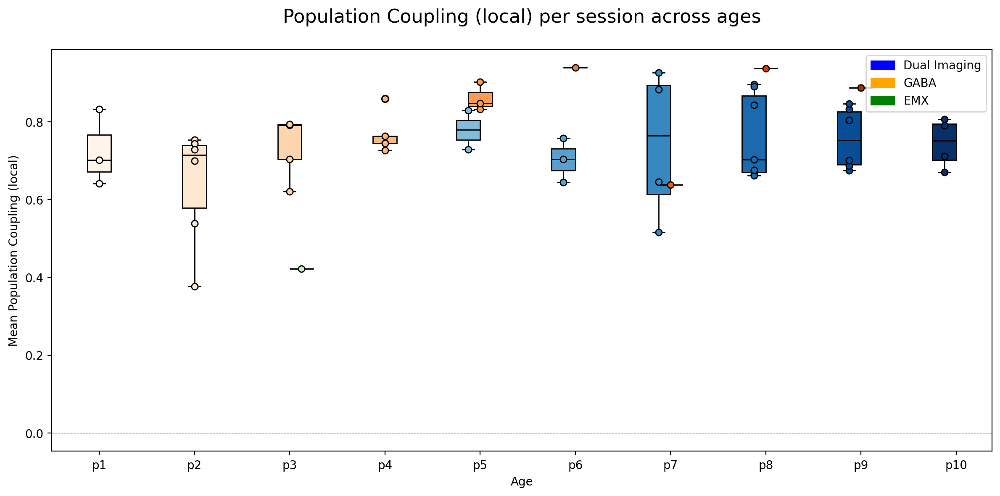

In [33]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib.cm as cm
import re
from matplotlib.patches import Patch

# --- Step 1: Compute mean popcouploc per session ---
combined_df['popcouploc_mean'] = combined_df['popcouploc'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan
)

# --- Step 2: Sort ages properly ---
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

unique_ages = sorted(combined_df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# --- Step 3: Define colors ---
blues = [cm.Blues(i / max(1, num_ages - 1)) for i in range(num_ages)]
oranges = [cm.Oranges(i / max(1, num_ages - 1)) for i in range(num_ages)]
greens = [cm.Greens(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2blue = dict(zip(unique_ages, blues))
age2orange = dict(zip(unique_ages, oranges))
age2green = dict(zip(unique_ages, greens))

# --- Step 4: Plot popcouploc ---
plt.figure(figsize=(12,6), dpi=200)
width = 0.25
offset = width / 2

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['popcouploc_mean']
    if len(dual_data) > 0:
        plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2blue[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                    color=age2blue[age], edgecolor='black', s=30, zorder=3)
    
    # GABA
    gaba_data = age_data[age_data['group'] == 'GABA']['popcouploc_mean']
    if len(gaba_data) > 0:
        plt.boxplot(gaba_data, positions=[i], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2orange[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(gaba_data), i), gaba_data,
                    color=age2orange[age], edgecolor='black', s=30, zorder=3)
    
    # EMX
    emx_data = age_data[age_data['group'] == 'EMX']['popcouploc_mean']
    if len(emx_data) > 0:
        plt.boxplot(emx_data, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2green[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(emx_data), i + offset), emx_data,
                    color=age2green[age], edgecolor='black', s=30, zorder=3)

# --- Labels and title ---
plt.xticks(range(len(unique_ages)), unique_ages)
plt.ylabel('Mean Population Coupling (local)')
plt.xlabel('Age')
plt.title('Population Coupling (local) per session across ages', fontsize=16, y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)

# Legend
legend_handles = [
    Patch(color='blue', label='Dual Imaging'),
    Patch(color='orange', label='GABA'),
    Patch(color='green', label='EMX')
]
plt.legend(handles=legend_handles, loc='upper right', frameon=True)

plt.tight_layout()
plt.show()


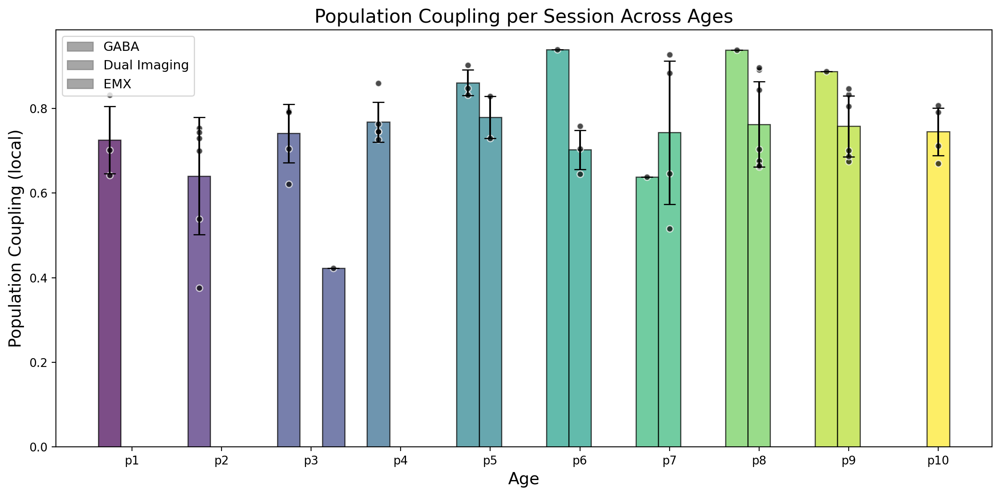

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from matplotlib.patches import Patch
from matplotlib.cm import viridis

# --- Prepare DataFrame ---
df = combined_df.copy()
df = df.dropna(subset=['popcouploc'])

# Convert list/array of popcouploc to mean per session
df['popcouploc_mean'] = df['popcouploc'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan
)

# Extract numeric age for sorting
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

df['age_num'] = df['age'].apply(extract_age_num)
df = df.sort_values('age_num')

# Unique sorted ages
unique_ages = sorted(df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormap per age (Viridis)
age_colors = [viridis(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2color = dict(zip(unique_ages, age_colors))

# Group offsets for side-by-side plotting
width = 0.25
group_offsets = {'GABA': -width, 'Dual Imaging': 0, 'EMX': width}

# --- Boxplot per group per age ---
plt.figure(figsize=(12, 6), dpi=200)

for i, age in enumerate(unique_ages):
    age_data = df[df['age'] == age]
    
    for group, offset in group_offsets.items():
        group_data = age_data[age_data['group'] == group]['popcouploc_mean']
        if len(group_data) == 0:
            continue
        
        mean_val = np.nanmean(group_data)
        std_val = np.nanstd(group_data)
        
        # Draw box as mean ± SD
        plt.bar(i + offset, mean_val, width=width, color=age2color[age], alpha=0.7, edgecolor='black')
        plt.errorbar(i + offset, mean_val, yerr=std_val, color='black', capsize=5, lw=1.5)
        
        # Overlay individual points
        plt.scatter(
            np.full(len(group_data), i + offset),
            group_data,
            color='black',
            s=30,
            alpha=0.7,
            edgecolor='white'
        )

# Axis and styling
plt.xticks(range(len(unique_ages)), unique_ages)
plt.xlabel('Age', fontsize=14)
plt.ylabel('Population Coupling (local)', fontsize=14)
plt.title('Population Coupling per Session Across Ages', fontsize=16)
plt.axhline(0, linestyle='--', color='grey', lw=0.7)

# Legend
legend_handles = [
    Patch(color='grey', label='GABA', alpha=0.7),
    Patch(color='grey', label='Dual Imaging', alpha=0.7),
    Patch(color='grey', label='EMX', alpha=0.7)
]
plt.legend(handles=legend_handles, loc='upper left', frameon=True, fontsize=11)

plt.tight_layout()
plt.show()


# frequency 

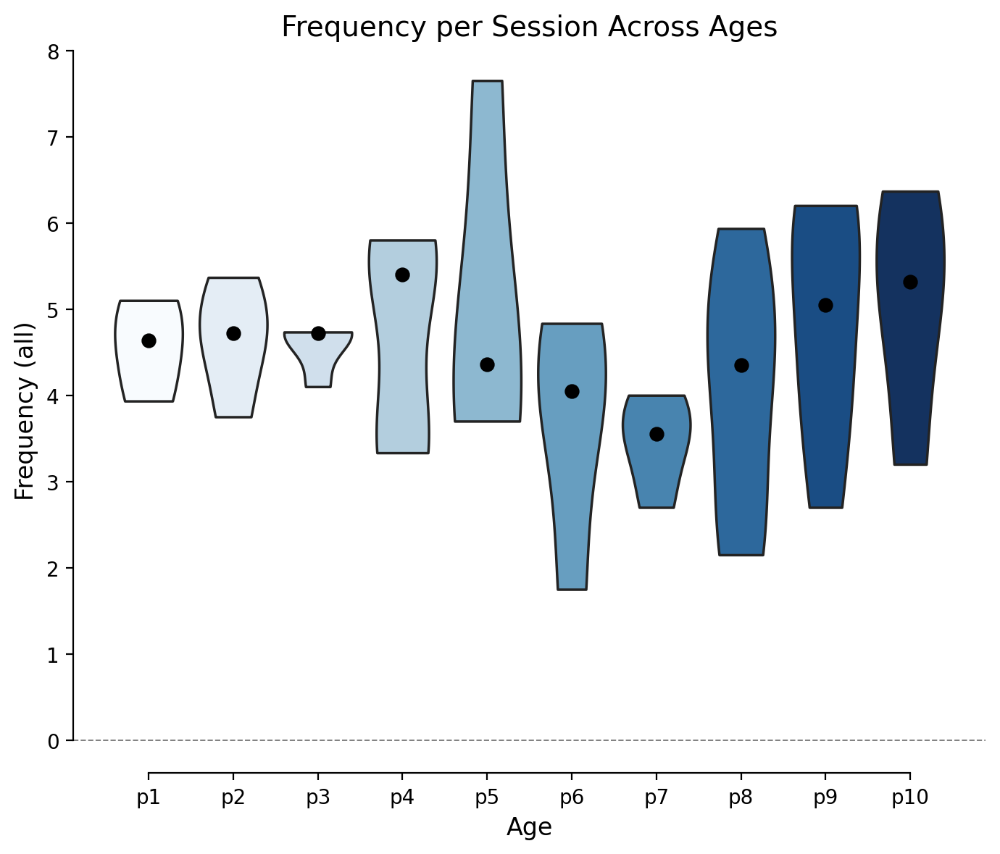

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import re
from matplotlib.cm import Blues

# Prepare DataFrame
df = combined_df.copy()

# Keep only rows with freq_all
df = df.dropna(subset=['freq_all'])

# Ensure freq_all is numeric and compute mean per session
def safe_mean(x):
    if isinstance(x, (list, np.ndarray)):
        return np.nanmean(x)
    return np.nan

df['freq_all_mean'] = df['freq_all']
df['freq_all_mean'] = pd.to_numeric(df['freq_all_mean'], errors='coerce')

# Drop rows where freq_all_mean is NaN
df = df.dropna(subset=['freq_all_mean'])

# Extract numeric age for sorting
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

df['age_num'] = df['age'].apply(extract_age_num)
df = df.sort_values('age_num')

# Sorted unique ages
unique_ages = sorted(df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormap along ages (Blues gradient)
age_colors = [Blues(i / max(1, num_ages-1)) for i in range(num_ages)]
age2color = dict(zip(unique_ages, age_colors))

# Plot
plt.figure(figsize=(7,6), dpi=200)

sns.violinplot(
    x='age',
    y='freq_all_mean',
    data=df,
    inner=None,
    palette=age2color,
    cut=0
)

# Overlay medians safely
for i, age in enumerate(unique_ages):
    age_df = df[df['age'] == age]
    median_val = np.nanmedian(age_df['freq_all_mean'])
    if not np.isnan(median_val):
        plt.scatter(i, median_val, color='black', s=40, zorder=5)

# Labels and style
plt.xticks(range(len(unique_ages)), unique_ages)
plt.ylabel('Frequency (all)', fontsize=12)
plt.xlabel('Age', fontsize=12)
plt.title('Frequency per Session Across Ages', fontsize=14)
plt.axhline(0, linestyle='--', color='grey', lw=0.7)
sns.despine(trim=True)
plt.tight_layout()
plt.show()


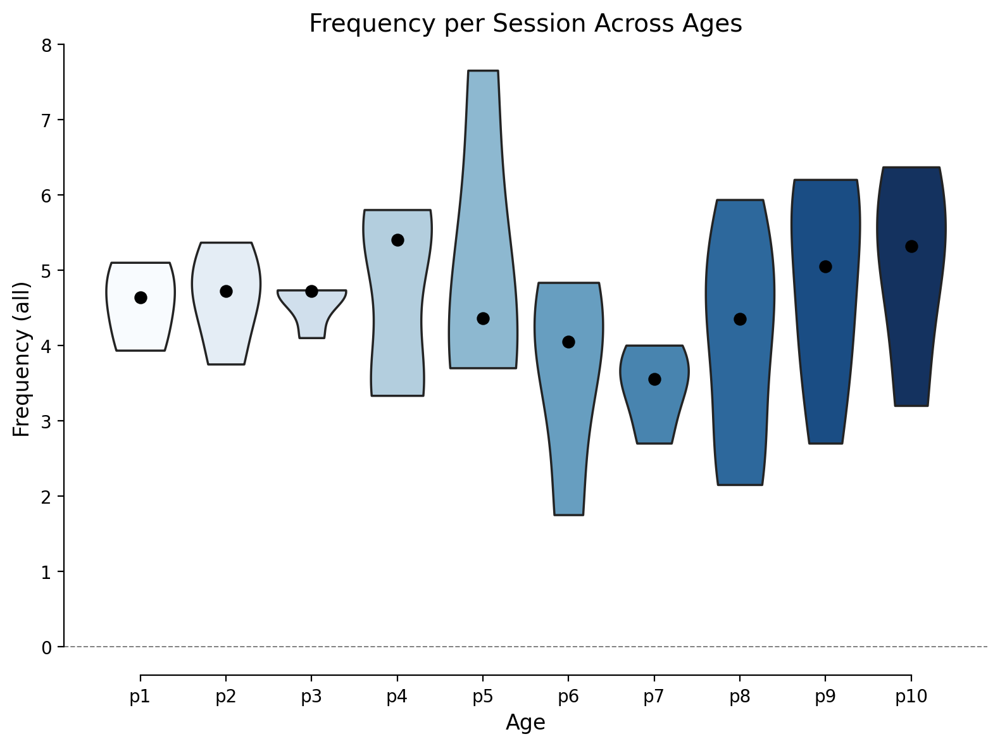

In [283]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import re
from matplotlib.cm import Blues

# Copy the DataFrame
df = combined_df.copy()

# Ensure freq_all is numeric
df['freq_all_mean'] = pd.to_numeric(df['freq_all'], errors='coerce')

# Extract numeric age safely
def extract_age_num(label):
    try:
        return int(re.search(r'\d+', str(label).strip()).group(0))
    except:
        return np.nan

df['age_num'] = df['age'].apply(extract_age_num)

# Determine all ages present or expected (e.g., p1-pN)
all_ages = [f"p{i}" for i in range(1, df['age_num'].max()+1)]

# Sort DataFrame by age number
df = df.sort_values('age_num')

# Create color mapping for all ages
num_ages = len(all_ages)
age_colors = [Blues(i / max(1, num_ages-1)) for i in range(num_ages)]
age2color = dict(zip(all_ages, age_colors))

# Plot
plt.figure(figsize=(8,6), dpi=200)

sns.violinplot(
    x='age',
    y='freq_all_mean',
    data=df,
    order=all_ages,        # ensure all ages appear in order
    inner=None,
    palette=age2color,
    cut=0
)

# Overlay medians
for i, age in enumerate(all_ages):
    age_df = df[df['age'] == age]
    if not age_df.empty:
        median_val = np.nanmedian(age_df['freq_all_mean'])
        if not np.isnan(median_val):
            plt.scatter(i, median_val, color='black', s=40, zorder=5)

# Labels and style
plt.xticks(range(len(all_ages)), all_ages)
plt.ylabel('Frequency (all)', fontsize=12)
plt.xlabel('Age', fontsize=12)
plt.title('Frequency per Session Across Ages', fontsize=14)
plt.axhline(0, linestyle='--', color='grey', lw=0.7)
sns.despine(trim=True)
plt.tight_layout()
plt.show()


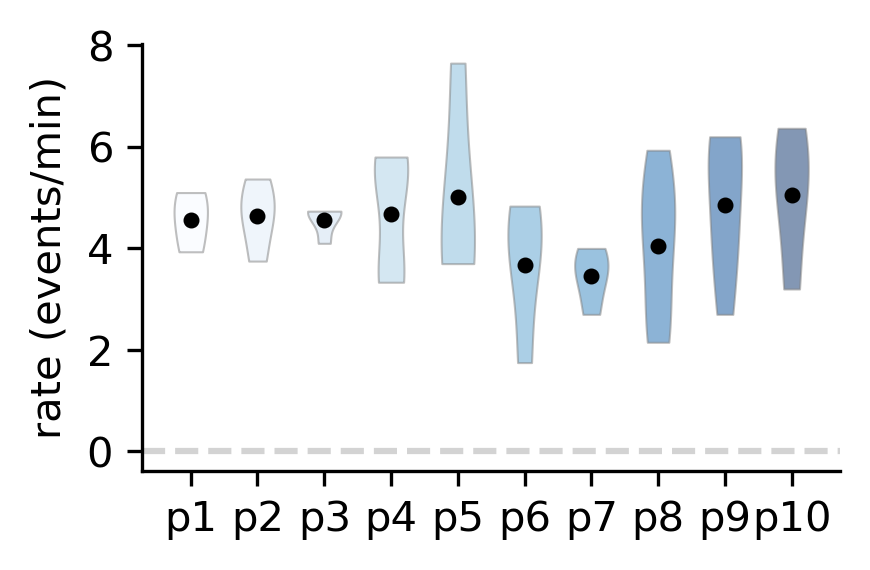

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import re
from matplotlib.cm import Blues

# --- Prepare DataFrame ---
df_freq = combined_df.copy()
df_freq = df_freq.dropna(subset=['freq_all'])

# Handle numeric or list inputs safely
df_freq['freq_all_mean'] = df_freq['freq_all'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else x
)

# Extract numeric age for sorting
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

df_freq['age_num'] = df_freq['age'].apply(extract_age_num)
df_freq = df_freq.sort_values('age_num')

# Unique sorted ages and colors
unique_ages = sorted(df_freq['age'].unique(), key=extract_age_num)
age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare data for plotting ---
def get_plot_data(df, col_name):
    data = []
    for age in unique_ages:
        vals = df[df['age'] == age][col_name].values
        data.append(vals if len(vals) > 0 else np.array([]))
    return data

plot_data_freq = get_plot_data(df_freq, 'freq_all_mean')

# --- Plot ---
fig, ax = plt.subplots(figsize=(3, 2), dpi=300)

parts = ax.violinplot(
    plot_data_freq,
    vert=True,
    showmeans=False,
    showextrema=False,
    showmedians=False,
    widths=0.5
)

# Apply age-dependent colors
for i, pc in enumerate(parts['bodies']):
    pc.set_facecolor(age2color[unique_ages[i]])
    pc.set_edgecolor('grey')
    pc.set_alpha(0.5)
    pc.set_linewidth(0.5)

# Overlay means
for i, vals in enumerate(plot_data_freq):
    if len(vals) > 0:
        mean_val = np.nanmean(vals)
        ax.scatter(i + 1, mean_val, color='black', s=8, zorder=3)

# Style
ax.axhline(0, linestyle='--', color='lightgrey', lw=1.5)
ax.set_ylabel('rate (events/min)')
ax.set_xticks(range(1, len(unique_ages) + 1))
ax.set_xticklabels(unique_ages)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.tight_layout()
plt.show()


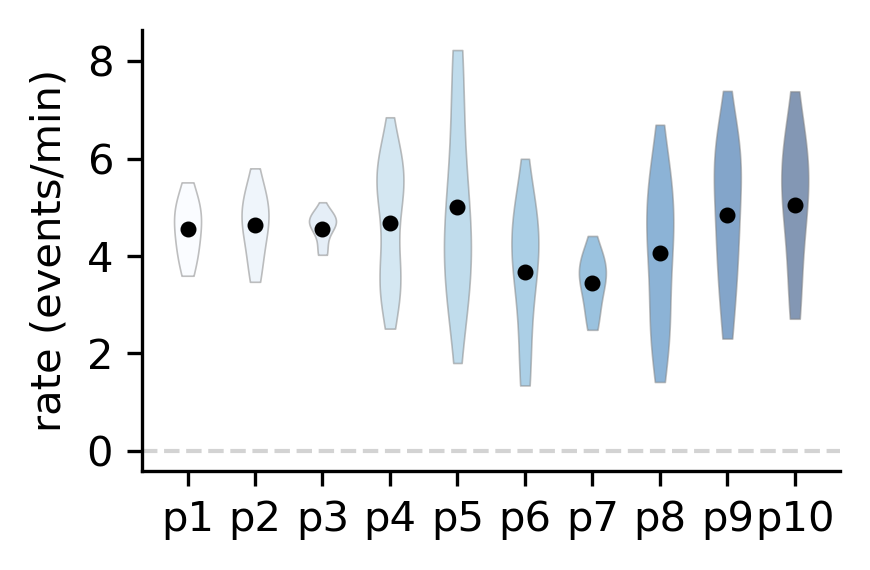

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import re
from matplotlib.cm import Blues

# --- Prepare data (same as before) ---
df_freq = combined_df.dropna(subset=['freq_all'])
df_freq['freq_all_mean'] = df_freq['freq_all'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else x
)

def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

df_freq['age_num'] = df_freq['age'].apply(extract_age_num)
df_freq = df_freq.sort_values('age_num')

unique_ages = sorted(df_freq['age'].unique(), key=extract_age_num)
age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
age2color = dict(zip(unique_ages, age_colors))

# --- Plot ---
fig, ax = plt.subplots(figsize=(3, 2), dpi=300)

for i, age in enumerate(unique_ages):
    vals = df_freq[df_freq['age'] == age]['freq_all_mean'].dropna().values
    if len(vals) < 3:
        continue

    mean_val = np.mean(vals)
    sd = np.std(vals)
    
    # KDE
    kde = gaussian_kde(vals)
    y_grid = np.linspace(mean_val - 2*sd, mean_val + 2*sd, 200)
    density = kde(y_grid)
    density /= density.max()  # normalize
    
    # "Half violin" body scaled
    width = 0.4 * density
    ax.fill_betweenx(
        y_grid,
        i + 1 - width / 2,
        i + 1 + width / 2,
        facecolor=age2color[age],
        alpha=0.5,
        edgecolor='grey',
        linewidth=0.4,
    )
    
    # Mean line
    ax.scatter(i + 1, mean_val, color='black', s=8, zorder=3)

ax.axhline(0, linestyle='--', color='lightgrey', lw=1)
ax.set_ylabel('rate (events/min)')
ax.set_xticks(range(1, len(unique_ages) + 1))
ax.set_xticklabels(unique_ages)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.tight_layout()
plt.show()


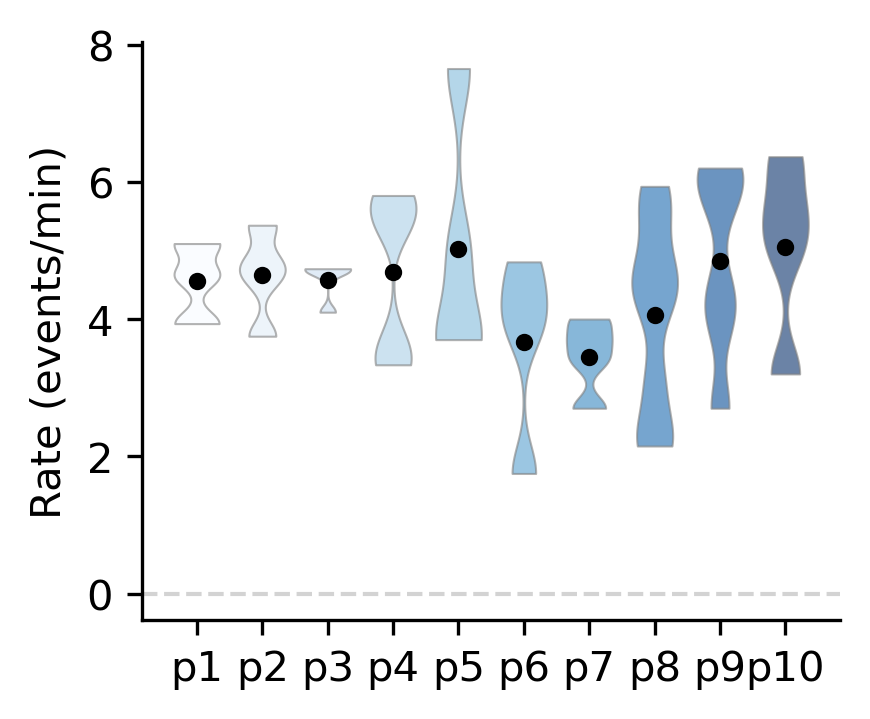

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import re
from matplotlib.cm import Blues

# --- Prepare DataFrame ---
df_freq = combined_df.copy()
df_freq = df_freq.dropna(subset=['freq_all'])

# Handle numeric or list inputs safely
df_freq['freq_all_mean'] = df_freq['freq_all'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else x
)

# Extract numeric age for sorting
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

df_freq['age_num'] = df_freq['age'].apply(extract_age_num)
df_freq = df_freq.sort_values('age_num')

# Unique sorted ages and colors
unique_ages = sorted(df_freq['age'].unique(), key=extract_age_num)
age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare data for plotting ---
def get_plot_data(df, col_name):
    data = []
    for age in unique_ages:
        vals = df[df['age'] == age][col_name].values
        data.append(vals if len(vals) > 0 else np.array([]))
    return data

plot_data_freq = get_plot_data(df_freq, 'freq_all_mean')

# --- Plot ---
fig, ax = plt.subplots(figsize=(3, 2.5), dpi=300)

parts = ax.violinplot(
    plot_data_freq,
    vert=True,
    showmeans=False,
    showextrema=False,
    showmedians=False,
    widths=0.7,          # Slightly wider violins
    bw_method=0.3,       # Smooth them (0.2–0.4 range looks good)
    points=200           # More sampling points -> smoother edges
)

# Apply age-dependent colors
for i, pc in enumerate(parts['bodies']):
    pc.set_facecolor(age2color[unique_ages[i]])
    pc.set_edgecolor('grey')
    pc.set_alpha(0.6)
    pc.set_linewidth(0.5)

# Overlay means
for i, vals in enumerate(plot_data_freq):
    if len(vals) > 0:
        mean_val = np.nanmean(vals)
        ax.scatter(i + 1, mean_val, color='black', s=10, zorder=3)

# Style
ax.axhline(0, linestyle='--', color='lightgrey', lw=1)
ax.set_ylabel('Rate (events/min)')
ax.set_xticks(range(1, len(unique_ages) + 1))
ax.set_xticklabels(unique_ages)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.tight_layout()
plt.show()


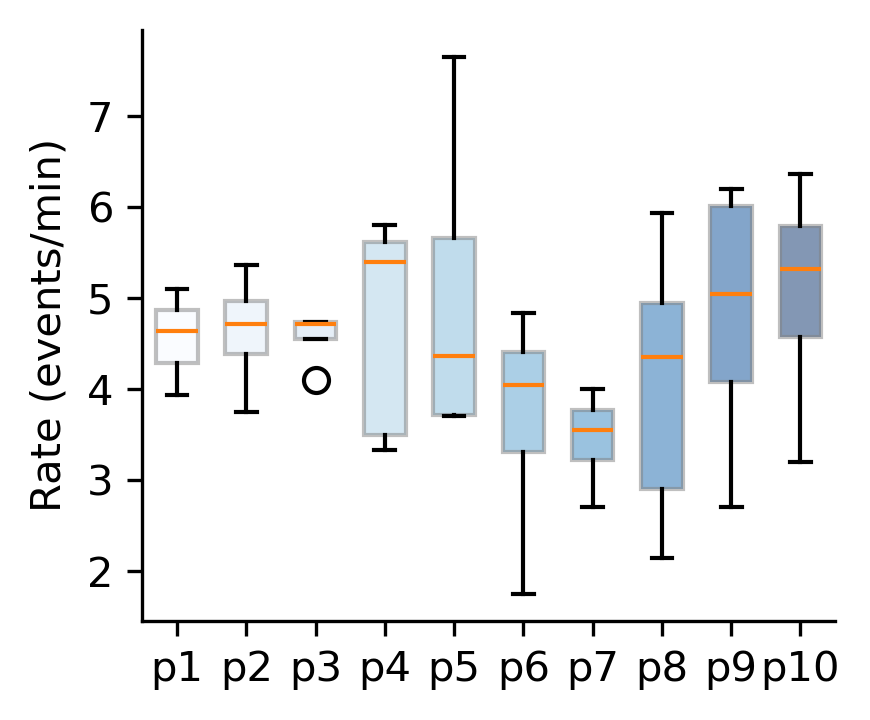

In [48]:
fig, ax = plt.subplots(figsize=(3, 2.5), dpi=300)

bplot = ax.boxplot(
    plot_data_freq,
    patch_artist=True,
    widths=0.6
)

# Apply age colors
for i, patch in enumerate(bplot['boxes']):
    patch.set_facecolor(age2color[unique_ages[i]])
    patch.set_alpha(0.5)
    patch.set_edgecolor('grey')

ax.set_ylabel('Rate (events/min)')
ax.set_xticks(range(1, len(unique_ages) + 1))
ax.set_xticklabels(unique_ages)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


# pop coup 

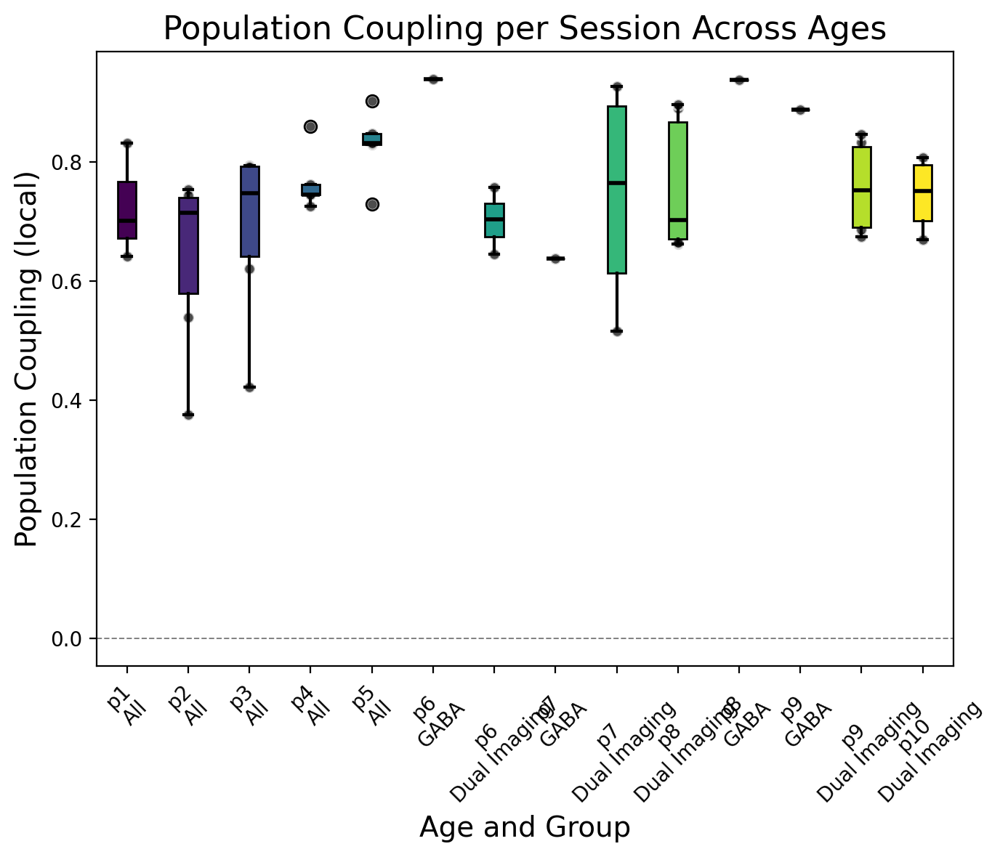

In [49]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from matplotlib.cm import viridis

# --- Prepare DataFrame ---
df = combined_df.copy()
df = df.dropna(subset=['popcouploc'])

# Convert list/array of popcouploc to mean per session
df['popcouploc_mean'] = df['popcouploc'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan
)

# Extract numeric age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

df['age_num'] = df['age'].apply(extract_age_num)
df = df.sort_values('age_num')

# Unique sorted ages
unique_ages = sorted(df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormap for age progression
age_colors = [viridis(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare plotting data ---
plot_data = []

for age in unique_ages:
    age_num = extract_age_num(age)
    age_df = df[df['age'] == age]
    
    if age_num <= 5:
        # Merge all groups for early ages
        pop_vals = age_df['popcouploc_mean'].values
        plot_data.append({'age': age, 'group': 'All', 'values': pop_vals})
    else:
        # Keep separate for later ages if multiple groups
        for group in age_df['group'].unique():
            pop_vals = age_df[age_df['group'] == group]['popcouploc_mean'].values
            plot_data.append({'age': age, 'group': group, 'values': pop_vals})

# --- Plot boxplots ---
plt.figure(figsize=(7, 6), dpi=200)
positions = []
labels = []
colors = []

pos = 0
for entry in plot_data:
    vals = entry['values']
    if len(vals) == 0:
        continue
    
    mean_val = np.mean(vals)
    sd_val = np.std(vals)
    
    # Draw box as mean ± SD
    plt.boxplot(
        vals,
        positions=[pos],
        widths=0.3,
        patch_artist=True,
        boxprops=dict(facecolor=age2color[entry['age']], color='black'),
        whiskerprops=dict(color='black', linewidth=1.5),
        capprops=dict(color='black', linewidth=1.5),
        medianprops=dict(color='black', linewidth=2)
    )
    
    # Overlay individual points
    plt.scatter(
        np.full(len(vals), pos),
        vals,
        color='black',
        s=30,
        alpha=0.7,
        edgecolor='white'
    )
    
    positions.append(pos)
    labels.append(f"{entry['age']}\n{entry['group']}")
    pos += 1

plt.xticks(positions, labels, rotation=45)
plt.ylabel('Population Coupling (local)', fontsize=14)
plt.xlabel('Age and Group', fontsize=14)
plt.title('Population Coupling per Session Across Ages', fontsize=16)
plt.axhline(0, linestyle='--', color='grey', lw=0.7)
plt.tight_layout()
plt.show()


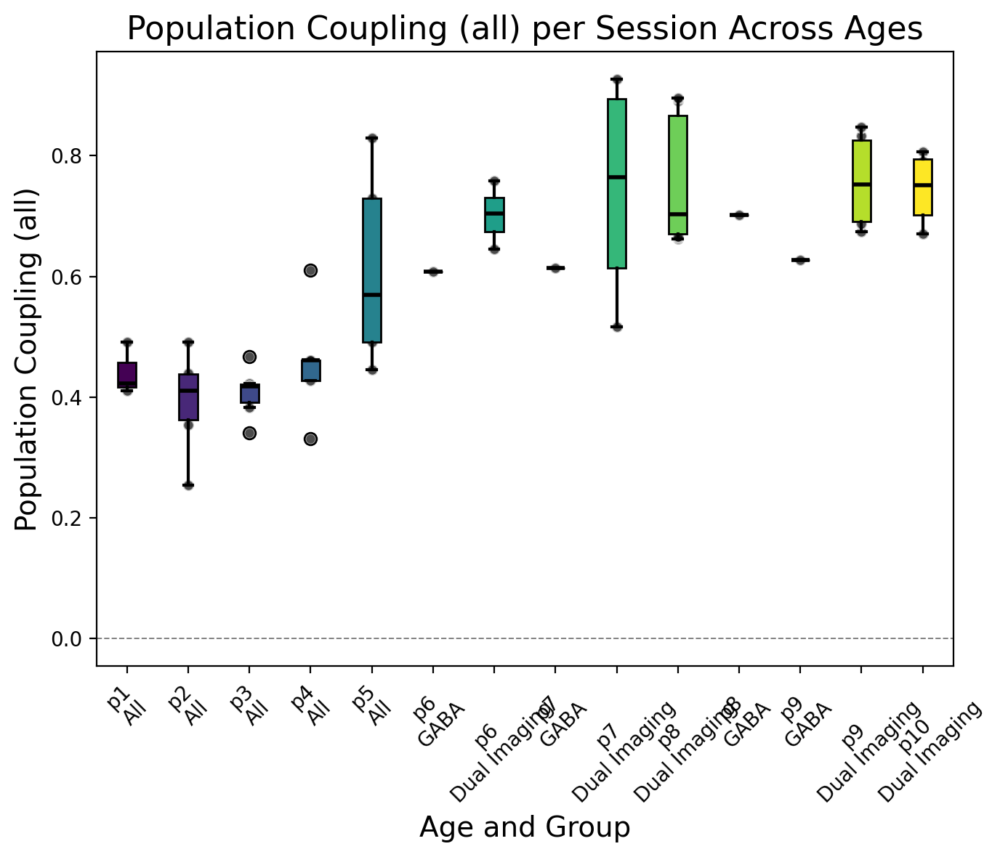

In [50]:
from matplotlib.cm import viridis

# --- Prepare DataFrame ---
df = combined_df.copy()
df = df.dropna(subset=['popcoup_all'])

# Convert list/array of popcoup_all to mean per session
df['popcoup_all_mean'] = df['popcoup_all'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan
)

# Extract numeric age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

df['age_num'] = df['age'].apply(extract_age_num)
df = df.sort_values('age_num')

# Unique sorted ages
unique_ages = sorted(df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormap for age progression
age_colors = [viridis(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare plotting data ---
plot_data = []

for age in unique_ages:
    age_num = extract_age_num(age)
    age_df = df[df['age'] == age]
    
    if age_num <= 5:
        # Merge all groups for early ages
        pop_vals = age_df['popcoup_all_mean'].values
        plot_data.append({'age': age, 'group': 'All', 'values': pop_vals})
    else:
        # Keep separate for later ages if multiple groups
        for group in age_df['group'].unique():
            pop_vals = age_df[age_df['group'] == group]['popcoup_all_mean'].values
            plot_data.append({'age': age, 'group': group, 'values': pop_vals})

# --- Plot boxplots ---
plt.figure(figsize=(7, 6), dpi=200)
positions = []
labels = []
colors = []

pos = 0
for entry in plot_data:
    vals = entry['values']
    if len(vals) == 0:
        continue
    
    mean_val = np.mean(vals)
    sd_val = np.std(vals)
    
    # Draw box as mean ± SD
    plt.boxplot(
        vals,
        positions=[pos],
        widths=0.3,
        patch_artist=True,
        boxprops=dict(facecolor=age2color[entry['age']], color='black'),
        whiskerprops=dict(color='black', linewidth=1.5),
        capprops=dict(color='black', linewidth=1.5),
        medianprops=dict(color='black', linewidth=2)
    )
    
    # Overlay individual points
    plt.scatter(
        np.full(len(vals), pos),
        vals,
        color='black',
        s=30,
        alpha=0.7,
        edgecolor='white'
    )
    
    positions.append(pos)
    labels.append(f"{entry['age']}\n{entry['group']}")
    pos += 1

plt.xticks(positions, labels, rotation=45)
plt.ylabel('Population Coupling (all)', fontsize=14)
plt.xlabel('Age and Group', fontsize=14)
plt.title('Population Coupling (all) per Session Across Ages', fontsize=16)
plt.axhline(0, linestyle='--', color='grey', lw=0.7)
plt.tight_layout()
plt.show()


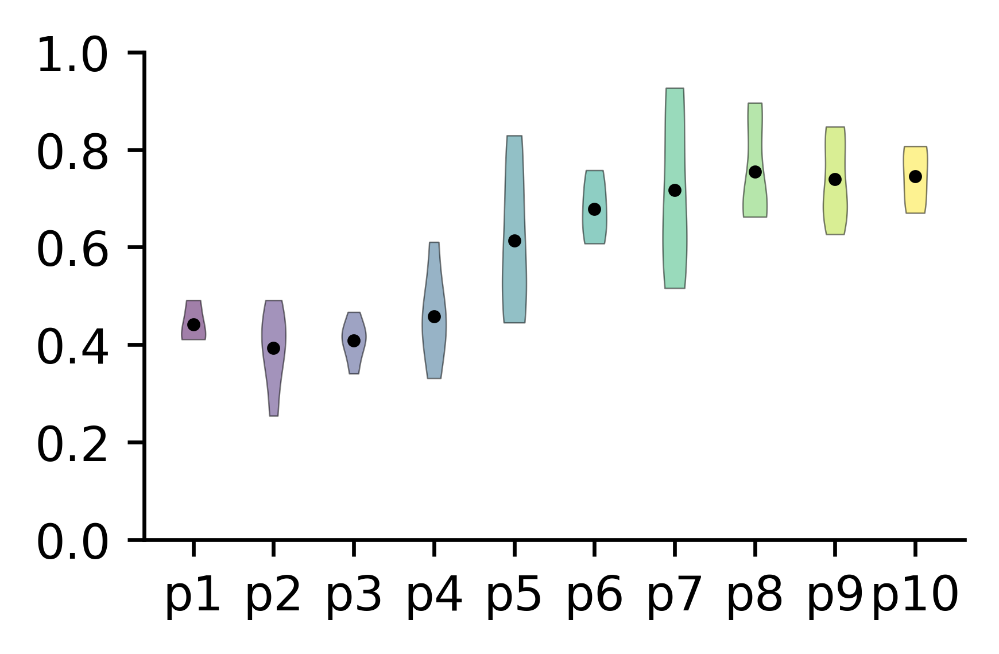

In [51]:
# --- Prepare DataFrame ---
df = combined_df.copy()
df = df.dropna(subset=['popcoup_all'])

# Convert list/array of popcoup_all to mean per session
df['popcoup_all_mean'] = df['popcoup_all'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan
)

# Extract numeric age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

df['age_num'] = df['age'].apply(extract_age_num)
df = df.sort_values('age_num')

# Unique sorted ages
unique_ages = sorted(df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormap for age progression
age_colors = [viridis(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare data for plotting ---
plot_data = []
plot_labels = []

for age in unique_ages:
    age_df = df[df['age'] == age]
    pop_vals = age_df['popcoup_all_mean'].values
    if len(pop_vals) > 0:
        plot_data.append(pop_vals)
        plot_labels.append(age)

# --- Plot violin plots ---
plt.figure(figsize=(3, 2), dpi=600)

parts = plt.violinplot(
    plot_data,
    showmeans=False,
    showextrema=False,  # remove vertical lines
    showmedians=False,  # no median line
    widths=0.3
)

# Apply custom colors and transparency
for i, pc in enumerate(parts['bodies']):
    pc.set_facecolor(age2color[unique_ages[i]])
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)
    pc.set_linewidth(0.3)

# Add a point for the mean
for i, vals in enumerate(plot_data):
    mean_val = np.nanmean(vals)
    plt.scatter(i + 1, mean_val, color='black', s=3, zorder=3)

# Axis cleanup
plt.xticks(range(1, len(plot_labels) + 1), plot_labels)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.ylim(0, 1)

# Remove top and right spines
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.tight_layout()
plt.show()

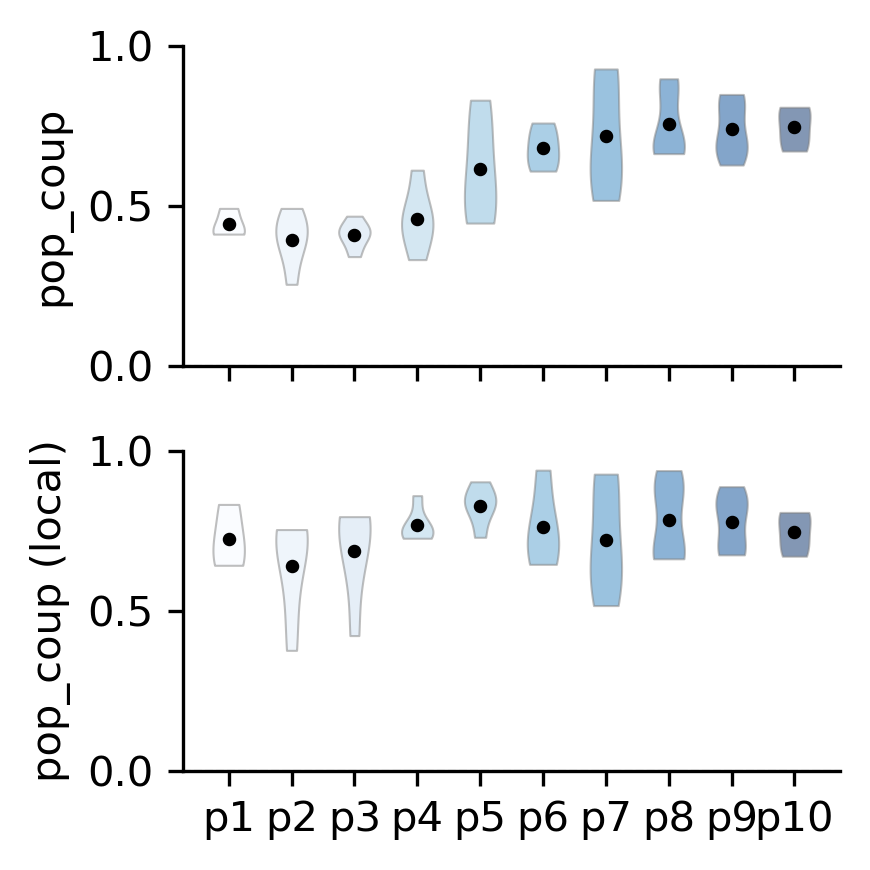

In [54]:
import numpy as np
import matplotlib.pyplot as plt
import re
from matplotlib.cm import Blues

# --- Prepare DataFrame ---
df_all = combined_df.copy()
df_all = df_all.dropna(subset=['popcoup_all'])
df_all['popcoup_all_mean'] = df_all['popcoup_all'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan
)

df_loc = combined_df.copy()
df_loc = df_loc.dropna(subset=['popcouploc'])
df_loc['popcouploc_mean'] = df_loc['popcouploc'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan
)

# Extract numeric age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

df_all['age_num'] = df_all['age'].apply(extract_age_num)
df_all = df_all.sort_values('age_num')
df_loc['age_num'] = df_loc['age'].apply(extract_age_num)
df_loc = df_loc.sort_values('age_num')

# Unique sorted ages and colors
unique_ages = sorted(df_all['age'].unique(), key=extract_age_num)
age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare data for plotting ---
def get_plot_data(df, col_name):
    data = []
    for age in unique_ages:
        vals = df[df['age'] == age][col_name].values
        data.append(vals if len(vals) > 0 else np.array([]))
    return data

plot_data_all = get_plot_data(df_all, 'popcoup_all_mean')
plot_data_loc = get_plot_data(df_loc, 'popcouploc_mean')

# --- Plot subplots ---
fig, axes = plt.subplots(2, 1, figsize=(3, 3), dpi=300, sharex=True)

for ax, plot_data, title in zip(
    axes, [plot_data_all, plot_data_loc], ['pop_coup', 'pop_coup (local)']
):
    parts = ax.violinplot(
        plot_data,
        vert=True,
        showmeans=False,
        showextrema=False,
        showmedians=False,
        widths=0.5
    )

    # Apply face color and grey edges
    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(age2color[unique_ages[i]])
        pc.set_edgecolor('grey')
        pc.set_alpha(0.5)
        pc.set_linewidth(0.5)

    # Add mean points
    for i, vals in enumerate(plot_data):
        if len(vals) > 0:
            mean_val = np.nanmean(vals)
            ax.scatter(i + 1, mean_val, color='black', s=5, zorder=3)

    # Minimal axes
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.set_ylabel(title)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

axes[-1].set_xticks(range(1, len(unique_ages) + 1))
axes[-1].set_xticklabels(unique_ages)
axes[0].set_ylim(0,1)
axes[1].set_ylim(0,1)


plt.tight_layout()
plt.ylim(0,1)
plt.show()


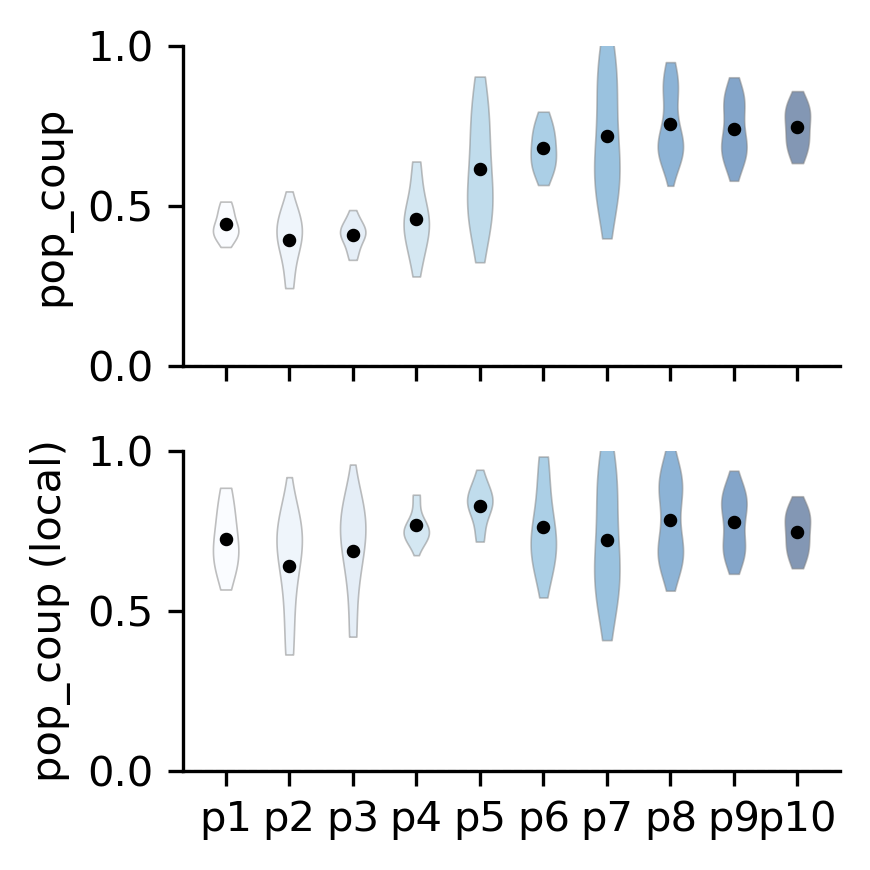

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import re
from matplotlib.cm import Blues

# --- Prepare DataFrame ---
df_all = combined_df.copy()
df_all = df_all.dropna(subset=['popcoup_all'])
df_all['popcoup_all_mean'] = df_all['popcoup_all'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan
)

df_loc = combined_df.copy()
df_loc = df_loc.dropna(subset=['popcouploc'])
df_loc['popcouploc_mean'] = df_loc['popcouploc'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan
)

# Extract numeric age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

df_all['age_num'] = df_all['age'].apply(extract_age_num)
df_all = df_all.sort_values('age_num')
df_loc['age_num'] = df_loc['age'].apply(extract_age_num)
df_loc = df_loc.sort_values('age_num')

# Unique sorted ages and colors
unique_ages = sorted(df_all['age'].unique(), key=extract_age_num)
age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare data for plotting ---
def get_plot_data(df, col_name):
    data = []
    for age in unique_ages:
        vals = df[df['age'] == age][col_name].dropna().values
        data.append(vals if len(vals) > 0 else np.array([]))
    return data

plot_data_all = get_plot_data(df_all, 'popcoup_all_mean')
plot_data_loc = get_plot_data(df_loc, 'popcouploc_mean')

# --- KDE-based violins ---
fig, axes = plt.subplots(2, 1, figsize=(3, 3), dpi=300, sharex=True)

for ax, plot_data, title in zip(
    axes, [plot_data_all, plot_data_loc], ['pop_coup', 'pop_coup (local)']
):
    for i, vals in enumerate(plot_data):
        if len(vals) < 2:
            continue
        mean_val = np.mean(vals)
        sd = np.std(vals)
        
        # KDE
        kde = gaussian_kde(vals)
        y_grid = np.linspace(max(0, mean_val - 2*sd), mean_val + 2*sd, 200)
        density = kde(y_grid)
        density /= density.max()
        
        width = 0.4 * density  # scale width
        ax.fill_betweenx(
            y_grid,
            i + 1 - width / 2,
            i + 1 + width / 2,
            facecolor=age2color[unique_ages[i]],
            alpha=0.5,
            edgecolor='grey',
            linewidth=0.4
        )
        
        # Mean point
        ax.scatter(i + 1, mean_val, color='black', s=5, zorder=3)
    
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.set_ylabel(title)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

axes[-1].set_xticks(range(1, len(unique_ages) + 1))
axes[-1].set_xticklabels(unique_ages)
axes[0].set_ylim(0, 1)
axes[1].set_ylim(0, 1)

plt.tight_layout()
plt.show()


In [58]:
# Make sure combined_df has the same number of rows as all_data
f1_class1_list = []

for i, session in enumerate(all_data):
    if 'f1_class1' in session:
        f1_class1_list.append(session['f1_class1'])
    else:
        f1_class1_list.append(np.nan)  # Fill missing with NaN

# Add to combined_df
combined_df['f1_class1'] = f1_class1_list

# Quick check
print(combined_df[['f1_class1']].head())

    f1_class1
0    0.920502
1    0.831001
2    0.133333
52   0.803101
7    0.575904


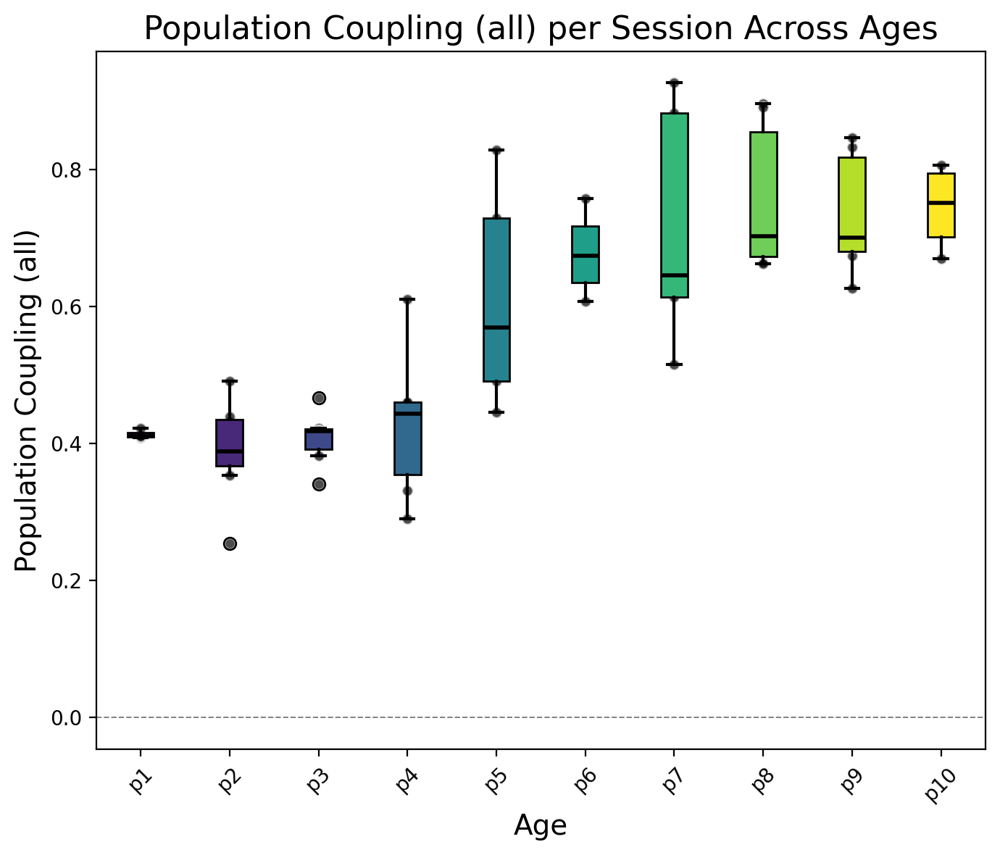

In [86]:
# --- Prepare DataFrame ---
df = combined_df.copy()
df = df.dropna(subset=['popcoup_all'])

# Convert list/array of popcoup_all to mean per session
df['popcoup_all_mean'] = df['popcoup_all'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan
)

# Extract numeric age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

df['age_num'] = df['age'].apply(extract_age_num)
df = df.sort_values('age_num')

# Unique sorted ages
unique_ages = sorted(df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormap for age progression
age_colors = [viridis(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare plotting data ---
plot_data = []
for age in unique_ages:
    age_df = df[df['age'] == age]
    pop_vals = age_df['popcoup_all_mean'].values
    if len(pop_vals) > 0:
        plot_data.append({'age': age, 'values': pop_vals})

# --- Plot boxplots ---
plt.figure(figsize=(7, 6), dpi=200)
positions = []
labels = []

pos = 0
for entry in plot_data:
    vals = entry['values']
    if len(vals) == 0:
        continue

    plt.boxplot(
        vals,
        positions=[pos],
        widths=0.3,
        patch_artist=True,
        boxprops=dict(facecolor=age2color[entry['age']], color='black'),
        whiskerprops=dict(color='black', linewidth=1.5),
        capprops=dict(color='black', linewidth=1.5),
        medianprops=dict(color='black', linewidth=2)
    )

    # Overlay individual points
    plt.scatter(
        np.full(len(vals), pos),
        vals,
        color='black',
        s=30,
        alpha=0.7,
        edgecolor='white'
    )

    positions.append(pos)
    labels.append(entry['age'])
    pos += 1

plt.xticks(positions, labels, rotation=45)
plt.ylabel('Population Coupling (all)', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Population Coupling (all) per Session Across Ages', fontsize=16)
plt.axhline(0, linestyle='--', color='grey', lw=0.7)
plt.tight_layout()
plt.show()

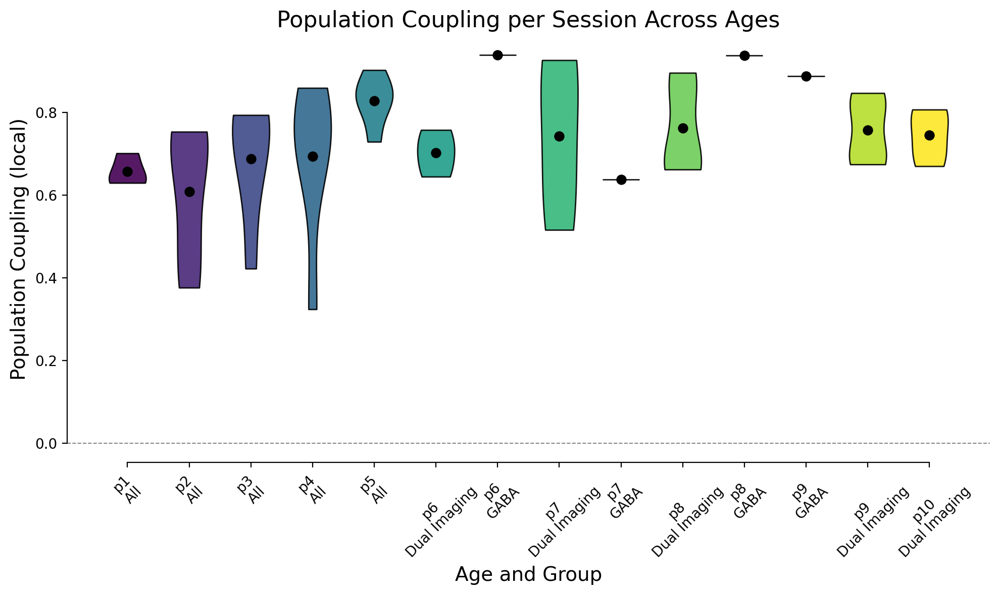

In [87]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from matplotlib.cm import viridis

# --- Prepare DataFrame ---
df = combined_df.copy()
df = df.dropna(subset=['popcouploc'])

# Convert list/array of popcouploc to mean per session
df['popcouploc_mean'] = df['popcouploc'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan
)

# Extract numeric age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

df['age_num'] = df['age'].apply(extract_age_num)
df = df.sort_values('age_num')

# Unique sorted ages
unique_ages = sorted(df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormap for age progression
age_colors = [viridis(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare plotting data ---
plot_data = []
for age in unique_ages:
    age_num = extract_age_num(age)
    age_df = df[df['age'] == age]
    
    if age_num <= 5:
        # Merge early ages
        pop_vals = age_df['popcouploc_mean'].values
        plot_data.append({'age': age, 'group': 'All', 'values': pop_vals})
    else:
        # Keep separate for later ages if multiple groups
        for group in age_df['group'].unique():
            pop_vals = age_df[age_df['group'] == group]['popcouploc_mean'].values
            plot_data.append({'age': age, 'group': group, 'values': pop_vals})

# --- Plot violin plots with mean overlay ---
plt.figure(figsize=(10, 6), dpi=200)
positions = []
labels = []

pos = 0
for entry in plot_data:
    vals = entry['values']
    if len(vals) == 0:
        continue
    
    # Draw full violin (no cut)
    violin = plt.violinplot(
        vals,
        positions=[pos],
        widths=0.6,
        showmeans=False,
        showmedians=False,
        showextrema=False
    )
    
    # Fill violin with Viridis color
    for pc in violin['bodies']:
        pc.set_facecolor(age2color[entry['age']])
        pc.set_edgecolor('black')
        pc.set_alpha(0.9)
    
    # Overlay mean (instead of median)
    mean_val = np.mean(vals)
    plt.scatter(pos, mean_val, color='black', s=40, zorder=5)
    
    positions.append(pos)
    labels.append(f"{entry['age']}\n{entry['group']}")
    pos += 1

plt.xticks(positions, labels, rotation=45)
plt.ylabel('Population Coupling (local)', fontsize=14)
plt.xlabel('Age and Group', fontsize=14)
plt.title('Population Coupling per Session Across Ages', fontsize=16)
plt.axhline(0, linestyle='--', color='grey', lw=0.7)
sns.despine(trim=True)
plt.tight_layout()
plt.show()


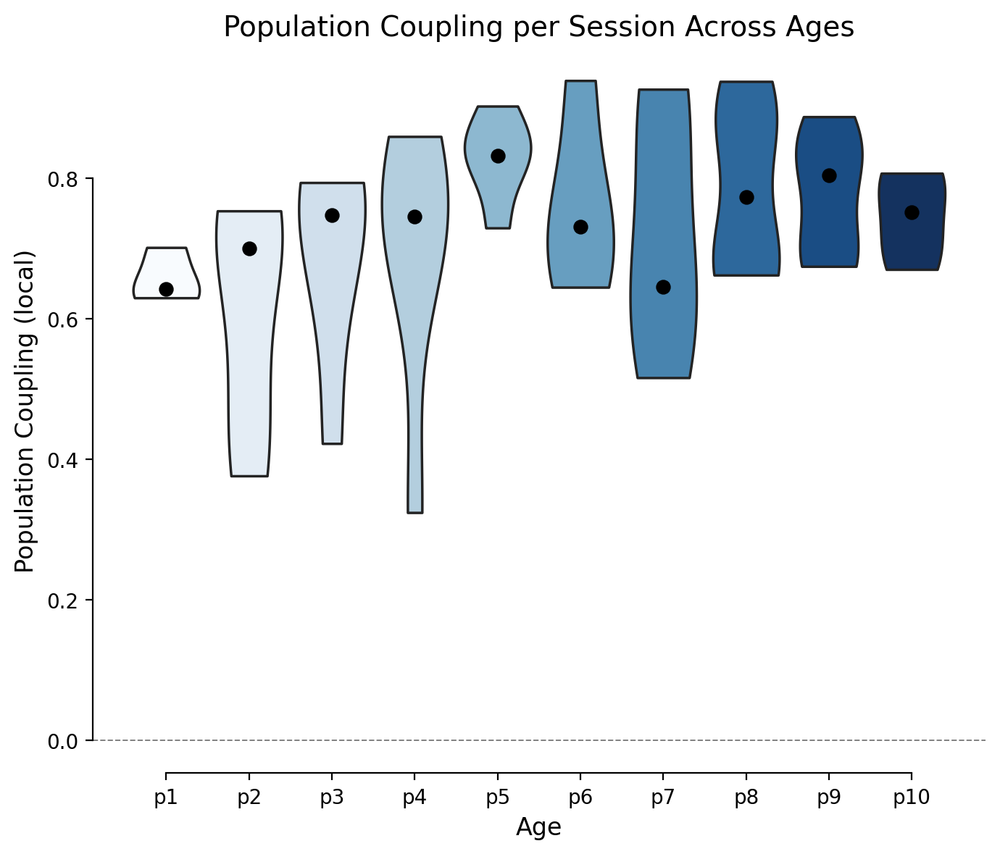

In [88]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import re
from matplotlib.cm import Blues

# Prepare DataFrame
df = combined_df.copy()
df = df.dropna(subset=['popcouploc'])

# Compute mean popcouploc per session
df['popcouploc_mean'] = df['popcouploc'].apply(
    lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan
)

# Extract numeric age for sorting
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

df['age_num'] = df['age'].apply(extract_age_num)
df = df.sort_values('age_num')

# Sorted unique ages
unique_ages = sorted(df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormap along ages (Blues gradient)
age_colors = [Blues(i / max(1, num_ages-1)) for i in range(num_ages)]
age2color = dict(zip(unique_ages, age_colors))

# Plot
plt.figure(figsize=(7,6), dpi=200)

sns.violinplot(
    x='age',
    y='popcouploc_mean',
    data=df,
    inner=None,
    palette=age2color,
    cut=0
)

# Overlay medians
for i, age in enumerate(unique_ages):
    age_df = df[df['age'] == age]
    median_val = np.median(age_df['popcouploc_mean'])
    plt.scatter(i, median_val, color='black', s=40, zorder=5)

# Labels and style
plt.xticks(range(len(unique_ages)), unique_ages)
plt.ylabel('Population Coupling (local)', fontsize=12)
plt.xlabel('Age', fontsize=12)
plt.title('Population Coupling per Session Across Ages', fontsize=14)
plt.axhline(0, linestyle='--', color='grey', lw=0.7)
sns.despine(trim=True)
plt.tight_layout()
plt.show()


In [89]:
combined_df['popcouploc'].apply(type).value_counts()


popcouploc
<class 'numpy.ndarray'>    55
Name: count, dtype: int64

In [90]:
combined_df['session']

0     sz091_2024_06_05_b
1     sz105_2025_05_29_a
2     sz106_2025_05_29_a
52    sz095_2025_01_09_b
7     sz105_2025_05_30_a
6     sz106_2025_05_30_a
8     sz107_2025_05_30_b
4     sz092_2024_06_06_a
3     sz089_2024_06_04_a
5     sz108_2025_05_30_a
53    sz101_2025_04_12_a
9     sz092_2024_06_07_a
10    sz106_2025_05_31_a
11    sz107_2025_05_31_a
12    sz106_2025_05_31_a
13    sz108_2025_05_31_a
18    sz108_2025_06_01_a
54    sz101_2025_04_13_b
16    sz106_2025_06_01_a
14    sz110_2025_06_01_a
17    sz106_2025_06_01_a
15    sz089_2024_06_06_a
26    sz067_2023-10-09_c
27    sz085_2024-04-20_a
19    sz110_2025_06_02_a
21    sz108_2025_06_02_a
20    sz090_2024_06_07_a
22    sz110_2025_06_03_a
28    sz079_2024-02-19_a
29    sz085_2024-04-21_a
30    sz086_2024-04-28_a
31      sz078_2023-02-19
32    sz079_2024-02-20_a
33    sz085_2024-04-22_a
34    jm046/2024-09-02_a
23    sz110_2025_06_04_a
24    sz110_2025_06_05_a
41    jm044/2024-08-27_a
40    jm043/2024-08-27_a
39    jm042/2024-08-27_a


In [296]:
import matplotlib.colors as mcolors

# Example: custom blue-white-red cmap
age2blue = mcolors.LinearSegmentedColormap.from_list("age2blue", ["blue", "white", "red"])

age2blue = {age: cm.Blues((i+1)/ (len(unique_ages)+1)) for i, age in enumerate(unique_ages)}
age2orange = {age: cm.Oranges((i+1)/ (len(unique_ages)+1)) for i, age in enumerate(unique_ages)}

NameError: name 'max_gaba_age' is not defined

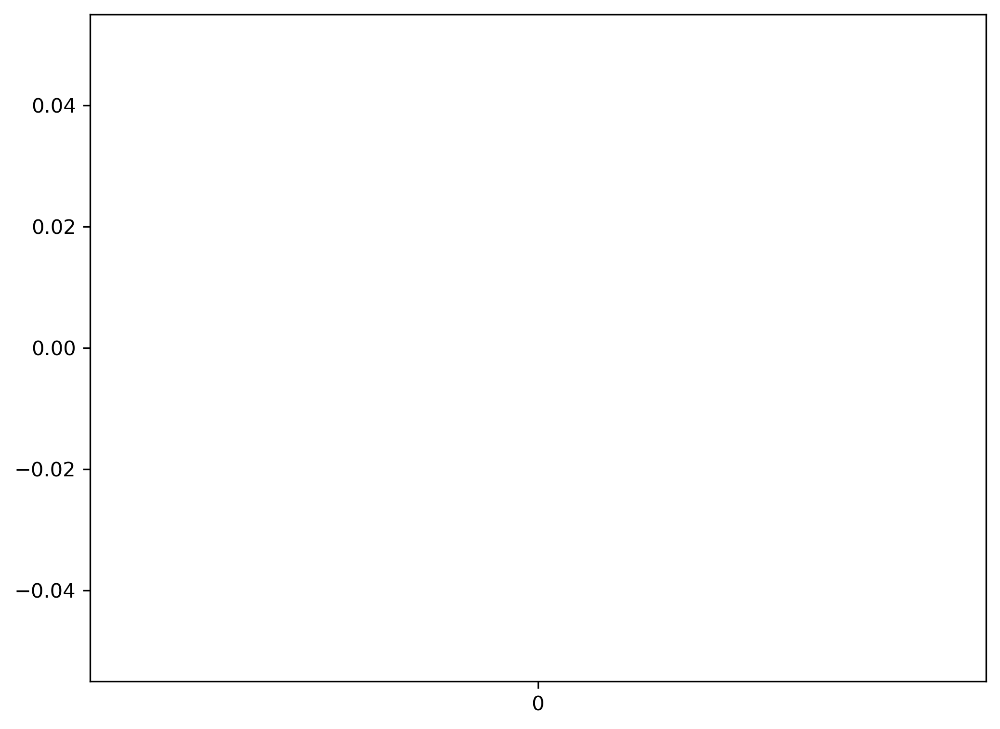

In [297]:

# --- Linear Decoder R² (up to P5 for GABA) ---
plt.figure(figsize=(8, 6), dpi=300)
width = 0.35
offset = 0

for i, age in enumerate(unique_ages):
    age_num = int(re.search(r'\d+', age).group(0))
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (all ages)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2blue[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=age2blue[age], edgecolor='black', s=60, zorder=3)
    
    # GABA (only ages <= P5)
    if age_num <= max_gaba_age:
        gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
        plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2orange[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                    color=age2orange[age], edgecolor='black', s=60, zorder=3)
    
    # EMX (all ages)
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    plt.scatter(np.full(len(emx_data), i), emx_data,  # centered at i
                color=green_color, edgecolor='black', s=60, zorder=3, label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages, rotation=45, fontsize=11)
plt.ylabel('Mean R²', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Linear decoder mean R² per age', fontsize=16, y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.legend()
plt.tight_layout()
plt.show()


# --- Logistic Decoder F1 Score (up to P5 for GABA) ---
plt.figure(figsize=(8, 6), dpi=200)

for i, age in enumerate(unique_ages):
    age_num = int(re.search(r'\d+', age).group(0))
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (all ages)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_score_logistic']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2blue[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=age2blue[age], edgecolor='black', s=60, zorder=3)
    
    # GABA (only ages <= P5)
    if age_num <= max_gaba_age:
        gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
        plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2orange[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                    color=age2orange[age], edgecolor='black', s=60, zorder=3)
    
    # EMX (all ages)
    emx_data = age_data[age_data['group'] == 'EMX']['f1_score_logistic']
    plt.scatter(np.full(len(emx_data), i), emx_data,  # centered at i
                color=green_color, edgecolor='black', s=60, zorder=3, label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages, rotation=45, fontsize=11)
plt.ylabel('F1 Score (Logistic Decoder)', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Logistic decoder F1 per age', fontsize=16, y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
# plt.legend()
plt.tight_layout()
plt.show()

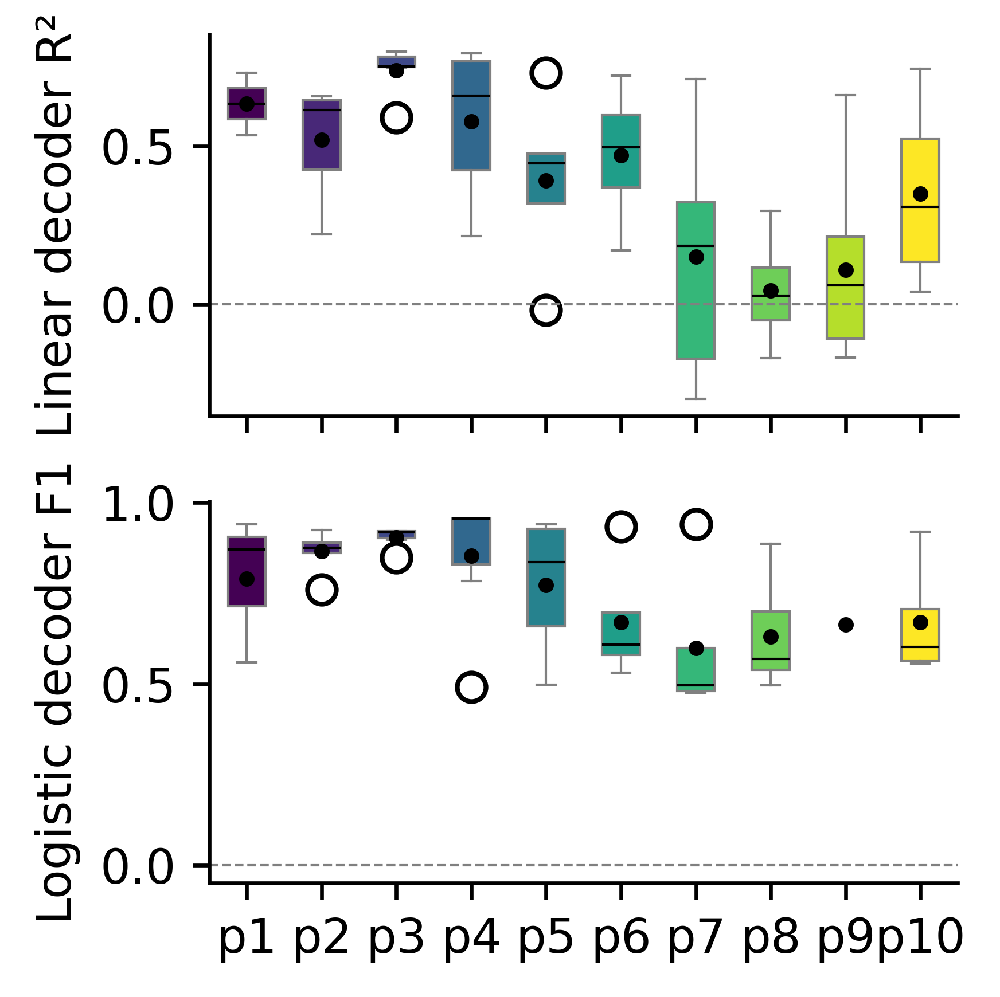

In [298]:
import numpy as np
import matplotlib.pyplot as plt
import re
from matplotlib.cm import viridis

# --- Prepare age colors ---
unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', x).group(0)))
age_colors = [viridis(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare data for plotting ---
def get_plot_data(df, col_name):
    data = []
    for age in unique_ages:
        vals = df[df['age'] == age][col_name].values
        data.append(vals if len(vals) > 0 else np.array([]))
    return data

plot_r2 = get_plot_data(combined_df, 'r2_linear')
plot_f1 = get_plot_data(combined_df, 'f1_score_logistic')

# --- Plot subplots as boxplots ---
fig, axes = plt.subplots(2, 1, figsize=(3, 3), dpi=600, sharex=True)

for ax, plot_data, title in zip(
    axes, [plot_r2, plot_f1], ['Linear decoder R²', 'Logistic decoder F1']
):
    positions = np.arange(1, len(plot_data) + 1)
    for i, vals in enumerate(plot_data):
        if len(vals) == 0:
            continue
        bp = ax.boxplot(
            vals,
            positions=[positions[i]],
            widths=0.5,
            patch_artist=True,
            boxprops=dict(facecolor=age2color[unique_ages[i]], edgecolor='grey', linewidth=0.5),
            whiskerprops=dict(color='grey', linewidth=0.5),
            capprops=dict(color='grey', linewidth=0.5),
            medianprops=dict(color='black', linewidth=0.5)
        )
        # Mean point
        ax.scatter(positions[i], np.nanmean(vals), color='black', s=5, zorder=3)

    # Minimal axes
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.set_ylabel(title)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

# X-axis: age
axes[-1].set_xticks(positions)
axes[-1].set_xticklabels(unique_ages)

plt.tight_layout()
plt.show()


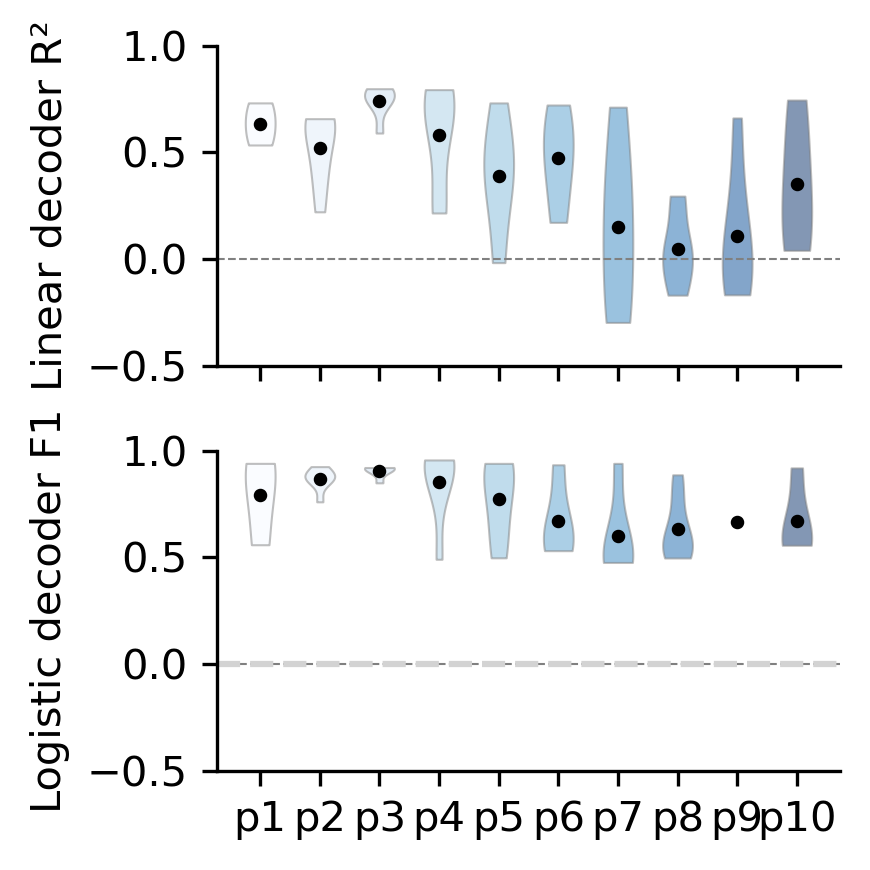

In [60]:
import numpy as np
import matplotlib.pyplot as plt
import re
from matplotlib.cm import viridis

# --- Age colors ---
unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', x).group(0)))
age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare plotting data ---
def get_plot_data(df, col_name):
    data = []
    for age in unique_ages:
        vals = df[df['age'] == age][col_name].values
        data.append(vals if len(vals) > 0 else np.array([]))
    return data

plot_r2 = get_plot_data(combined_df, 'r2_linear')
plot_f1 = get_plot_data(combined_df, 'f1_score_logistic')

# --- Plot subplots ---
fig, axes = plt.subplots(2, 1, figsize=(3, 3), dpi=300, sharex=True)

for ax, plot_data, title in zip(
    axes, [plot_r2, plot_f1], ['Linear decoder R²', 'Logistic decoder F1']
):
    parts = ax.violinplot(
        plot_data,
        vert=True,
        showmeans=False,
        showextrema=False,
        showmedians=False,
        widths=0.5
    )

    # Face color, grey edges
    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(age2color[unique_ages[i]])
        pc.set_edgecolor('grey')
        pc.set_alpha(0.5)
        pc.set_linewidth(0.5)

    # Add mean points
    for i, vals in enumerate(plot_data):
        if len(vals) > 0:
            mean_val = np.nanmean(vals)
            ax.scatter(i + 1, mean_val, color='black', s=5, zorder=3)

    # Minimal axes
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.set_ylabel(title)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

# X-axis: age
axes[-1].set_xticks(range(1, len(unique_ages) + 1))
axes[-1].set_xticklabels(unique_ages)
axes[0].set_ylim(-0.5,1)
axes[1].set_ylim(-0.5,1)
ax.axhline(0, linestyle='--', color='lightgrey', lw=1.5)


plt.tight_layout()
plt.show()


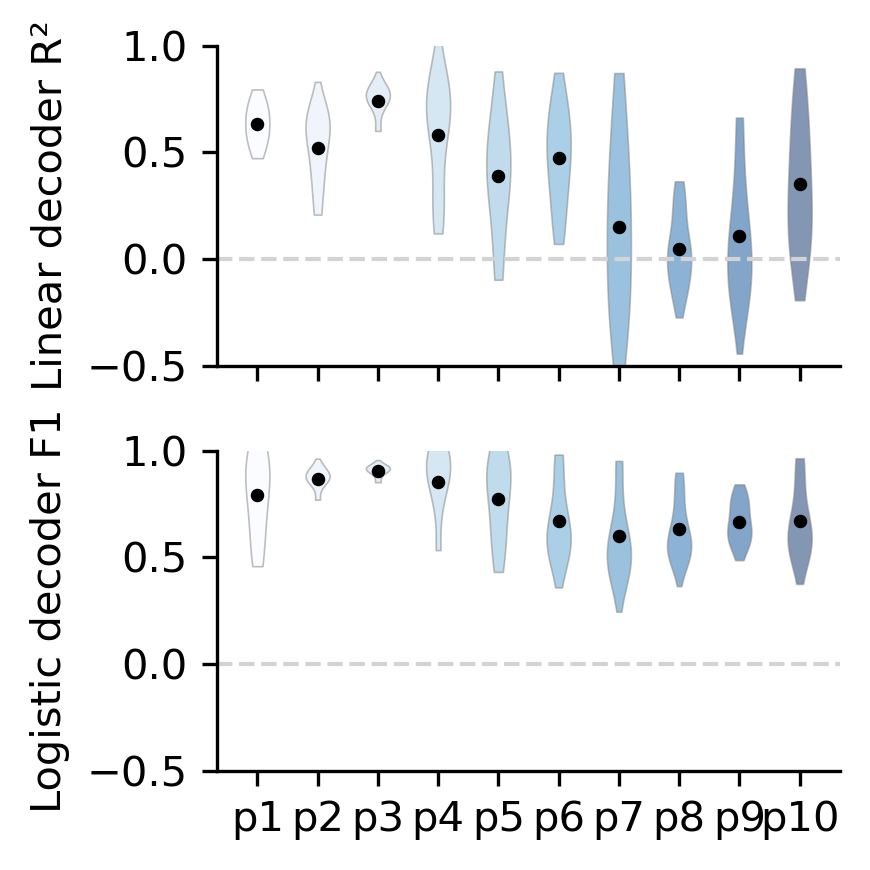

In [64]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import re
from matplotlib.cm import Blues

# --- Age colors ---
unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', x).group(0)))
age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare plotting data ---
def get_plot_data(df, col_name):
    data = []
    for age in unique_ages:
        vals = df[df['age'] == age][col_name].dropna().values
        data.append(vals if len(vals) > 0 else np.array([]))
    return data

plot_r2 = get_plot_data(combined_df, 'r2_linear')
plot_f1 = get_plot_data(combined_df, 'f1_score_logistic')

# --- KDE-based violins ---
fig, axes = plt.subplots(2, 1, figsize=(3, 3), dpi=300, sharex=True)

for ax, plot_data, title in zip(
    axes, [plot_r2, plot_f1], ['Linear decoder R²', 'Logistic decoder F1']
):
    for i, vals in enumerate(plot_data):
        if len(vals) < 2:
            continue
        mean_val = np.mean(vals)
        sd = np.std(vals)

        # KDE
        kde = gaussian_kde(vals)
        y_grid = np.linspace(mean_val - 2*sd, mean_val + 2*sd, 200)
        density = kde(y_grid)
        density /= density.max()

        # Scale width
        width = 0.4 * density
        ax.fill_betweenx(
            y_grid,
            i + 1 - width / 2,
            i + 1 + width / 2,
            facecolor=age2color[unique_ages[i]],
            alpha=0.5,
            edgecolor='grey',
            linewidth=0.4
        )

        # Mean point
        ax.scatter(i + 1, mean_val, color='black', s=5, zorder=3)

    # Minimal axes
    ax.set_ylabel(title)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

# X-axis: age
axes[-1].set_xticks(range(1, len(unique_ages) + 1))
axes[-1].set_xticklabels(unique_ages)
axes[0].set_ylim(-0.5, 1)
axes[1].set_ylim(-0.5, 1)
axes[0].axhline(0, linestyle='--', color='lightgrey', lw=1)
axes[1].axhline(0, linestyle='--', color='lightgrey', lw=1)

plt.tight_layout()
plt.show()


In [300]:
# --- Age colors ---
unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', x).group(0)))
age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare plotting data ---
def get_plot_data(df, col_name):
    data = []
    for age in unique_ages:
        vals = df[df['age'] == age][col_name].values
        data.append(vals if len(vals) > 0 else np.array([]))
    return data

plot_r2 = get_plot_data(combined_df, 'r2_linear')
plot_f1 = get_plot_data(combined_df, 'f1_score_logistic')
plot_f1_class1 = get_plot_data(combined_df, 'f1_class1')  # new

# --- Plot subplots ---
fig, axes = plt.subplots(3, 1, figsize=(3, 4.5), dpi=300, sharex=True)

for ax, plot_data, title in zip(
    axes,
    [plot_r2, plot_f1, plot_f1_class1],
    ['Linear decoder R²', 'Logistic decoder F1', 'Logistic F1 (class 1)']
):
    parts = ax.violinplot(
        plot_data,
        vert=True,
        showmeans=False,
        showextrema=False,
        showmedians=False,
        widths=0.5
    )

    # Face color, grey edges
    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(age2color[unique_ages[i]])
        pc.set_edgecolor('grey')
        pc.set_alpha(0.5)
        pc.set_linewidth(0.5)

    # Add mean points
    for i, vals in enumerate(plot_data):
        if len(vals) > 0:
            mean_val = np.nanmean(vals)
            ax.scatter(i + 1, mean_val, color='black', s=5, zorder=3)

    # Minimal axes
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.set_ylabel(title)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

# X-axis: age
axes[-1].set_xticks(range(1, len(unique_ages) + 1))
axes[-1].set_xticklabels(unique_ages)

plt.tight_layout()
plt.show()

KeyError: 'f1_class1'

In [303]:
# --- Age colors ---
unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', str(x)).group(0)))
age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare plotting data ---
def get_plot_data(df, col_name):
    data = []
    for age in unique_ages:
        vals = df[df['age'] == age][col_name].values
        data.append(vals if len(vals) > 0 else np.array([]))
    return data

plot_r2 = get_plot_data(combined_df, 'r2_linear')
plot_f1 = get_plot_data(combined_df, 'f1_score_logistic')
plot_f1_class1 = get_plot_data(combined_df, 'f1_class1')  # new

# --- Plot subplots ---
fig, axes = plt.subplots(3, 1, figsize=(3, 5), dpi=300, sharex=True)

for ax, plot_data, title in zip(
    axes,
    [plot_r2, plot_f1, plot_f1_class1],
    ['Linear decoder R²', 'Logistic decoder F1', 'Logistic F1 (Class 1)']
):
    parts = ax.violinplot(
        plot_data,
        vert=True,
        showmeans=False,
        showextrema=False,
        showmedians=False,
        widths=0.5
    )

    # Color violins by age
    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(age2color[unique_ages[i]])
        pc.set_edgecolor('grey')
        pc.set_alpha(0.5)
        pc.set_linewidth(0.5)

    # Add mean points
    for i, vals in enumerate(plot_data):
        if len(vals) > 0:
            mean_val = np.nanmean(vals)
            ax.scatter(i + 1, mean_val, color='black', s=5, zorder=3)

    # Minimal axes
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.set_ylabel(title)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

# X-axis: age
axes[-1].set_xticks(range(1, len(unique_ages) + 1))
axes[-1].set_xticklabels(unique_ages)

plt.tight_layout()
plt.show()

KeyError: 'f1_class1'

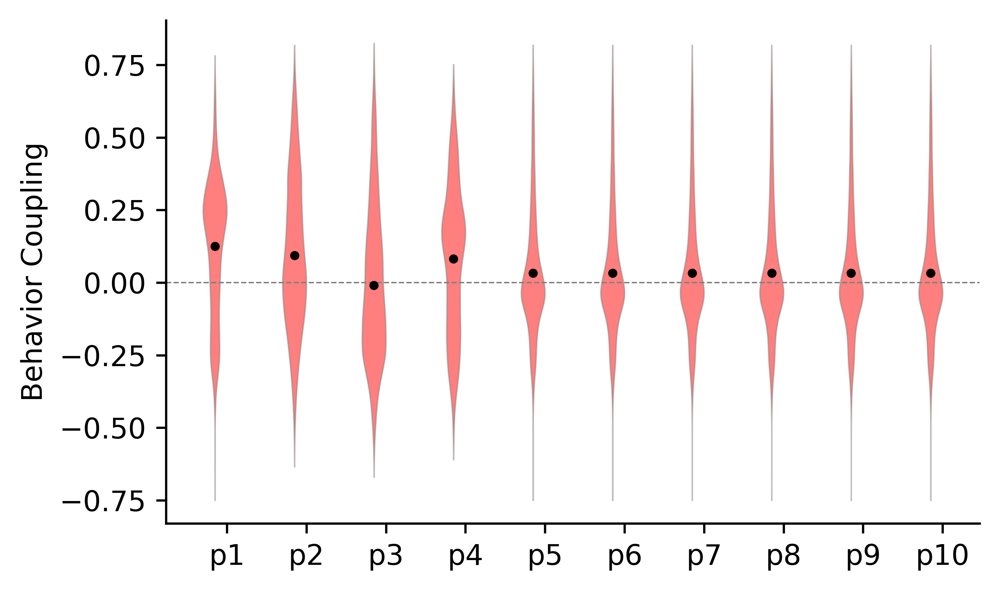

In [87]:
import numpy as np
import matplotlib.pyplot as plt
import re
from matplotlib.cm import viridis

# --- Extract ages ---
unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', x).group(0)))
age_colors = [viridis(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare figure ---
fig, ax = plt.subplots(1, 1, figsize=(5, 3), dpi=600)

# Width and offset for dual violins
width = 0.3
offset = 0.15

for i, age in enumerate(unique_ages):
    age_num = int(re.search(r'\d+', age).group(0))
    age_df = combined_df[combined_df['age'] == age]

    if age_num <= 5:
        # Only GABA and EMX separate
        gaba_vals = age_df[age_df['group'] == 'GABA']['behavior_coupling'].values
        emx_vals = age_df[age_df['group'] == 'EMX']['behavior_coupling'].values

    # If gaba_vals is a series of lists/arrays
    if len(gaba_vals) > 0:
        # Flatten all arrays/lists in gaba_vals
        gaba_flat = np.concatenate([np.ravel(x) for x in gaba_vals if len(x) > 0])
        
        # Then plot
        parts = ax.violinplot([gaba_flat], positions=[i - offset], widths=width,
                              showmeans=False, showextrema=False, showmedians=False)
        
        for pc in parts['bodies']:
            pc.set_facecolor('red')
            pc.set_edgecolor('grey')
            pc.set_alpha(0.5)
            pc.set_linewidth(0.5)
    
        ax.scatter(i - offset, np.nanmean(gaba_flat), color='black', s=5, zorder=3)
        # EMX - green, right
        # if len(emx_vals) > 0:
        #     emx_flat = np.concatenate([np.ravel(x) for x in emx_vals if len(x) > 0])

        #     parts = ax.violinplot([emx_flat], positions=[i + offset], widths=width,
        #                           showmeans=False, showextrema=False, showmedians=False)
        #     for pc in parts['bodies']:
        #         pc.set_facecolor('green')
        #         pc.set_edgecolor('grey')
        #         pc.set_alpha(0.5)
        #         pc.set_linewidth(0.5)
        #     ax.scatter(i + offset, np.nanmean(emx_vals), color='black', s=5, zorder=3)

    else:
        # After P5, Dual Imaging only: two violins per age for green/red cells
        dual_df = age_df[age_df['group'] == 'Dual Imaging']
        green_vals = dual_df['behavior_coupling_greencell'].values
        red_vals = dual_df['behavior_coupling_redcell'].values
        green_flat = np.concatenate([np.ravel(x) for x in green_vals if len(x) > 0])
        red_flat = np.concatenate([np.ravel(x) for x in red_vals if len(x) > 0])

        # Green cell
        if len(green_vals) > 0:
            parts = ax.violinplot([green_flat], positions=[i - offset], widths=width,
                                  showmeans=False, showextrema=False, showmedians=False)
            for pc in parts['bodies']:
                pc.set_facecolor('green')
                pc.set_edgecolor('grey')
                pc.set_alpha(0.5)
                pc.set_linewidth(0.5)
            ax.scatter(i - offset, np.nanmean(green_flat), color='black', s=5, zorder=3)

        # Red cell
        if len(red_vals) > 0:
            parts = ax.violinplot([red_flat], positions=[i + offset], widths=width,
                                  showmeans=False, showextrema=False, showmedians=False)
            for pc in parts['bodies']:
                pc.set_facecolor('red')
                pc.set_edgecolor('grey')
                pc.set_alpha(0.5)
                pc.set_linewidth(0.5)
            ax.scatter(i + offset, np.nanmean(red_flat), color='black', s=5, zorder=3)

# --- Axis formatting ---
ax.set_xticks(range(len(unique_ages)))
ax.set_xticklabels(unique_ages)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_ylabel('Behavior Coupling')

plt.tight_layout()
plt.show()


ValueError: need at least one array to concatenate

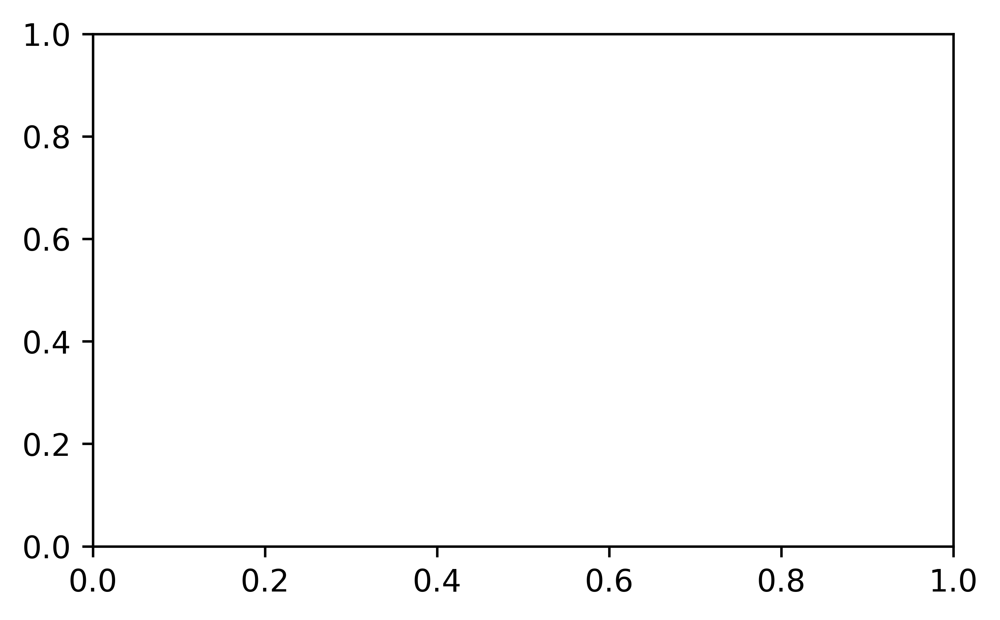

In [88]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import re
from matplotlib.cm import Blues

# --- Extract ages and color map ---
unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', x).group(0)))
age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
age2color = dict(zip(unique_ages, age_colors))

# --- Prepare figure ---
fig, ax = plt.subplots(1, 1, figsize=(5, 3), dpi=600)

# Width and offset for dual violins
width = 0.4
offset = 0.15

for i, age in enumerate(unique_ages):
    age_num = int(re.search(r'\d+', age).group(0))
    age_df = combined_df[combined_df['age'] == age]

    if age_num <= 5:
        # --- GABA & EMX ---
        gaba_vals = age_df[age_df['group'] == 'GABA']['behavior_coupling'].dropna().values
        emx_vals = age_df[age_df['group'] == 'EMX']['behavior_coupling'].dropna().values

        # Flatten
        gaba_flat = np.concatenate([np.ravel(x) for x in gaba_vals if len(x) > 0])
        emx_flat = np.concatenate([np.ravel(x) for x in emx_vals if len(x) > 0])

        for vals, pos, col in zip(
            [gaba_flat, emx_flat],
            [i - offset, i + offset],
            ['red', 'green']
        ):
            if len(vals) < 3:
                continue
            kde = gaussian_kde(vals)
            y_grid = np.linspace(vals.min(), vals.max(), 200)
            density = kde(y_grid)
            density /= density.max()
            w = width * density

            ax.fill_betweenx(
                y_grid,
                pos - w/2,
                pos + w/2,
                facecolor=col,
                alpha=0.5,
                edgecolor='grey',
                linewidth=0.4
            )
            ax.scatter(pos, np.nanmean(vals), color='black', s=6, zorder=3)

    else:
        # --- Dual imaging: green vs red cells ---
        dual_df = age_df[age_df['group'] == 'Dual Imaging']
        green_vals = dual_df['behavior_coupling_greencell'].dropna().values
        red_vals = dual_df['behavior_coupling_redcell'].dropna().values

        green_flat = np.concatenate([np.ravel(x) for x in green_vals if len(x) > 0])
        red_flat = np.concatenate([np.ravel(x) for x in red_vals if len(x) > 0])

        for vals, pos, col in zip(
            [green_flat, red_flat],
            [i - offset, i + offset],
            ['green', 'red']
        ):
            if len(vals) < 3:
                continue
            kde = gaussian_kde(vals)
            y_grid = np.linspace(vals.min(), vals.max(), 200)
            density = kde(y_grid)
            density /= density.max()
            w = width * density

            ax.fill_betweenx(
                y_grid,
                pos - w/2,
                pos + w/2,
                facecolor=col,
                alpha=0.5,
                edgecolor='grey',
                linewidth=0.4
            )
            ax.scatter(pos, np.nanmean(vals), color='black', s=6, zorder=3)

# --- Axis formatting ---
ax.set_xticks(range(len(unique_ages)))
ax.set_xticklabels(unique_ages)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_ylabel('Behavior Coupling')
plt.tight_layout()
plt.show()


TypeError: object of type 'NoneType' has no len()

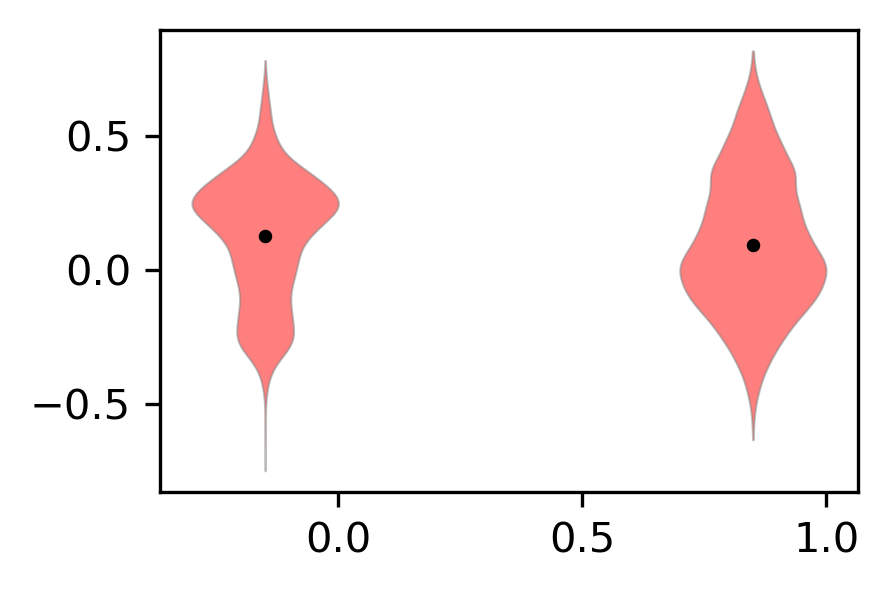

In [305]:
def plot_behavior_coupling(combined_df, dpi=300):
    # --- Extract ages ---
    unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', x).group(0)))
    age_colors = [viridis(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
    
    # --- Prepare figure ---
    fig, ax = plt.subplots(1, 1, figsize=(3, 2), dpi=dpi)

    width = 0.3
    offset = 0.15

    for i, age in enumerate(unique_ages):
        age_num = int(re.search(r'\d+', age).group(0))
        age_df = combined_df[combined_df['age'] == age]

        if age_num <= 5:
            # P0-P5: separate GABA (red) and EMX (green)
            gaba_vals = age_df[age_df['group'] == 'GABA']['behavior_coupling'].values
            emx_vals = age_df[age_df['group'] == 'EMX']['behavior_coupling'].values

            # GABA - red, left
            if len(gaba_vals) > 0:
                gaba_flat = np.concatenate([np.ravel(x) for x in gaba_vals if len(x) > 0])
                parts = ax.violinplot([gaba_flat], positions=[i - offset], widths=width,
                                      showmeans=False, showextrema=False, showmedians=False)
                for pc in parts['bodies']:
                    pc.set_facecolor('red')
                    pc.set_edgecolor('grey')
                    pc.set_alpha(0.5)
                    pc.set_linewidth(0.5)
                ax.scatter(i - offset, np.nanmean(gaba_flat), color='black', s=5, zorder=3)

            # EMX - green, right
            if len(emx_vals) > 0:
                emx_flat = np.concatenate([np.ravel(x) for x in emx_vals if len(x) > 0])
                parts = ax.violinplot([emx_flat], positions=[i + offset], widths=width,
                                      showmeans=False, showextrema=False, showmedians=False)
                for pc in parts['bodies']:
                    pc.set_facecolor('green')
                    pc.set_edgecolor('grey')
                    pc.set_alpha(0.5)
                    pc.set_linewidth(0.5)
                ax.scatter(i + offset, np.nanmean(emx_flat), color='black', s=5, zorder=3)

        else:
            # After P5: Dual Imaging
            dual_df = age_df[age_df['group'] == 'Dual Imaging']
            green_vals = dual_df['behavior_coupling_greencell'].values
            red_vals = dual_df['behavior_coupling_redcell'].values

            # Green cells - left
            if len(green_vals) > 0:
                green_flat = np.concatenate([np.ravel(x) for x in green_vals if len(x) > 0])
                parts = ax.violinplot([green_flat], positions=[i - offset], widths=width,
                                      showmeans=False, showextrema=False, showmedians=False)
                for pc in parts['bodies']:
                    pc.set_facecolor('green')
                    pc.set_edgecolor('grey')
                    pc.set_alpha(0.5)
                    pc.set_linewidth(0.5)
                ax.scatter(i - offset, np.nanmean(green_flat), color='black', s=5, zorder=3)

            # Red cells - right
            if len(red_vals) > 0:
                red_flat = np.concatenate([np.ravel(x) for x in red_vals if len(x) > 0])
                parts = ax.violinplot([red_flat], positions=[i + offset], widths=width,
                                      showmeans=False, showextrema=False, showmedians=False)
                for pc in parts['bodies']:
                    pc.set_facecolor('red')
                    pc.set_edgecolor('grey')
                    pc.set_alpha(0.5)
                    pc.set_linewidth(0.5)
                ax.scatter(i + offset, np.nanmean(red_flat), color='black', s=5, zorder=3)

    # --- Axis formatting ---
    ax.set_xticks(range(len(unique_ages)))
    ax.set_xticklabels(unique_ages)
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_ylabel('Behavior Coupling')
    plt.ylim(-1,1)

    plt.tight_layout()
    plt.show()

# Example usage:
plot_behavior_coupling(combined_df)

TypeError: object of type 'NoneType' has no len()

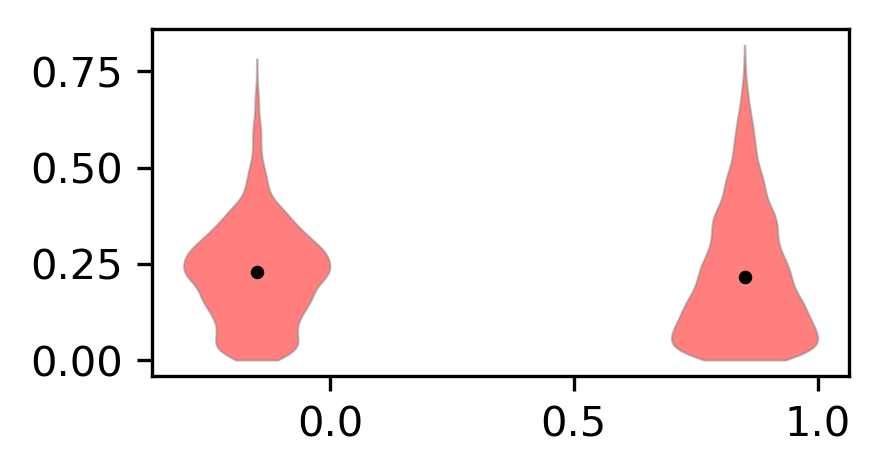

In [306]:
# abs values 
import numpy as np
import matplotlib.pyplot as plt
import re
from matplotlib.cm import viridis

def plot_behavior_coupling_abs(combined_df, dpi=300):
    # --- Extract ages ---
    unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', x).group(0)))
    age_colors = [viridis(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
    
    # --- Prepare figure ---
    fig, ax = plt.subplots(1, 1, figsize=(3, 1.5), dpi=dpi)

    width = 0.3
    offset = 0.15

    for i, age in enumerate(unique_ages):
        age_num = int(re.search(r'\d+', age).group(0))
        age_df = combined_df[combined_df['age'] == age]

        if age_num <= 5:
            # P0-P5: separate GABA (red) and EMX (green)
            gaba_vals = age_df[age_df['group'] == 'GABA']['behavior_coupling'].values
            emx_vals = age_df[age_df['group'] == 'EMX']['behavior_coupling'].values

            # GABA - red, left
            if len(gaba_vals) > 0:
                gaba_flat = np.concatenate([np.ravel(x) for x in gaba_vals if len(x) > 0])
                gaba_flat = np.abs(gaba_flat)  # take absolute values
                parts = ax.violinplot([gaba_flat], positions=[i - offset], widths=width,
                                      showmeans=False, showextrema=False, showmedians=False)
                for pc in parts['bodies']:
                    pc.set_facecolor('red')
                    pc.set_edgecolor('grey')
                    pc.set_alpha(0.5)
                    pc.set_linewidth(0.5)
                ax.scatter(i - offset, np.nanmean(gaba_flat), color='black', s=5, zorder=3)

            # EMX - green, right
            if len(emx_vals) > 0:
                emx_flat = np.concatenate([np.ravel(x) for x in emx_vals if len(x) > 0])
                emx_flat = np.abs(emx_flat)
                parts = ax.violinplot([emx_flat], positions=[i + offset], widths=width,
                                      showmeans=False, showextrema=False, showmedians=False)
                for pc in parts['bodies']:
                    pc.set_facecolor('green')
                    pc.set_edgecolor('grey')
                    pc.set_alpha(0.5)
                    pc.set_linewidth(0.5)
                ax.scatter(i + offset, np.nanmean(emx_flat), color='black', s=5, zorder=3)

        else:
            # After P5: Dual Imaging
            dual_df = age_df[age_df['group'] == 'Dual Imaging']
            green_vals = dual_df['behavior_coupling_greencell'].values
            red_vals = dual_df['behavior_coupling_redcell'].values

            # Green cells - left
            if len(green_vals) > 0:
                green_flat = np.concatenate([np.ravel(x) for x in green_vals if len(x) > 0])
                green_flat = np.abs(green_flat)
                parts = ax.violinplot([green_flat], positions=[i - offset], widths=width,
                                      showmeans=False, showextrema=False, showmedians=False)
                for pc in parts['bodies']:
                    pc.set_facecolor('green')
                    pc.set_edgecolor('grey')
                    pc.set_alpha(0.5)
                    pc.set_linewidth(0.5)
                ax.scatter(i - offset, np.nanmean(green_flat), color='black', s=5, zorder=3)

            # Red cells - right
            if len(red_vals) > 0:
                red_flat = np.concatenate([np.ravel(x) for x in red_vals if len(x) > 0])
                red_flat = np.abs(red_flat)
                parts = ax.violinplot([red_flat], positions=[i + offset], widths=width,
                                      showmeans=False, showextrema=False, showmedians=False)
                for pc in parts['bodies']:
                    pc.set_facecolor('red')
                    pc.set_edgecolor('grey')
                    pc.set_alpha(0.5)
                    pc.set_linewidth(0.5)
                ax.scatter(i + offset, np.nanmean(red_flat), color='black', s=5, zorder=3)

    # --- Axis formatting ---
    ax.set_xticks(range(len(unique_ages)))
    ax.set_xticklabels(unique_ages)
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_ylabel('beh_coup (abs)')
    ax.set_ylim(0,1)  # absolute values are positive

    plt.tight_layout()
    plt.show()

# Example usage:
plot_behavior_coupling_abs(combined_df)


TypeError: object of type 'NoneType' has no len()

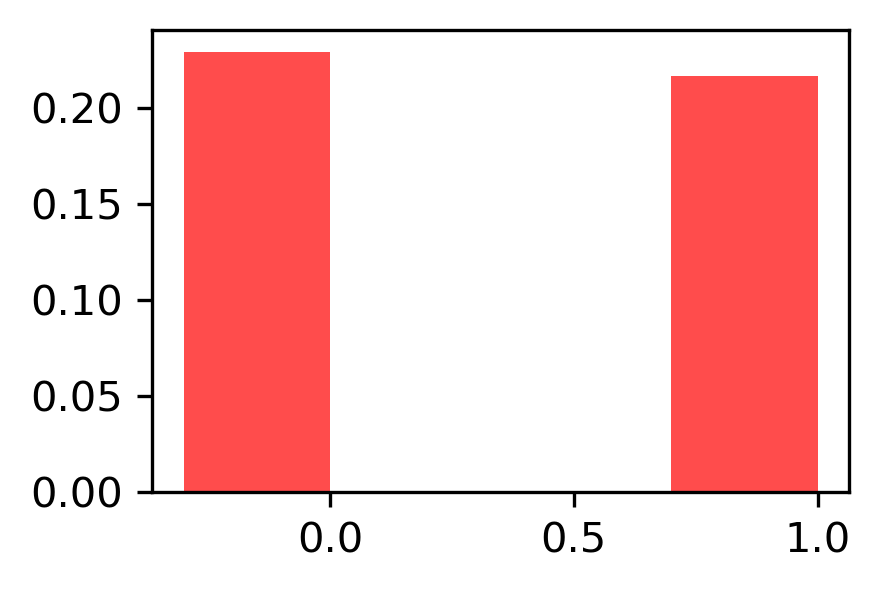

In [307]:
import numpy as np
import matplotlib.pyplot as plt
import re
from matplotlib.cm import viridis

def plot_behavior_coupling_abs_bar(combined_df, dpi=300):
    # --- Extract ages ---
    unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', x).group(0)))
    age_colors = [viridis(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]

    # --- Prepare figure ---
    fig, ax = plt.subplots(1, 1, figsize=(3, 2), dpi=dpi)

    width = 0.3
    offset = 0.15

    for i, age in enumerate(unique_ages):
        age_num = int(re.search(r'\d+', age).group(0))
        age_df = combined_df[combined_df['age'] == age]

        if age_num <= 5:
            # P0-P5: separate GABA (red) and EMX (green)
            gaba_vals = age_df[age_df['group'] == 'GABA']['behavior_coupling'].values
            emx_vals = age_df[age_df['group'] == 'EMX']['behavior_coupling'].values

            # GABA - red, left
            if len(gaba_vals) > 0:
                gaba_flat = np.abs(np.concatenate([np.ravel(x) for x in gaba_vals if len(x) > 0]))
                ax.bar(i - offset, np.nanmean(gaba_flat), width=width, color='red', alpha=0.7)

            # EMX - green, right
            if len(emx_vals) > 0:
                emx_flat = np.abs(np.concatenate([np.ravel(x) for x in emx_vals if len(x) > 0]))
                ax.bar(i + offset, np.nanmean(emx_flat), width=width, color='green', alpha=0.7)

        else:
            # After P5: Dual Imaging
            dual_df = age_df[age_df['group'] == 'Dual Imaging']
            green_vals = dual_df['behavior_coupling_greencell'].values
            red_vals = dual_df['behavior_coupling_redcell'].values

            # Green cells - left
            if len(green_vals) > 0:
                green_flat = np.abs(np.concatenate([np.ravel(x) for x in green_vals if len(x) > 0]))
                ax.bar(i - offset, np.nanmean(green_flat), width=width, color='green', alpha=0.7)

            # Red cells - right
            if len(red_vals) > 0:
                red_flat = np.abs(np.concatenate([np.ravel(x) for x in red_vals if len(x) > 0]))
                ax.bar(i + offset, np.nanmean(red_flat), width=width, color='red', alpha=0.7)

    # --- Axis formatting ---
    ax.set_xticks(range(len(unique_ages)))
    ax.set_xticklabels(unique_ages)
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_ylabel('Behavior Coupling (abs)')
    ax.set_ylim(0, 1)  # absolute values are positive

    plt.tight_layout()
    plt.show()

# Example usage:
plot_behavior_coupling_abs_bar(combined_df)


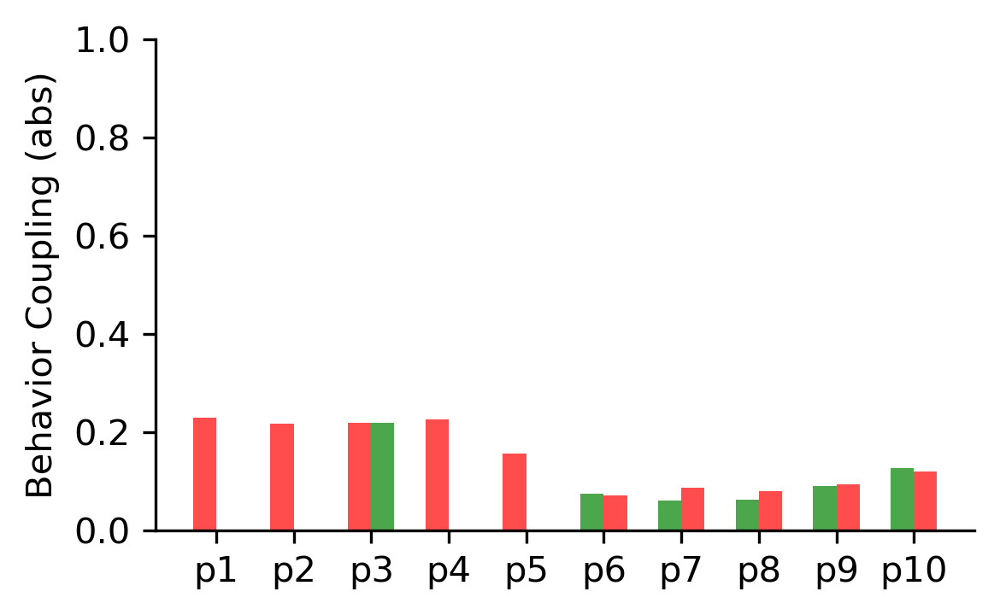

In [86]:
def plot_behavior_coupling_abs_bar(combined_df, dpi=300):
    # --- Extract ages ---
    unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', x).group(0)))
    age_colors = [viridis(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]

    # --- Prepare figure ---
    fig, ax = plt.subplots(1, 1, figsize=(4, 2.5), dpi=dpi)

    width = 0.3
    offset = 0.15

    for i, age in enumerate(unique_ages):
        age_num = int(re.search(r'\d+', age).group(0))
        age_df = combined_df[combined_df['age'] == age]

        if age_num <= 5:
            # P0-P5: separate GABA (red) and EMX (green)
            gaba_vals = [x for x in age_df[age_df['group'] == 'GABA']['behavior_coupling'].values if x is not None]
            emx_vals = [x for x in age_df[age_df['group'] == 'EMX']['behavior_coupling'].values if x is not None]

            # GABA - red, left
            if len(gaba_vals) > 0:
                gaba_flat = np.abs(np.concatenate([np.ravel(x) for x in gaba_vals]))
                ax.bar(i - offset, np.nanmean(gaba_flat), width=width, color='red', alpha=0.7)

            # EMX - green, right
            if len(emx_vals) > 0:
                emx_flat = np.abs(np.concatenate([np.ravel(x) for x in emx_vals]))
                ax.bar(i + offset, np.nanmean(emx_flat), width=width, color='green', alpha=0.7)

        else:
            # After P5: Dual Imaging
            dual_df = age_df[age_df['group'] == 'Dual Imaging']
            green_vals = [x for x in dual_df['behavior_coupling_greencell'].values if x is not None]
            red_vals = [x for x in dual_df['behavior_coupling_redcell'].values if x is not None]

            if len(green_vals) > 0:
                green_flat = np.abs(np.concatenate([np.ravel(x) for x in green_vals]))
                ax.bar(i - offset, np.nanmean(green_flat), width=width, color='green', alpha=0.7)

            if len(red_vals) > 0:
                red_flat = np.abs(np.concatenate([np.ravel(x) for x in red_vals]))
                ax.bar(i + offset, np.nanmean(red_flat), width=width, color='red', alpha=0.7)

    # --- Axis formatting ---
    ax.set_xticks(range(len(unique_ages)))
    ax.set_xticklabels(unique_ages)
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_ylabel('Behavior Coupling (abs)')
    ax.set_ylim(0, 1)  # absolute values are positive

    plt.tight_layout()
    plt.show()

# Example usage
plot_behavior_coupling_abs_bar(combined_df)

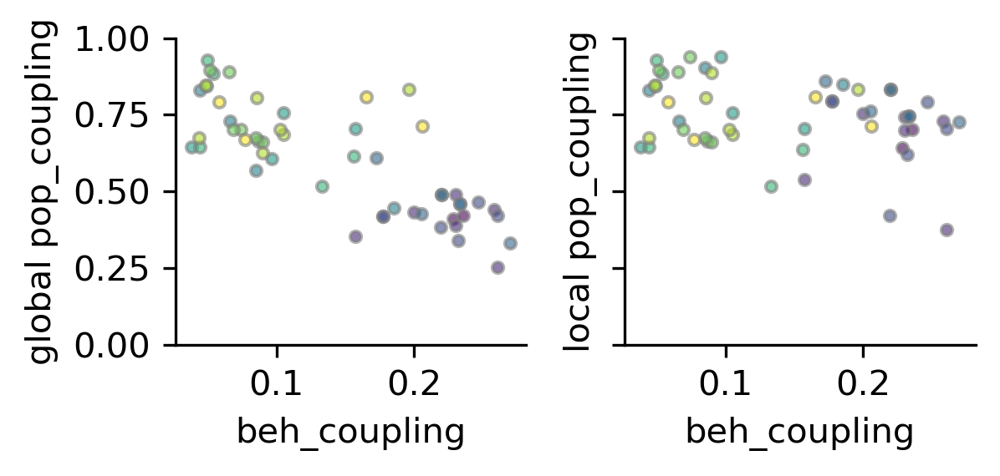

In [323]:
import numpy as np
import matplotlib.pyplot as plt
import re
from matplotlib.cm import viridis

def scatter_popcoup_vs_behcoup(combined_df, dpi=300, absolute=False):
    # --- Prepare DataFrame ---
    df = combined_df.copy()
    
    # Compute means if the columns are lists/arrays
    df['popcoup_all_mean'] = df['popcoup_all'].apply(lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan)
    df['popcouploc_mean'] = df['popcouploc'].apply(lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan)
    
    # Behavior coupling
    if absolute:
        df['beh_coup'] = df['behavior_coupling'].apply(lambda x: np.nanmean(np.abs(x)) if isinstance(x, (list, np.ndarray)) else np.nan)
    else:
        df['beh_coup'] = df['behavior_coupling'].apply(lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan)

    # Extract numeric age
    df['age_num'] = df['age'].apply(lambda x: int(re.search(r'\d+', str(x)).group(0)))
    
    unique_ages = sorted(df['age'].unique(), key=lambda x: int(re.search(r'\d+', str(x)).group(0)))
    age_colors = [viridis(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
    age2color = dict(zip(unique_ages, age_colors))

    # --- Plot ---
    fig, axes = plt.subplots(1, 2, figsize=(4, 2), dpi=300, sharey=True)

    for ax, y_col, title in zip(axes, ['popcoup_all_mean', 'popcouploc_mean'], ['global pop_coupling', 'local pop_coupling']):
        for age in unique_ages:
            age_df = df[df['age'] == age]
            x_vals = age_df['beh_coup'].values
            y_vals = age_df[y_col].values

            # Remove NaNs
            mask = ~np.isnan(x_vals) & ~np.isnan(y_vals)
            x_vals = x_vals[mask]
            y_vals = y_vals[mask]

            ax.scatter(x_vals, y_vals, color=age2color[age], edgecolor='grey', alpha=0.6, s=10, label=age if len(x_vals)>0 else "")

        ax.set_xlabel('beh_coupling')
        ax.set_ylabel(title)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.axhline(0, color='grey', lw=0.5, linestyle='--')
        plt.ylim(0,1)

    plt.tight_layout()
    plt.show()

# Example usage
scatter_popcoup_vs_behcoup(combined_df, absolute=True)


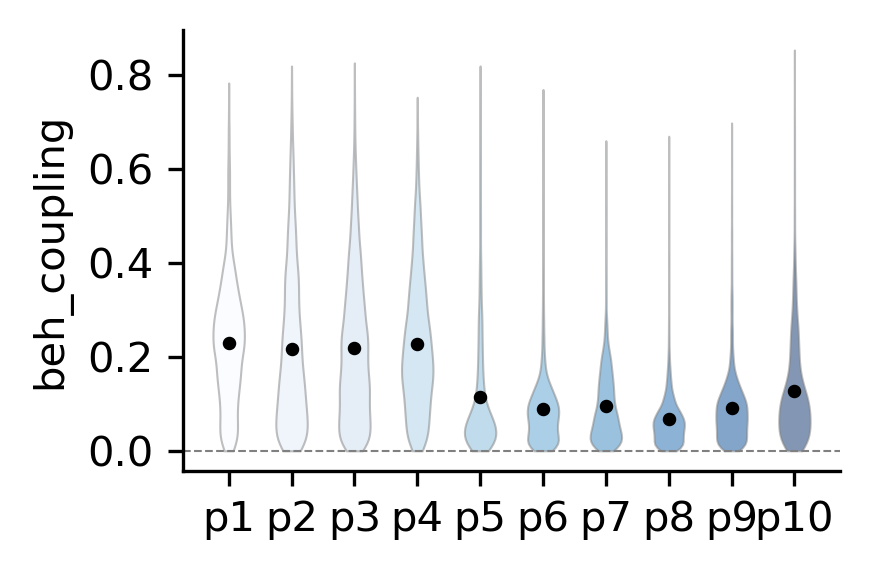

In [96]:
import matplotlib.pyplot as plt
import numpy as np
import re
from matplotlib.cm import viridis

def plot_modulation_idx_per_age_combined(combined_df, col_name='behavior_coupling', dpi=300):
    # --- Ages and colors ---
    unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', str(x)).group(0)))
    age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]

    fig, ax = plt.subplots(1, 1, figsize=(3,2), dpi=300)

    for i, age in enumerate(unique_ages):
        age_df = combined_df[combined_df['age'] == age]
        vals = age_df[col_name].values

        # Flatten values: handle floats or arrays
        flat_vals = []
        for v in vals:
            if isinstance(v, (list, np.ndarray)):
                flat_vals.extend(abs(np.ravel(v)))
            elif isinstance(v, (int, float)) and np.isfinite(v):
                flat_vals.append(np.abs(v))

        if len(flat_vals) > 0:
            parts = ax.violinplot([flat_vals], positions=[i], widths=0.5,
                                  showmeans=False, showextrema=False, showmedians=False)
            for pc in parts['bodies']:
                pc.set_facecolor(age_colors[i])
                pc.set_edgecolor('grey')
                pc.set_alpha(0.5)
                pc.set_linewidth(0.5)
            ax.scatter(i, np.nanmean(flat_vals), color='black', s=5, zorder=3)

    ax.set_xticks(range(len(unique_ages)))
    ax.set_xticklabels(unique_ages)
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.set_ylabel('beh_coupling')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    plt.tight_layout()
    plt.show()

# Example usage
plot_modulation_idx_per_age_combined(combined_df)


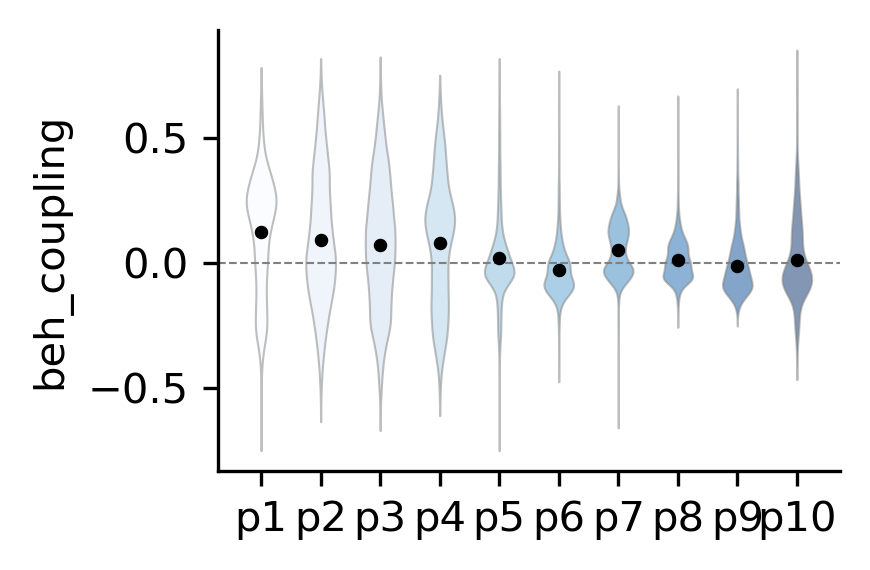

In [92]:
import matplotlib.pyplot as plt
import numpy as np
import re
from matplotlib.cm import viridis

def plot_modulation_idx_per_age_combined(combined_df, col_name='behavior_coupling', dpi=300):
    # --- Ages and colors ---
    unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', str(x)).group(0)))
    age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]

    fig, ax = plt.subplots(1, 1, figsize=(3,2), dpi=300)

    for i, age in enumerate(unique_ages):
        age_df = combined_df[combined_df['age'] == age]
        vals = age_df[col_name].values

        # Flatten values: handle floats or arrays
        flat_vals = []
        for v in vals:
            if isinstance(v, (list, np.ndarray)):
                flat_vals.extend((np.ravel(v)))
            elif isinstance(v, (int, float)) and np.isfinite(v):
                flat_vals.append((v))

        if len(flat_vals) > 0:
            parts = ax.violinplot([flat_vals], positions=[i], widths=0.5,
                                  showmeans=False, showextrema=False, showmedians=False)
            for pc in parts['bodies']:
                pc.set_facecolor(age_colors[i])
                pc.set_edgecolor('grey')
                pc.set_alpha(0.5)
                pc.set_linewidth(0.5)
            ax.scatter(i, np.nanmean(flat_vals), color='black', s=5, zorder=3)

    ax.set_xticks(range(len(unique_ages)))
    ax.set_xticklabels(unique_ages)
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.set_ylabel('beh_coupling')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    plt.tight_layout()
    plt.show()

# Example usage
plot_modulation_idx_per_age_combined(combined_df)


In [94]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import re
from matplotlib.cm import Blues

def plot_modulation_idx_per_age_combined(combined_df, col_name='behavior_coupling', dpi=300):
    # --- Ages and colors ---
    unique_ages = sorted(
        combined_df['age'].unique(),
        key=lambda x: int(re.search(r'\d+', str(x)).group(0))
    )
    age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]

    fig, ax = plt.subplots(1, 1, figsize=(3, 2), dpi=dpi)

    for i, age in enumerate(unique_ages):
        age_df = combined_df[combined_df['age'] == age]
        vals = age_df[col_name].values

        # Flatten all values (handle floats, arrays, etc.)
        flat_vals = []
        for v in vals:
            if isinstance(v, (list, np.ndarray)):
                flat_vals.extend(np.ravel(v))
            elif isinstance(v, (int, float)) and np.isfinite(v):
                flat_vals.append(v)

        flat_vals = np.array(flat_vals)
        if len(flat_vals) < 3:
            continue  # skip if not enough points

        # --- KDE-based violin ---
        kde = gaussian_kde(flat_vals)
        y_grid = np.linspace(np.min(flat_vals), np.max(flat_vals), 200)
        density = kde(y_grid)
        density /= np.max(density)  # normalize width

        width = 0.4 * density  # scale violin width
        ax.fill_betweenx(
            y_grid,
            i - width / 2,
            i + width / 2,
            facecolor=age_colors[i],
            alpha=0.5,
            edgecolor='grey',
            linewidth=0.4
        )

        # Mean point
        mean_val = np.mean(flat_vals)
        ax.scatter(i, mean_val, color='black', s=6, zorder=3)

    # --- Axes formatting ---
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.set_xticks(range(len(unique_ages)))
    ax.set_xticklabels(unique_ages)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_ylabel('Behavior Coupling')
    ax.set_xlim(-0.5, len(unique_ages) - 0.5)
    ax.set_ylim(-1, 1)

    plt.tight_layout()
    plt.show()


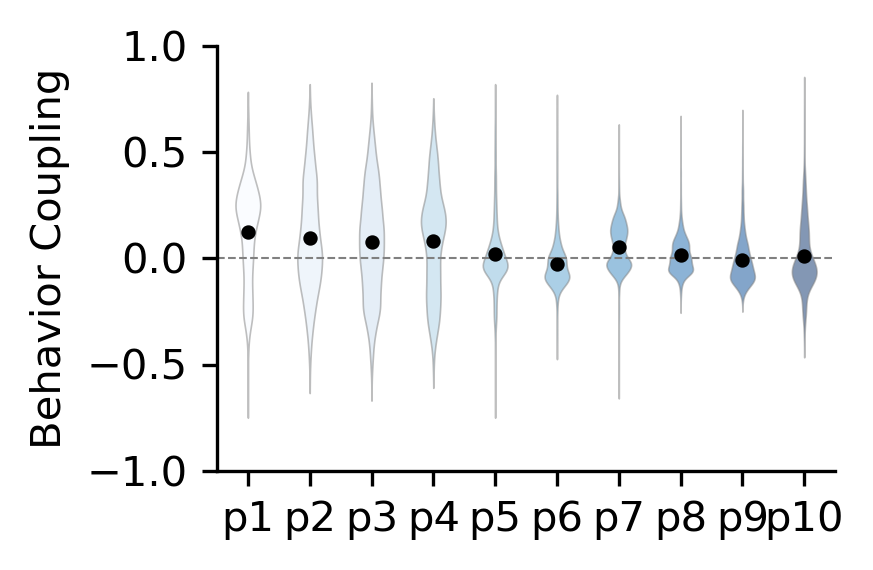

In [95]:
plot_modulation_idx_per_age_combined(combined_df, col_name='behavior_coupling', dpi=300)

In [65]:
from scipy.stats import spearmanr


Global Pop. Coupling: Spearman ρ=-0.753, p=7.715e-11
Local Pop. Coupling: Spearman ρ=-0.232, p=9.453e-02


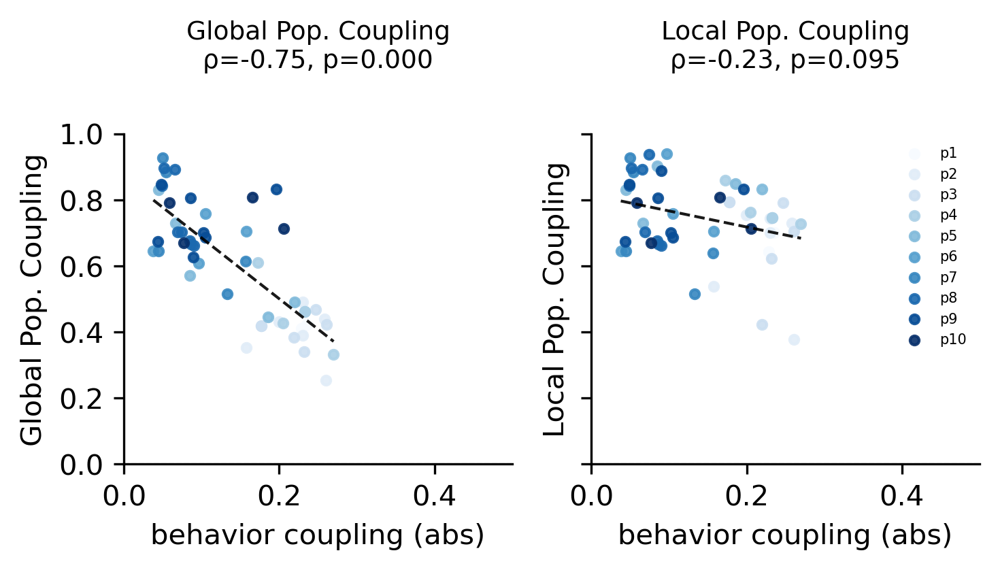

In [99]:
def scatter_popcoup_vs_behcoup(combined_df, dpi=300, absolute=False, show_regline=True):
    df = combined_df.copy()
    
    # --- Compute mean values ---
    df['popcoup_all_mean'] = df['popcoup_all'].apply(lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan)
    df['popcouploc_mean'] = df['popcouploc'].apply(lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan)
    
    # --- Behavior coupling ---
    if absolute:
        df['beh_coup'] = df['behavior_coupling'].apply(lambda x: np.nanmean(np.abs(x)) if isinstance(x, (list, np.ndarray)) else np.nan)
    else:
        df['beh_coup'] = df['behavior_coupling'].apply(lambda x: np.nanmean(x) if isinstance(x, (list, np.ndarray)) else np.nan)

    # --- Extract age numbers ---
    df['age_num'] = df['age'].apply(lambda x: int(re.search(r'\d+', str(x)).group(0)))
    unique_ages = sorted(df['age'].unique(), key=lambda x: int(re.search(r'\d+', str(x)).group(0)))
    age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]
    age2color = dict(zip(unique_ages, age_colors))

    # blues = [plt.cm.Blues(i/max(1,len(unique_ages)-1)) for in range(len(unique_ages))]  # darker to lighter blues
    # age2color = dict(zip(unique_ages, blues))

    # --- Create plots ---
    fig, axes = plt.subplots(1, 2, figsize=(5, 3), dpi=dpi, sharey=True)

    for ax, y_col, title in zip(
        axes,
        ['popcoup_all_mean', 'popcouploc_mean'],
        ['Global Pop. Coupling', 'Local Pop. Coupling']
    ):
        # Prepare all valid points
        mask = ~df['beh_coup'].isna() & ~df[y_col].isna()
        x_vals = df.loc[mask, 'beh_coup'].values
        y_vals = df.loc[mask, y_col].values
        ages = df.loc[mask, 'age'].values

        # Scatter colored by age
        for age in unique_ages:
            age_mask = ages == age
            ax.scatter(x_vals[age_mask], y_vals[age_mask],
                       color=age2color[age], alpha=0.9, s=10, label=age)

        # --- Global Spearman correlation ---
        rho, p = spearmanr(x_vals, y_vals)
        print(f"{title}: Spearman ρ={rho:.3f}, p={p:.3e}")

        # Optional regression line (for visualization)
        if show_regline:
            slope, intercept = np.polyfit(x_vals, y_vals, 1)
            x_fit = np.linspace(np.nanmin(x_vals), np.nanmax(x_vals), 100)
            ax.plot(x_fit, slope * x_fit + intercept, color='black', lw=1, alpha=0.9, linestyle='--')

        # --- Format plot ---
        ax.set_xlabel('behavior coupling (abs)')
        ax.set_ylabel(title)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.axhline(0, color='grey', lw=0.5, linestyle='--')
        ax.axvline(0, color='grey', lw=0.5, linestyle='--')
        ax.set_xlim(0, 0.5)
        ax.set_ylim(0, 1)
        ax.set_title(f"{title}\nρ={rho:.2f}, p={p:.3f}", fontsize=9, y=1.15)

    plt.tight_layout()
    plt.legend(fontsize=5, frameon=False)
    plt.show()

# Example usage
scatter_popcoup_vs_behcoup(combined_df, absolute=True)

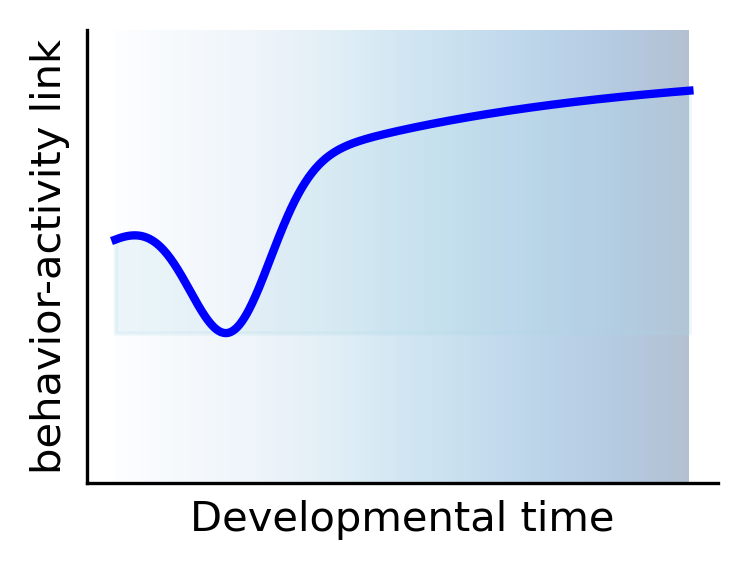

In [79]:
# --- Simulate learning curve ---
epochs = np.linspace(0, 100, 500)
performance = 0.8 - 0.4 * np.exp(-((epochs-20)/10)**2) + 0.3 * (1 - np.exp(-((epochs-20)/50)))

# --- Background color map ---
norm = Normalize(vmin=epochs.min(), vmax=epochs.max())
cmap = Blues  # use matplotlib cm

# --- Plot ---
fig, ax = plt.subplots(figsize=(3, 2), dpi=300)

for i in range(len(epochs)-1):
    ax.axvspan(epochs[i], epochs[i+1], color= cmap(norm(epochs[i])), alpha =0.3, lw=0)

ax.plot(epochs, performance, color='blue', lw=2)

ax.fill_between(epochs, performance, performance.min(), color='lightblue', alpha=0.2)

# Annotate valley of despair
# valley_idx = np.argmin(performance)
# ax.annotate('Valley of despair',
#             xy=(epochs[valley_idx], performance[valley_idx]),
#             xytext=(epochs[valley_idx]+10, performance[valley_idx]-0.1),
#             arrowprops=dict(facecolor='red', shrink=0.05),
#             fontsize=10)

# Annotate recovery
# ax.annotate('Recovery / Learning',
#             xy=(epochs[-1], performance[-1]),
#             xytext=(epochs[-40], performance[-1]+0.05),
#             arrowprops=dict(facecolor='green', shrink=0.05),
#             fontsize=10)

ax.set_xlabel('Developmental time')
ax.set_ylabel('behavior-activity link')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Hide y-ticks
ax.set_xticks([])

# plt.xitcks([])
# ax.set_title('Schematic Learning Curve')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylim(0, 1.2)
plt.tight_layout()
plt.yticks([])
plt.show()

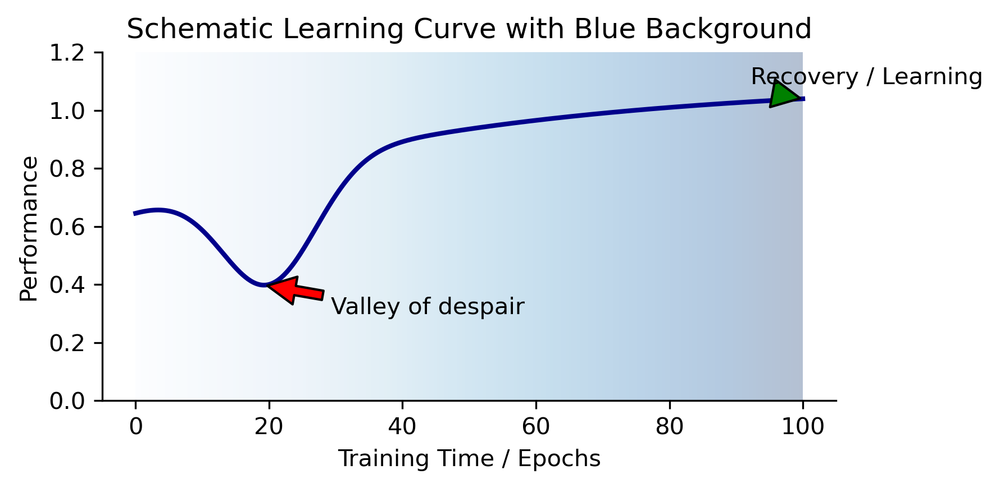

In [69]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import Blues
from matplotlib.colors import Normalize

# --- Simulate learning curve ---
epochs = np.linspace(0, 100, 500)
performance = 0.8 - 0.4 * np.exp(-((epochs-20)/10)**2) + 0.3 * (1 - np.exp(-((epochs-20)/50)))

# --- Background color map ---
norm = Normalize(vmin=epochs.min(), vmax=epochs.max())
cmap = Blues  # use matplotlib cm

fig, ax = plt.subplots(figsize=(6, 3), dpi=300)

# Draw background as colored vertical bands
for i in range(len(epochs)-1):
    ax.axvspan(epochs[i], epochs[i+1],
               color=cmap(norm(epochs[i])),
               alpha=0.3, lw=0)

# Plot learning curve on top
ax.plot(epochs, performance, color='darkblue', lw=2)

# Annotate valley of despair
valley_idx = np.argmin(performance)
ax.annotate('Valley of despair',
            xy=(epochs[valley_idx], performance[valley_idx]),
            xytext=(epochs[valley_idx]+10, performance[valley_idx]-0.1),
            arrowprops=dict(facecolor='red', shrink=0.05),
            fontsize=10)

# Annotate recovery
ax.annotate('Recovery / Learning',
            xy=(epochs[-1], performance[-1]),
            xytext=(epochs[-40], performance[-1]+0.05),
            arrowprops=dict(facecolor='green', shrink=0.05),
            fontsize=10)

ax.set_xlabel('Training Time / Epochs')
ax.set_ylabel('Performance')
ax.set_title('Schematic Learning Curve with Blue Background')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylim(0, 1.2)

plt.tight_layout()
plt.show()


# mod idx 

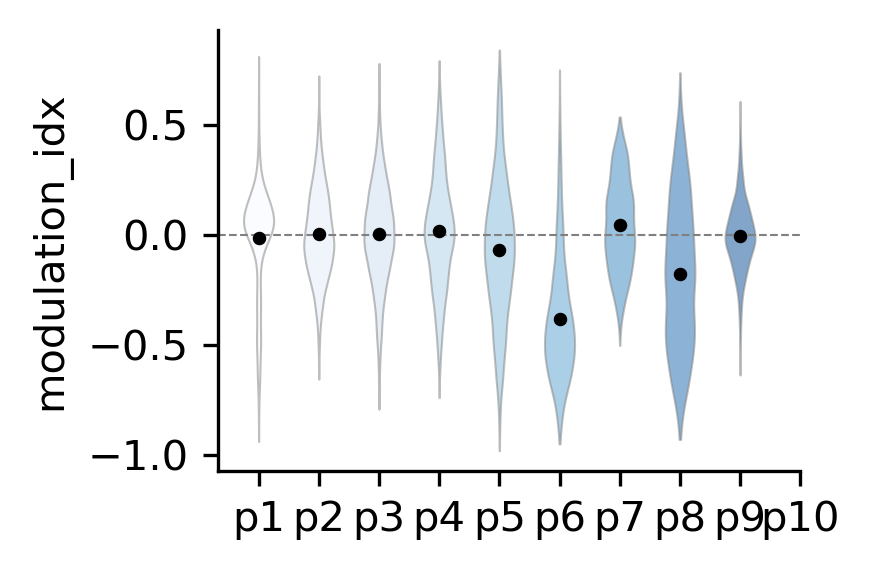

In [80]:
import matplotlib.pyplot as plt
import numpy as np
import re
from matplotlib.cm import viridis

def plot_modulation_idx_per_age_combined(combined_df, col_name='modulation_idx_active_rest', dpi=300):
    # --- Ages and colors ---
    unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', str(x)).group(0)))
    age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]

    fig, ax = plt.subplots(1, 1, figsize=(3,2), dpi=300)

    for i, age in enumerate(unique_ages):
        age_df = combined_df[combined_df['age'] == age]
        vals = age_df[col_name].values

        # Flatten values: handle floats or arrays
        flat_vals = []
        for v in vals:
            if isinstance(v, (list, np.ndarray)):
                flat_vals.extend(np.ravel(v))
            elif isinstance(v, (int, float)) and np.isfinite(v):
                flat_vals.append(v)

        if len(flat_vals) > 0:
            parts = ax.violinplot([flat_vals], positions=[i], widths=0.5,
                                  showmeans=False, showextrema=False, showmedians=False)
            for pc in parts['bodies']:
                pc.set_facecolor(age_colors[i])
                pc.set_edgecolor('grey')
                pc.set_alpha(0.5)
                pc.set_linewidth(0.5)
            ax.scatter(i, np.nanmean(flat_vals), color='black', s=5, zorder=3)

    ax.set_xticks(range(len(unique_ages)))
    ax.set_xticklabels(unique_ages)
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.set_ylabel('modulation_idx')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    plt.tight_layout()
    plt.show()

# Example usage
plot_modulation_idx_per_age_combined(combined_df)


In [312]:
import matplotlib.pyplot as plt
import numpy as np
import re

def plot_behavior_coupling(combined_df, dpi=300):
    """
    Plot modulation index per age.
    GABA (red) and EMX (green) for P0-P5.
    Dual Imaging (green/red) after P5 if columns exist.
    If GABA exists after P5, plot as red on left.
    Skips plotting if column does not exist.
    """
    
    unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', str(x)).group(0)))
    
    fig, ax = plt.subplots(1, 1, figsize=(4,2.5), dpi=dpi)
    width = 0.3
    offset = 0.15

    for i, age in enumerate(unique_ages):
        age_num = int(re.search(r'\d+', str(age)).group(0))
        age_df = combined_df[combined_df['age'] == age]

        # --- P0-P5: GABA and EMX ---
        if age_num <= 5:
            # GABA
            if 'modulation_idx_active_rest' in age_df.columns:
                gaba_vals = age_df.loc[age_df['group']=='GABA', 'modulation_idx_active_rest']
                gaba_flat = []
                for v in gaba_vals:
                    if isinstance(v, (list, np.ndarray)):
                        gaba_flat.extend(np.ravel(v))
                    elif np.isfinite(v):
                        gaba_flat.append(v)
                gaba_flat = np.array(gaba_flat)
                if gaba_flat.size > 0:
                    parts = ax.violinplot([gaba_flat], positions=[i - offset], widths=width,
                                          showmeans=False, showextrema=False, showmedians=False)
                    for pc in parts['bodies']:
                        pc.set_facecolor('red')
                        pc.set_edgecolor('grey')
                        pc.set_alpha(0.5)
                        pc.set_linewidth(0.5)
                    ax.scatter(i - offset, np.nanmean(gaba_flat), color='black', s=5, zorder=3)

            # EMX
            if 'modulation_idx_active_rest' in age_df.columns:
                emx_vals = age_df.loc[age_df['group']=='EMX', 'modulation_idx_active_rest']
                emx_flat = []
                for v in emx_vals:
                    if isinstance(v, (list, np.ndarray)):
                        emx_flat.extend(np.ravel(v))
                    elif np.isfinite(v):
                        emx_flat.append(v)
                emx_flat = np.array(emx_flat)
                if emx_flat.size > 0:
                    parts = ax.violinplot([emx_flat], positions=[i + offset], widths=width,
                                          showmeans=False, showextrema=False, showmedians=False)
                    for pc in parts['bodies']:
                        pc.set_facecolor('green')
                        pc.set_edgecolor('grey')
                        pc.set_alpha(0.5)
                        pc.set_linewidth(0.5)
                    ax.scatter(i + offset, np.nanmean(emx_flat), color='black', s=5, zorder=3)

        # --- P6 and above: Dual Imaging and/or GABA ---
        else:
            # Check for GABA cells
            if 'modulation_idx_active_rest' in age_df.columns:
                gaba_vals = age_df.loc[age_df['group']=='GABA', 'modulation_idx_active_rest']
                gaba_flat = []
                for v in gaba_vals:
                    if isinstance(v, (list, np.ndarray)):
                        gaba_flat.extend(np.ravel(v))
                    elif np.isfinite(v):
                        gaba_flat.append(v)
                gaba_flat = np.array(gaba_flat)
                if gaba_flat.size > 0:
                    parts = ax.violinplot([gaba_flat], positions=[i - offset], widths=width,
                                          showmeans=False, showextrema=False, showmedians=False)
                    for pc in parts['bodies']:
                        pc.set_facecolor('red')
                        pc.set_edgecolor('grey')
                        pc.set_alpha(0.5)
                        pc.set_linewidth(0.5)
                    ax.scatter(i - offset, np.nanmean(gaba_flat), color='black', s=5, zorder=3)

            # Dual Imaging cells
            dual_df = age_df[age_df['group'] == 'Dual Imaging']

            # Green cells
            if 'modulation_idx_active_rest_greencell' in dual_df.columns:
                green_vals = dual_df['modulation_idx_active_rest_greencell']
                green_flat = []
                for v in green_vals:
                    if isinstance(v, (list, np.ndarray)):
                        green_flat.extend(np.ravel(v))
                    elif np.isfinite(v):
                        green_flat.append(v)
                green_flat = np.array(green_flat)
                if green_flat.size > 0:
                    parts = ax.violinplot([green_flat], positions=[i - offset], widths=width,
                                          showmeans=False, showextrema=False, showmedians=False)
                    for pc in parts['bodies']:
                        pc.set_facecolor('green')
                        pc.set_edgecolor('grey')
                        pc.set_alpha(0.5)
                        pc.set_linewidth(0.5)
                    ax.scatter(i - offset, np.nanmean(green_flat), color='black', s=5, zorder=3)

            # Red cells
            if 'modulation_idx_active_rest_redcell' in dual_df.columns:
                red_vals = dual_df['modulation_idx_active_rest_redcell']
                red_flat = []
                for v in red_vals:
                    if isinstance(v, (list, np.ndarray)):
                        red_flat.extend(np.ravel(v))
                    elif np.isfinite(v):
                        red_flat.append(v)
                red_flat = np.array(red_flat)
                if red_flat.size > 0:
                    parts = ax.violinplot([red_flat], positions=[i + offset], widths=width,
                                          showmeans=False, showextrema=False, showmedians=False)
                    for pc in parts['bodies']:
                        pc.set_facecolor('red')
                        pc.set_edgecolor('grey')
                        pc.set_alpha(0.5)
                        pc.set_linewidth(0.5)
                    ax.scatter(i + offset, np.nanmean(red_flat), color='black', s=5, zorder=3)

    # --- Axis formatting ---
    ax.set_xticks(range(len(unique_ages)))
    ax.set_xticklabels(unique_ages)
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.set_ylabel('modulation_idx')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.ylim(-1, 1)
    plt.tight_layout()
    plt.show()


TypeError: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

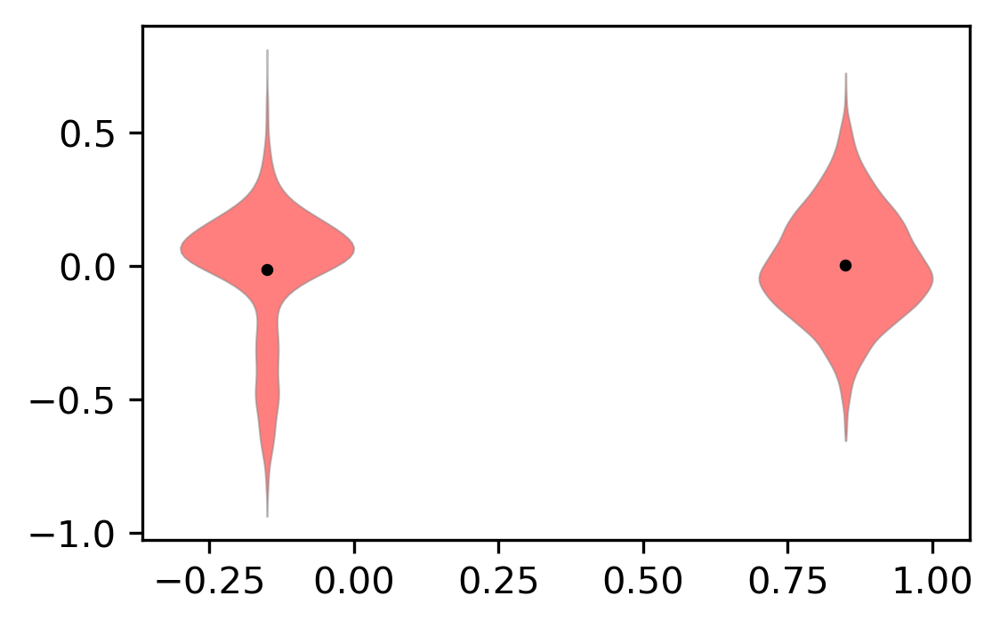

In [313]:
plot_behavior_coupling(combined_df)

In [314]:
import matplotlib.pyplot as plt
import numpy as np
import re
from matplotlib.cm import Blues

def plot_modulation_idx_per_age_colored_points(combined_df, col_name='modulation_idx_active_rest', dpi=300):
    """
    Violin plot of modulation index per age, with points color-coded by neuron type:
    - Red = GABA
    - Green = EMX / Dual Imaging
    """

    # --- Ages and colors for violins ---
    unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', str(x)).group(0)))
    age_colors = [Blues(i / max(1, len(unique_ages) - 1)) for i in range(len(unique_ages))]

    fig, ax = plt.subplots(1, 1, figsize=(4, 2.5), dpi=dpi)

    width = 0.3  # width of each violin
    offset = 0.15  # horizontal offset for groups

    for i, age in enumerate(unique_ages):
        age_df = combined_df[combined_df['age'] == age]

        # --- Flatten all values for the violin ---
        all_vals = []
        for v in age_df[col_name]:
            if isinstance(v, (list, np.ndarray)):
                all_vals.extend(np.ravel(v))
            elif np.isfinite(v):
                all_vals.append(v)
        all_vals = np.array(all_vals)
        if all_vals.size > 0:
            # Draw violin
            parts = ax.violinplot([all_vals], positions=[i], widths=width,
                                  showmeans=False, showextrema=False, showmedians=False)
            for pc in parts['bodies']:
                pc.set_facecolor(age_colors[i])
                pc.set_edgecolor('grey')
                pc.set_alpha(0.5)
                pc.set_linewidth(0.5)
            # mean of all neurons
            ax.scatter(i, np.nanmean(all_vals), color='black', s=6, zorder=3)

        # --- Overlay points color-coded by type ---
        # GABA
        gaba_vals = []
        gaba_df = age_df[age_df['group'] == 'GABA']
        for v in gaba_df[col_name]:
            if isinstance(v, (list, np.ndarray)):
                gaba_vals.extend(np.ravel(v))
            elif np.isfinite(v):
                gaba_vals.append(v)
        gaba_vals = np.array(gaba_vals)
        if gaba_vals.size > 0:
            jitter = (np.random.rand(len(gaba_vals)) - 0.5) * width
            ax.scatter(np.full_like(gaba_vals, i) + jitter, gaba_vals,
                       color='red', s=5, alpha=0.7, label='GABA' if i == 0 else "")

        # EMX or Dual Imaging
        emx_vals = []
        emx_df = age_df[(age_df['group'] == 'EMX') | (age_df['group'] == 'Dual Imaging')]
        for v in emx_df[col_name]:
            if isinstance(v, (list, np.ndarray)):
                emx_vals.extend(np.ravel(v))
            elif np.isfinite(v):
                emx_vals.append(v)
        emx_vals = np.array(emx_vals)
        if emx_vals.size > 0:
            jitter = (np.random.rand(len(emx_vals)) - 0.5) * width
            ax.scatter(np.full_like(emx_vals, i) + jitter, emx_vals,
                       color='green', s=5, alpha=0.7, label='EMX/Dual' if i == 0 else "")

    # --- Axis formatting ---
    ax.set_xticks(range(len(unique_ages)))
    ax.set_xticklabels(unique_ages)
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.set_ylabel(f'{col_name} per age')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Legend
    handles, labels = ax.get_legend_handles_labels()
    if labels:
        ax.legend(frameon=False, markerscale=1.5, loc='upper right')

    plt.tight_layout()
    plt.show()


TypeError: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

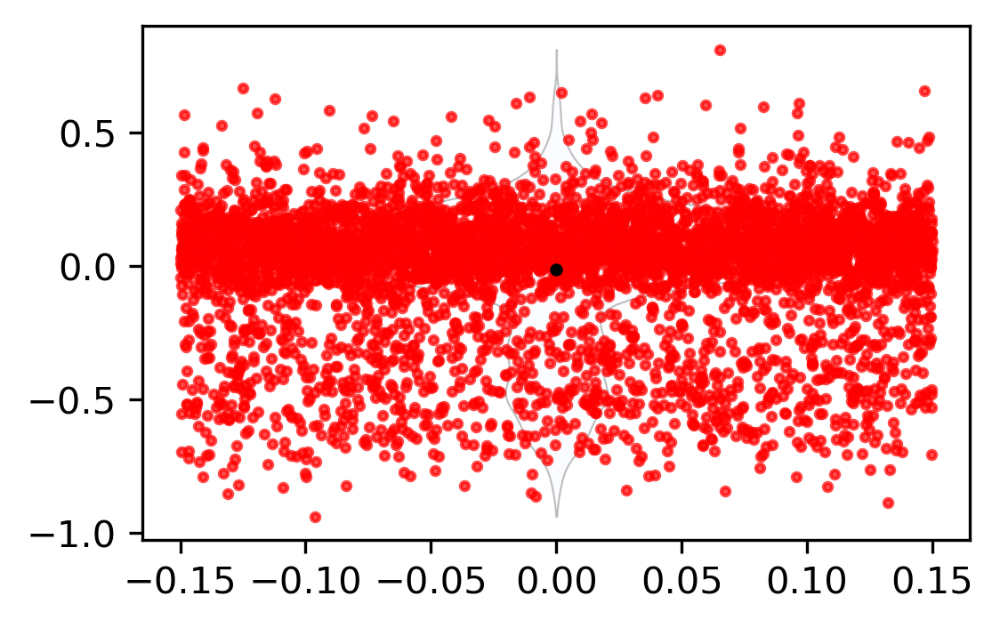

In [333]:
plot_modulation_idx_per_age_colored_points(combined_df, col_name='modulation_idx_active_rest', dpi=300)

In [81]:
import matplotlib.pyplot as plt
import numpy as np
import re
from matplotlib.cm import Blues

def plot_modulation_idx_abs_per_age(combined_df, col_name='modulation_idx_active_rest', dpi=300):
    """
    Plots absolute modulation indices across ages, splitting by cell type:
        - Red: GABA
        - Green: EMX / dual imaging green cells
    Violins are offset left/right per age.
    """

    unique_ages = sorted(combined_df['age'].unique(), key=lambda x: int(re.search(r'\d+', str(x)).group(0)))

    fig, ax = plt.subplots(1, 1, figsize=(3, 1.5), dpi=dpi)
    width = 0.3
    offset = 0.15

    for i, age in enumerate(unique_ages):
        age_df = combined_df[combined_df['age'] == age]

        # --- GABA / Red ---
        gaba_df = age_df[age_df['type'].str.contains('GABA', case=False, na=False)]
        if not gaba_df.empty:
            gaba_vals = [np.ravel(v) for v in gaba_df[col_name] if len(v) > 0]
            if len(gaba_vals) > 0:
                gaba_flat = np.abs(np.concatenate(gaba_vals))
                parts = ax.violinplot([gaba_flat], positions=[i - offset], widths=width,
                                      showmeans=False, showextrema=False, showmedians=False)
                for pc in parts['bodies']:
                    pc.set_facecolor('red')
                    pc.set_edgecolor('grey')
                    pc.set_alpha(0.5)
                    pc.set_linewidth(0.5)
                ax.scatter(i - offset, np.nanmean(gaba_flat), color='black', s=5, zorder=3)

        # --- EMX / Green ---
        emx_df = age_df[(age_df['type'].str.contains('EMX', case=False, na=False)) |
                        (age_df['type'].str.contains('Dual', case=False, na=False))]
        if not emx_df.empty:
            emx_vals = [np.ravel(v) for v in emx_df[col_name] if len(v) > 0]
            if len(emx_vals) > 0:
                emx_flat = np.abs(np.concatenate(emx_vals))
                parts = ax.violinplot([emx_flat], positions=[i + offset], widths=width,
                                      showmeans=False, showextrema=False, showmedians=False)
                for pc in parts['bodies']:
                    pc.set_facecolor('green')
                    pc.set_edgecolor('grey')
                    pc.set_alpha(0.5)
                    pc.set_linewidth(0.5)
                ax.scatter(i + offset, np.nanmean(emx_flat), color='black', s=5, zorder=3)

    # --- Axis formatting ---
    ax.set_xticks(range(len(unique_ages)))
    ax.set_xticklabels(unique_ages)
    ax.axhline(0, linestyle='--', color='grey', lw=0.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_ylabel(f'{col_name} (abs)')
    ax.set_ylim(0, 1)  # absolute values are positive

    plt.tight_layout()
    plt.show()


KeyError: 'type'

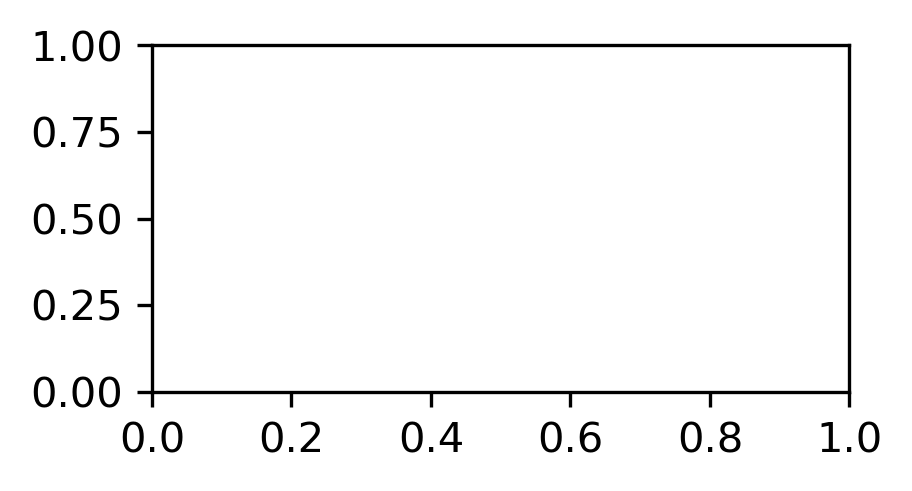

In [82]:
plot_modulation_idx_abs_per_age(combined_df)


In [ ]:
# dimensionality 

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import re

# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

# Example data structure: group_age_dims[group][age] = list of values
# group_age_dims = {'Dual Imaging': {...}, 'GABA': {...}}  # as before

unique_ages_sorted = sorted(unique_ages, key=extract_age_num)
n_ages = len(unique_ages_sorted)
bar_width = 0.4
x = np.arange(n_ages)

# Color palette based on age
age_colors = [cm.viridis(i / max(1, n_ages-1)) for i in range(n_ages)]

fig, ax = plt.subplots(figsize=(8,5), dpi=300)

for grp in ['Dual Imaging', 'GABA']:
    means = []
    sems = []
    colors = []
    for i, age in enumerate(unique_ages_sorted):
        vals = group_age_dims[grp].get(age, [0])
        means.append(np.mean(vals))
        sems.append(np.std(vals)/np.sqrt(len(vals)))
        colors.append(age_colors[i])
    
    offset = -bar_width/2 if grp=='Dual Imaging' else bar_width/2
    ax.bar(x + offset, means, yerr=sems, width=bar_width, color=colors,
           ecolor='white', capsize=5, label=grp)

ax.set_xticks(x)
ax.set_xticklabels(unique_ages_sorted, fontsize=12)
ax.set_xlabel("Age", fontsize=14)
ax.set_ylabel(f"# PCs (threshold)", fontsize=14)
ax.set_title("Dimensionality per Age", fontsize=16)
ax.legend(frameon=False)
plt.tight_layout()
plt.show()


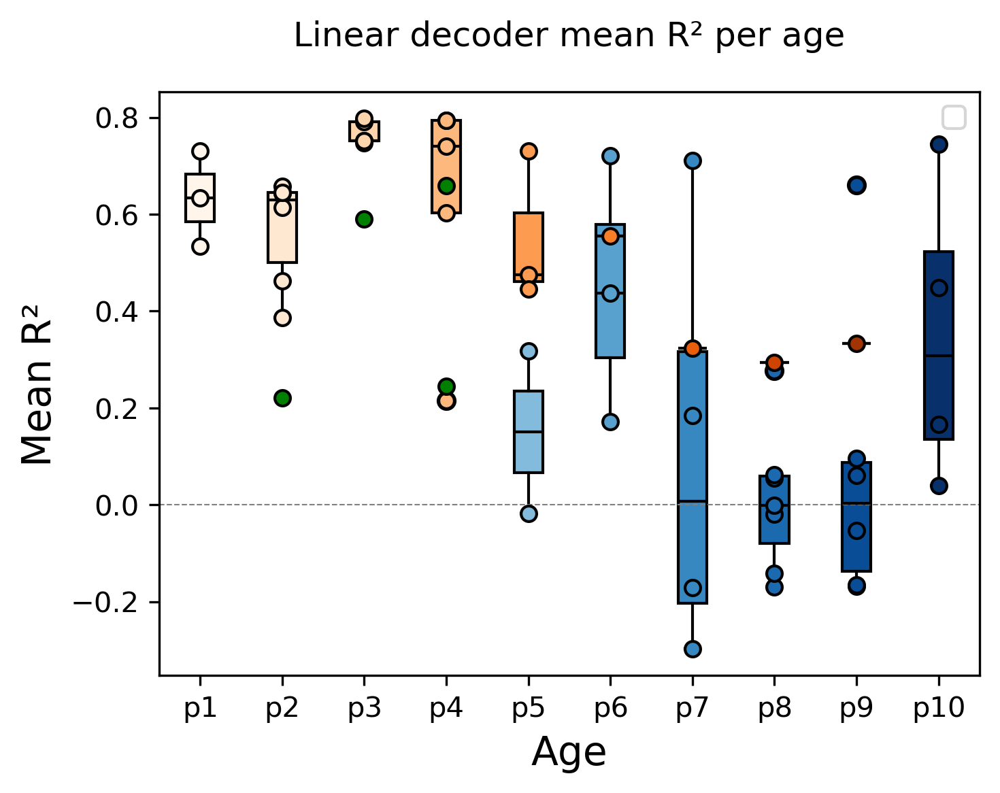

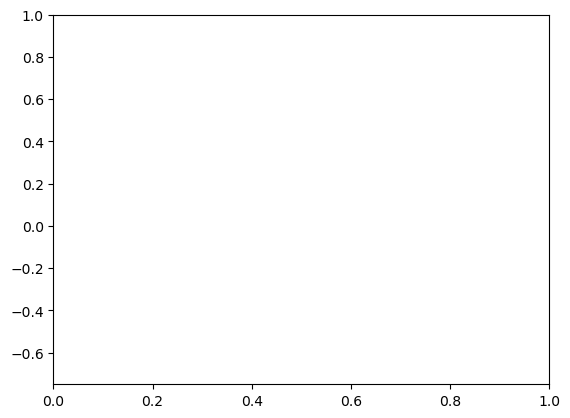

In [83]:
import matplotlib.pyplot as plt
import numpy as np
import re

# Colors
green_color = 'green'

# --- Linear Decoder R² (all ages for GABA) ---
plt.figure(figsize=(5, 4), dpi=300)
width = 0.35
offset = 0

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (all ages)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2blue[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                    color=age2blue[age], edgecolor='black', s=30, zorder=3)
    
    # GABA (all ages now)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2orange[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                    color=age2orange[age], edgecolor='black', s=30, zorder=3)
    
    # EMX (all ages)
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        plt.scatter(np.full(len(emx_data), i), emx_data,
                    color=green_color, edgecolor='black', s=30, zorder=3, label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages)
plt.ylabel('Mean R²', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Linear decoder mean R² per age', y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.legend()
plt.tight_layout()
plt.show()

# # --- Logistic Decoder F1 Score (all ages for GABA) ---
# plt.figure(figsize=(8, 6), dpi=300)

# for i, age in enumerate(unique_ages):
#     age_data = combined_df[combined_df['age'] == age]
    
#     # Dual Imaging (all ages)
#     dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_score_logistic']
#     if len(dual_data) > 0:
#         plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
#                     boxprops=dict(facecolor=age2blue[age], color='black'),
#                     medianprops=dict(color='black'))
#         plt.scatter(np.full(len(dual_data), i - offset), dual_data,
#                     color=age2blue[age], edgecolor='black', s=60, zorder=3)
    
    # GABA (all ages)
#     gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
#     if len(gaba_data) > 0:
#         plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
#                     boxprops=dict(facecolor=age2orange[age], color='black'),
#                     medianprops=dict(color='black'))
#         plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
#                     color=age2orange[age], edgecolor='black', s=60, zorder=3)
    
#     # EMX (all ages)
#     emx_data = age_data[age_data['group'] == 'EMX']['f1_score_logistic']
#     if len(emx_data) > 0:
#         plt.scatter(np.full(len(emx_data), i), emx_data,
#                     color=green_color, edgecolor='black', s=60, zorder=3, label='EMX' if i==0 else "")

# plt.xticks(range(len(unique_ages)), unique_ages, rotation=45, fontsize=11)
# plt.ylabel('F1 Score (Logistic Decoder)', fontsize=14)
# plt.xlabel('Age', fontsize=14)
# plt.title('Logistic decoder F1 per age', fontsize=16, y=1.05)
# plt.axhline(0, linestyle='--', color='grey', lw=0.5)
# plt.legend()
plt.ylim(-0.75,1)
plt.show()


ValueError: List of boxplot statistics and `positions` values must have same the length

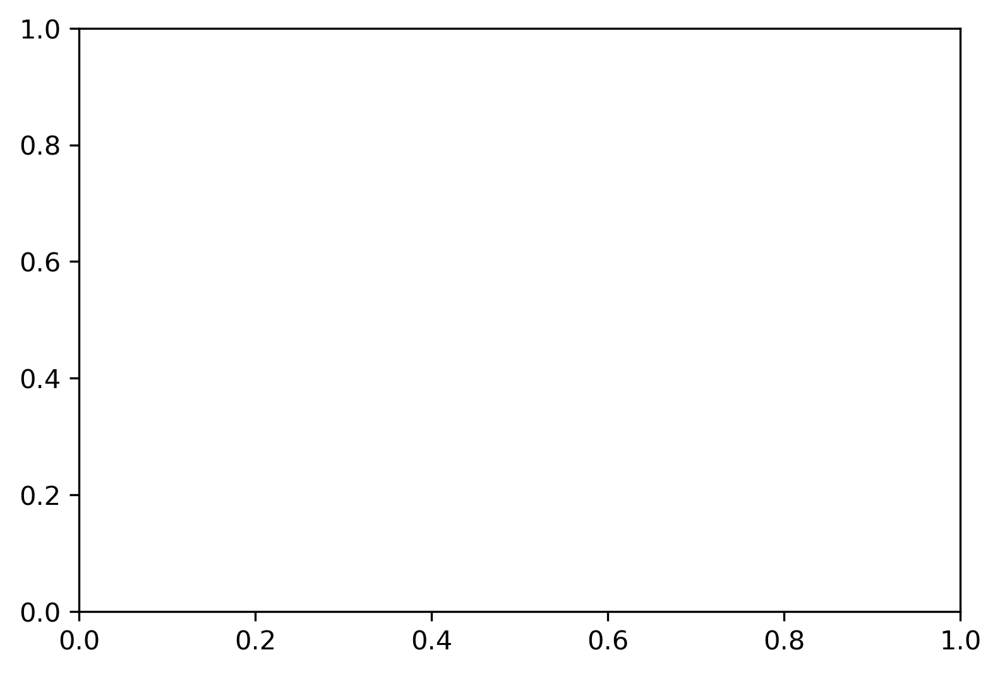

In [84]:
## popcouploc
plt.figure(figsize=(6,4), dpi=300)
width = 0.35
offset = 0

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['popcouploc']
    if len(dual_data) > 0:
        plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor='blue', color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                    color='blue', edgecolor='black', s=30, zorder=3)
    
    # GABA
    gaba_data = age_data[age_data['group'] == 'GABA']['popcouploc']
    if len(gaba_data) > 0:
        plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor='blue', color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                    color='blue', edgecolor='black', s=30, zorder=3)
    
    # EMX
    emx_data = age_data[age_data['group'] == 'EMX']['popcouploc']
    if len(emx_data) > 0:
        plt.scatter(np.full(len(emx_data), i), emx_data,
                    color='blue', edgecolor='black', s=30, zorder=3)

plt.xticks(range(len(unique_ages)), unique_ages)
plt.ylabel('Population Coupling (popcouploc)')
plt.xlabel('Age')
plt.title('Population Coupling Across Ages')
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.tight_layout()
plt.show()

In [ ]:
plot_popcouploc_by_age(plot_df)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import re
from matplotlib.patches import Patch

# Colors
green_color = 'green'

# --- Linear Decoder R² (all ages for GABA) ---
plt.figure(figsize=(6, 4), dpi=300)
width = 0.35
offset = 0.25  # small offset for Dual Imaging

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (all ages) - slightly left
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2blue[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                    color=age2blue[age], edgecolor='black', s=30, alpha=0.7, zorder=3)
    
    # GABA (all ages) - centered
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        plt.boxplot(gaba_data, positions=[i], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2orange[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(gaba_data), i), gaba_data,
                    color=age2orange[age], edgecolor='black', s=30, alpha=0.7, zorder=3)
    
    # EMX (all ages) - centered
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        plt.scatter(np.full(len(emx_data), i), emx_data,
                    color=green_color, edgecolor='black', s=30, alpha=0.7, zorder=3)

# Axis labels and title
plt.xticks(range(len(unique_ages)), unique_ages)
plt.ylabel('Mean R²')
plt.xlabel('Age')
plt.title('Linear decoder mean R² per age', y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)

# Custom legend
# legend_handles = [
#     Patch(color='red', label='I (GABA)'),
#     Patch(color='blue', label='E/I dual (Dual Imaging)'),
#     Patch(color=green_color, label='E (EMX)')
# ]
# plt.legend(handles=legend_handles, loc='upper right', frameon=False, fontsize=10, bbox_to_anchor=(1.22,1.1))

plt.ylim(-0.75, 1)
plt.tight_layout()
plt.show()


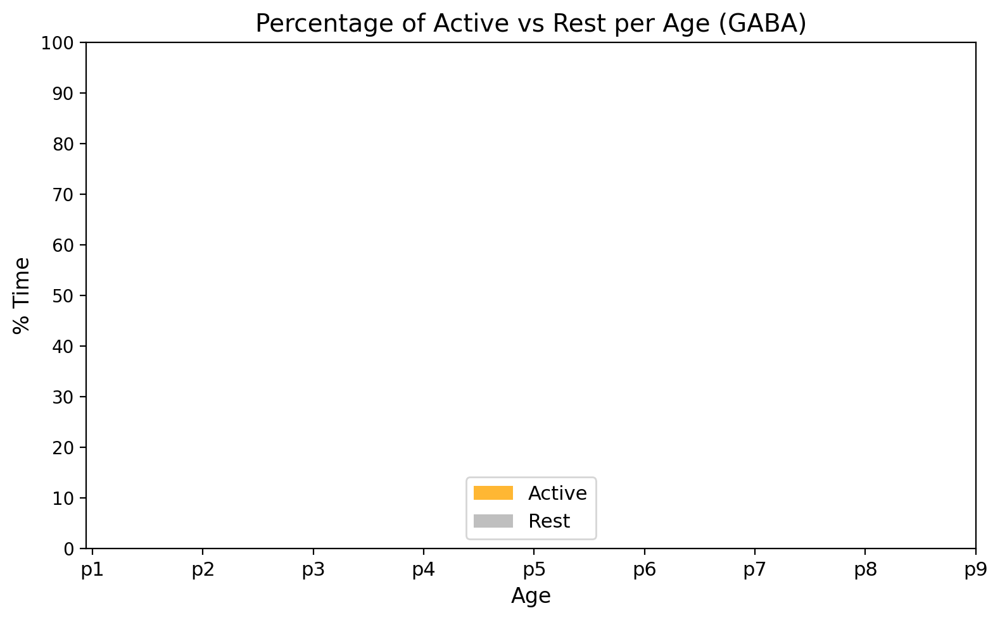

In [85]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Use your combined plot dataframe
gaba_df = all_plot_df[all_plot_df['group'] == 'GABA'].copy()

# Compute rest percentage
gaba_df['rest_percentage'] = 100 - gaba_df['active_percentage']

# Aggregate by age
age_groups = gaba_df.groupby('age')[['active_percentage', 'rest_percentage']].mean()
age_sem = gaba_df.groupby('age')[['active_percentage', 'rest_percentage']].sem()  # SEM

# Plot
fig, ax = plt.subplots(figsize=(8,5), dpi=200)

ages = age_groups.index
bar_width = 0.4

# Active bars
ax.bar(ages, age_groups['active_percentage'], yerr=age_sem['active_percentage'],
       color='orange', label='Active', width=bar_width, alpha=0.8, capsize=4)

# Rest bars (stacked)
ax.bar(ages, age_groups['rest_percentage'], bottom=age_groups['active_percentage'],
       yerr=age_sem['rest_percentage'], color='grey', label='Rest', width=bar_width,
       alpha=0.5, capsize=4)

ax.set_ylabel('% Time', fontsize=12)
ax.set_xlabel('Age', fontsize=12)
ax.set_title('Percentage of Active vs Rest per Age (GABA)', fontsize=14)
ax.set_xticks(range(len(ages)))
ax.set_xticklabels(ages, fontsize=11)
ax.set_yticks(np.arange(0, 110, 10))
ax.legend(fontsize=11)
plt.tight_layout()
plt.show()


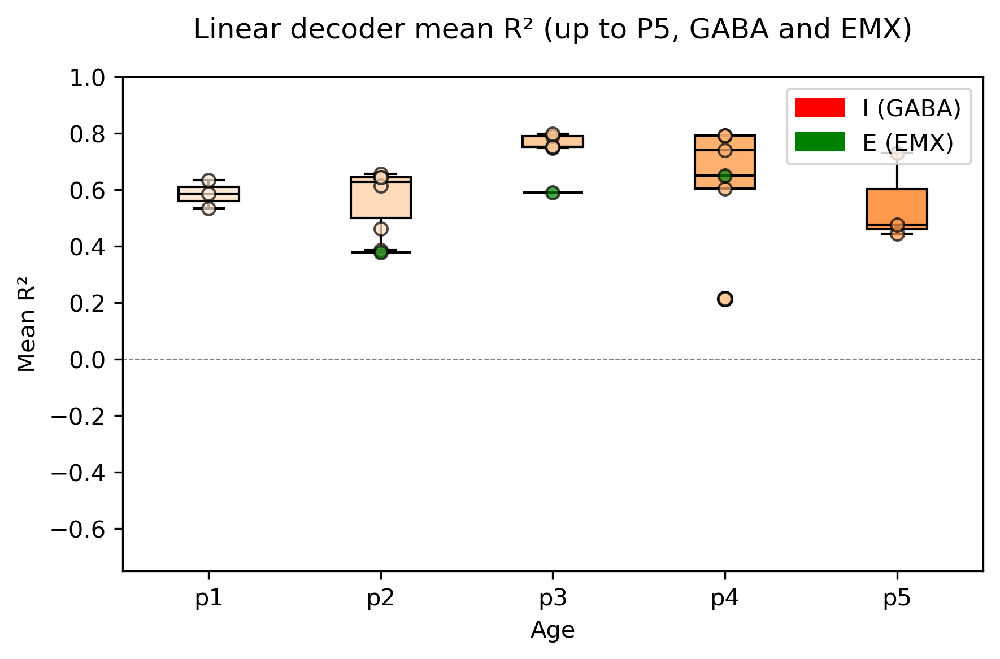

In [65]:
import matplotlib.pyplot as plt
import numpy as np
import re
from matplotlib.patches import Patch

# Colors
green_color = 'green'
width = 0.35
offset = 0  # no offset needed since no Dual Imaging

# Ages up to P5
ages_to_plot = [age for age in unique_ages if int(re.search(r'\d+', age).group(0)) <= 5]

# --- Linear Decoder R² (up to P5, only GABA and EMX) ---
plt.figure(figsize=(6, 4), dpi=300)

for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]
    
    # GABA (I)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        plt.boxplot(gaba_data, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2orange[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(gaba_data), i - offset), gaba_data,
                    color=age2orange[age], edgecolor='black', s=30, alpha=0.7, zorder=3)
    
    # EMX (E)
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        plt.boxplot(emx_data, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=green_color, color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(emx_data), i + offset), emx_data,
                    color=green_color, edgecolor='black', s=30, alpha=0.7, zorder=3)

# Axis labels and title
plt.xticks(range(len(ages_to_plot)), ages_to_plot)
plt.ylabel('Mean R²')
plt.xlabel('Age')
plt.title('Linear decoder mean R² (up to P5, GABA and EMX)', y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)

# Legend
legend_handles = [
    Patch(color='red', label='I (GABA)'),
    Patch(color=green_color, label='E (EMX)')
]
plt.legend(handles=legend_handles, loc='upper right', frameon=True, fontsize=10)

plt.ylim(-0.75, 1)
plt.tight_layout()
plt.show()


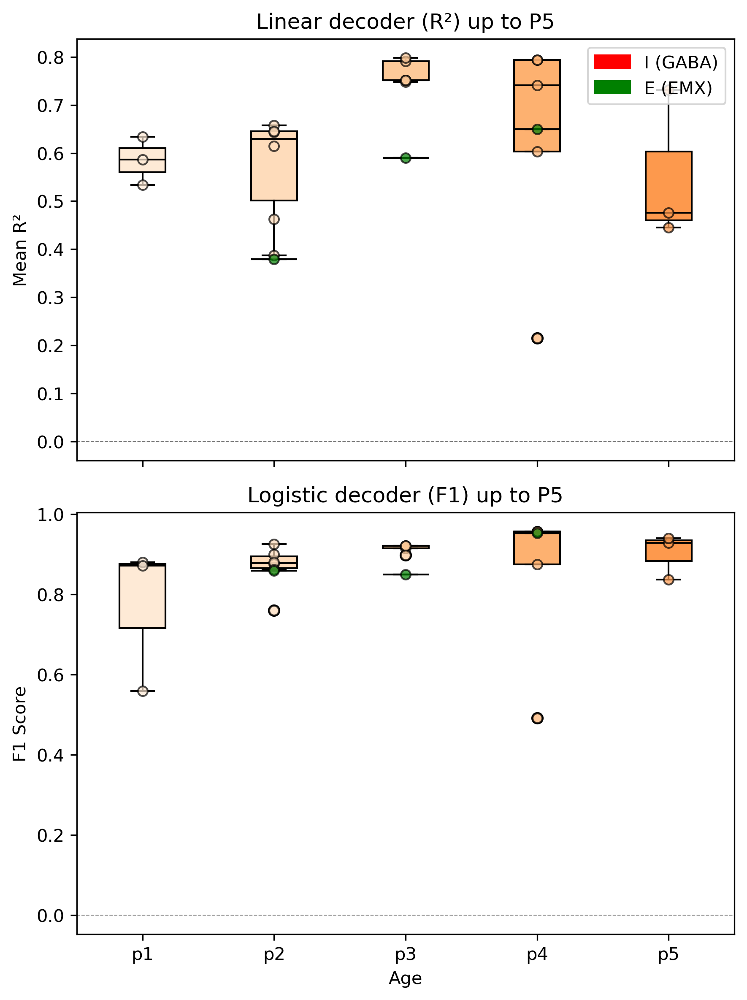

In [66]:
import matplotlib.pyplot as plt
import numpy as np
import re
from matplotlib.patches import Patch

# Colors
green_color = 'green'
width = 0.35
offset = 0  # no offset needed since no Dual Imaging

# Ages up to P5
ages_to_plot = [age for age in unique_ages if int(re.search(r'\d+', age).group(0)) <= 5]

fig, axes = plt.subplots(2, 1, figsize=(6, 8), dpi=300, sharex=True)

# --- Top: Linear Decoder R² ---
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]
    
    # GABA (I)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        axes[0].boxplot(gaba_data, positions=[i - offset], widths=width, patch_artist=True,
                        boxprops=dict(facecolor=age2orange[age], color='black'),
                        medianprops=dict(color='black'))
        axes[0].scatter(np.full(len(gaba_data), i - offset), gaba_data,
                        color=age2orange[age], edgecolor='black', s=30, alpha=0.7, zorder=3)
    
    # EMX (E)
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        axes[0].boxplot(emx_data, positions=[i + offset], widths=width, patch_artist=True,
                        boxprops=dict(facecolor=green_color, color='black'),
                        medianprops=dict(color='black'))
        axes[0].scatter(np.full(len(emx_data), i + offset), emx_data,
                        color=green_color, edgecolor='black', s=30, alpha=0.7, zorder=3)

axes[0].set_ylabel('Mean R²')
axes[0].axhline(0, linestyle='--', color='grey', lw=0.5)
axes[0].set_title('Linear decoder (R²) up to P5')

# --- Bottom: Logistic Decoder F1 ---
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]
    
    # GABA (I)
    gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_data) > 0:
        axes[1].boxplot(gaba_data, positions=[i - offset], widths=width, patch_artist=True,
                        boxprops=dict(facecolor=age2orange[age], color='black'),
                        medianprops=dict(color='black'))
        axes[1].scatter(np.full(len(gaba_data), i - offset), gaba_data,
                        color=age2orange[age], edgecolor='black', s=30, alpha=0.7, zorder=3)
    
    # EMX (E)
    emx_data = age_data[age_data['group'] == 'EMX']['f1_score_logistic']
    if len(emx_data) > 0:
        axes[1].boxplot(emx_data, positions=[i + offset], widths=width, patch_artist=True,
                        boxprops=dict(facecolor=green_color, color='black'),
                        medianprops=dict(color='black'))
        axes[1].scatter(np.full(len(emx_data), i + offset), emx_data,
                        color=green_color, edgecolor='black', s=30, alpha=0.7, zorder=3)

axes[1].set_xticks(range(len(ages_to_plot)))
axes[1].set_xticklabels(ages_to_plot)
axes[1].set_xlabel('Age')
axes[1].set_ylabel('F1 Score')
axes[1].axhline(0, linestyle='--', color='grey', lw=0.5)
axes[1].set_title('Logistic decoder (F1) up to P5')

# Legend
legend_handles = [
    Patch(color='red', label='I (GABA)'),
    Patch(color=green_color, label='E (EMX)')
]
axes[0].legend(handles=legend_handles, loc='upper right', frameon=True, fontsize=10)

plt.tight_layout()
plt.show()


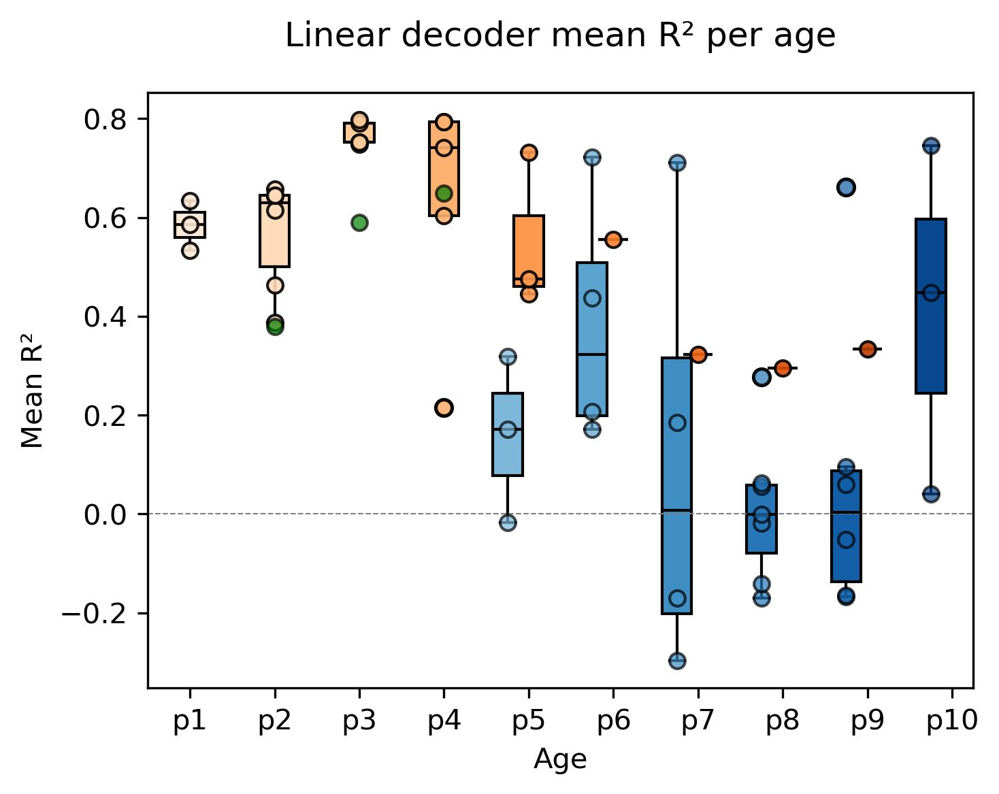

In [67]:
import matplotlib.pyplot as plt
import numpy as np
import re

# Colors
green_color = 'green'
width = 0.35
offset = 0.25  # small offset for Dual Imaging

# --- Linear Decoder R² (all ages for GABA) ---
plt.figure(figsize=(5, 4), dpi=300)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (all ages) - slightly left
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2blue[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                    color=age2blue[age], edgecolor='black', s=30, alpha=0.7, zorder=3)
    
    # GABA (all ages) - centered
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        plt.boxplot(gaba_data, positions=[i + 0], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2orange[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(gaba_data), i + 0), gaba_data,
                    color=age2orange[age], edgecolor='black', s=30, alpha=0.9, zorder=3)
    
    # EMX (all ages) - centered
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        plt.scatter(np.full(len(emx_data), i), emx_data,
                    color=green_color, edgecolor='black', s=30, alpha=0.7, zorder=3, label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages)
plt.ylabel('Mean R²')
plt.xlabel('Age')
plt.title('Linear decoder mean R² per age', y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
# plt.legend()
plt.tight_layout()
plt.show()


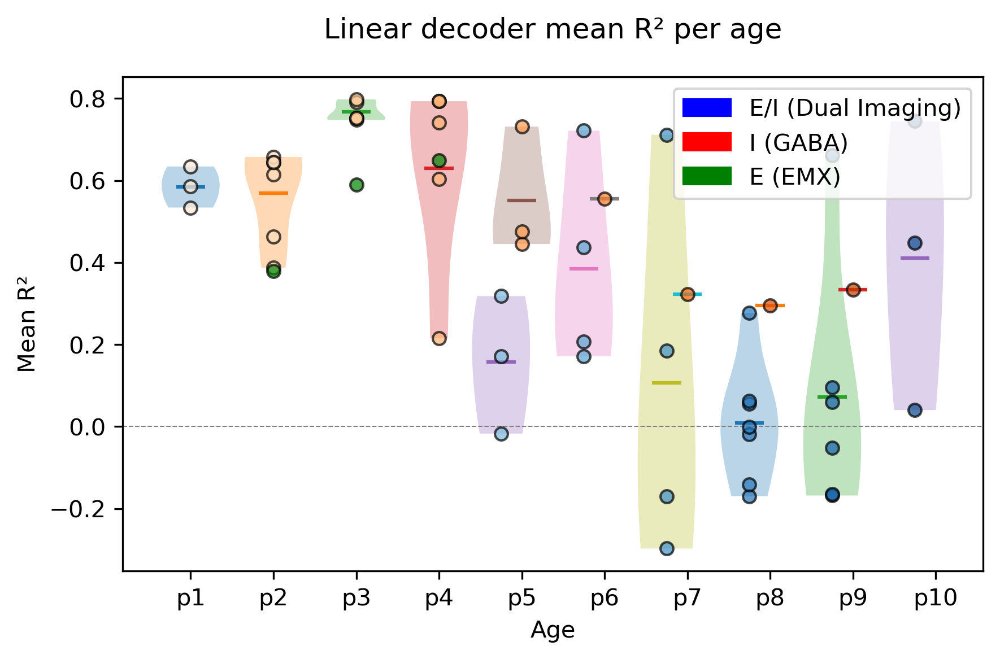

In [68]:
import matplotlib.pyplot as plt
import numpy as np

# Colors
green_color = 'green'
width = 0.7
offset = 0.25  # small offset for Dual Imaging

plt.figure(figsize=(6, 4), dpi=300)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (all ages) - slightly left
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        plt.violinplot(dual_data, positions=[i - offset], widths=width,
                       showmeans=True, showmedians=False, showextrema=False)
        plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                    color=age2blue[age], edgecolor='black', s=30, alpha=0.7, zorder=3)

    # GABA (all ages) - centered
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        plt.violinplot(gaba_data, positions=[i], widths=width,
                       showmeans=True, showmedians=False, showextrema=False)
        plt.scatter(np.full(len(gaba_data), i), gaba_data,
                    color=age2orange[age], edgecolor='black', s=30, alpha=0.7, zorder=3)

    # EMX (all ages) - centered
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        plt.scatter(np.full(len(emx_data), i), emx_data,
                    color=green_color, edgecolor='black', s=30, alpha=0.7, zorder=3)

# Axes formatting
plt.xticks(range(len(unique_ages)), unique_ages)
plt.ylabel('Mean R²')
plt.xlabel('Age')
plt.title('Linear decoder mean R² per age', y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)

# Legend
from matplotlib.patches import Patch
legend_handles = [
    Patch(color='blue', label='E/I (Dual Imaging)'),
    Patch(color='red', label='I (GABA)'),
    Patch(color='green', label='E (EMX)')
]
plt.legend(handles=legend_handles, loc='upper right', frameon=True, fontsize=10)

plt.tight_layout()
plt.show()

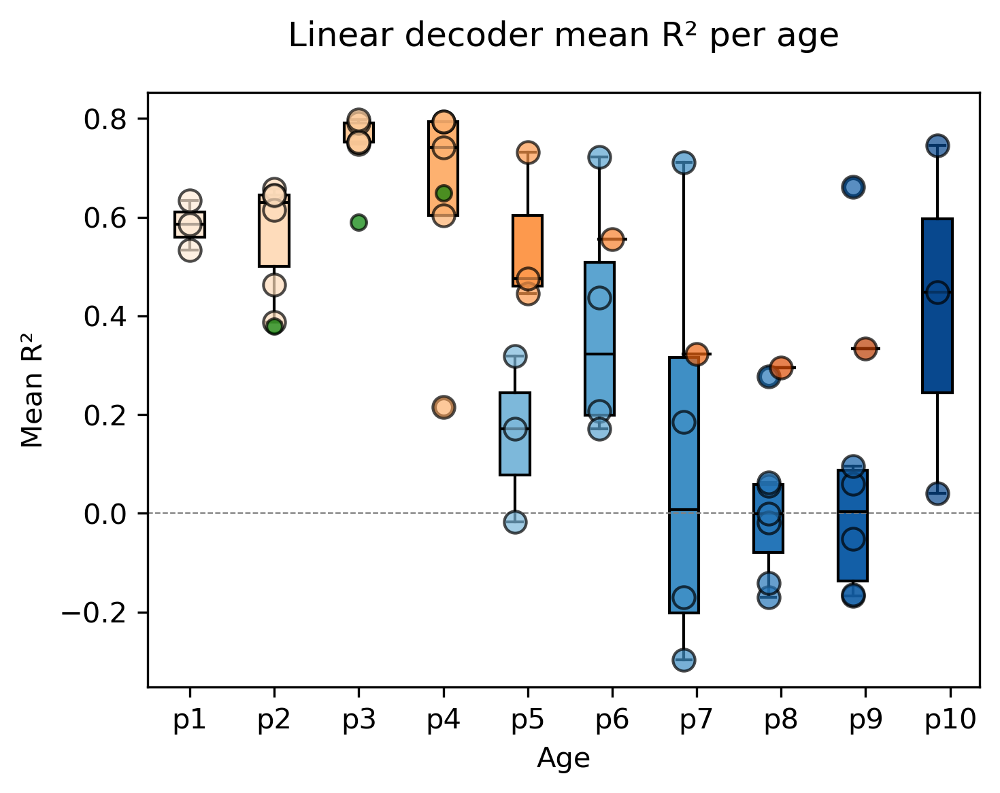

In [69]:
import matplotlib.pyplot as plt
import numpy as np
import re
from matplotlib.patches import Patch

# Colors
green_color = 'green'
width = 0.35
offset = 0.15  # small offset for Dual Imaging

# --- Linear Decoder R² (all ages for GABA) ---
plt.figure(figsize=(5, 4), dpi=300)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (all ages) - slightly left
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2blue[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                    color=age2blue[age], edgecolor='black', s=60, alpha=0.7, zorder=3)
    
    # GABA (all ages) - centered
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        plt.boxplot(gaba_data, positions=[i], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2orange[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(gaba_data), i), gaba_data,
                    color=age2orange[age], edgecolor='black', s=60, alpha=0.7, zorder=3)
    
    # EMX (all ages) - centered
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        plt.scatter(np.full(len(emx_data), i), emx_data,
                    color=green_color, edgecolor='black', s=30, alpha=0.7, zorder=3)

# X-axis and labels
plt.xticks(range(len(unique_ages)), unique_ages)
plt.ylabel('Mean R²')
plt.xlabel('Age')
plt.title('Linear decoder mean R² per age', y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)

# Legend
legend_handles = [
    Patch(color='red', label='I (GABA)'),
    Patch(color='blue', label='E/I (Dual Imaging)'),
    Patch(color='green', label='E (EMX)')
]
plt.legend(frameon=False, loc='upper right', fontsize=10)

plt.tight_layout()
plt.show()


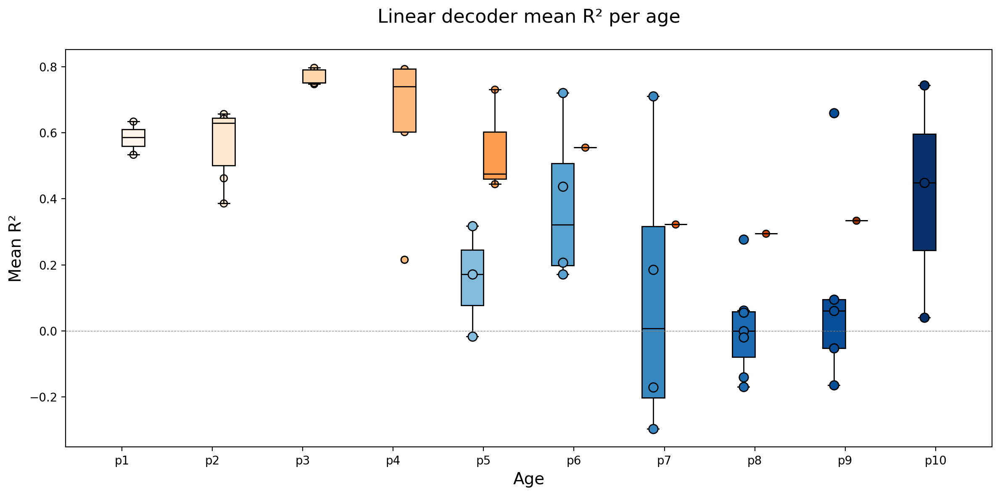

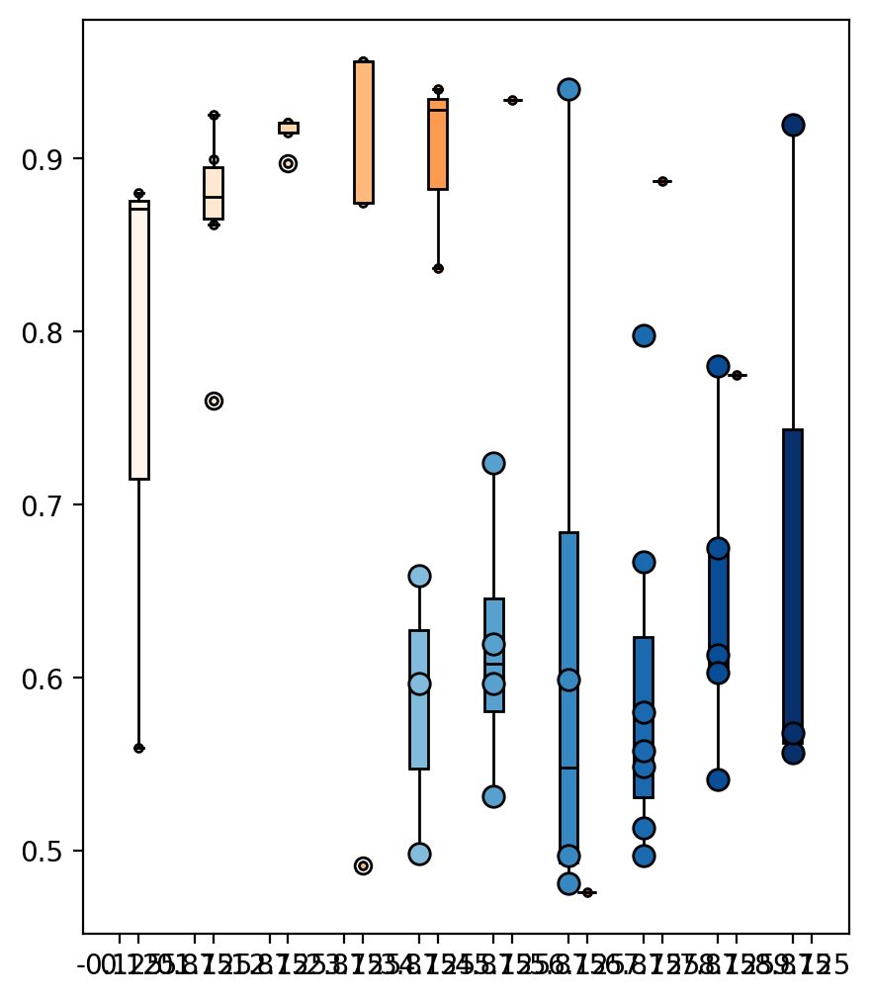

In [70]:
import re

# Copy and drop missing
combined_df = all_plot_df.copy()
combined_df = combined_df.dropna(subset=['r2_linear', 'f1_score_logistic'])

# Function to get numeric part of age for sorting
def extract_age_num(age_label):
    match = re.search(r'\d+', str(age_label))
    return int(match.group(0)) if match else -1

# Sorted ages
unique_ages = sorted(combined_df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormaps
blues = [cm.Blues(i / max(1, num_ages - 1)) for i in range(num_ages)]
oranges = [cm.Oranges(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2blue = dict(zip(unique_ages, blues))
age2orange = dict(zip(unique_ages, oranges))

# --- Plot Linear Decoder R² ---
plt.figure(figsize=(12, 6), dpi=200)
width = 0.25  # width of each boxplot
offset = width / 2

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2blue[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=age2blue[age], edgecolor='black', s=60, zorder=3)
    
    # GABA (orange)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2orange[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                color=age2orange[age], edgecolor='black')

plt.xticks(range(len(unique_ages)), unique_ages)
plt.ylabel('Mean R²', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Linear decoder mean R² per age', fontsize=16, y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.tight_layout()
plt.show()


# --- Plot Logistic Decoder F1 Score ---
plt.figure(figsize=(5, 6), dpi=200)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_score_logistic']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2blue[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=age2blue[age], edgecolor='black', s=60, zorder=3)
    
    # GABA (orange)
    gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2orange[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                color=age2orange[age], edgecolor='black', s=8)

In [71]:
# subplots mean r² , log 

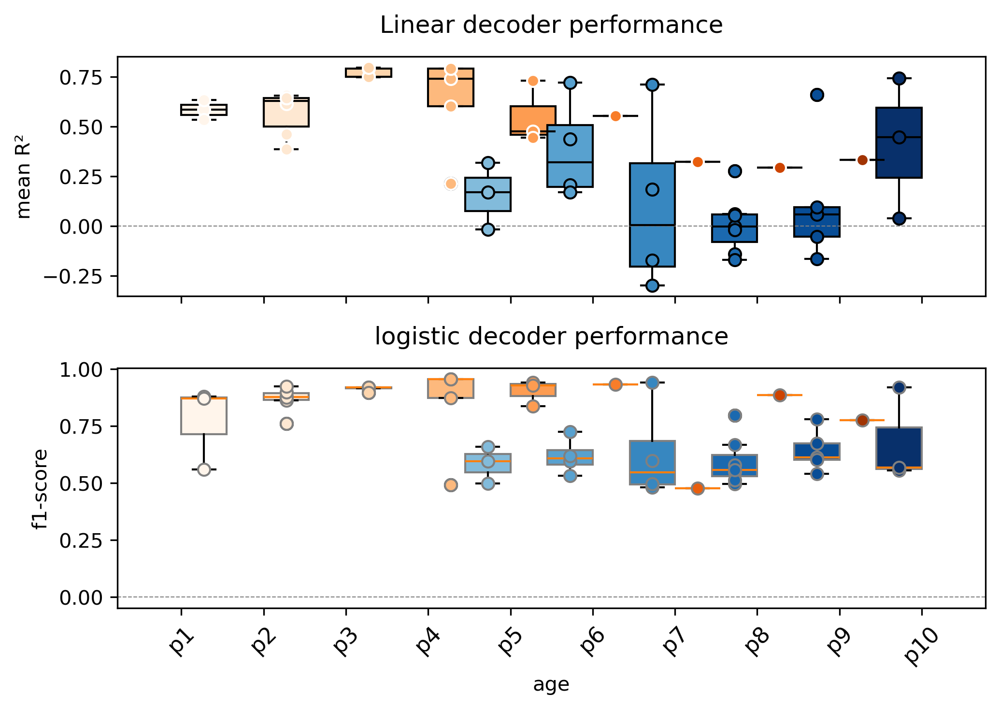

In [72]:
# Copy and drop missing
combined_df = all_plot_df.copy()
combined_df = combined_df.dropna(subset=['r2_linear', 'f1_score_logistic'])

# Function to get numeric part of age for sorting
def extract_age_num(age_label):
    match = re.search(r'\d+', str(age_label))
    return int(match.group(0)) if match else -1

# Sorted ages
unique_ages = sorted(combined_df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormaps
blues = [cm.Blues(i / max(1, num_ages - 1)) for i in range(num_ages)]
Reds = [cm.Oranges(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2blue = dict(zip(unique_ages, blues))
age2orange = dict(zip(unique_ages, oranges))

# Figure and subplots
fig, axes = plt.subplots(2, 1, figsize=(7, 5), dpi=300, sharex=True)
width = 0.55
offset = width / 2

# --- Linear Decoder R² ---
ax = axes[0]
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    ax.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
               boxprops=dict(facecolor=age2blue[age], color='black'),
               medianprops=dict(color='black'))
    ax.scatter(np.full(len(dual_data), i - offset), dual_data,
               color=age2blue[age], edgecolor='black',zorder=3)
    
    # GABA (orange)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    ax.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
               boxprops=dict(facecolor=age2orange[age], color='black'),
               medianprops=dict(color='black'))
    ax.scatter(np.full(len(gaba_data), i + offset), gaba_data,
               color=age2orange[age], edgecolor='white', zorder=3)

ax.set_ylabel('mean R²')
ax.set_title('Linear decoder performance', y=1.05)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)

# --- Logistic Decoder F1 Score ---
ax = axes[1]
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_score_logistic']
    ax.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
               boxprops=dict(facecolor=age2blue[age], color='grey'),
               )
    ax.scatter(np.full(len(dual_data), i - offset), dual_data,
               color=age2blue[age], edgecolor='grey', zorder=3)
    
    # GABA (orange)
    gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    ax.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
               boxprops=dict(facecolor=age2orange[age], color='grey'),
               )
    ax.scatter(np.full(len(gaba_data), i + offset), gaba_data,
               color=age2orange[age], edgecolor='grey', zorder=3)

ax.set_ylabel('f1-score')
ax.set_xlabel('age')
ax.set_title('logistic decoder performance', y=1.05)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)

# Shared x-axis
axes[1].set_xticks(range(len(unique_ages)))
axes[1].set_xticklabels(unique_ages, rotation=45, fontsize=11)

plt.tight_layout()
plt.show()

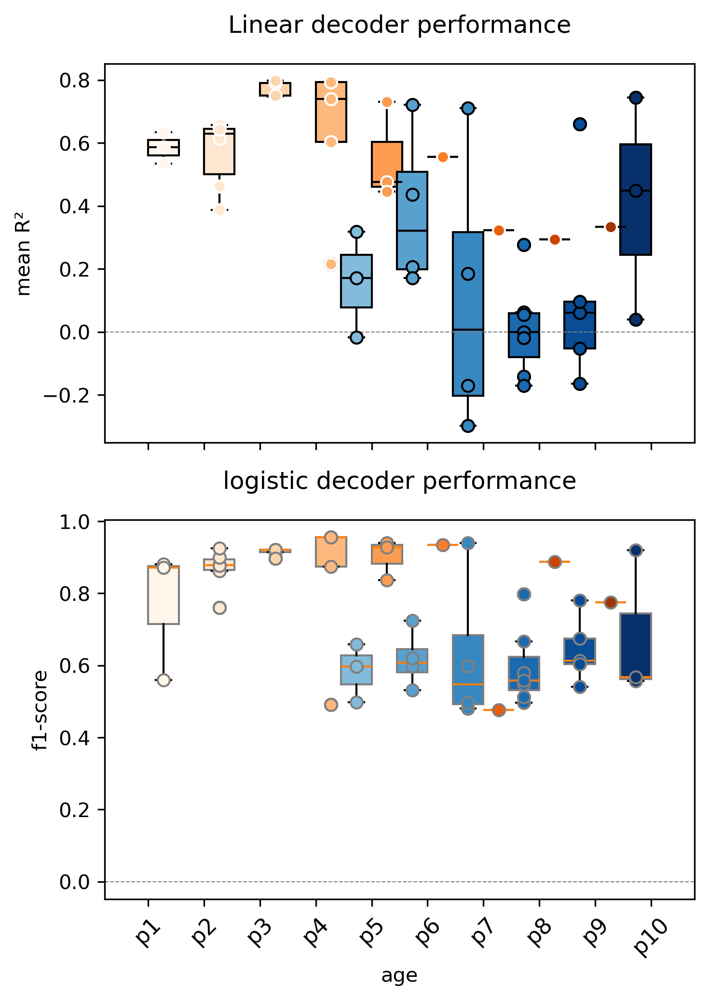

In [73]:
# Copy and drop missing
combined_df = all_plot_df.copy()
combined_df = combined_df.dropna(subset=['r2_linear', 'f1_score_logistic'])

# Function to get numeric part of age for sorting
def extract_age_num(age_label):
    match = re.search(r'\d+', str(age_label))
    return int(match.group(0)) if match else -1

# Sorted ages
unique_ages = sorted(combined_df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormaps
blues = [cm.Blues(i / max(1, num_ages - 1)) for i in range(num_ages)]
Reds = [cm.Oranges(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2blue = dict(zip(unique_ages, blues))
age2orange = dict(zip(unique_ages, oranges))

# Figure and subplots
fig, axes = plt.subplots(2, 1, figsize=(5, 7), dpi=300, sharex=True)
width = 0.55
offset = width / 2

# --- Linear Decoder R² ---
ax = axes[0]
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    ax.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
               boxprops=dict(facecolor=age2blue[age], color='black'),
               medianprops=dict(color='black'))
    ax.scatter(np.full(len(dual_data), i - offset), dual_data,
               color=age2blue[age], edgecolor='black',zorder=3)
    
    # GABA (orange)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    ax.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
               boxprops=dict(facecolor=age2orange[age], color='black'),
               medianprops=dict(color='black'))
    ax.scatter(np.full(len(gaba_data), i + offset), gaba_data,
               color=age2orange[age], edgecolor='white', zorder=3)

ax.set_ylabel('mean R²')
ax.set_title('Linear decoder performance', y=1.05)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)

# --- Logistic Decoder F1 Score ---
ax = axes[1]
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_score_logistic']
    ax.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
               boxprops=dict(facecolor=age2blue[age], color='grey'),
               )
    ax.scatter(np.full(len(dual_data), i - offset), dual_data,
               color=age2blue[age], edgecolor='grey', zorder=3)
    
    # GABA (orange)
    gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    ax.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
               boxprops=dict(facecolor=age2orange[age], color='grey'),
               )
    ax.scatter(np.full(len(gaba_data), i + offset), gaba_data,
               color=age2orange[age], edgecolor='grey', zorder=3)

ax.set_ylabel('f1-score')
ax.set_xlabel('age')
ax.set_title('logistic decoder performance', y=1.05)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)

# Shared x-axis
axes[1].set_xticks(range(len(unique_ages)))
axes[1].set_xticklabels(unique_ages, rotation=45, fontsize=11)

plt.tight_layout()
plt.show()

In [97]:
from matplotlib import rcParams

rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False

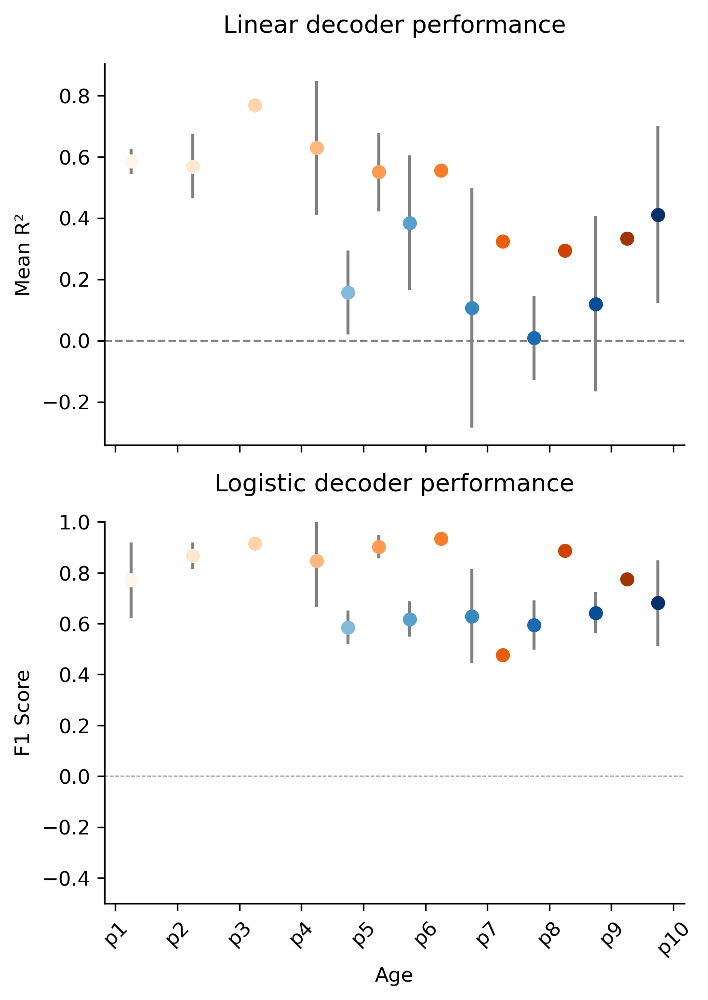

In [99]:
# Copy and drop missing
combined_df = all_plot_df.copy()
combined_df = combined_df.dropna(subset=['r2_linear', 'f1_score_logistic'])

# Function to get numeric part of age for sorting
def extract_age_num(age_label):
    match = re.search(r'\d+', str(age_label))
    return int(match.group(0)) if match else -1

# Sorted ages
unique_ages = sorted(combined_df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormaps
blues = [cm.Blues(i / max(1, num_ages - 1)) for i in range(num_ages)]
oranges = [cm.Oranges(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2blue = dict(zip(unique_ages, blues))
age2orange = dict(zip(unique_ages, oranges))

# Figure and subplots
fig, axes = plt.subplots(2, 1, figsize=(5, 7), dpi=300, sharex=True)
width = 0.25  # offset for dual/GABA

# --- Linear Decoder R² ---
ax = axes[0]
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        mean_val = np.mean(dual_data)
        std_val = np.std(dual_data)
        # mean point
        ax.scatter(i - width, mean_val, color=age2blue[age], zorder=3)
        # whisker line = mean ± SD
        ax.vlines(i - width, mean_val - std_val, mean_val + std_val, color='grey')

    # GABA
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        mean_val = np.mean(gaba_data)
        std_val = np.std(gaba_data)
        ax.scatter(i + width, mean_val, color=age2orange[age], zorder=3)
        ax.vlines(i + width, mean_val - std_val, mean_val + std_val, color='grey')

ax.axhline(0, linestyle='--', color='grey', lw=1)
ax.set_ylabel('Mean R²')
ax.set_title('Linear decoder performance', y=1.05)

# --- Logistic Decoder F1 ---
ax = axes[1]
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_score_logistic']
    if len(dual_data) > 0:
        mean_val = np.mean(dual_data)
        std_val = np.std(dual_data)
        ax.scatter(i - width, mean_val, color=age2blue[age], zorder=3)
        ax.vlines(i - width, mean_val - std_val, mean_val + std_val, color='grey')
    
    # GABA
    gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_data) > 0:
        mean_val = np.mean(gaba_data)
        std_val = np.std(gaba_data)
        ax.scatter(i + width, mean_val, color=age2orange[age], zorder=3)
        ax.vlines(i + width, mean_val - std_val, mean_val + std_val, color='grey')

ax.axhline(0, linestyle='--', color='grey', lw=0.5)
ax.set_ylabel('F1 Score')
ax.set_xlabel('Age')
ax.set_title('Logistic decoder performance', y=1.05)

# Shared x-axis
axes[1].set_xticks(range(len(unique_ages)))
axes[1].set_xticklabels(unique_ages, rotation=45)

plt.tight_layout()
plt.ylim(-0.5,1)
plt.show()

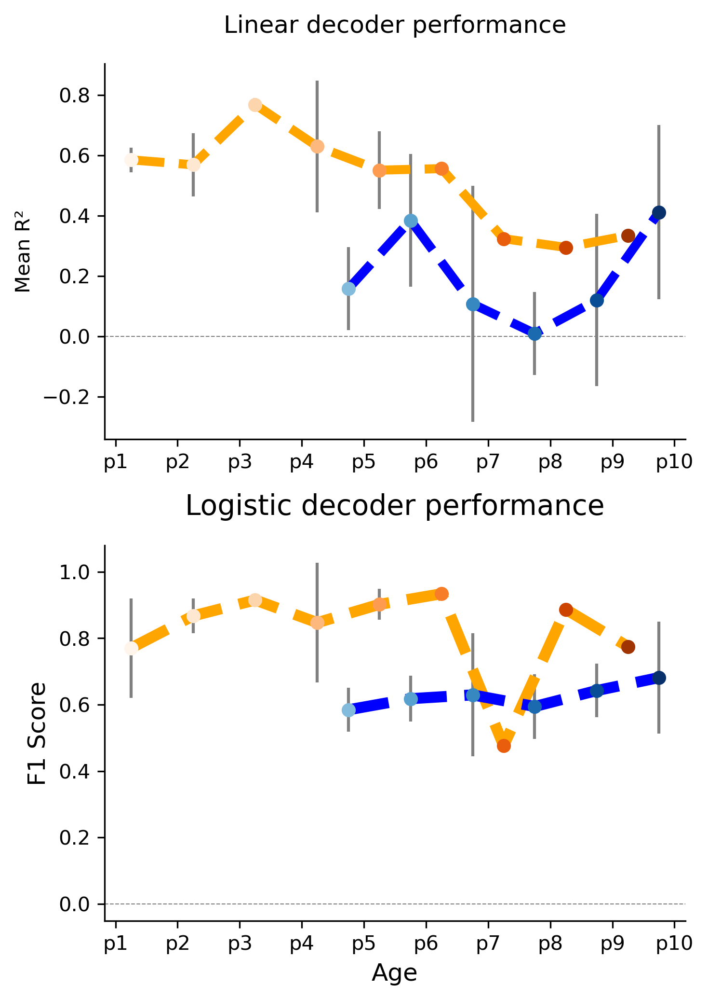

In [103]:
import matplotlib.pyplot as plt
import numpy as np
import re
from matplotlib import cm

# Copy and drop missing
combined_df = all_plot_df.copy()
combined_df = combined_df.dropna(subset=['r2_linear', 'f1_score_logistic'])

# Helper: numeric part of age
def extract_age_num(age_label):
    match = re.search(r'\d+', str(age_label))
    return int(match.group(0)) if match else -1

# Sorted ages
unique_ages = sorted(combined_df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormaps
blues = [cm.Blues(i / max(1, num_ages - 1)) for i in range(num_ages)]
oranges = [cm.Oranges(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2blue = dict(zip(unique_ages, blues))
age2orange = dict(zip(unique_ages, oranges))

# Figure and subplots
fig, axes = plt.subplots(2, 1, figsize=(5, 7), dpi=300)
width = 0.25  # offset for dual/GABA

# --- Linear Decoder R² ---
ax = axes[0]
gaba_means = []
dual_means = []
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        mean_val = np.mean(dual_data)
        std_val = np.std(dual_data)
        dual_means.append((i - width, mean_val))
        ax.scatter(i - width, mean_val, color=age2blue[age], zorder=3)
        ax.vlines(i - width, mean_val - std_val, mean_val + std_val, color='grey')
    
    # GABA
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        mean_val = np.mean(gaba_data)
        std_val = np.std(gaba_data)
        gaba_means.append((i + width, mean_val))
        ax.scatter(i + width, mean_val, color=age2orange[age], zorder=3)
        ax.vlines(i + width, mean_val - std_val, mean_val + std_val, color='grey')

# Connect means with dashed lines
if gaba_means:
    x_vals, y_vals = zip(*gaba_means)
    ax.plot(x_vals, y_vals, '--', color='orange', lw=4.5)
if dual_means:
    x_vals, y_vals = zip(*dual_means)
    ax.plot(x_vals, y_vals, '--', color='blue', lw=4.5)

ax.axhline(0, linestyle='--', color='grey', lw=0.5)
ax.set_ylabel('Mean R²')
ax.set_title('Linear decoder performance', y=1.05)

# --- Logistic Decoder F1 ---
ax = axes[1]
gaba_means = []
dual_means = []
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_score_logistic']
    if len(dual_data) > 0:
        mean_val = np.mean(dual_data)
        std_val = np.std(dual_data)
        dual_means.append((i - width, mean_val))
        ax.scatter(i - width, mean_val, color=age2blue[age], zorder=3)
        ax.vlines(i - width, mean_val - std_val, mean_val + std_val, color='grey')
    
    # GABA
    gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_data) > 0:
        mean_val = np.mean(gaba_data)
        std_val = np.std(gaba_data)
        gaba_means.append((i + width, mean_val))
        ax.scatter(i + width, mean_val, color=age2orange[age], zorder=3)
        ax.vlines(i + width, mean_val - std_val, mean_val + std_val, color='grey')

# Connect means with dashed lines
if gaba_means:
    x_vals, y_vals = zip(*gaba_means)
    ax.plot(x_vals, y_vals, '--', color='orange', lw=5.5)
if dual_means:
    x_vals, y_vals = zip(*dual_means)
    ax.plot(x_vals, y_vals, '--', color='blue', lw=5.5)

ax.axhline(0, linestyle='--', color='grey', lw=0.5)
ax.set_ylabel('F1 Score', fontsize=12)
ax.set_xlabel('Age', fontsize=12)
ax.set_title('Logistic decoder performance', fontsize=14, y=1.05)

# X-axis ticks
axes[1].set_xticks(range(len(unique_ages)))
axes[1].set_xticklabels(unique_ages)
axes[0].set_xticks(range(len(unique_ages)))
axes[0].set_xticklabels(unique_ages)

plt.tight_layout()
plt.show()


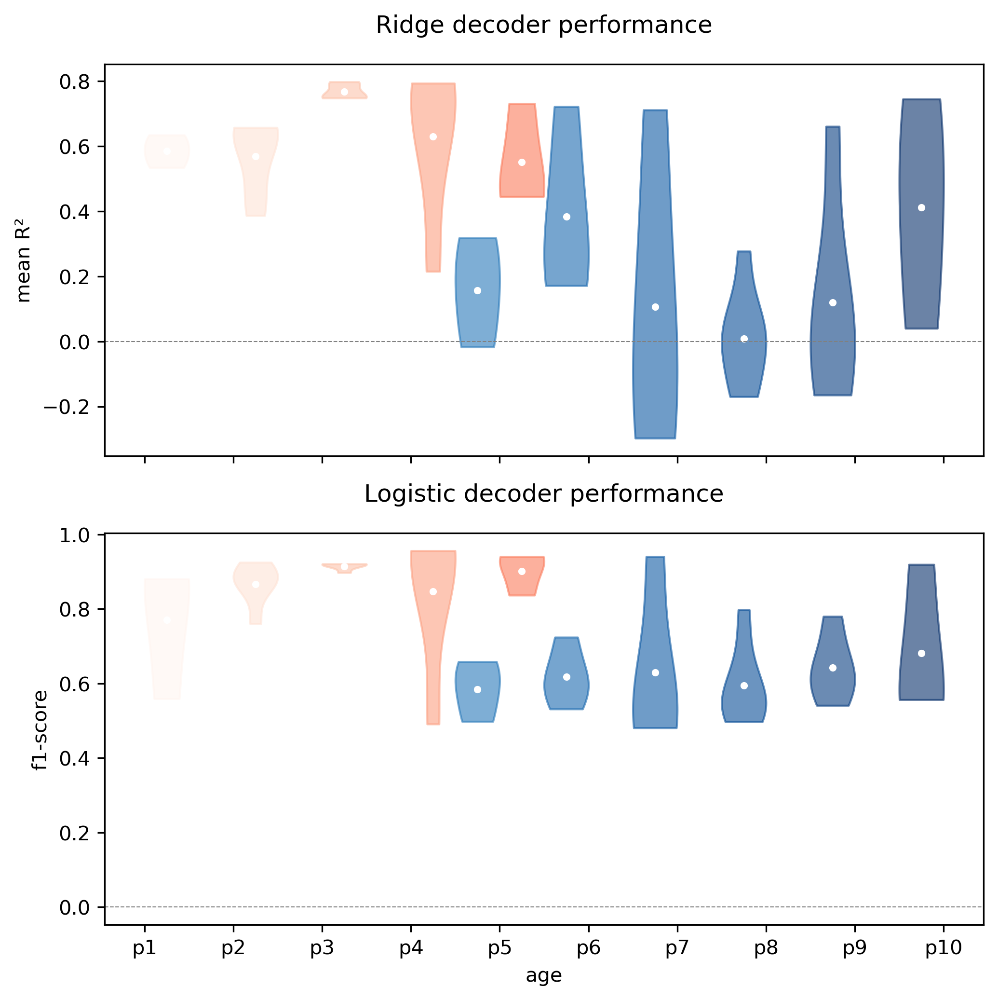

In [76]:
from scipy.stats import gaussian_kde

# Copy and drop missing
combined_df = all_plot_df.copy()
combined_df = combined_df.dropna(subset=['r2_linear', 'f1_score_logistic'])

# Function to get numeric part of age for sorting
def extract_age_num(age_label):
    match = re.search(r'\d+', str(age_label))
    return int(match.group(0)) if match else -1

# Sorted ages
unique_ages = sorted(combined_df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormaps
# blues = [cm.Blues(i / max(1, num_ages - 1)) for i in range(num_ages)]
blues = [cm.Blues(0.5 + 0.5*i/max(1, num_ages-1)) for i in range(num_ages)]  # light shades

oranges = [cm.Reds(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2blue = dict(zip(unique_ages, blues))
age2orange = dict(zip(unique_ages, oranges))

# Figure and subplots
fig, axes = plt.subplots(2, 1, figsize=(7, 7), dpi=300, sharex=True)
width = 0.25  # half-width of each violin

def plot_violin(ax, data, x_pos, color):
    if len(data) > 1:
        kde = gaussian_kde(data)
        ys = np.linspace(min(data), max(data), 100)
        dens = kde(ys)
        dens = dens / dens.max() * width  # normalize width
        ax.fill_betweenx(ys, x_pos - dens, x_pos + dens, color=color, alpha=0.6)
        # mean marker
        ax.scatter(x_pos, np.mean(data), color='white', zorder=1, s=7)

# --- Linear Decoder R² ---
ax = axes[0]
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]

    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    plot_violin(ax, dual_data, i - width, age2blue[age])

    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    plot_violin(ax, gaba_data, i + width, age2orange[age])

ax.axhline(0, linestyle='--', color='grey', lw=0.5)
ax.set_ylabel('mean R²')
ax.set_title('Ridge decoder performance', y=1.05)

# --- Logistic Decoder F1 ---
ax = axes[1]
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]

    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_score_logistic']
    plot_violin(ax, dual_data, i - width, age2blue[age])

    gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    plot_violin(ax, gaba_data, i + width, age2orange[age])

ax.axhline(0, linestyle='--', color='grey', lw=0.5)
ax.set_ylabel('f1-score')
ax.set_xlabel('age')
ax.set_title('Logistic decoder performance', y=1.05)

# Shared x-axis
axes[1].set_xticks(range(len(unique_ages)))
axes[1].set_xticklabels(unique_ages)

plt.tight_layout()
plt.show()


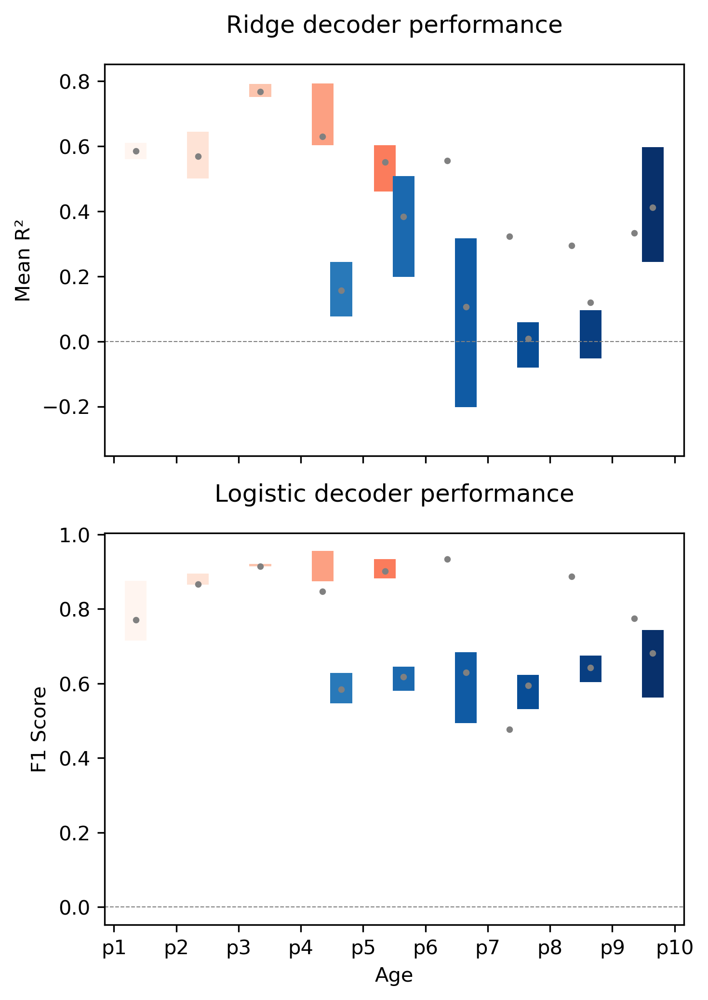

In [77]:
# Copy and drop missing
combined_df = all_plot_df.copy()
combined_df = combined_df.dropna(subset=['r2_linear', 'f1_score_logistic'])

# Function to extract numeric age
def extract_age_num(age_label):
    match = re.search(r'\d+', str(age_label))
    return int(match.group(0)) if match else -1

unique_ages = sorted(combined_df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormaps - light blues for black background
blues = [cm.Blues(0.5 + 0.5*i/max(1, num_ages-1)) for i in range(num_ages)]
oranges = [cm.Reds(i / max(1, num_ages-1)) for i in range(num_ages)]
age2blue = dict(zip(unique_ages, blues))
age2orange = dict(zip(unique_ages, oranges))

fig, axes = plt.subplots(2, 1, figsize=(5,7), dpi=300, sharex=True)
width = 0.35  # half-offset for dual/GABA

def plot_box_mean(ax, data, x_pos, color, marker_size=30):
    if len(data) > 0:
        # Boxplot with no edges
        bp = ax.boxplot(data,
                        positions=[x_pos],
                        widths=width,
                        patch_artist=True,
                        boxprops=dict(facecolor=color, edgecolor='none'),
                        whiskerprops=dict(color=color, linewidth=0),
                        capprops=dict(color=color, linewidth=0),
                        medianprops=dict(color=color, linewidth=0),
                        showfliers=False)
        # mean marker in white
        ax.scatter(x_pos, np.mean(data), color='grey', s=5, zorder=3)

# --- Linear Decoder R² ---
ax = axes[0]
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]

    dual_data = age_data[age_data['group']=='Dual Imaging']['r2_linear']
    plot_box_mean(ax, dual_data, i - width, age2blue[age])

    gaba_data = age_data[age_data['group']=='GABA']['r2_linear']
    plot_box_mean(ax, gaba_data, i + width, age2orange[age])

ax.axhline(0, linestyle='--', color='grey', lw=0.5)
ax.set_ylabel('Mean R²')
ax.set_title('Ridge decoder performance', y=1.05)

# --- Logistic Decoder F1 ---
ax = axes[1]
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]

    dual_data = age_data[age_data['group']=='Dual Imaging']['f1_score_logistic']
    plot_box_mean(ax, dual_data, i - width, age2blue[age])

    gaba_data = age_data[age_data['group']=='GABA']['f1_score_logistic']
    plot_box_mean(ax, gaba_data, i + width, age2orange[age])

ax.axhline(0, linestyle='--', color='grey', lw=0.5)
ax.set_ylabel('F1 Score')
ax.set_xlabel('Age')
ax.set_title('Logistic decoder performance', y=1.05)

axes[1].set_xticks(range(len(unique_ages)))
axes[1].set_xticklabels(unique_ages)

plt.tight_layout()
plt.show()


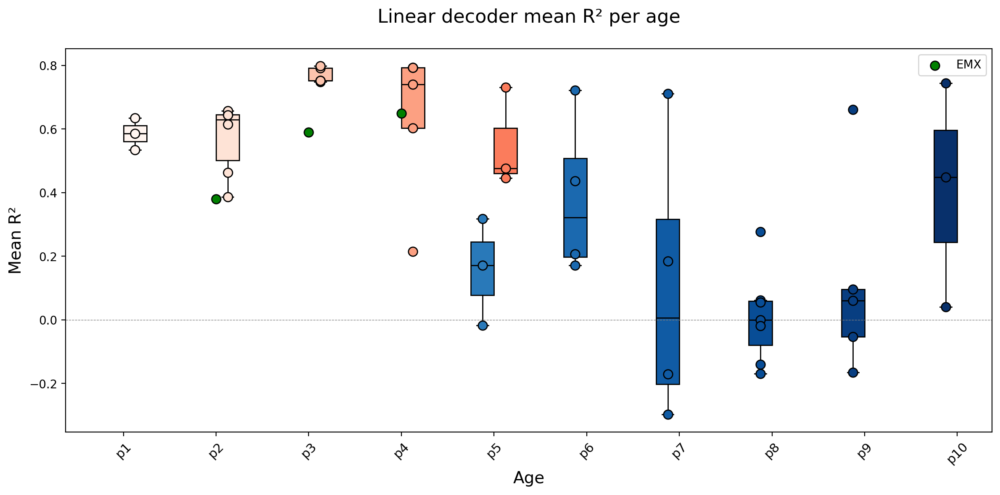

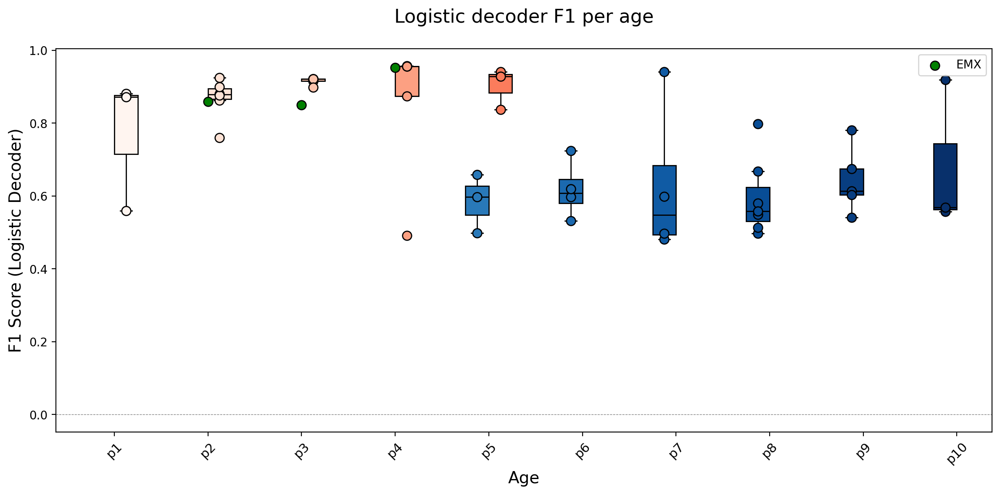

In [78]:
max_gaba_age = 5  # P5

# --- Linear Decoder R² (up to P5 for GABA) ---
plt.figure(figsize=(12, 6), dpi=200)
width = 0.25
offset = width / 2

for i, age in enumerate(unique_ages):
    age_num = int(re.search(r'\d+', age).group(0))
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (all ages)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2blue[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=age2blue[age], edgecolor='black', s=60, zorder=3)
    
    # GABA (only ages <= P5)
    if age_num <= max_gaba_age:
        gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
        plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2orange[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                    color=age2orange[age], edgecolor='black', s=60, zorder=3)
    
    # EMX (all ages)
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    plt.scatter(np.full(len(emx_data), i), emx_data,  # centered at i
                color=green_color, edgecolor='black', s=60, zorder=3, label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages, rotation=45, fontsize=11)
plt.ylabel('Mean R²', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Linear decoder mean R² per age', fontsize=16, y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.legend()
plt.tight_layout()
plt.show()


# --- Logistic Decoder F1 Score (up to P5 for GABA) ---
plt.figure(figsize=(12, 6), dpi=200)

for i, age in enumerate(unique_ages):
    age_num = int(re.search(r'\d+', age).group(0))
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (all ages)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_score_logistic']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2blue[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=age2blue[age], edgecolor='black', s=60, zorder=3)
    
    # GABA (only ages <= P5)
    if age_num <= max_gaba_age:
        gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
        plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=age2orange[age], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                    color=age2orange[age], edgecolor='black', s=60, zorder=3)
    
    # EMX (all ages)
    emx_data = age_data[age_data['group'] == 'EMX']['f1_score_logistic']
    plt.scatter(np.full(len(emx_data), i), emx_data,  # centered at i
                color=green_color, edgecolor='black', s=60, zorder=3, label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages, rotation=45, fontsize=11)
plt.ylabel('F1 Score (Logistic Decoder)', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Logistic decoder F1 per age', fontsize=16, y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.legend()
plt.tight_layout()
plt.show()

In [79]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import sem

# Colors
group_colors = {
    'GABA only': 'orange',
    'EMX only': 'green',
    'Both': 'purple',
    'Dual Imaging': 'blue'
}

# Smaller figure size and marker size
figsize = (5,3)
marker_size = 40
font_size = 10

# --- Linear R² ---
plt.figure(figsize=figsize, dpi=200)
for group_name, color in group_colors.items():
    means = []
    sems = []
    x_vals = []
    
    for i, age in enumerate(unique_ages):
        age_data = combined_df[combined_df['age'] == age]
        group_data = age_data[age_data['group_type']==group_name]
        r2_data = group_data['r2_linear']
        
        if len(r2_data) > 0:
            m = np.mean(r2_data)
            s = sem(r2_data)
            means.append(m)
            sems.append(s)
            x_vals.append(i)
            
            # Scatter points
            plt.scatter(np.full(len(r2_data), i), r2_data, color=color,
                        edgecolor='black', s=marker_size, zorder=3)
    
    if means:
        means = np.array(means)
        sems = np.array(sems)
        plt.plot(x_vals, means, '--', color=color, lw=1.2)
        plt.fill_between(x_vals, means - sems, means + sems, color=color, alpha=0.2)

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=font_size)
plt.yticks(fontsize=font_size)
plt.ylabel('Mean R²', fontsize=font_size+2)
plt.xlabel('Age', fontsize=font_size+2)
plt.title('Linear decoder mean R² per age', fontsize=font_size+4)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.tight_layout()
plt.show()


# --- Logistic F1 (Class 1) ---
plt.figure(figsize=figsize, dpi=200)
for group_name, color in group_colors.items():
    means = []
    sems = []
    x_vals = []
    
    for i, age in enumerate(unique_ages):
        age_data = combined_df[combined_df['age'] == age]
        group_data = age_data[age_data['group_type']==group_name]
        f1_data = group_data['f1_class1']
        
        if len(f1_data) > 0:
            m = np.mean(f1_data)
            s = sem(f1_data)
            means.append(m)
            sems.append(s)
            x_vals.append(i)
            
            plt.scatter(np.full(len(f1_data), i), f1_data, color=color,
                        edgecolor='black', s=marker_size, zorder=3)
    
    if means:
        means = np.arra


KeyError: 'group_type'

<Figure size 1000x600 with 0 Axes>

In [ ]:
combined_df.keys()

In [ ]:
width = 0.25
offset = width / 2

# --- Linear Decoder R² (all ages) ---
fig, ax = plt.subplots(figsize=(14, 6), dpi=200)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (all ages)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        ax.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                   boxprops=dict(facecolor=age2blue[age], color='black'),
                   medianprops=dict(color='black'))
        ax.scatter(np.full(len(dual_data), i - offset), dual_data,
                   color=age2blue[age], edgecolor='black', s=50, zorder=3)

    # GABA (all ages)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        ax.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                   boxprops=dict(facecolor=age2orange[age], color='black'),
                   medianprops=dict(color='black'))
        ax.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                   color=age2orange[age], edgecolor='black', s=70, zorder=3)

    # EMX (all ages)
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        ax.scatter(np.full(len(emx_data), i), emx_data,
                   color=green_color, edgecolor='black', s=50, zorder=3,
                   label='EMX' if i == 0 else "")

# Axes formatting
ax.set_xticks(range(len(unique_ages)))
ax.set_xticklabels(unique_ages, rotation=0, fontsize=12)
ax.set_ylabel('Mean R²', fontsize=14)
ax.set_xlabel('Age', fontsize=14)
ax.set_title('Linear decoder mean R² per age', fontsize=16, y=1.02)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)

# Legend
ax.legend(frameon=False, loc='upper right', fontsize=12)

plt.tight_layout()
plt.show()


# --- Logistic Decoder F1 Score (all ages) ---
fig, ax = plt.subplots(figsize=(5, 4), dpi=300)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_score_logistic']
    if len(dual_data) > 0:
        ax.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                   boxprops=dict(facecolor=age2blue[age], color='black'),
                   medianprops=dict(color='black'))
        ax.scatter(np.full(len(dual_data), i - offset), dual_data,
                   color=age2blue[age], edgecolor='black', s=50, zorder=3)

    # GABA
    gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_data) > 0:
        ax.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                   boxprops=dict(facecolor=age2orange[age], color='black'),
                   medianprops=dict(color='black'))
        ax.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                   color=age2orange[age], edgecolor='black', s=50, zorder=3)

    # EMX
    emx_data = age_data[age_data['group'] == 'EMX']['f1_score_logistic']
    if len(emx_data) > 0:
        ax.scatter(np.full(len(emx_data), i), emx_data,
                   color=green_color, edgecolor='black', s=50, zorder=3,
                   label='EMX' if i == 0 else "")

# Axes formatting
ax.set_xticks(range(len(unique_ages)))
ax.set_xticklabels(unique_ages, rotation=0, fontsize=12)
ax.set_ylabel('F1 Score (Logistic Decoder)', fontsize=14)
ax.set_xlabel('Age', fontsize=14)
ax.set_title('Logistic decoder F1 per age', fontsize=16, y=1.02)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)

# Legend
ax.legend(frameon=False, loc='upper right', fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
width = 0.25
offset = width / 2

# --- Boxplots with mean line ---
fig, ax = plt.subplots(figsize=(12, 6), dpi=200)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        bp = ax.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                        boxprops=dict(facecolor=age2blue[age], color='black'),
                        medianprops=dict(color='grey'),  # median line grey
                        whiskerprops=dict(color='black'),
                        capprops=dict(color='black'),
                        flierprops=dict(marker='o', color='black', alpha=0.3),
                        showmeans=False)
        # Mean as a black line
        mean_val = np.mean(dual_data)
        ax.plot([i - offset - width/2, i - offset + width/2], [mean_val, mean_val], color='black', lw=2)

    # GABA
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        bp = ax.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                        boxprops=dict(facecolor=age2orange[age], color='black'),
                        medianprops=dict(color='grey'),
                        whiskerprops=dict(color='black'),
                        capprops=dict(color='black'),
                        flierprops=dict(marker='o', color='black', alpha=0.3),
                        showmeans=False)
        mean_val = np.mean(gaba_data)
        ax.plot([i + offset - width/2, i + offset + width/2], [mean_val, mean_val], color='black', lw=2)

    # EMX
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        bp = ax.boxplot(emx_data, positions=[i], widths=width, patch_artist=True,
                        boxprops=dict(facecolor=green_color, color='black'),
                        medianprops=dict(color='grey'),
                        whiskerprops=dict(color='black'),
                        capprops=dict(color='black'),
                        flierprops=dict(marker='o', color='black', alpha=0.3),
                        showmeans=False)
        mean_val = np.mean(emx_data)
        ax.plot([i - width/2, i + width/2], [mean_val, mean_val], color='black', lw=2)

# Axes formatting
ax.set_xticks(range(len(unique_ages)))
ax.set_xticklabels(unique_ages, rotation=0, fontsize=12)
ax.set_ylabel('Mean R²', fontsize=14)
ax.set_xlabel('Age', fontsize=14)
ax.set_title('Linear Decoder R² per Age', fontsize=16, y=1.02)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)

# Legend
ax.legend(['Dual Imaging', 'GABA', 'EMX'], frameon=False, loc='upper right', fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
if 'f1_class1' not in combined_df.columns:
    combined_df['f1_class1'] = [d.get('f1_class1', np.nan) for d in all_data]

In [80]:

if 'f1_class1' not in combined_df.columns:
    combined_df['f1_class1'] = [
        d.get('f1_class1', np.nan) if isinstance(d, dict) else np.nan
        for d in all_data
    ]

ValueError: Length of values (56) does not match length of index (55)

In [81]:
combined_df['session']

0     sz091_2024_06_05_b
1     sz105_2025_05_29_a
2     sz106_2025_05_29_a
3     sz089_2024_06_04_a
4     sz092_2024_06_06_a
5     sz108_2025_05_30_a
6     sz106_2025_05_30_a
7     sz105_2025_05_30_a
8     sz107_2025_05_30_b
9     sz092_2024_06_07_a
10    sz106_2025_05_31_a
11    sz107_2025_05_31_a
12    sz106_2025_05_31_a
13    sz108_2025_05_31_a
14    sz110_2025_06_01_a
15    sz089_2024_06_06_a
16    sz106_2025_06_01_a
17    sz106_2025_06_01_a
18    sz108_2025_06_01_a
19    sz110_2025_06_02_a
20    sz090_2024_06_07_a
21    sz108_2025_06_02_a
22    sz110_2025_06_03_a
23    sz110_2025_06_04_a
24    sz110_2025_06_05_a
25    sz110_2025_06_06_a
26      sz067_2023-10-09
27      sz079_2024-02-19
28     sz85_2024-04-20_a
29      sz078_2023-02-18
30      sz079_2024-02-19
31     sz85_2024-04-21_a
32     sz86_2024-04-28_a
33      sz078_2023-02-19
34      sz079_2024-02-20
35     sz85_2024-04-22_a
36    jm_46/2024-09-02_a
37      sz079_2024-02-21
38     sz86_2024-04-30_a
39     sz85_2024-04-23_b


In [82]:
combined_df['f1_class1']

KeyError: 'f1_class1'

In [83]:
# --- Plot Logistic Decoder F1 Score for Class 1 ---
plt.figure(figsize=(12, 6), dpi=200)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_class1']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2blue[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=age2blue[age], edgecolor='black', s=60, zorder=3)
    
    # GABA (orange)
    gaba_data = age_data[age_data['group'] == 'GABA']['f1_class1']
    plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2orange[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                color=age2orange[age], edgecolor='black', s=60, zorder=3)
    
    # EMX (green)
    emx_data = age_data[age_data['group'] == 'EMX']['f1_class1']
    plt.scatter(np.full(len(emx_data), i), emx_data,  # centered at i
                color=green_color, edgecolor='black', s=60, zorder=3, label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages, rotation=45, fontsize=11)
plt.ylabel('F1 Score (Class 1)', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Logistic decoder F1 (Class 1) per age', fontsize=16, y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.legend()
plt.tight_layout()
plt.show()


KeyError: 'f1_class1'

<Figure size 2400x1200 with 0 Axes>

In [84]:
# plt.figure(figsize=(12, 6), dpi=200)

# for i, age in enumerate(unique_ages):
#     age_data = combined_df[combined_df['age'] == age]
    
#     # Dual Imaging (blue)
#     dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_class1']
#     plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
#                 boxprops=dict(facecolor=age2blue[age], color='black'),
#                 medianprops=dict(color='black'))
#     plt.scatter(np.full(len(dual_data), i - offset), dual_data,
#                 color=age2blue[age], edgecolor='black', s=60, zorder=3)
    
#     # GABA (orange)
#     gaba_data = age_data[age_data['group'] == 'GABA']['f1_class1']
#     plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
#                 boxprops=dict(facecolor=age2orange[age], color='black'),
#                 medianprops=dict(color='black'))
#     plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
#                 color=age2orange[age], edgecolor='black', s=60, zorder=3)
    
#     # EMX (green)
#     emx_data = age_data[age_data['group'] == 'EMX']['f1_class1']
#     plt.scatter(np.full(len(emx_data), i), emx_data,  # centered at i
#                 color=green_color, edgecolor='black', s=60, zorder=3, label='EMX' if i==0 else "")

# # --- Connect points from the same animal with dashed lines ---
# # Only after age P5
# p5_ages = [age for age in unique_ages if int(age[1:]) > 5]  # assuming age like 'P6', 'P7', etc.

# plt.figure(figsize=(12, 6), dpi=200)

# # Extract animal ID from session (everything after 'sz' up to first non-digit)
# combined_df['animal_id'] = combined_df['session'].str.extract(r'sz(\d+)')[0]

# # Only consider ages after P5
# p5_ages = [age for age in unique_ages if int(age[1:]) > 5]

# # Connect points from the same animal
# for animal_id, animal_data in combined_df.groupby('animal_id'):
#     # Filter only ages >= P5
#     animal_data = animal_data[animal_data['age'].isin(p5_ages)]
#     if len(animal_data) > 1:
#         # x positions for each session
#         x_vals = [unique_ages.index(a) for a in animal_data['age']]
#         y_vals = animal_data['f1_class1']
#         plt.plot(x_vals, y_vals, linestyle='--', color='grey', alpha=0.6, zorder=1)

# for i, age in enumerate(unique_ages):
#     age_data = combined_df[combined_df['age'] == age]
    
#     # Dual Imaging (blue)
#     dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_class1']
#     plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
#                 boxprops=dict(facecolor=age2blue[age], color='black'),
#                 medianprops=dict(color='black'))
#     plt.scatter(np.full(len(dual_data), i - offset), dual_data,
#                 color=age2blue[age], edgecolor='black', s=60, zorder=3)
    
#     # GABA (orange)
#     gaba_data = age_data[age_data['group'] == 'GABA']['f1_class1']
#     plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
#                 boxprops=dict(facecolor=age2orange[age], color='black'),
#                 medianprops=dict(color='black'))
#     plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
#                 color=age2orange[age], edgecolor='black', s=60, zorder=3)
    
#     # EMX (green)
#     emx_data = age_data[age_data['group'] == 'EMX']['f1_class1']
#     plt.scatter(np.full(len(emx_data), i), emx_data,  # centered at i
#                 color=green_color, edgecolor='black', s=60, zorder=3, label='EMX' if i==0 else "")

# # --- Connect points from the same animal with dashed lines ---
# # Only after age P5
# p5_ages = [age for age in unique_ages if int(age[1:]) > 5]  # assuming age like 'P6', 'P7', etc.

# for animal_id, animal_data in combined_df.groupby('animal_id'):
#     # Filter only ages >= P5
#     animal_data = animal_data[animal_data['age'].isin(p5_ages)]
#     if len(animal_data) > 1:
#         # Get x positions and F1 values
#         x_vals = [unique_ages.index(a) for a in animal_data['age']]
#         y_vals = animal_data['f1_class1']
#         plt.plot(x_vals, y_vals, linestyle='--', color='white', alpha=0.6, zorder=1)

# plt.xticks(range(len(unique_ages)), unique_ages, rotation=45, fontsize=11)
# plt.ylabel('F1 Score (Class 1)', fontsize=14)
# plt.xlabel('Age', fontsize=14)
# plt.title('Logistic decoder F1 (Class 1) per age', fontsize=16, y=1.05)
# plt.axhline(0, linestyle='--', color='grey', lw=0.5)
# plt.legend()
# plt.tight_layout()
# plt.show()

# plt.xticks(range(len(unique_ages)), unique_ages, rotation=45, fontsize=11)
# plt.ylabel('F1 Score (Class 1)', fontsize=14)
# plt.xlabel('Age', fontsize=14)
# plt.title('Logistic decoder F1 (Class 1) per age', fontsize=16, y=1.05)
# plt.axhline(0, linestyle='--', color='grey', lw=0.5)
# plt.legend()
# plt.tight_layout()
# plt.show()

In [85]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6), dpi=200)

# --- Plot the boxplots and scatter points ---
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_class1']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2blue[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=age2blue[age], edgecolor='black', s=60, zorder=3)
    
    # GABA (orange)
    gaba_data = age_data[age_data['group'] == 'GABA']['f1_class1']
    plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2orange[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                color=age2orange[age], edgecolor='black', s=60, zorder=3)
    
    # EMX (green)
    emx_data = age_data[age_data['group'] == 'EMX']['f1_class1']
    plt.scatter(np.full(len(emx_data), i), emx_data,
                color=green_color, edgecolor='black', s=60, zorder=3, label='EMX' if i==0 else "")

# --- Connect points for the two animals with most sessions ---
combined_df['animal_id'] = combined_df['session'].str.extract(r'sz(\d+)')[0]

# Count number of sessions per animal
animal_counts = combined_df['animal_id'].value_counts()
top_animals = animal_counts.head(2).index.tolist()  # take top 2 animals

p5_ages = [age for age in unique_ages if int(age[1:]) > 5]

for animal_id in top_animals:
    animal_data = combined_df[(combined_df['animal_id'] == animal_id) &
                              (combined_df['age'].isin(p5_ages))]
    if len(animal_data) > 1:
        x_vals = [unique_ages.index(a) for a in animal_data['age']]
        y_vals = animal_data['f1_class1']
        plt.plot(x_vals, y_vals, linestyle='--', color='grey', alpha=0.7, zorder=1)

# --- Final plot formatting ---
plt.xticks(range(len(unique_ages)), unique_ages, rotation=45, fontsize=11)
plt.ylabel('F1 Score (Class 1)', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Logistic decoder F1 (Class 1) per age', fontsize=16, y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.legend()
plt.tight_layout()
plt.show()


KeyError: 'f1_class1'

<Figure size 2400x1200 with 0 Axes>

In [86]:
print(combined_df.columns)


Index(['age', 'session', 'group', 'file_path', 'r2_linear', 'med_r2_linear',
       'f1_score_logistic', 'active_percentage', 'var_exp_time',
       'pca_emb_time', 'behavior_coupling', 'mean_active_motion_duration',
       'popcouploc', 'popcoup_all', 'modulation_idx_active_rest',
       'modulation_idx_active_twitch', 'modulation_idx_twitch_rest',
       'SCE_peak_amplitude_active_percentage',
       'SCE_peak_amplitude_rest_percentage', 'SCE_frequency_active_state',
       'SCE_frequency_rest_state', 'peri_twitch_SCE_avg',
       'time_axis_framerate_avg', 'sce_times_orig', 'summed_activity_orig',
       'sce_times_avg', 'summed_activity_avg', 'behavior_coupling_greencell',
       'behavior_coupling_redcell'],
      dtype='object')


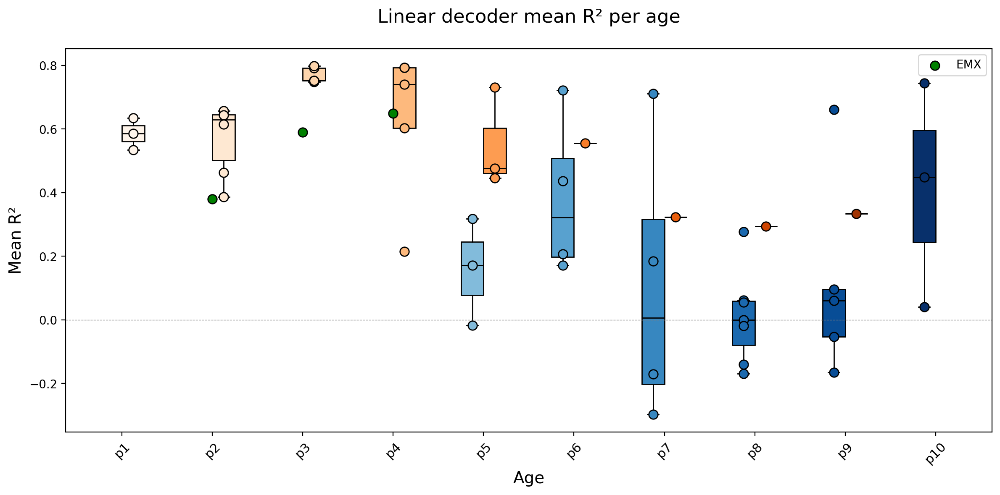

KeyError: 'f1_class1'

<Figure size 2400x1200 with 0 Axes>

In [87]:
age2blue = {age: plt.cm.Blues(i / max(1, len(unique_ages)-1)) for i, age in enumerate(unique_ages)}
age2orange = {age: plt.cm.Oranges(i / max(1, len(unique_ages)-1)) for i, age in enumerate(unique_ages)}
# Colormap for EMX
green_color = 'green'

# --- Plot Linear Decoder R² (same as before) ---
plt.figure(figsize=(12, 6), dpi=200)
width = 0.25
offset = width / 2

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2blue[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=age2blue[age], edgecolor='black', s=60, zorder=3)
    
    # GABA (orange)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2orange[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                color=age2orange[age], edgecolor='black', s=60, zorder=3)
    
    # EMX (green)
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    plt.scatter(np.full(len(emx_data), i), emx_data,  # centered at i
                color=green_color, edgecolor='black', s=60, zorder=3, label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages, rotation=45, fontsize=11)
plt.ylabel('Mean R²', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Linear decoder mean R² per age', fontsize=16, y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.legend()
plt.tight_layout()
plt.show()


# --- Plot Logistic Decoder F1 Score (Class 1) ---
plt.figure(figsize=(12, 6), dpi=200)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (blue)
    # dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_class1']
    # plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
    #             boxprops=dict(facecolor=age2blue[age], color='black'),
    #             medianprops=dict(color='black'))
    # plt.scatter(np.full(len(dual_data), i - offset), dual_data,
    #             color=age2blue[age], edgecolor='black', s=60, zorder=3)
    
    # GABA (orange)
    gaba_data = age_data[age_data['group'] == 'GABA']['f1_class1']
    plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=age2orange[age], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                color=age2orange[age], edgecolor='black', s=60, zorder=3)
    
    # EMX (green)
    emx_data = age_data[age_data['group'] == 'EMX']['f1_class1']
    plt.scatter(np.full(len(emx_data), i), emx_data,  # centered at i
                color=green_color, edgecolor='black', s=60, zorder=3)

plt.xticks(range(len(unique_ages)), unique_ages, rotation=45, fontsize=11)
plt.ylabel('F1 Score (Class 1)', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Logistic decoder F1 (Class 1) per age', fontsize=16, y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
# plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define colormaps
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues = [plt.cm.Blues(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

# Boxplot parameters
width = 0.35
offset = width / 2

# --- Linear decoder R² per age ---
plt.figure(figsize=(9,5), dpi=300)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=blues[i], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=blues[i], edgecolor='black', s=60, zorder=3)
    
    # GABA (red)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=reds[i], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                color=reds[i], edgecolor='black', s=60, zorder=3)
    
    # EMX (green)
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    plt.scatter(np.full(len(emx_data), i), emx_data,
                color=green_color, edgecolor='black', s=60, zorder=3, label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=25)
plt.ylabel('mean R²', fontsize=25)
plt.xlabel('age', fontsize=30)
# plt.title('Motion decoding (Ridge Regression)', fontsize=16, y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)

# Custom legend
from matplotlib.patches import Patch
legend_handles = [
    Patch(color=blues[len(blues)//2], label='E/I dual'),
    Patch(color=reds[len(reds)//2], label='I'),
    Patch(color=green_color, label='E')
]
plt.legend(handles=legend_handles, fontsize=15, frameon=False, loc='upper right', bbox_to_anchor=(1.02,1.22))

plt.tight_layout()
plt.ylim(-0.5,1)
plt.show()



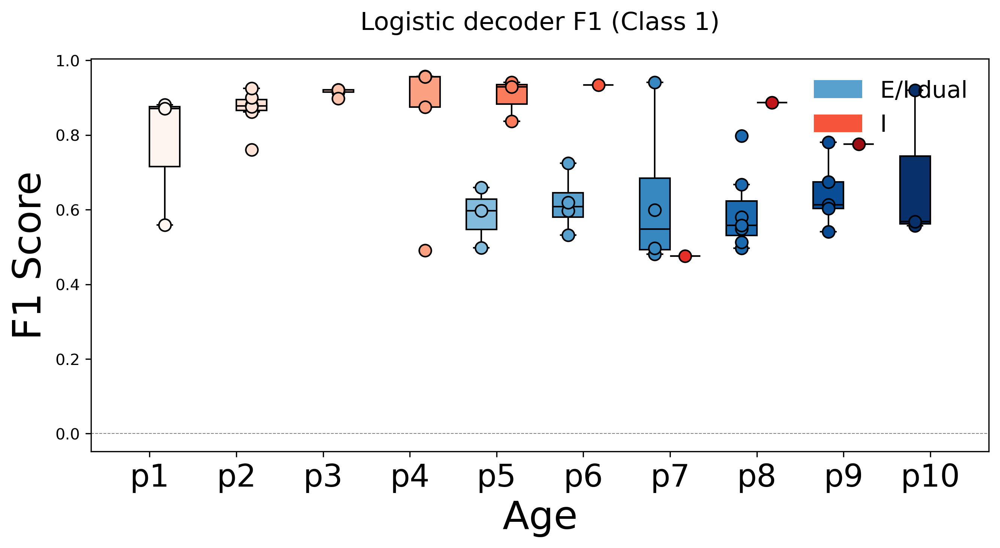

In [88]:
# Define colormaps
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues = [plt.cm.Blues(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]

# Boxplot parameters
width = 0.35
offset = width / 2

# --- Logistic decoder F1 per age ---
plt.figure(figsize=(9,5), dpi=300)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_score_logistic']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=blues[i], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=blues[i], edgecolor='black', s=60, zorder=3)
    
    # GABA (red)
    gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=reds[i], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                color=reds[i], edgecolor='black', s=60, zorder=3)

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=20)
plt.ylabel('F1 Score', fontsize=25)
plt.xlabel('Age', fontsize=25)
plt.title('Logistic decoder F1 (Class 1)', fontsize=16, y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)

# Custom legend
legend_handles = [
    Patch(color=blues[len(blues)//2], label='E/I dual'),
    Patch(color=reds[len(reds)//2], label='I')
]
plt.legend(handles=legend_handles, fontsize=15, frameon=False, loc='upper right')

plt.tight_layout()
plt.show()

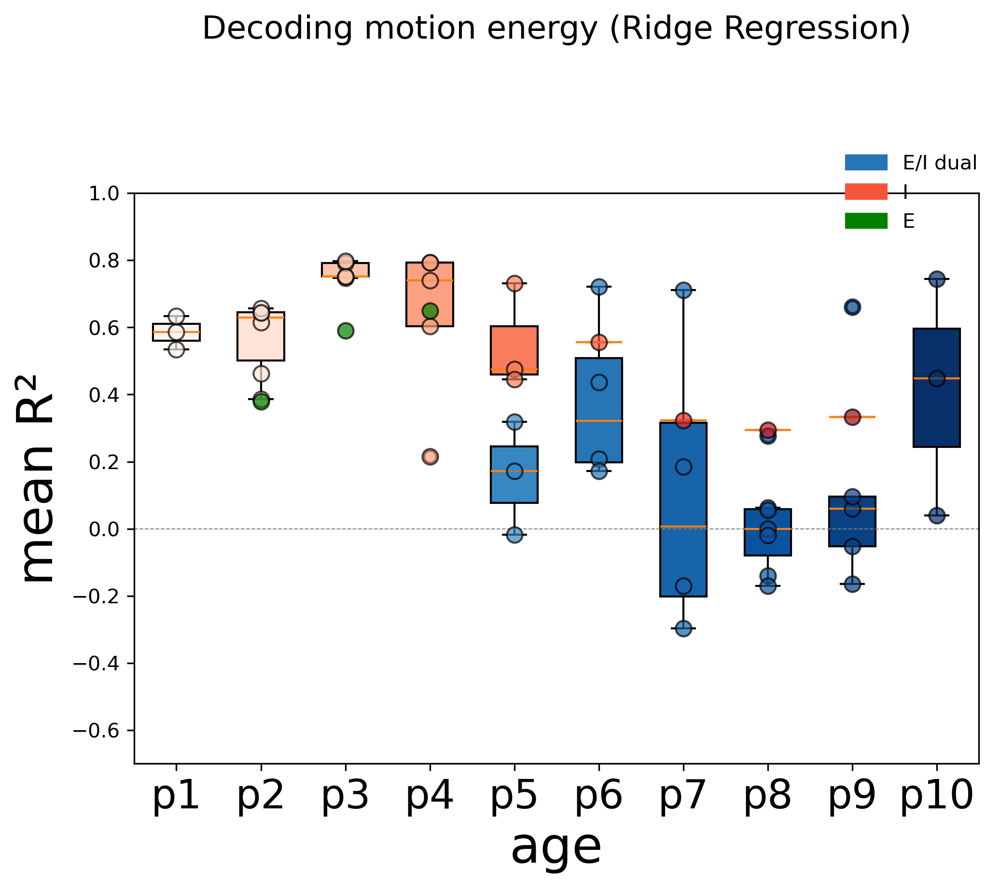

In [89]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Define colormaps
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues_light = [plt.cm.Blues(0.4 + 0.6*i/max(1,len(unique_ages)-1)) for i in range(len(unique_ages))]  # lighter blues
green_color = 'green'

# Boxplot parameters
width = 0.55
offset = 0

# --- Linear decoder R² per age ---
plt.figure(figsize=(7,6.5), dpi=300)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (light blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=blues_light[i]),
                )
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=blues_light[i], edgecolor='black', s=60, alpha=0.7, zorder=3)
    
    # GABA (red)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=reds[i]),
                )
    plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                color=reds[i], edgecolor='black', s=60, alpha=0.7,zorder=3)
    
    # EMX (green)
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    plt.scatter(np.full(len(emx_data), i), emx_data,
                color=green_color, edgecolor='black', s=60, alpha=0.7, zorder=3, label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=20)
plt.ylabel('mean R²', fontsize=25)
plt.xlabel('age', fontsize=25)
plt.title('Decoding motion energy (Ridge Regression)', fontsize=16, y=1.25)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)

# Custom legend
legend_handles = [
    Patch(color=blues_light[len(blues_light)//2], label='E/I dual'),
    Patch(color=reds[len(reds)//2], label='I'),
    Patch(color=green_color, label='E')
]
plt.legend(handles=legend_handles, fontsize=10, frameon=False, loc='upper right', bbox_to_anchor=(1.02,1.1))
plt.ylim(-0.7,1)
plt.tight_layout()
plt.show()


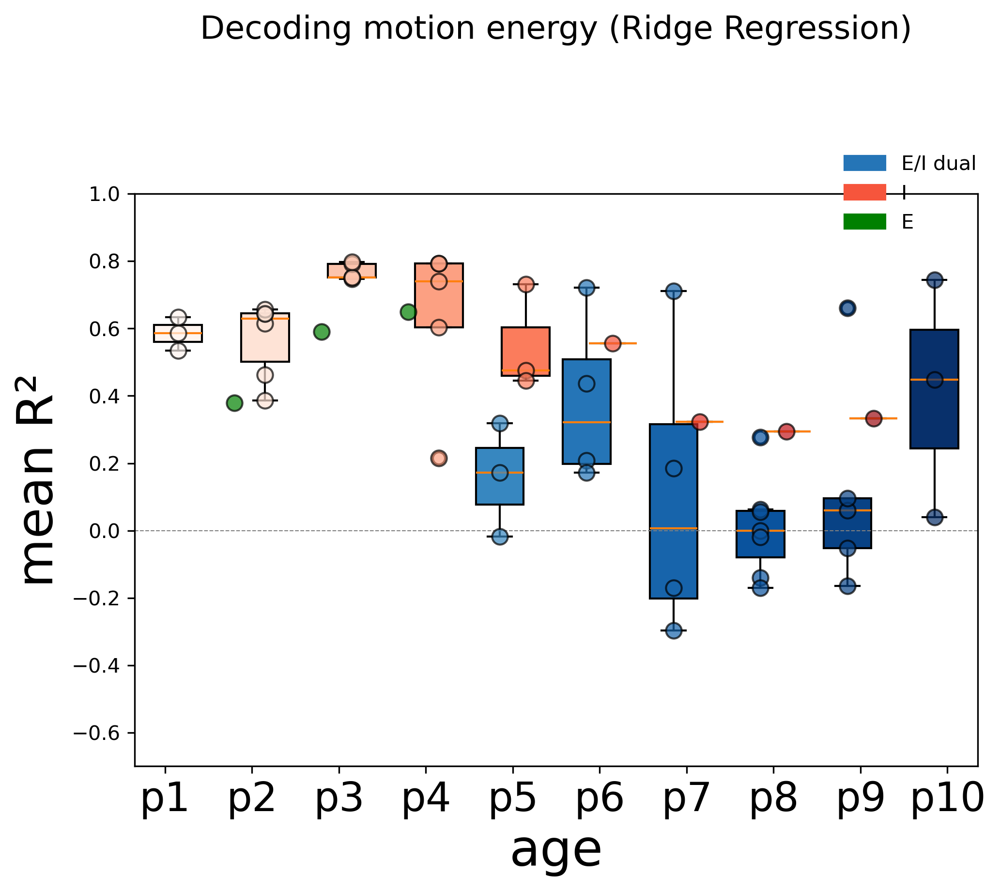

In [90]:
# Define colormaps
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues_light = [plt.cm.Blues(0.4 + 0.6*i/max(1,len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

# Boxplot parameters
width = 0.55
offset = 0.15  # small offset for clarity

# --- Linear decoder R² per age ---
plt.figure(figsize=(7,6.5), dpi=300)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (light blue) - slightly left
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=blues_light[i]))
        plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                    color=blues_light[i], edgecolor='black', s=60, alpha=0.7, zorder=3)
    
    # GABA (red) - slightly right
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=reds[i]))
        plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                    color=reds[i], edgecolor='black', s=60, alpha=0.7, zorder=3)
    
    # EMX (green) - slightly left for separation
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        plt.scatter(np.full(len(emx_data), i - 0.2), emx_data,
                    color=green_color, edgecolor='black', s=60, alpha=0.7, zorder=3, label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=20)
plt.ylabel('mean R²', fontsize=25)
plt.xlabel('age', fontsize=25)
plt.title('Decoding motion energy (Ridge Regression)', fontsize=16, y=1.25)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)

# Custom legend
legend_handles = [
    Patch(color=blues_light[len(blues_light)//2], label='E/I dual'),
    Patch(color=reds[len(reds)//2], label='I'),
    Patch(color=green_color, label='E')
]
plt.legend(handles=legend_handles, fontsize=10, frameon=False, loc='upper right', bbox_to_anchor=(1.02,1.1))

plt.ylim(-0.7,1)
plt.tight_layout()
plt.show()

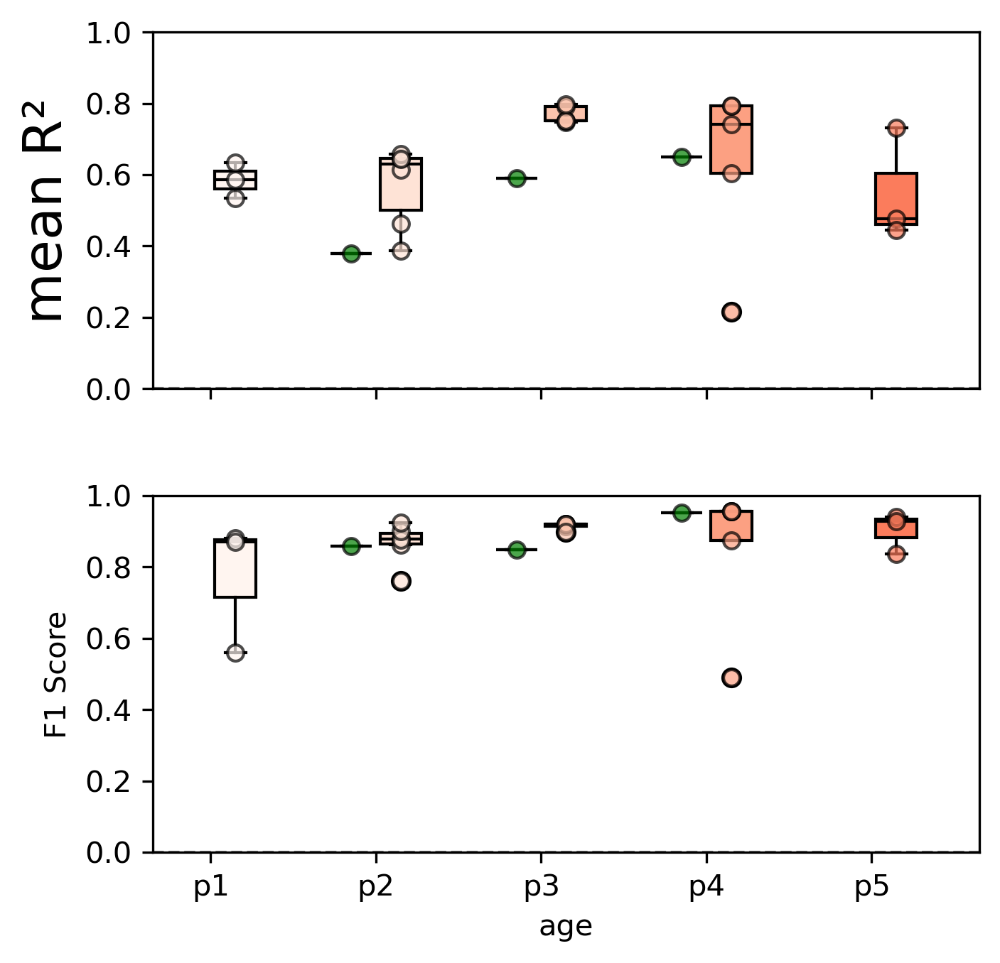

In [91]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
import re

# Colors
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

# Boxplot parameters
width = 0.25
offset = 0.15  # small offset for clarity

# Ages up to P5
ages_to_plot = [age for age in unique_ages if int(re.search(r'\d+', age).group(0)) <= 5]

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(5,5), dpi=300, sharex=True, gridspec_kw={'hspace':0.3})

# --- Top subplot: Linear decoder R² ---
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]
    
    # GABA (I) - slightly right
    gaba_r2 = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_r2) > 0:
        ax1.boxplot(gaba_r2, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=reds[i], color='black'),
                    medianprops=dict(color='black'))
        ax1.scatter(np.full(len(gaba_r2), i + offset), gaba_r2,
                    color=reds[i], edgecolor='black', s=30, alpha=0.7, zorder=3)
    
    # EMX (E) - slightly left
    emx_r2 = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_r2) > 0:
        ax1.boxplot(emx_r2, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=green_color, color='black'),
                    medianprops=dict(color='black'))
        ax1.scatter(np.full(len(emx_r2), i - offset), emx_r2,
                    color=green_color, edgecolor='black', s=30, alpha=0.7, zorder=3)

ax1.set_ylabel("mean R²", fontsize=18)
# ax1.set_title("Linear decoder (R²) up to P5", fontsize=20)
ax1.axhline(0, linestyle='--', color='grey', lw=1)
ax1.set_ylim(0, 1)

# --- Bottom subplot: Logistic decoder F1 ---
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]
    
    # GABA (I) - slightly right
    gaba_f1 = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_f1) > 0:
        ax2.boxplot(gaba_f1, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=reds[i], color='black'),
                    medianprops=dict(color='black'))
        ax2.scatter(np.full(len(gaba_f1), i + offset), gaba_f1,
                    color=reds[i], edgecolor='black', s=30, alpha=0.7, zorder=3)
    
    # EMX (E) - slightly left
    emx_f1 = age_data[age_data['group'] == 'EMX']['f1_score_logistic']
    if len(emx_f1) > 0:
        ax2.boxplot(emx_f1, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=green_color, color='black'),
                    medianprops=dict(color='black'))
        ax2.scatter(np.full(len(emx_f1), i - offset), emx_f1,
                    color=green_color, edgecolor='black', s=30, alpha=0.7, zorder=3)

ax2.set_xticks(range(len(ages_to_plot)))
ax2.set_xticklabels(ages_to_plot)
ax2.set_xlabel("age")
ax2.set_ylabel("F1 Score")
ax2.axhline(0, linestyle='--', color='grey', lw=1)
ax2.set_ylim(0, 1)

# # Custom legend
# legend_handles = [
#     Patch(color=reds[len(reds)//2], label='I (GABA)'),
#     Patch(color=green_color, label='E (EMX)')
# ]
# ax1.legend(handles=legend_handles, fontsize=12, frameon=True, loc='upper right')

plt.tight_layout()
plt.show()


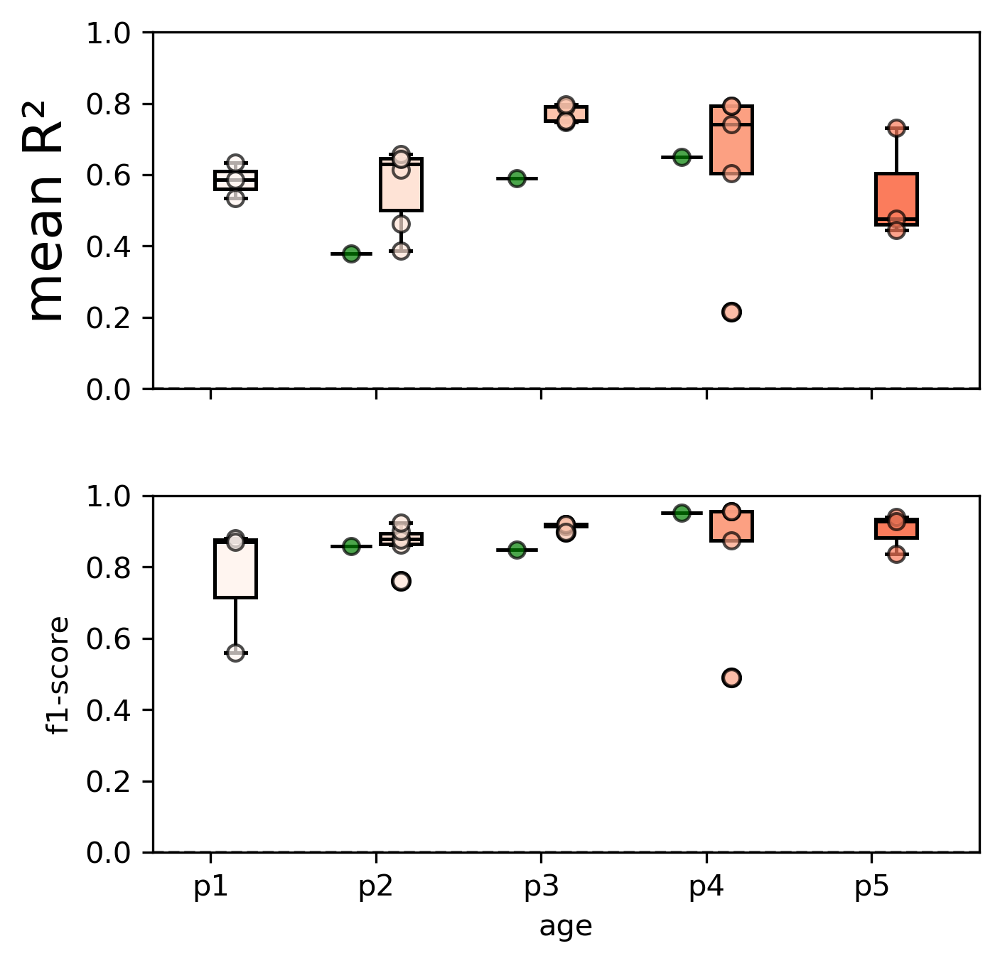

In [92]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
import re

# Colors
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

# Boxplot parameters
width = 0.25
offset = 0.15  # small offset for clarity

# Ages up to P5
ages_to_plot = [age for age in unique_ages if int(re.search(r'\d+', age).group(0)) <= 5]

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(5,5), dpi=300, sharex=True, gridspec_kw={'hspace':0.3})

# --- Top subplot: Linear decoder R² ---
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]
    
    # GABA (I) - slightly right
    gaba_r2 = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_r2) > 0:
        ax1.boxplot(gaba_r2, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=reds[i], edgecolor='black', linewidth=1.2),
                    whiskerprops=dict(color='black', linewidth=1.2),
                    capprops=dict(color='black', linewidth=1.2),
                    medianprops=dict(color='black', linewidth=1.2))
        ax1.scatter(np.full(len(gaba_r2), i + offset), gaba_r2,
                    color=reds[i], edgecolor='black', s=30, alpha=0.7, zorder=3)
    
    # EMX (E) - slightly left
    emx_r2 = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_r2) > 0:
        ax1.boxplot(emx_r2, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=green_color, edgecolor='black', linewidth=1.2),
                    whiskerprops=dict(color='black', linewidth=1.2),
                    capprops=dict(color='black', linewidth=1.2),
                    medianprops=dict(color='black', linewidth=1.2))
        ax1.scatter(np.full(len(emx_r2), i - offset), emx_r2,
                    color=green_color, edgecolor='black', s=30, alpha=0.7, zorder=3)

ax1.set_ylabel("mean R²", fontsize=18)
ax1.axhline(0, linestyle='--', color='grey', lw=1)
ax1.set_ylim(0, 1)

# --- Bottom subplot: Logistic decoder F1 ---
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]
    
    # GABA (I) - slightly right
    gaba_f1 = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_f1) > 0:
        ax2.boxplot(gaba_f1, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=reds[i], edgecolor='black', linewidth=1.2),
                    whiskerprops=dict(color='black', linewidth=1.2),
                    capprops=dict(color='black', linewidth=1.2),
                    medianprops=dict(color='black', linewidth=1.2))
        ax2.scatter(np.full(len(gaba_f1), i + offset), gaba_f1,
                    color=reds[i], edgecolor='black', s=30, alpha=0.7, zorder=3)
    
    # EMX (E) - slightly left
    emx_f1 = age_data[age_data['group'] == 'EMX']['f1_score_logistic']
    if len(emx_f1) > 0:
        ax2.boxplot(emx_f1, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=green_color, edgecolor='black', linewidth=1.2),
                    whiskerprops=dict(color='black', linewidth=1.2),
                    capprops=dict(color='black', linewidth=1.2),
                    medianprops=dict(color='black', linewidth=1.2))
        ax2.scatter(np.full(len(emx_f1), i - offset), emx_f1,
                    color=green_color, edgecolor='black', s=30, alpha=0.7, zorder=3)

ax2.set_xticks(range(len(ages_to_plot)))
ax2.set_xticklabels(ages_to_plot)
ax2.set_xlabel("age")
ax2.set_ylabel("f1-score")
ax2.axhline(0, linestyle='--', color='grey', lw=1)
ax2.set_ylim(0, 1)

# # Optional legend
# legend_handles = [
#     Patch(color=reds[len(reds)//2], label='I (GABA)'),
#     Patch(color=green_color, label='E (EMX)')
# ]
# ax1.legend(handles=legend_handles, fontsize=12, frameon=True, loc='upper right')

plt.tight_layout()
plt.show()

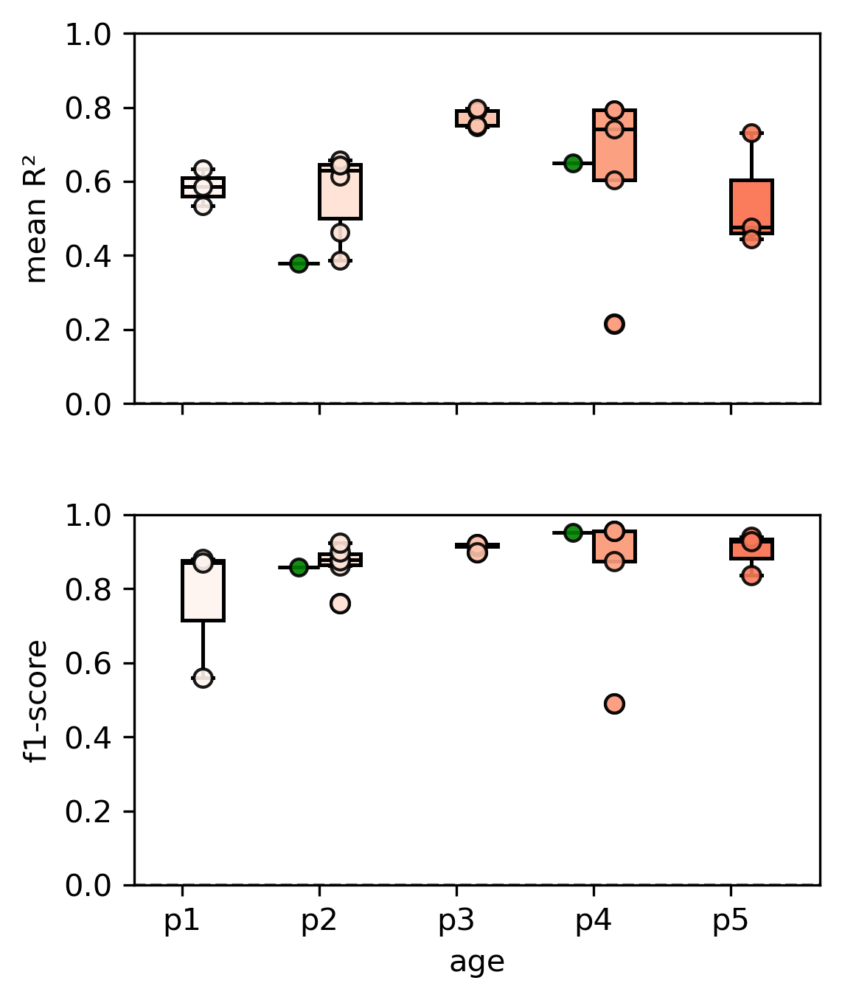

In [177]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
import re

# Colors
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

# Boxplot parameters
width = 0.30
offset = 0.15  # small offset for clarity

# Ages up to P5
ages_to_plot = [age for age in unique_ages if int(re.search(r'\d+', age).group(0)) <= 5]

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(4,5), dpi=300, sharex=True, gridspec_kw={'hspace':0.3})

# --- Top subplot: Linear decoder R² ---
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]
    
    # GABA (I) - slightly right
    gaba_r2 = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_r2) > 0:
        ax1.boxplot(gaba_r2, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=reds[i], edgecolor='black', linewidth=1.2),
                    whiskerprops=dict(color='black', linewidth=1.2),
                    capprops=dict(color='black', linewidth=1.2),
                    medianprops=dict(color='black', linewidth=1.2),
                    flierprops=dict(marker='o', markerfacecolor=reds[i],
                                    markeredgecolor='black', markersize=6, alpha=0.9))
        ax1.scatter(np.full(len(gaba_r2), i + offset), gaba_r2,
                    color=reds[i], edgecolor='black', s=30, alpha=0.9, zorder=3)
    
    # EMX (E) - slightly left
    emx_r2 = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_r2) > 0:
        ax1.boxplot(emx_r2, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=green_color, edgecolor='black', linewidth=1.2),
                    whiskerprops=dict(color='black', linewidth=1.2),
                    capprops=dict(color='black', linewidth=1.2),
                    medianprops=dict(color='black', linewidth=1.2),
                    flierprops=dict(marker='o', markerfacecolor=green_color,
                                    markeredgecolor='black', markersize=6, alpha=0.9))
        ax1.scatter(np.full(len(emx_r2), i - offset), emx_r2,
                    color=green_color, edgecolor='black', s=30, alpha=0.9, zorder=3)

ax1.set_ylabel("mean R²")
ax1.axhline(0, linestyle='--', color='grey', lw=1)
ax1.set_ylim(0, 1)

# --- Bottom subplot: Logistic decoder F1 ---
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]
    
    # GABA (I) - slightly right
    gaba_f1 = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_f1) > 0:
        ax2.boxplot(gaba_f1, positions=[i + offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=reds[i], edgecolor='black', linewidth=1.2),
                    whiskerprops=dict(color='black', linewidth=1.2),
                    capprops=dict(color='black', linewidth=1.2),
                    medianprops=dict(color='black', linewidth=1.2),
                    flierprops=dict(marker='o', markerfacecolor=reds[i],
                                    markeredgecolor='black', markersize=6, alpha=0.9))
        ax2.scatter(np.full(len(gaba_f1), i + offset), gaba_f1,
                    color=reds[i], edgecolor='black', s=35, alpha=0.9, zorder=3)
    
    # EMX (E) - slightly left
    emx_f1 = age_data[age_data['group'] == 'EMX']['f1_score_logistic']
    if len(emx_f1) > 0:
        ax2.boxplot(emx_f1, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=green_color, edgecolor='black', linewidth=1.2),
                    whiskerprops=dict(color='black', linewidth=1.2),
                    capprops=dict(color='black', linewidth=1.2),
                    medianprops=dict(color='black', linewidth=1.2),
                    flierprops=dict(marker='o', markerfacecolor=green_color,
                                    markeredgecolor='black', markersize=6, alpha=0.9))
        ax2.scatter(np.full(len(emx_f1), i - offset), emx_f1,
                    color=green_color, edgecolor='black', s=30, alpha=0.9, zorder=3)

ax2.set_xticks(range(len(ages_to_plot)))
ax2.set_xticklabels(ages_to_plot)
ax2.set_xlabel("age")
ax2.set_ylabel("f1-score")
ax2.axhline(0, linestyle='--', color='grey', lw=1)
ax2.set_ylim(0, 1)

# # Optional legend
# legend_handles = [
#     Patch(color=reds[len(reds)//2], label='I (GABA)'),
#     Patch(color=green_color, label='E (EMX)')
# ]
# ax1.legend(handles=legend_handles, fontsize=12, frameon=True, loc='upper right')

plt.tight_layout()
plt.show()


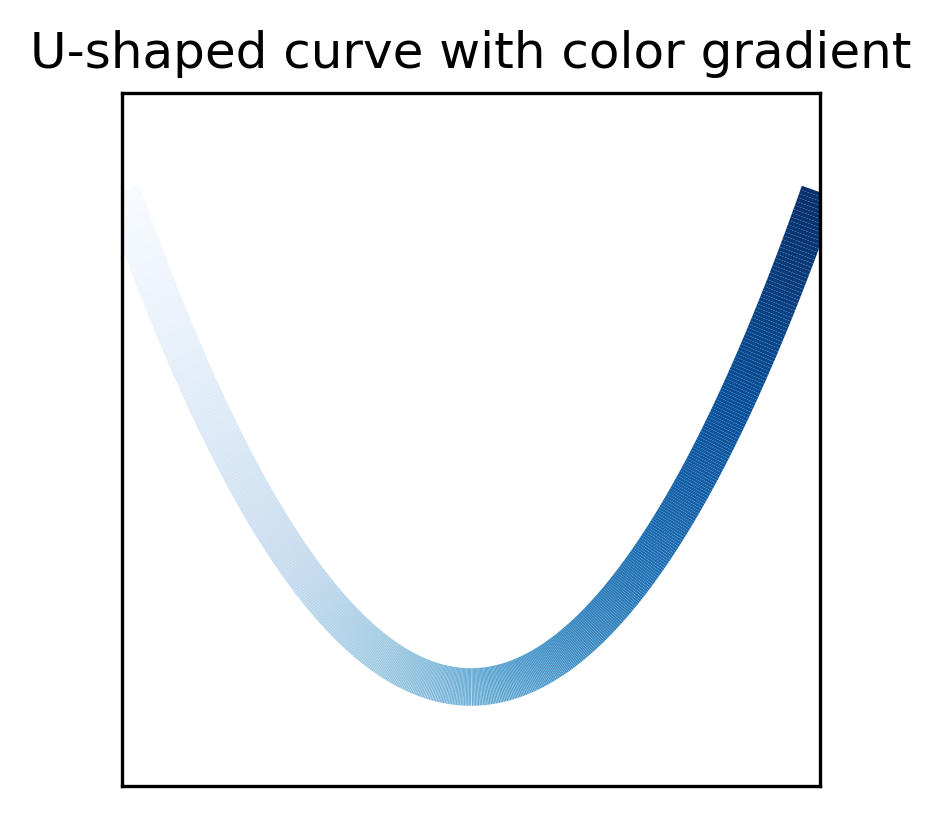

In [178]:
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, Normalize

# Define U-shape
x = np.linspace(0, 10, 500)
y = (x-5)**2 / 5  # basic U-shape, higher on right

# Color gradient: light blue to dark blue
cmap = plt.cm.Blues
norm = Normalize(vmin=x.min(), vmax=x.max())  # color varies along x

# Create segments for gradient
points = np.array([x, y]).T.reshape(-1,1,2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, Normalize

lc = LineCollection(segments, cmap=cmap, norm=norm, linewidth=9)
lc.set_array(x)

# Plot
fig, ax = plt.subplots(figsize=(3,3), dpi=300)
ax.add_collection(lc)
ax.set_xlim(x.min(), x.max())
ax.set_ylim(y.min()-1, y.max()+1)
# ax.set_xlabel("developmental time")
# ax.set_ylabel("state influence to network activity")
ax.set_xticks([])

ax.set_yticks([])
ax.set_title("U-shaped curve with color gradient")
plt.savefig(r'C:\Users\zaggila\'u.png', dpi=300)
plt.show()

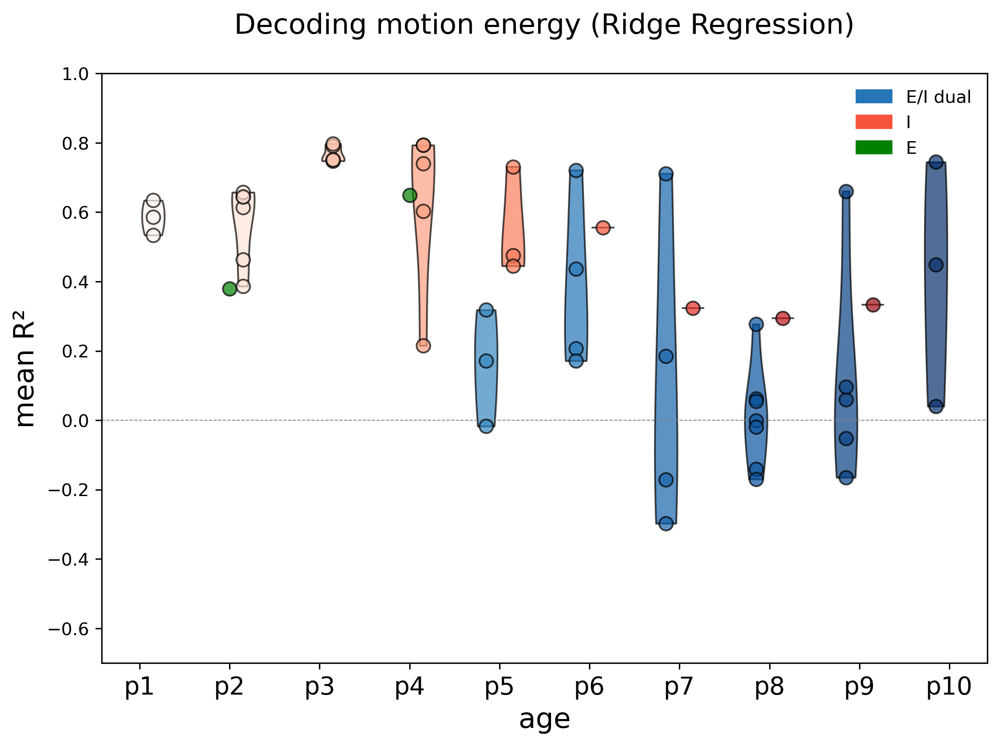

In [179]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Colors
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues_light = [plt.cm.Blues(0.4 + 0.6*i/max(1,len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

width = 0.7

plt.figure(figsize=(8,6), dpi=300)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        parts = plt.violinplot(dual_data, positions=[i-0.15], widths=0.25, showmeans=False, showmedians=False, showextrema=False)
        for pc in parts['bodies']:
            pc.set_facecolor(blues_light[i])
            pc.set_edgecolor('black')
            pc.set_alpha(0.7)
        plt.scatter(np.full(len(dual_data), i-0.15), dual_data,
                    color=blues_light[i], edgecolor='black', s=60, alpha=0.7, zorder=3)
    
    # GABA
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        parts = plt.violinplot(gaba_data, positions=[i+0.15], widths=0.25, showmeans=False, showmedians=False, showextrema=False)
        for pc in parts['bodies']:
            pc.set_facecolor(reds[i])
            pc.set_edgecolor('black')
            pc.set_alpha(0.7)
        plt.scatter(np.full(len(gaba_data), i+0.15), gaba_data,
                    color=reds[i], edgecolor='black', s=60, alpha=0.7, zorder=3)
    
    # EMX
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        plt.scatter(np.full(len(emx_data), i), emx_data,
                    color=green_color, edgecolor='black', s=60, alpha=0.7, zorder=3, label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=14)
plt.ylabel('mean R²', fontsize=16)
plt.xlabel('age', fontsize=16)
plt.title('Decoding motion energy (Ridge Regression)', fontsize=16, y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)

# Legend
legend_handles = [
    Patch(color=blues_light[len(blues_light)//2], label='E/I dual'),
    Patch(color=reds[len(reds)//2], label='I'),
    Patch(color=green_color, label='E')
]
plt.legend(handles=legend_handles, fontsize=10, frameon=False, loc='upper right')
plt.ylim(-0.7,1)
plt.tight_layout()
plt.show()

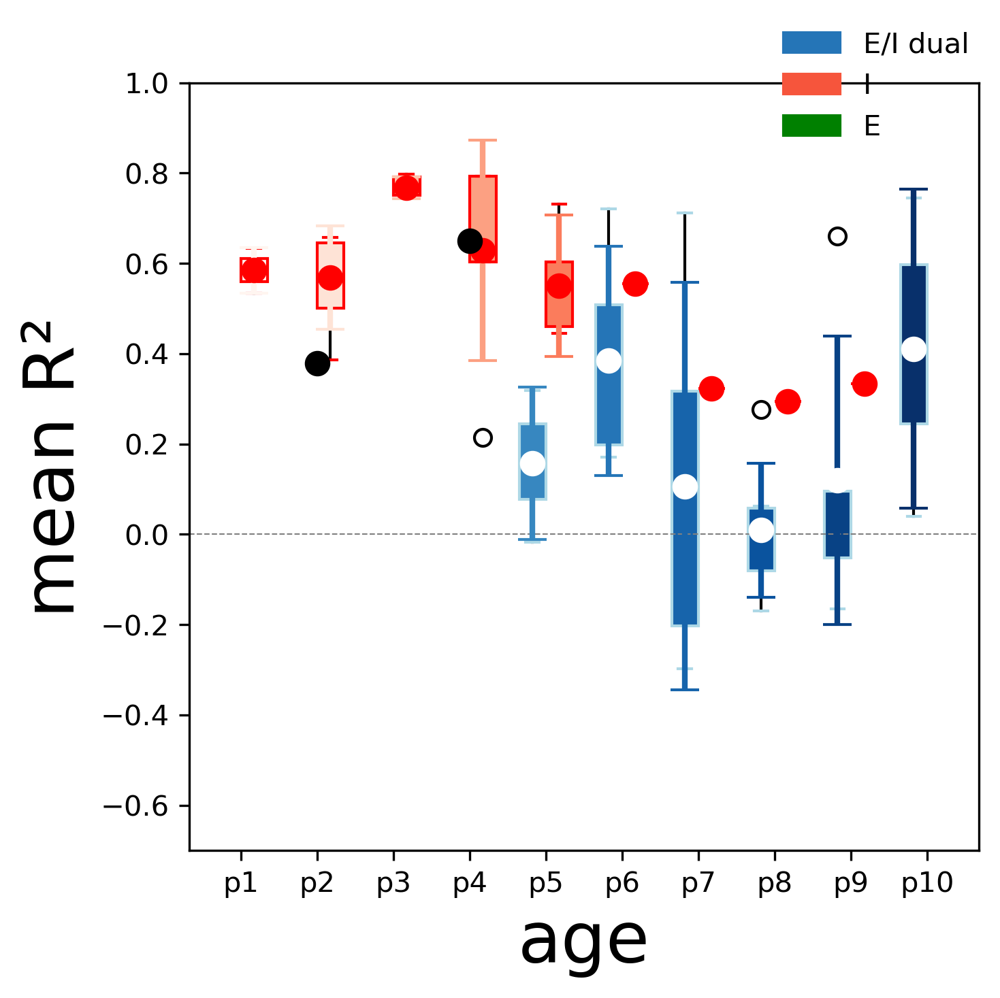

In [180]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Colors
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues_light = [plt.cm.Blues(0.4 + 0.6*i/max(1,len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

# Plot parameters
width = 0.35
offset = width / 2

plt.figure(figsize=(5,5), dpi=300)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # --- Dual Imaging (light blue) ---
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    dual_mean = dual_data.mean()
    dual_sd = dual_data.std()
    
    bp_dual = plt.boxplot(dual_data, positions=[i - offset], widths=width,
                          patch_artist=True, boxprops=dict(facecolor=blues_light[i], color='lightblue'),
                          whiskerprops=dict(color='black'), capprops=dict(color='lightblue'),
                          )
    
    # Remove median line
    for median in bp_dual['medians']:
        median.set_visible(False)
    
    # Add mean with symmetric error bars
    plt.errorbar(i - offset, dual_mean, yerr=dual_sd, fmt='o', color='white',
                 ecolor=blues_light[i], elinewidth=2, capsize=5, markersize=8, zorder=3)
    
    # --- GABA (red) ---
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    gaba_mean = gaba_data.mean()
    gaba_sd = gaba_data.std()
    
    bp_gaba = plt.boxplot(gaba_data, positions=[i + offset], widths=width,
                          patch_artist=True, boxprops=dict(facecolor=reds[i], color='red'),
                          whiskerprops=dict(color='black'), capprops=dict(color='red'),
                          )
    
    for median in bp_gaba['medians']:
        median.set_visible(False)
    
    plt.errorbar(i + offset, gaba_mean, yerr=gaba_sd, fmt='o', color='red',
                 ecolor=reds[i], elinewidth=2, capsize=5, markersize=8, zorder=3)
    
    # --- EMX (green) ---
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    emx_mean = emx_data.mean()
    emx_sd = emx_data.std()
    
    plt.errorbar(i, emx_mean, yerr=emx_sd, fmt='o', color='black',
                 ecolor=green_color, elinewidth=2, capsize=5, markersize=8, zorder=3,
                 label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages)
plt.ylabel('mean R²', fontsize=25)
plt.xlabel('age', fontsize=25)
# plt.title('Decoding motion energy (Ridge Regression)', y=1.05)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)

# Custom legend
legend_handles = [
    Patch(color=blues_light[len(blues_light)//2], label='E/I dual'),
    Patch(color=reds[len(reds)//2], label='I'),
    Patch(color=green_color, label='E')
]
plt.legend(handles=legend_handles, fontsize=10, frameon=False, loc='upper right', bbox_to_anchor=(1.02,1.1))

plt.ylim(-0.7,1)
plt.tight_layout()
plt.show()


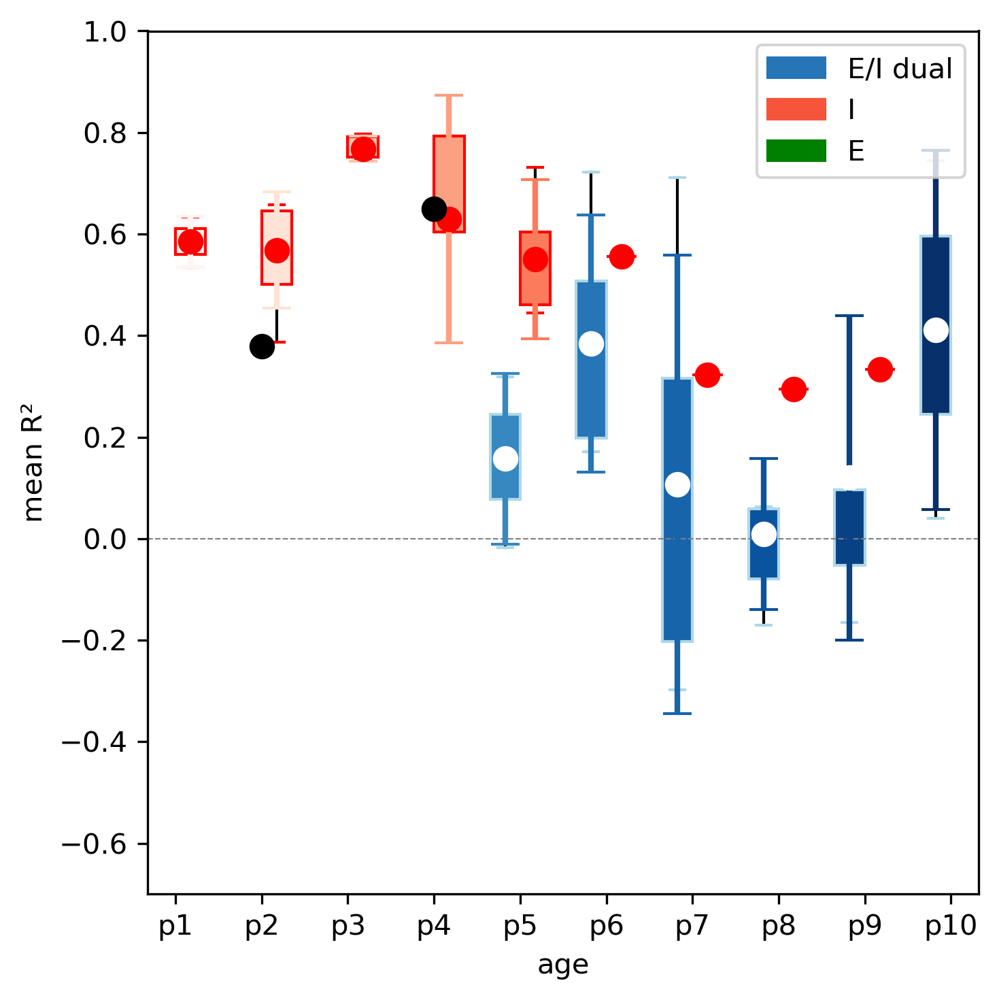

In [181]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Colors
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues_light = [plt.cm.Blues(0.4 + 0.6*i/max(1,len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

# Plot parameters
width = 0.35
offset = width / 2

plt.figure(figsize=(5,5), dpi=300)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # --- Dual Imaging (light blue) ---
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        dual_mean = dual_data.mean()
        dual_sd = dual_data.std()
        bp_dual = plt.boxplot(dual_data, positions=[i - offset], widths=width,
                              patch_artist=True,
                              boxprops=dict(facecolor=blues_light[i], color='lightblue'),
                              whiskerprops=dict(color='black'),
                              capprops=dict(color='lightblue'),
                              flierprops=dict(marker=''))  # hide outliers

        # Remove median line
        for median in bp_dual['medians']:
            median.set_visible(False)
        
        # Add mean ± SD
        plt.errorbar(i - offset, dual_mean, yerr=dual_sd, fmt='o',
                     color='white', ecolor=blues_light[i],
                     elinewidth=2, capsize=5, markersize=8, zorder=3)

    # --- GABA (red) ---
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        gaba_mean = gaba_data.mean()
        gaba_sd = gaba_data.std()
        bp_gaba = plt.boxplot(gaba_data, positions=[i + offset], widths=width,
                              patch_artist=True,
                              boxprops=dict(facecolor=reds[i], color='red'),
                              whiskerprops=dict(color='black'),
                              capprops=dict(color='red'),
                              flierprops=dict(marker=''))  # hide outliers

        for median in bp_gaba['medians']:
            median.set_visible(False)
        
        plt.errorbar(i + offset, gaba_mean, yerr=gaba_sd, fmt='o',
                     color='red', ecolor=reds[i],
                     elinewidth=2, capsize=5, markersize=8, zorder=3)

    # --- EMX (green) ---
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        emx_mean = emx_data.mean()
        emx_sd = emx_data.std()
        plt.errorbar(i, emx_mean, yerr=emx_sd, fmt='o',
                     color='black', ecolor=green_color,
                     elinewidth=2, capsize=5, markersize=8, zorder=3,
                     label='EMX' if i==0 else "")

plt.xticks(range(len(unique_ages)), unique_ages)
plt.ylabel('mean R²')
plt.xlabel('age')
plt.axhline(0, linestyle='--', color='grey', lw=0.5)

# Custom legend
legend_handles = [
    Patch(color=blues_light[len(blues_light)//2], label='E/I dual'),
    Patch(color=reds[len(reds)//2], label='I'),
    Patch(color=green_color, label='E')
]
plt.legend(handles=legend_handles, fontsize=10, frameon=True, loc='upper right')

plt.ylim(-0.7,1)
plt.tight_layout()
plt.show()


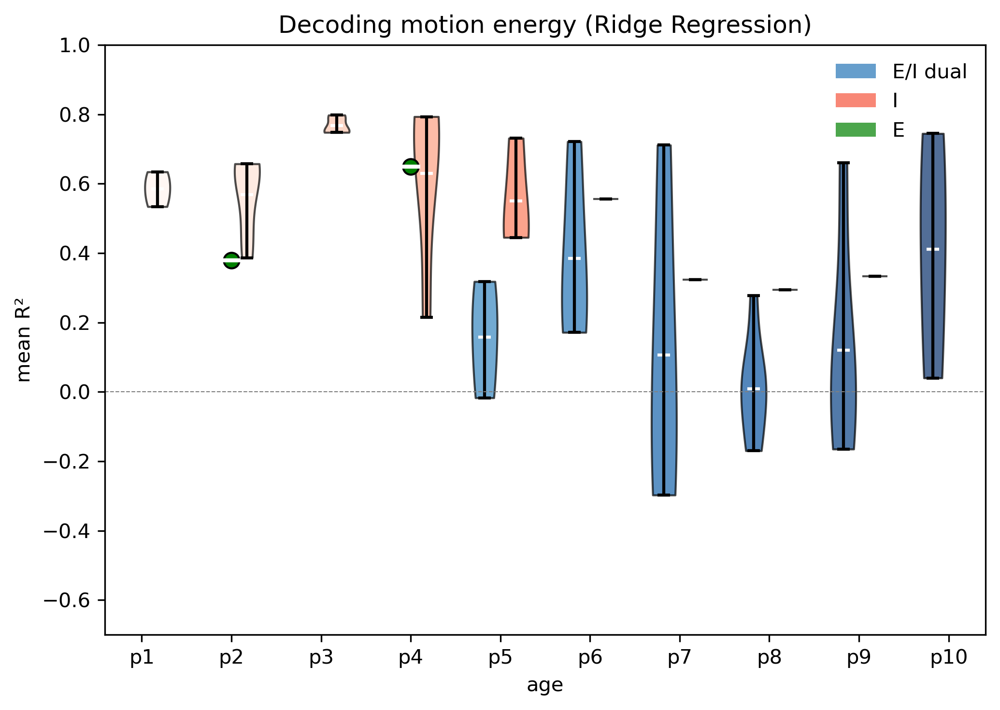

In [182]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Define colormaps
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues_light = [plt.cm.Blues(0.4 + 0.6*i/max(1,len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

# Plot parameters
width = 0.35
offset = width / 2

# --- Linear decoder R² per age ---
plt.figure(figsize=(7, 5), dpi=300)

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    # Dual Imaging (light blue) - violin plot
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear'].dropna()
    if len(dual_data) > 0:
        vp = plt.violinplot(dual_data, positions=[i - offset], widths=width*0.8, 
                           showmeans=True, showmedians=False, showextrema=True)
        vp['bodies'][0].set_facecolor(blues_light[i])
        vp['bodies'][0].set_edgecolor('black')
        vp['bodies'][0].set_alpha(0.7)
        vp['cbars'].set_color('black')
        vp['cmaxes'].set_color('black')
        vp['cmins'].set_color('black')
        vp['cmeans'].set_color('white')
        vp['cmeans'].set_linewidth(1.5)
    
    # GABA (red) - violin plot
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear'].dropna()
    if len(gaba_data) > 0:
        vp = plt.violinplot(gaba_data, positions=[i + offset], widths=width*0.8, 
                           showmeans=True, showmedians=False, showextrema=True)
        vp['bodies'][0].set_facecolor(reds[i])
        vp['bodies'][0].set_edgecolor('black')
        vp['bodies'][0].set_alpha(0.7)
        vp['cbars'].set_color('black')
        vp['cmaxes'].set_color('black')
        vp['cmins'].set_color('black')
        vp['cmeans'].set_color('white')
        vp['cmeans'].set_linewidth(1.5)
    
    # EMX (green) - individual points with mean line
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear'].dropna()
    if len(emx_data) > 0:
        # Plot individual points
        plt.scatter(np.full(len(emx_data), i), emx_data,
                   color=green_color, edgecolor='black', s=60, zorder=3, 
                   label='EMX' if i == 0 else "")
        # Add mean line
        plt.hlines(emx_data.mean(), i - width*0.3, i + width*0.3, 
                  color='white', linewidth=2, zorder=4)

plt.xticks(range(len(unique_ages)), unique_ages)
plt.ylabel('mean R²')
plt.xlabel('age')
plt.title('Decoding motion energy (Ridge Regression)')
plt.axhline(0, linestyle='--', color='grey', linewidth=0.5)

# Custom legend
legend_handles = [
    Patch(facecolor=blues_light[len(blues_light)//2], alpha=0.7, label='E/I dual'),
    Patch(facecolor=reds[len(reds)//2], alpha=0.7, label='I'),
    Patch(facecolor=green_color, alpha=0.7, label='E')
]
plt.legend(handles=legend_handles, frameon=False, loc='upper right')

plt.ylim(-0.7, 1)
plt.tight_layout()
plt.show()

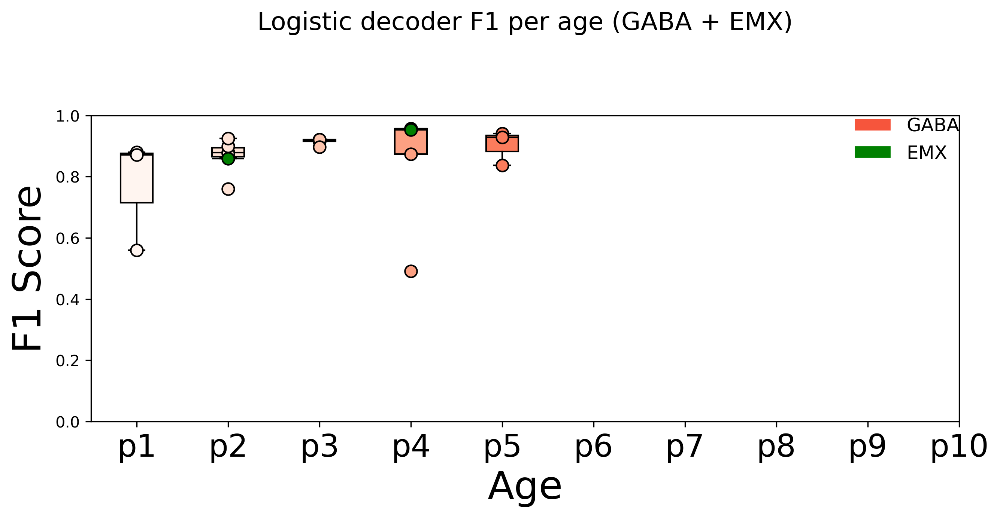

In [183]:
# Define colormaps
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

# Boxplot parameters
width = 0.35
offset = 0
max_gaba_age = 5  # up to P5

# --- Logistic decoder F1 per age (GABA + EMX) ---
fig, ax = plt.subplots(figsize=(9,5), dpi=300)

for i, age in enumerate(unique_ages):
    age_num = int(re.search(r'\d+', age).group(0))
    age_data = combined_df[combined_df['age'] == age]

    # Only consider ages <= P5 for GABA
    if age_num <= max_gaba_age:
        gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
        if len(gaba_data) > 0:
            ax.boxplot(gaba_data, positions=[i - offset], widths=width, patch_artist=True,
                       boxprops=dict(facecolor=reds[i], color='black'),
                       medianprops=dict(color='black'))
            ax.scatter(np.full(len(gaba_data), i - offset), gaba_data,
                       color=reds[i], edgecolor='black', s=60, zorder=3)

    # EMX all ages
    emx_data = age_data[age_data['group'] == 'EMX']['f1_score_logistic']
    if len(emx_data) > 0:
        ax.boxplot(emx_data, positions=[i + offset], widths=width, patch_artist=True,
                   boxprops=dict(facecolor=green_color, color='black'),
                   medianprops=dict(color='black'))
        ax.scatter(np.full(len(emx_data), i + offset), emx_data,
                   color=green_color, edgecolor='black', s=60, zorder=3)

# Axes formatting
ax.set_xticks(range(len(unique_ages)))
ax.set_xticklabels(unique_ages, fontsize=20)
ax.set_ylabel('F1 Score', fontsize=25)
ax.set_xlabel('Age', fontsize=25)
ax.set_title('Logistic decoder F1 per age (GABA + EMX)', fontsize=16, y=1.25)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)
ax.set_ylim(0, 1.0)

# Custom legend
legend_handles = [
    Patch(facecolor=reds[len(reds)//2], edgecolor='white', label='GABA'),
    Patch(facecolor=green_color, edgecolor='white', label='EMX')
]
ax.legend(handles=legend_handles, fontsize=12, frameon=False, loc='upper right', bbox_to_anchor=(1.02,1.05))

plt.tight_layout()
plt.show()

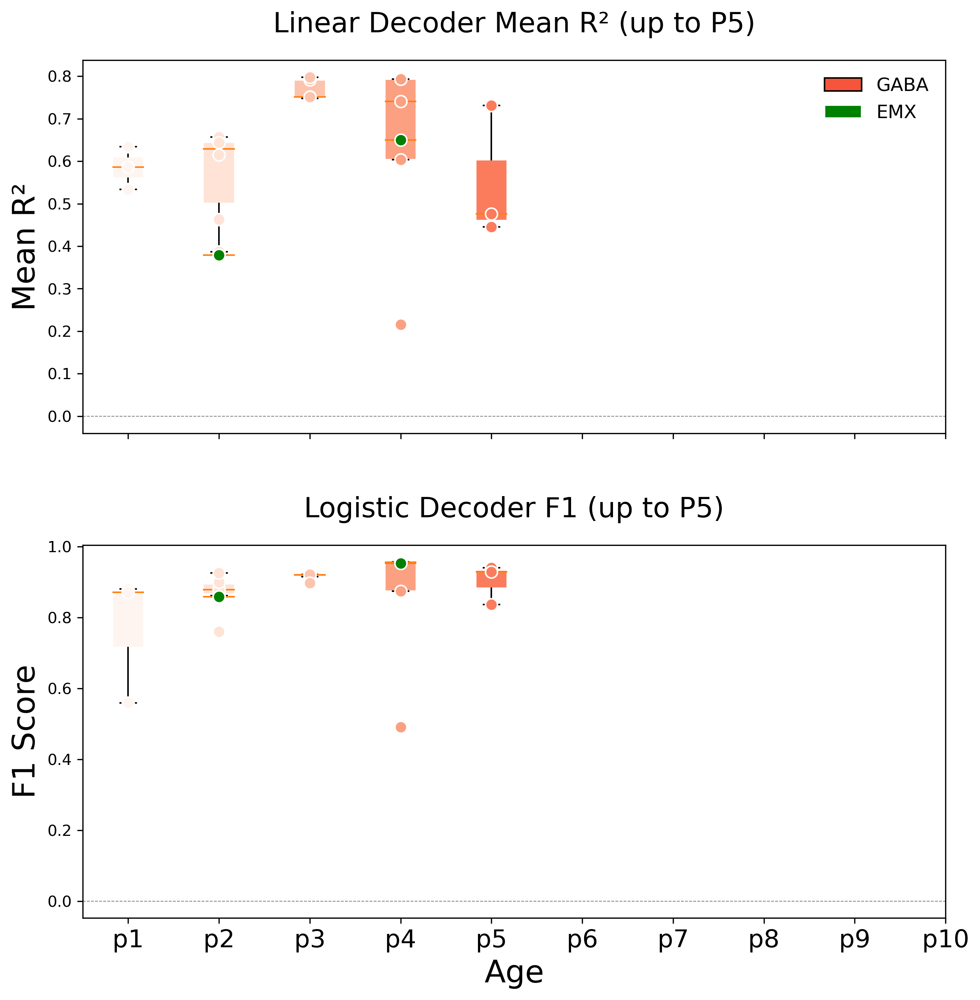

In [184]:
# Define colormaps
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

width = 0.35
offset = 0
max_gaba_age = 5  # up to P5

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10), dpi=300, sharex=True, gridspec_kw={'hspace':0.3})

# --- Top: Mean R² ---
for i, age in enumerate(unique_ages):
    age_num = int(re.search(r'\d+', age).group(0))
    age_data = combined_df[combined_df['age'] == age]

    if age_num <= max_gaba_age:
        gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
        if len(gaba_data) > 0:
            ax1.boxplot(gaba_data, positions=[i], widths=width, patch_artist=True,
                        boxprops=dict(facecolor=reds[i], color='w'),
                        )
            ax1.scatter(np.full(len(gaba_data), i), gaba_data, color=reds[i], edgecolor='w', s=60, zorder=3)

    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        ax1.boxplot(emx_data, positions=[i], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=green_color, color='w'),
                    )
        ax1.scatter(np.full(len(emx_data), i), emx_data, color=green_color, edgecolor='w', s=60, zorder=3)

ax1.set_ylabel('Mean R²', fontsize=20)
ax1.set_title('Linear Decoder Mean R² (up to P5)', fontsize=18, y=1.05)
ax1.axhline(0, linestyle='--', color='grey', lw=0.5)

legend_handles = [
    Patch(facecolor=reds[len(reds)//2], edgecolor='black', label='GABA'),
    Patch(facecolor=green_color, edgecolor='w', label='EMX')
]
ax1.legend(handles=legend_handles, fontsize=12, frameon=False, loc='upper right')

# --- Bottom: Logistic Decoder F1 ---
for i, age in enumerate(unique_ages):
    age_num = int(re.search(r'\d+', age).group(0))
    age_data = combined_df[combined_df['age'] == age]

    if age_num <= max_gaba_age:
        gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
        if len(gaba_data) > 0:
            ax2.boxplot(gaba_data, positions=[i], widths=width, patch_artist=True,
                        boxprops=dict(facecolor=reds[i], color='w'),
                        )
            ax2.scatter(np.full(len(gaba_data), i), gaba_data, color=reds[i], edgecolor='w', s=60, zorder=3)

    emx_data = age_data[age_data['group'] == 'EMX']['f1_score_logistic']
    if len(emx_data) > 0:
        ax2.boxplot(emx_data, positions=[i], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=green_color, color='w'),
                    )
        ax2.scatter(np.full(len(emx_data), i), emx_data, color=green_color, edgecolor='w', s=60, zorder=3)

ax2.set_ylabel('F1 Score', fontsize=20)
ax2.set_xlabel('Age', fontsize=20)
ax2.set_title('Logistic Decoder F1 (up to P5)', fontsize=18, y=1.05)
ax2.axhline(0, linestyle='--', color='grey', lw=0.5)

ax2.set_xticks(range(len(unique_ages)))
ax2.set_xticklabels(unique_ages, fontsize=16)

plt.tight_layout()
plt.show()

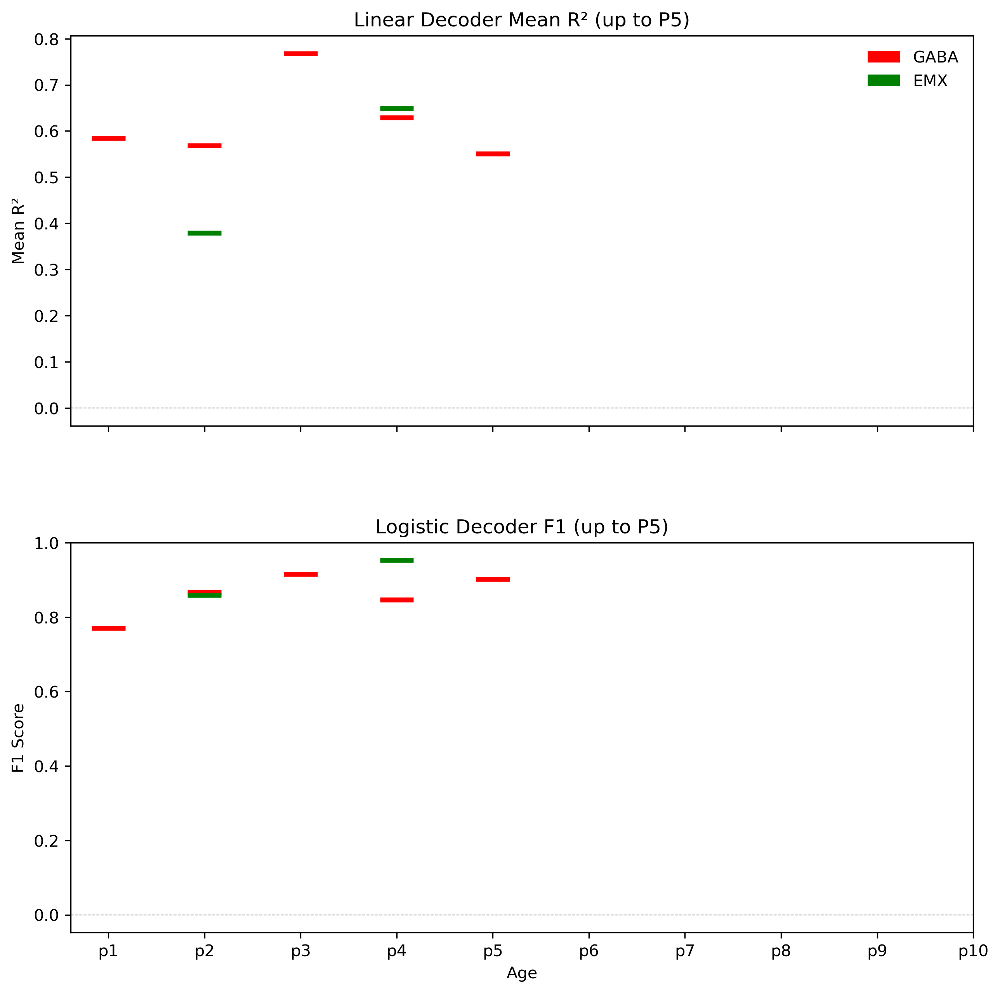

In [185]:
import matplotlib.pyplot as plt
import numpy as np
import re
from matplotlib.patches import Patch

# Define colormaps
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

max_gaba_age = 5  # up to P5
width = 0.35

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10), dpi=300, sharex=True, gridspec_kw={'hspace':0.3})

# --- Top: Mean R² ---
for i, age in enumerate(unique_ages):
    age_num = int(re.search(r'\d+', age).group(0))
    age_data = combined_df[combined_df['age'] == age]

    # GABA (≤ P5)
    if age_num <= max_gaba_age:
        gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
        if len(gaba_data) > 0:
            mean_val = np.mean(gaba_data)
            ax1.hlines(mean_val, i - width/2, i + width/2, colors='red', linewidth=3, zorder=5)

    # EMX (all ages)
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    if len(emx_data) > 0:
        mean_val = np.mean(emx_data)
        ax1.hlines(mean_val, i - width/2, i + width/2, colors=green_color, linewidth=3, zorder=5)

ax1.set_ylabel('Mean R²')
ax1.set_title('Linear Decoder Mean R² (up to P5)')
ax1.axhline(0, linestyle='--', color='grey', lw=0.5)

# Legend
legend_handles = [
    Patch(facecolor='red', label='GABA'),
    Patch(facecolor=green_color, label='EMX')
]
ax1.legend(handles=legend_handles, frameon=False, loc='upper right')

# --- Bottom: Logistic Decoder F1 ---
for i, age in enumerate(unique_ages):
    age_num = int(re.search(r'\d+', age).group(0))
    age_data = combined_df[combined_df['age'] == age]

    # GABA (≤ P5)
    if age_num <= max_gaba_age:
        gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
        if len(gaba_data) > 0:
            mean_val = np.mean(gaba_data)
            ax2.hlines(mean_val, i - width/2, i + width/2, colors='red', linewidth=3, zorder=5)

    # EMX (all ages)
    emx_data = age_data[age_data['group'] == 'EMX']['f1_score_logistic']
    if len(emx_data) > 0:
        mean_val = np.mean(emx_data)
        ax2.hlines(mean_val, i - width/2, i + width/2, colors=green_color, linewidth=3, zorder=5)

ax2.set_ylabel('F1 Score')
ax2.set_xlabel('Age')
ax2.set_title('Logistic Decoder F1 (up to P5)')
ax2.axhline(0, linestyle='--', color='grey', lw=0.5)

ax2.set_xticks(range(len(unique_ages)))
ax2.set_xticklabels(unique_ages)

plt.tight_layout()
plt.show()


In [186]:
all_plot_df['group'].unique()
combined_df = all_plot_df.copy()
combined_df = combined_df.dropna(subset=['r2_linear', 'f1_score_logistic'])
combined_df = all_plot_df.copy()
combined_df = combined_df[all_plot_df['group'].isin(['Dual Imaging','GABA','EMX'])]

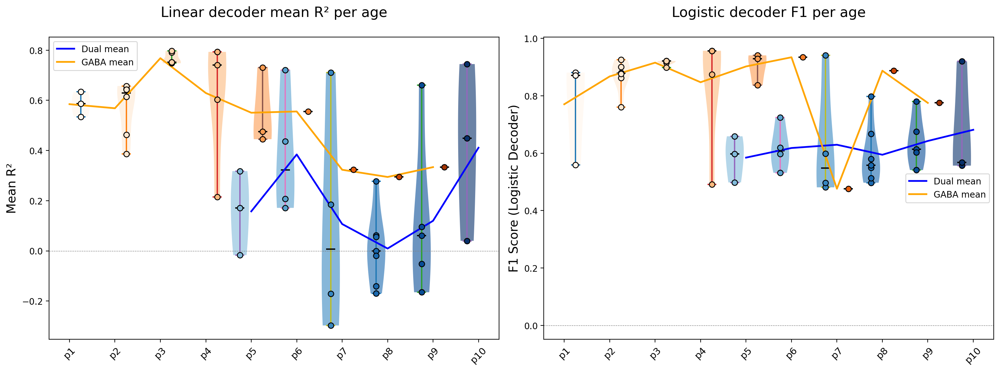

In [187]:
import re
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm

# Copy and drop missing
combined_df = all_plot_df.copy()
combined_df = combined_df.dropna(subset=['r2_linear', 'f1_score_logistic'])

# Function to get numeric part of age for sorting
def extract_age_num(age_label):
    match = re.search(r'\d+', str(age_label))
    return int(match.group(0)) if match else -1

# Sorted ages
unique_ages = sorted(combined_df['age'].unique(), key=extract_age_num)
num_ages = len(unique_ages)

# Colormaps
blues = [cm.Blues(i / max(1, num_ages - 1)) for i in range(num_ages)]
oranges = [cm.Oranges(i / max(1, num_ages - 1)) for i in range(num_ages)]
age2blue = dict(zip(unique_ages, blues))
age2orange = dict(zip(unique_ages, oranges))

width = 0.25  # offset distance between violins

fig, axs = plt.subplots(1, 2, figsize=(16, 6), dpi=200, sharex=True)

# --- Plot Linear Decoder R² ---
means_dual_r2 = []
means_gaba_r2 = []

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]

    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        parts = axs[0].violinplot(dual_data, positions=[i - width], widths=0.4,
                                  showmeans=False, showmedians=True)
        for pc in parts['bodies']:
            pc.set_facecolor(age2blue[age]); pc.set_alpha(0.6)
        parts['cmedians'].set_color("black")
        axs[0].scatter(np.full(len(dual_data), i - width), dual_data,
                       color=age2blue[age], edgecolor='black', s=40, zorder=3)
        means_dual_r2.append(np.mean(dual_data))
    else:
        means_dual_r2.append(np.nan)

    # GABA (orange)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_data) > 0:
        parts = axs[0].violinplot(gaba_data, positions=[i + width], widths=0.4,
                                  showmeans=False, showmedians=True)
        for pc in parts['bodies']:
            pc.set_facecolor(age2orange[age]); pc.set_alpha(0.6)
        parts['cmedians'].set_color("black")
        axs[0].scatter(np.full(len(gaba_data), i + width), gaba_data,
                       color=age2orange[age], edgecolor='black', s=40, zorder=3)
        means_gaba_r2.append(np.mean(gaba_data))
    else:
        means_gaba_r2.append(np.nan)

# Add mean trend lines
axs[0].plot(range(len(unique_ages)), means_dual_r2, color="blue", lw=2, label="Dual mean")
axs[0].plot(range(len(unique_ages)), means_gaba_r2, color="orange", lw=2, label="GABA mean")

axs[0].set_xticks(range(len(unique_ages)))
axs[0].set_xticklabels(unique_ages, rotation=45, fontsize=11)
axs[0].set_ylabel('Mean R²', fontsize=14)
axs[0].set_title('Linear decoder mean R² per age', fontsize=16, y=1.05)
axs[0].axhline(0, linestyle='--', color='grey', lw=0.5)
axs[0].legend()


# --- Plot Logistic Decoder F1 Score ---
means_dual_f1 = []
means_gaba_f1 = []

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]

    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_score_logistic']
    if len(dual_data) > 0:
        parts = axs[1].violinplot(dual_data, positions=[i - width], widths=0.4,
                                  showmeans=False, showmedians=True)
        for pc in parts['bodies']:
            pc.set_facecolor(age2blue[age]); pc.set_alpha(0.6)
        parts['cmedians'].set_color("black")
        axs[1].scatter(np.full(len(dual_data), i - width), dual_data,
                       color=age2blue[age], edgecolor='black', s=40, zorder=3)
        means_dual_f1.append(np.mean(dual_data))
    else:
        means_dual_f1.append(np.nan)

    # GABA (orange)
    gaba_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_data) > 0:
        parts = axs[1].violinplot(gaba_data, positions=[i + width], widths=0.4,
                                  showmeans=False, showmedians=True)
        for pc in parts['bodies']:
            pc.set_facecolor(age2orange[age]); pc.set_alpha(0.6)
        parts['cmedians'].set_color("black")
        axs[1].scatter(np.full(len(gaba_data), i + width), gaba_data,
                       color=age2orange[age], edgecolor='black', s=40, zorder=3)
        means_gaba_f1.append(np.mean(gaba_data))
    else:
        means_gaba_f1.append(np.nan)

# Add mean trend lines
axs[1].plot(range(len(unique_ages)), means_dual_f1, color="blue", lw=2, label="Dual mean")
axs[1].plot(range(len(unique_ages)), means_gaba_f1, color="orange", lw=2, label="GABA mean")

axs[1].set_xticks(range(len(unique_ages)))
axs[1].set_xticklabels(unique_ages, rotation=45, fontsize=11)
axs[1].set_ylabel('F1 Score (Logistic Decoder)', fontsize=14)
axs[1].set_title('Logistic decoder F1 per age', fontsize=16, y=1.05)
axs[1].axhline(0, linestyle='--', color='grey', lw=0.5)
axs[1].legend()

plt.tight_layout()
plt.show()


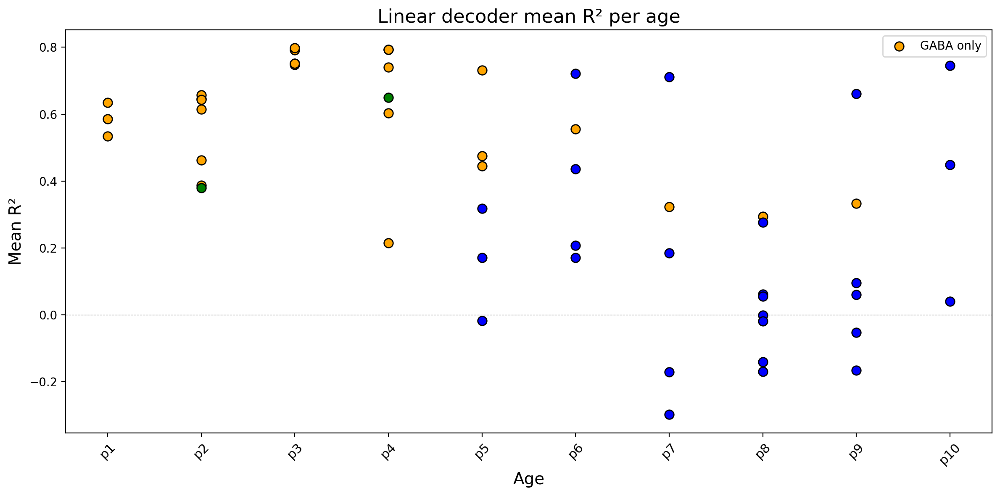

KeyError: 'f1_class1'

<Figure size 2400x1200 with 0 Axes>

In [188]:
# 1️⃣ Add f1_class1 when loading sessions
# Inside load_sessions(), add:

# 2️⃣ After loading all sessions
all_data = gaba_data + dual_data + emx_data
all_plot_df = pd.concat([gaba_plot_df, dual_plot_df, emx_plot_df], ignore_index=True)

# 3️⃣ Define group type per age/session
def assign_group_type(row):
    gaba_flag = row['group'] == 'GABA'
    emx_flag = row['group'] == 'EMX'
    if gaba_flag and not emx_flag:
        return "GABA only"
    elif emx_flag and not gaba_flag:
        return "EMX only"
    elif gaba_flag and emx_flag:
        return "Both"
    else:
        return row['group']

combined_df['group_type'] = combined_df.apply(assign_group_type, axis=1)

# 4️⃣ Colors
group_colors = {
    'GABA only': 'orange',
    'EMX only': 'green',
    'Both': 'purple',
    'Dual Imaging': 'blue'
}

# 5️⃣ Plot Linear R² and Logistic F1 (class 1)
plt.figure(figsize=(12,6), dpi=200)
width = 0.25
offset = width/2

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    for group_name, color in group_colors.items():
        group_data = age_data[age_data['group_type']==group_name]
        
        # Linear R²
        r2_data = group_data['r2_linear']
        if len(r2_data) > 0:
            plt.scatter(np.full(len(r2_data), i), r2_data, color=color, edgecolor='black', s=60, zorder=3,
                        label=group_name if i==0 else "")
            
plt.xticks(range(len(unique_ages)), unique_ages, rotation=45, fontsize=11)
plt.ylabel('Mean R²', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Linear decoder mean R² per age', fontsize=16)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.legend()
plt.tight_layout()
plt.show()

# 6️⃣ Logistic F1 (class 1)
plt.figure(figsize=(12,6), dpi=200)
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    for group_name, color in group_colors.items():
        group_data = age_data[age_data['group_type']==group_name]
        
        f1_class1_data = group_data['f1_class1']
        if len(f1_class1_data) > 0:
            plt.scatter(np.full(len(f1_class1_data), i), f1_class1_data, color=color,
                        edgecolor='black', s=60, zorder=3, label=group_name if i==0 else "")
            
plt.xticks(range(len(unique_ages)), unique_ages, rotation=45, fontsize=11)
plt.ylabel('F1 Score (Class 1)', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Logistic decoder F1 (Class 1) per age', fontsize=16)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.legend()
plt.tight_layout()
plt.show()


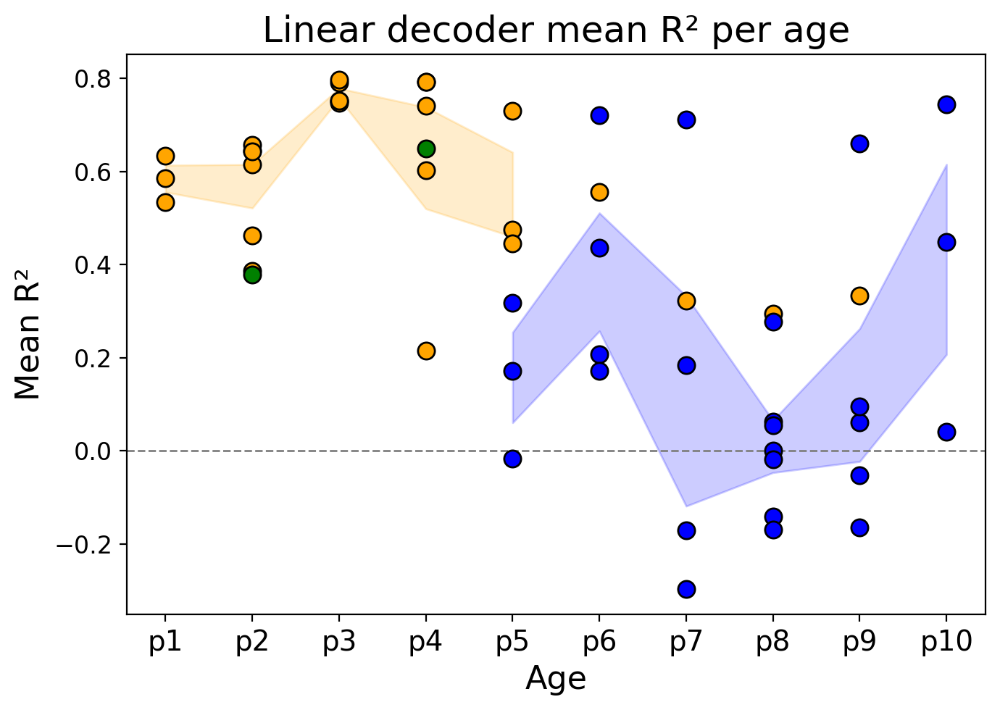

KeyError: 'f1_class1'

<Figure size 2800x1200 with 0 Axes>

In [189]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import sem

# Ensure group_type exists
def assign_group_type(row):
    gaba_flag = row['group'] == 'GABA'
    emx_flag = row['group'] == 'EMX'
    if gaba_flag and not emx_flag:
        return "GABA only"
    elif emx_flag and not gaba_flag:
        return "EMX only"
    elif gaba_flag and emx_flag:
        return "Both"
    else:
        return row['group']

combined_df['group_type'] = combined_df.apply(assign_group_type, axis=1)

# Colors
group_colors = {
    'GABA only': 'orange',
    'EMX only': 'green',   # points only
    'Both': 'purple',
    'Dual Imaging': 'blue'
}

# --- Linear R² ---
plt.figure(figsize=(7,5), dpi=200)
for group_name, color in group_colors.items():
    means = []
    sems = []
    x_vals = []
    
    for i, age in enumerate(unique_ages):
        age_data = combined_df[combined_df['age'] == age]
        group_data = age_data[age_data['group_type']==group_name]
        
        r2_data = group_data['r2_linear']
        if len(r2_data) > 0:
            # Include green points inside orange line
            plot_color = 'orange' if group_name in ['GABA only', 'Both'] else color
            plt.scatter(np.full(len(r2_data), i), r2_data, color=plot_color, edgecolor='black', s=70, zorder=3)
            
            # Compute mean & SEM
            m = np.mean(r2_data)
            s = sem(r2_data)
            means.append(m)
            sems.append(s)
            x_vals.append(i)
    
    if means:
        means = np.array(means)
        sems = np.array(sems)
        # Dashed line for mean
        # plt.plot(x_vals, means, '--', color=color if group_name not in ['EMX only'] else 'orange', lw=2)
        # Fill between mean ± SEM
        plt.fill_between(x_vals, means - sems, means + sems, color=color if group_name not in ['EMX only'] else 'orange', alpha=0.2)

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=14)
plt.yticks(fontsize=12)
plt.ylabel('Mean R²', fontsize=16)
plt.xlabel('Age', fontsize=16)
plt.title('Linear decoder mean R² per age', fontsize=18)
plt.axhline(0, linestyle='--', color='grey', lw=1)
plt.tight_layout()
plt.show()

# --- Logistic F1 (Class 1) ---
plt.figure(figsize=(14,6), dpi=200)
for group_name, color in group_colors.items():
    means = []
    sems = []
    x_vals = []
    
    for i, age in enumerate(unique_ages):
        age_data = combined_df[combined_df['age'] == age]
        group_data = age_data[age_data['group_type']==group_name]
        
        f1_data = group_data['f1_class1']
        if len(f1_data) > 0:
            plot_color = 'orange' if group_name in ['GABA only', 'Both'] else color
            plt.scatter(np.full(len(f1_data), i), f1_data, color=plot_color, edgecolor='black', s=70, zorder=3)
            
            m = np.mean(f1_data)
            s = sem(f1_data)
            means.append(m)
            sems.append(s)
            x_vals.append(i)
    
    # if means:
    #     means = np.array(means)
    #     sems = np.array(sems)
    #     plt.plot(x_vals, means, '--', color=color if group_name not in ['EMX only'] else 'orange', lw=2)
    #     plt.fill_between(x_vals, means - sems, means + sems, color=color if group_name not in ['EMX only'] else 'orange', alpha=0.2)

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=14)
plt.yticks(fontsize=12)
plt.ylabel('F1 Score (Class 1)', fontsize=16)
plt.xlabel('Age', fontsize=16)
plt.title('Logistic decoder F1 (Class 1) per age', fontsize=18)
plt.axhline(0, linestyle='--', color='grey', lw=1)
plt.tight_layout()
plt.show()


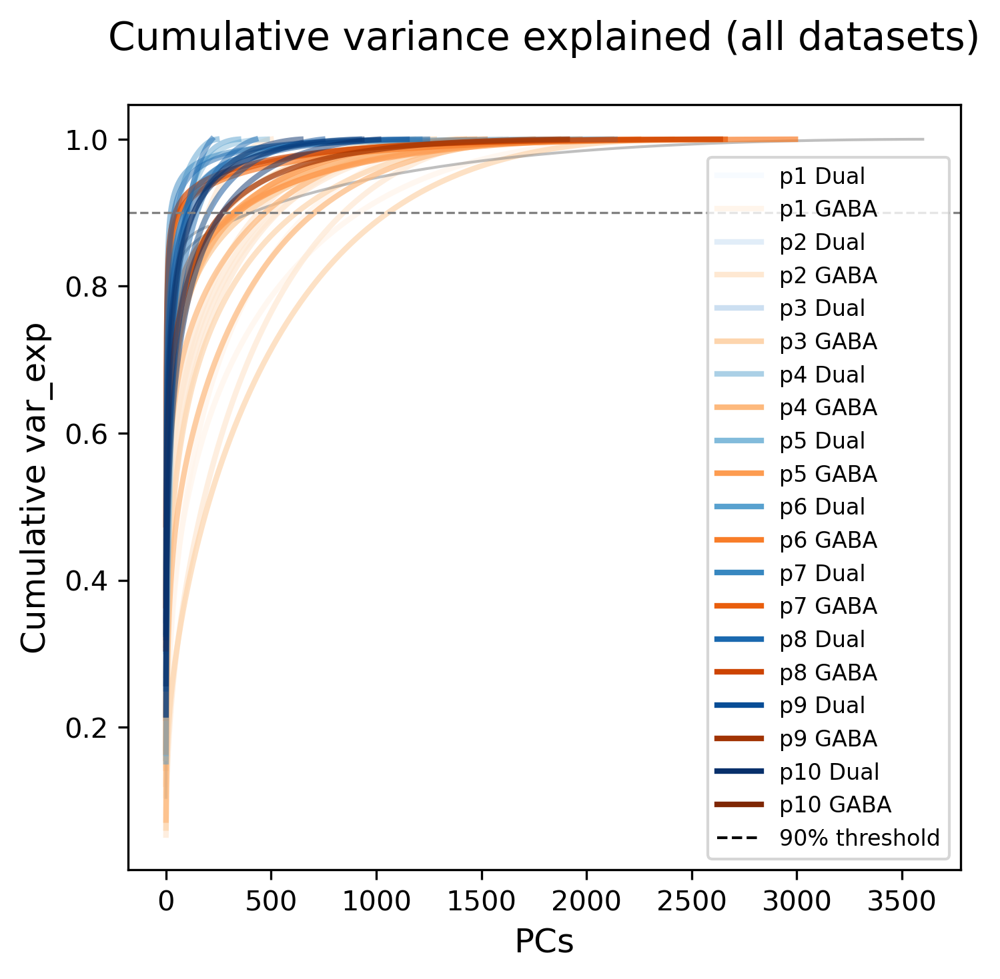

In [334]:
# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

# Collect all valid datasets with group info
valid_rows = []
for idx, row in combined_df.iterrows():
    var_exp_cell = row.get('var_exp_time', None)
    group = row.get('group', 'Unknown')
    if var_exp_cell is not None:
        age_val = str(row.get('age', ''))
        age_label = f'p{age_val}' if not age_val.lower().startswith('p') else age_val
        valid_rows.append((row['session'], age_label, var_exp_cell, group))

# Sort by numeric age
valid_rows = sorted(valid_rows, key=lambda x: extract_age_num(x[1]))
unique_ages = sorted(set(age for _, age, _, _ in valid_rows), key=extract_age_num)
num_ages = len(unique_ages)

# Assign age-colormaps for each group
blues = [cm.Blues(i / max(1, num_ages-1)) for i in range(num_ages)]
oranges = [cm.Oranges(i / max(1, num_ages-1)) for i in range(num_ages)]
age2blue = dict(zip(unique_ages, blues))
age2orange = dict(zip(unique_ages, oranges))

# Plot cumulative variance curves
plt.figure(figsize=(5,5), dpi=300)
threshold = 0.90

for session, age, var_exp, group in valid_rows:
    cum_var = np.cumsum(var_exp)
    if group.lower() == 'dual imaging':
        plt.plot(cum_var, color=age2blue[age], lw=2, alpha=0.5)
    elif group.lower() == 'gaba':
        plt.plot(cum_var, color=age2orange[age], lw=2, alpha=0.7)
    else:
        plt.plot(cum_var, color='grey', lw=1, alpha=0.5)

# Reference line
plt.axhline(y=threshold, color='grey', linestyle='--', lw=0.8, label=f'{threshold*100:.0f}% threshold')

plt.title("Cumulative variance explained (all datasets)", fontsize=14, y=1.05)
plt.xlabel("PCs", fontsize=12)
plt.ylabel("Cumulative var_exp", fontsize=12)

# Legend: one entry per age per group
handles, labels = [], []
for age in unique_ages:
    handles.append(plt.Line2D([], [], color=age2blue[age], lw=2))
    labels.append(f'{age} Dual')
    handles.append(plt.Line2D([], [], color=age2orange[age], lw=2))
    labels.append(f'{age} GABA')

# Add threshold line
handles.append(plt.Line2D([], [], color='black', lw=1, linestyle='--'))
labels.append(f'{threshold*100:.0f}% threshold')

plt.legend(handles, labels, fontsize=8, loc='lower right')
plt.tight_layout()
plt.show()

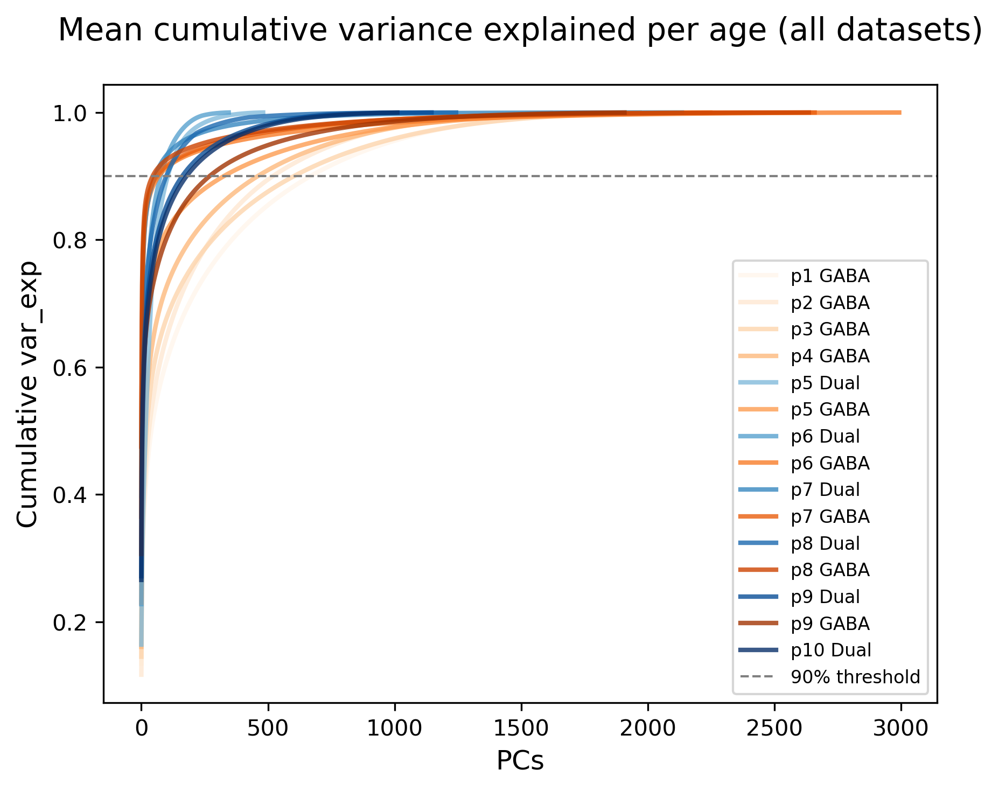

In [335]:
# mean per age 
# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

# Collect all valid datasets with group info
valid_rows = []
for idx, row in combined_df.iterrows():
    var_exp_cell = row.get('var_exp_time', None)
    group = row.get('group', 'Unknown')
    if var_exp_cell is not None:
        age_val = str(row.get('age', ''))
        age_label = f'p{age_val}' if not age_val.lower().startswith('p') else age_val
        valid_rows.append((row['session'], age_label, var_exp_cell, group))

# Sort by numeric age
valid_rows = sorted(valid_rows, key=lambda x: extract_age_num(x[1]))
unique_ages = sorted(set(age for _, age, _, _ in valid_rows), key=extract_age_num)
num_ages = len(unique_ages)

# Assign age-colormaps for each group
blues = [cm.Blues(i / max(1, num_ages-1)) for i in range(num_ages)]
oranges = [cm.Oranges(i / max(1, num_ages-1)) for i in range(num_ages)]
age2blue = dict(zip(unique_ages, blues))
age2orange = dict(zip(unique_ages, oranges))

# Organize sessions by group and age
group_age_data = {'dual imaging': {}, 'gaba': {}}
for _, age, var_exp, group in valid_rows:
    grp = group.lower()
    if grp in group_age_data:
        if age not in group_age_data[grp]:
            group_age_data[grp][age] = []
        cum_var = np.cumsum(var_exp) / np.sum(var_exp)  # normalize
        group_age_data[grp][age].append(cum_var)

# Plot mean cumulative variance curves per age per group
plt.figure(figsize=(6,5), dpi=300)
threshold = 0.90

for age in unique_ages:
    # Dual Imaging
    dual_curves = group_age_data['dual imaging'].get(age, [])
    if dual_curves:
        max_len = max(len(c) for c in dual_curves)
        padded_curves = [np.pad(c, (0, max_len - len(c)), mode='edge') for c in dual_curves]
        mean_dual = np.mean(padded_curves, axis=0)
        plt.plot(mean_dual, color=age2blue[age], lw=2, alpha=0.8, label=f'{age} Dual')
    # GABA
    gaba_curves = group_age_data['gaba'].get(age, [])
    if gaba_curves:
        max_len = max(len(c) for c in gaba_curves)
        padded_curves = [np.pad(c, (0, max_len - len(c)), mode='edge') for c in gaba_curves]
        mean_gaba = np.mean(padded_curves, axis=0)
        plt.plot(mean_gaba, color=age2orange[age], lw=2, alpha=0.8, label=f'{age} GABA')

# Reference line
plt.axhline(y=threshold, color='grey', linestyle='--', lw=1, label=f'{threshold*100:.0f}% threshold')

plt.title("Mean cumulative variance explained per age (all datasets)", fontsize=14, y=1.05)
plt.xlabel("PCs", fontsize=12)
plt.ylabel("Cumulative var_exp", fontsize=12)
plt.legend(fontsize=8, loc='lower right')
plt.tight_layout()
plt.show()

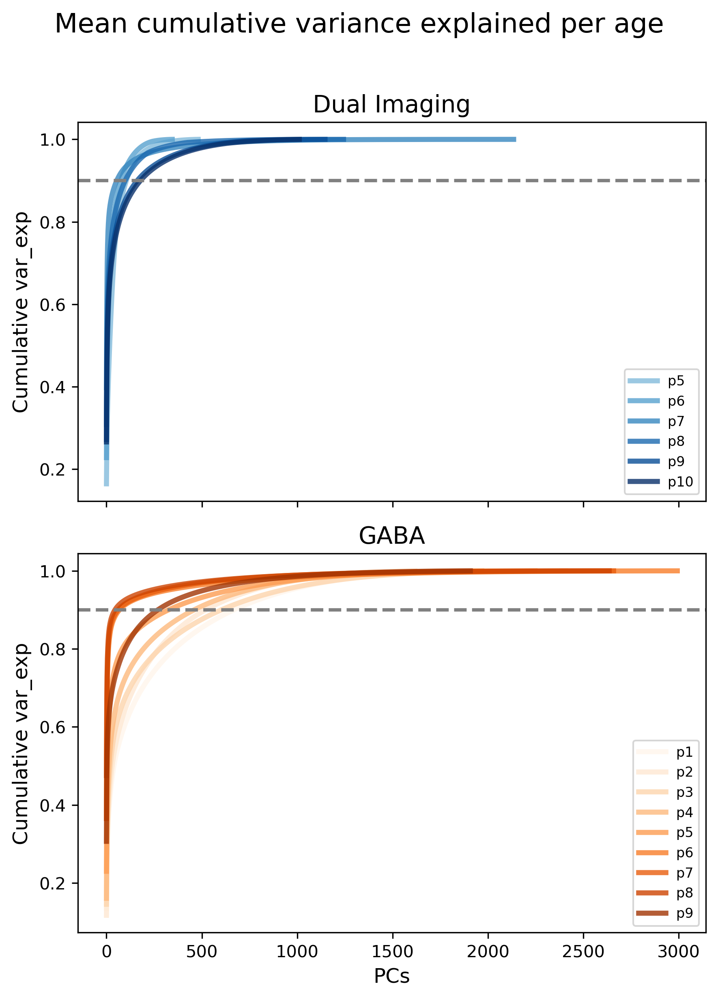

In [336]:
import matplotlib.pyplot as plt
import numpy as np

# Create figure and subplots
fig, axes = plt.subplots(2, 1, figsize=(6, 8), dpi=300, sharex=True)
threshold = 0.90

# --- Dual Imaging ---
ax = axes[0]
for age in unique_ages:
    dual_curves = group_age_data['dual imaging'].get(age, [])
    if dual_curves:
        max_len = max(len(c) for c in dual_curves)
        padded_curves = [np.pad(c, (0, max_len - len(c)), mode='edge') for c in dual_curves]
        mean_dual = np.mean(padded_curves, axis=0)
        ax.plot(mean_dual, color=age2blue[age], lw=3, alpha=0.8, label=f'{age}')
ax.axhline(y=threshold, color='grey', linestyle='--', lw=2)
ax.set_title("Dual Imaging", fontsize=14)
ax.set_ylabel("Cumulative var_exp", fontsize=12)
ax.legend(fontsize=8, loc='lower right')

# --- GABA ---
ax = axes[1]
for age in unique_ages:
    gaba_curves = group_age_data['gaba'].get(age, [])
    if gaba_curves:
        max_len = max(len(c) for c in gaba_curves)
        padded_curves = [np.pad(c, (0, max_len - len(c)), mode='edge') for c in gaba_curves]
        mean_gaba = np.mean(padded_curves, axis=0)
        ax.plot(mean_gaba, color=age2orange[age], lw=3, alpha=0.8, label=f'{age}')
ax.axhline(y=threshold, color='grey', linestyle='--', lw=2)
ax.set_title("GABA", fontsize=14)
ax.set_xlabel("PCs", fontsize=12)
ax.set_ylabel("Cumulative var_exp", fontsize=12)
ax.legend(fontsize=8, loc='lower right')

plt.suptitle("Mean cumulative variance explained per age", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()


In [337]:
def assign_group_type(row):
    gaba_flag = row['group'] == 'GABA'
    emx_flag = row['group'] == 'EMX'
    if gaba_flag and not emx_flag:
        return "GABA only"
    elif emx_flag and not gaba_flag:
        return "EMX only"
    elif gaba_flag and emx_flag:
        return "Both"
    else:
        return row['group']  # fallback

combined_df['group_type'] = combined_df.apply(assign_group_type, axis=1)

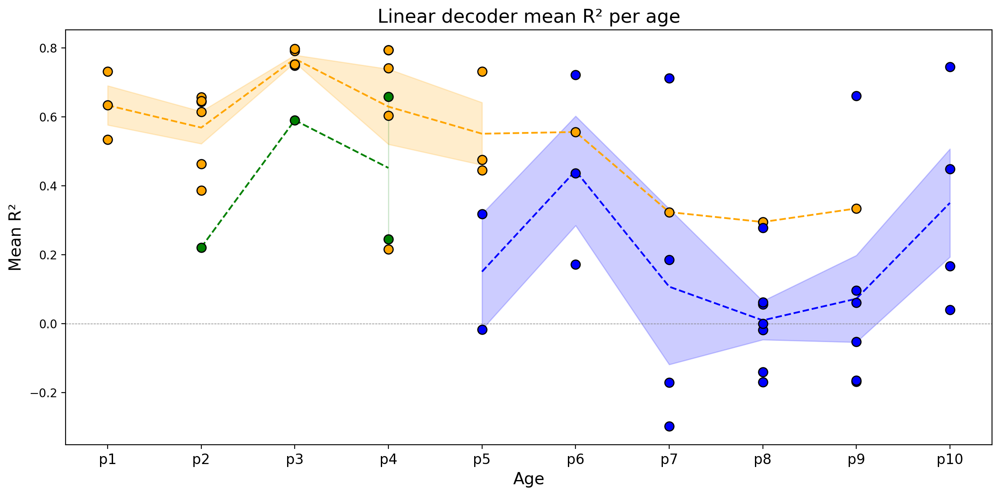

KeyError: 'f1_class1'

<Figure size 2400x1200 with 0 Axes>

In [338]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import sem

# Define colors
group_colors = {
    'GABA only': 'orange',
    'EMX only': 'green',
    'Both': 'purple',
    'Dual Imaging': 'blue'
}

# --- Linear R² ---
plt.figure(figsize=(12,6), dpi=200)
for group_name, color in group_colors.items():
    means = []
    sems = []
    x_vals = []
    
    for i, age in enumerate(unique_ages):
        age_data = combined_df[combined_df['age'] == age]
        group_data = age_data[age_data['group_type']==group_name]
        r2_data = group_data['r2_linear']
        
        if len(r2_data) > 0:
            m = np.mean(r2_data)
            s = sem(r2_data)  # standard error
            means.append(m)
            sems.append(s)
            x_vals.append(i)
            
            # Scatter points
            plt.scatter(np.full(len(r2_data), i), r2_data, color=color, edgecolor='black', s=60, zorder=3)
    
    if means:
        means = np.array(means)
        sems = np.array(sems)
        # Dashed line connecting means
        plt.plot(x_vals, means, '--', color=color, lw=1.5)
        # Fill between mean ± SEM
        plt.fill_between(x_vals, means - sems, means + sems, color=color, alpha=0.2)

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=12)
plt.ylabel('Mean R²', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Linear decoder mean R² per age', fontsize=16)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.tight_layout()
plt.show()


# --- Logistic F1 (Class 1) ---
plt.figure(figsize=(12,6), dpi=200)
for group_name, color in group_colors.items():
    means = []
    sems = []
    x_vals = []
    
    for i, age in enumerate(unique_ages):
        age_data = combined_df[combined_df['age'] == age]
        group_data = age_data[age_data['group_type']==group_name]
        f1_data = group_data['f1_class1']
        
        if len(f1_data) > 0:
            m = np.mean(f1_data)
            s = sem(f1_data)
            means.append(m)
            sems.append(s)
            x_vals.append(i)
            
            # Scatter points
            plt.scatter(np.full(len(f1_data), i), f1_data, color=color, edgecolor='black', s=60, zorder=3)
    
    if means:
        means = np.array(means)
        sems = np.array(sems)
        # Dashed line connecting means
        plt.plot(x_vals, means, '--', color=color, lw=1.5)
        # Fill between mean ± SEM
        plt.fill_between(x_vals, means - sems, means + sems, color=color, alpha=0.2)

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=12)
plt.ylabel('F1 Score (Class 1)', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.title('Logistic decoder F1 (Class 1) per age', fontsize=16)
plt.axhline(0, linestyle='--', color='grey', lw=0.5)
plt.tight_layout()
plt.show()


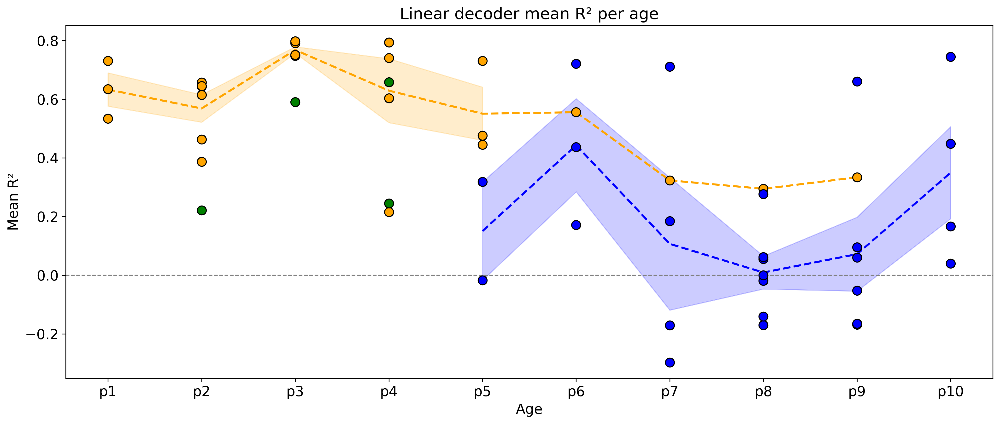

KeyError: 'f1_class1'

<Figure size 4200x1800 with 0 Axes>

In [339]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import sem

# Define colors
group_colors = {
    'GABA only': 'orange',
    'EMX only': 'green',   # points only
    'Both': 'purple',
    'Dual Imaging': 'blue'
}

marker_size = 80
line_width = 2
font_size = 14

# --- Linear R² ---
plt.figure(figsize=(14,6), dpi=300)

for group_name, color in group_colors.items():
    means = []
    sems = []
    x_vals = []
    
    for i, age in enumerate(unique_ages):
        age_data = combined_df[combined_df['age'] == age]
        group_data = age_data[age_data['group_type']==group_name]
        r2_data = group_data['r2_linear']
        
        if len(r2_data) > 0:
            # Scatter points
            plt.scatter(np.full(len(r2_data), i), r2_data, color=color, edgecolor='black', s=marker_size, zorder=3)
            
            # Only draw mean ± SEM for non-EMX
            if group_name != 'EMX only':
                m = np.mean(r2_data)
                s = sem(r2_data)
                means.append(m)
                sems.append(s)
                x_vals.append(i)
    
    # Dashed line + fill for mean ± SEM
    if means:
        means = np.array(means)
        sems = np.array(sems)
        plt.plot(x_vals, means, '--', color=color, lw=line_width)
        plt.fill_between(x_vals, means - sems, means + sems, color=color, alpha=0.2)

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=font_size)
plt.yticks(fontsize=font_size)
plt.ylabel('Mean R²', fontsize=font_size)
plt.xlabel('Age', fontsize=font_size)
plt.title('Linear decoder mean R² per age', fontsize=font_size+2)
plt.axhline(0, linestyle='--', color='grey', lw=1)
plt.tight_layout()
plt.show()


# --- Logistic F1 (Class 1) ---
plt.figure(figsize=(14,6), dpi=300)

for group_name, color in group_colors.items():
    means = []
    sems = []
    x_vals = []
    
    for i, age in enumerate(unique_ages):
        age_data = combined_df[combined_df['age'] == age]
        group_data = age_data[age_data['group_type']==group_name]
        f1_data = group_data['f1_class1']
        
        if len(f1_data) > 0:
            # Scatter points
            plt.scatter(np.full(len(f1_data), i), f1_data, color=color, edgecolor='black', s=marker_size, zorder=3)
            
            # Only draw mean ± SEM for non-EMX
            if group_name != 'EMX only':
                m = np.mean(f1_data)
                s = sem(f1_data)
                means.append(m)
                sems.append(s)
                x_vals.append(i)
    
    # Dashed line + fill for mean ± SEM
    if means:
        means = np.array(means)
        sems = np.array(sems)
        plt.plot(x_vals, means, '--', color=color, lw=line_width)
        plt.fill_between(x_vals, means - sems, means + sems, color=color, alpha=0.2)

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=font_size)
plt.yticks(fontsize=font_size)
plt.ylabel('F1 Score (Class 1)', fontsize=font_size)
plt.xlabel('Age', fontsize=font_size)
plt.title('Logistic decoder F1 (Class 1) per age', fontsize=font_size+2)
plt.axhline(0, linestyle='--', color='grey', lw=1)
plt.tight_layout()
plt.show()


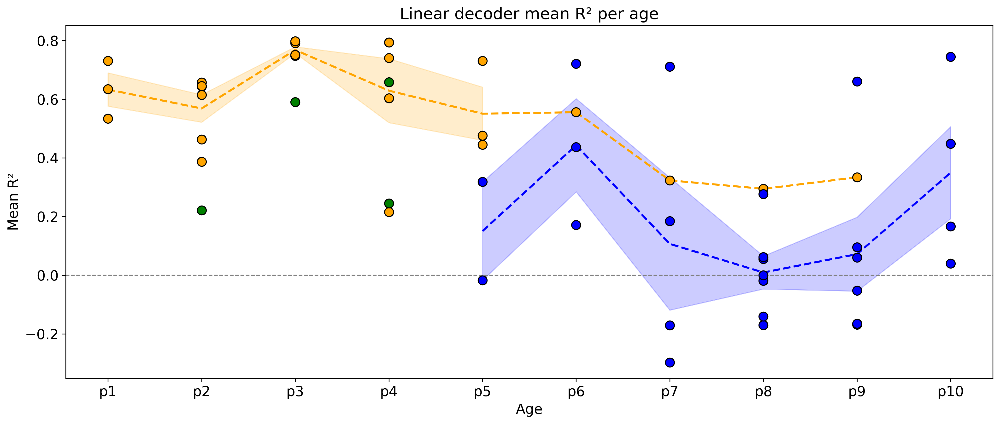

KeyError: 'f1_class1'

<Figure size 4200x1800 with 0 Axes>

In [340]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import sem

# Use seaborn style for elegance
# plt.style.use('s')

# Define colors
group_colors = {
    'GABA only': 'orange',
    'EMX only': 'green',      # Points only
    'Both': 'purple',
    'Dual Imaging': 'blue'
}

# Marker size
marker_size = 80
line_width = 2
font_size = 14

# --- Linear R² ---
plt.figure(figsize=(14,6), dpi=300)

for group_name, color in group_colors.items():
    means = []
    sems = []
    x_vals = []
    
    for i, age in enumerate(unique_ages):
        age_data = combined_df[combined_df['age'] == age]
        group_data = age_data[age_data['group_type']==group_name]
        r2_data = group_data['r2_linear']
        
        if len(r2_data) > 0:
            # Scatter points
            plt.scatter(np.full(len(r2_data), i), r2_data, color=color, edgecolor='black', s=marker_size, zorder=3)
            
            # Only draw mean line for non-EMX groups
            if group_name != 'EMX only':
                m = np.mean(r2_data)
                s = sem(r2_data)
                means.append(m)
                sems.append(s)
                x_vals.append(i)
    
    # Plot dashed line + fill for mean ± SEM for non-EMX
    if means:
        means = np.array(means)
        sems = np.array(sems)
        plt.plot(x_vals, means, '--', color=color, lw=line_width)
        plt.fill_between(x_vals, means - sems, means + sems, color=color, alpha=0.2)

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=font_size)
plt.yticks(fontsize=font_size)
plt.ylabel('Mean R²', fontsize=font_size)
plt.xlabel('Age', fontsize=font_size)
plt.title('Linear decoder mean R² per age', fontsize=font_size+2)
plt.axhline(0, linestyle='--', color='grey', lw=1)
plt.tight_layout()
plt.show()


# --- Logistic F1 (Class 1) ---
plt.figure(figsize=(14,6), dpi=300)

for group_name, color in group_colors.items():
    means = []
    sems = []
    x_vals = []
    
    for i, age in enumerate(unique_ages):
        age_data = combined_df[combined_df['age'] == age]
        group_data = age_data[age_data['group_type']==group_name]
        f1_data = group_data['f1_class1']
        
        if len(f1_data) > 0:
            # Scatter points
            plt.scatter(np.full(len(f1_data), i), f1_data, color=color, edgecolor='black', s=marker_size, zorder=3)
            
            # Only draw mean line for non-EMX groups
            if group_name != 'EMX only':
                m = np.mean(f1_data)
                s = sem(f1_data)
                means.append(m)
                sems.append(s)
                x_vals.append(i)
    
    # Plot dashed line + fill for mean ± SEM for non-EMX
    if means:
        means = np.array(means)
        sems = np.array(sems)
        plt.plot(x_vals, means, '--', color=color, lw=line_width)
        plt.fill_between(x_vals, means - sems, means + sems, color=color, alpha=0.2)

plt.xticks(range(len(unique_ages)), unique_ages, fontsize=font_size)
plt.yticks(fontsize=font_size)
plt.ylabel('F1 Score (Class 1)', fontsize=font_size)
plt.xlabel('Age', fontsize=font_size)
plt.title('Logistic decoder F1 (Class 1) per age', fontsize=font_size+2)
plt.axhline(0, linestyle='--', color='grey', lw=1)
plt.tight_layout()
plt.show()

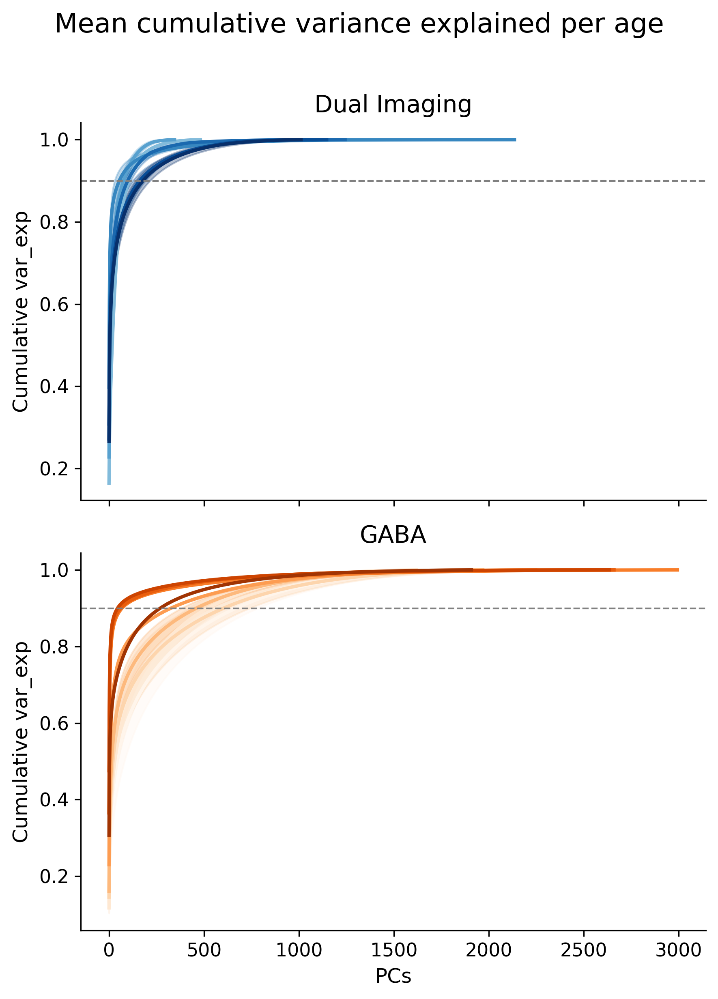

In [341]:
# Create figure and subplots
fig, axes = plt.subplots(2, 1, figsize=(6, 8), dpi=300, sharex=True)
threshold = 0.90

# --- Dual Imaging ---
ax = axes[0]
for age in unique_ages:
    dual_curves = group_age_data['dual imaging'].get(age, [])
    if dual_curves:
        max_len = max(len(c) for c in dual_curves)
        padded_curves = [np.pad(c, (0, max_len - len(c)), mode='edge') for c in dual_curves]
        mean_dual = np.mean(padded_curves, axis=0)
        sem_dual = np.std(padded_curves, axis=0) / np.sqrt(len(padded_curves))
        ax.plot(mean_dual, color=age2blue[age], lw=2)
        ax.fill_between(range(len(mean_dual)), mean_dual - sem_dual, mean_dual + sem_dual,
                        color=age2blue[age], alpha=0.3)
ax.axhline(y=threshold, color='grey', linestyle='--', lw=1)
ax.set_title("Dual Imaging", fontsize=14)
ax.set_ylabel("Cumulative var_exp", fontsize=12)
ax.tick_params(axis='both', labelsize=11)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# --- GABA ---
ax = axes[1]
for age in unique_ages:
    gaba_curves = group_age_data['gaba'].get(age, [])
    if gaba_curves:
        max_len = max(len(c) for c in gaba_curves)
        padded_curves = [np.pad(c, (0, max_len - len(c)), mode='edge') for c in gaba_curves]
        mean_gaba = np.mean(padded_curves, axis=0)
        sem_gaba = np.std(padded_curves, axis=0) / np.sqrt(len(padded_curves))
        ax.plot(mean_gaba, color=age2orange[age], lw=2)
        ax.fill_between(range(len(mean_gaba)), mean_gaba - sem_gaba, mean_gaba + sem_gaba,
                        color=age2orange[age], alpha=0.3)
ax.axhline(y=threshold, color='grey', linestyle='--', lw=1)
ax.set_title("GABA", fontsize=14)
ax.set_xlabel("PCs", fontsize=12)
ax.set_ylabel("Cumulative var_exp", fontsize=12)
ax.tick_params(axis='both', labelsize=11)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.suptitle("Mean cumulative variance explained per age", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

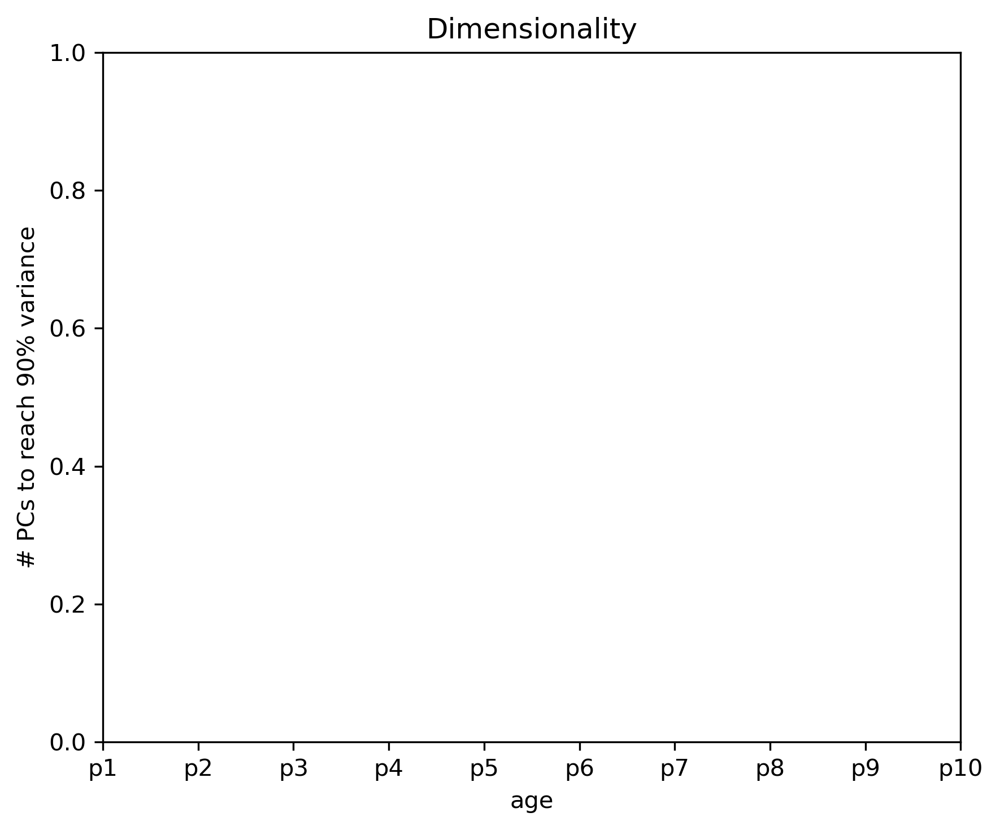

In [342]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import re

# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

threshold = 0.90  # variance explained threshold

# Organize sessions by group and age
group_age_dims = {'dual imaging': {}, 'gaba': {}}
for _, age, var_exp, group in valid_rows:
    grp = group.lower()
    if grp in group_age_dims:
        if age not in group_age_dims[grp]:
            group_age_dims[grp][age] = []
        cum_var = np.cumsum(var_exp) / np.sum(var_exp)  # normalize
        # Find number of PCs to reach threshold
        n_pcs_thresh = np.argmax(cum_var >= threshold) + 1  # +1 because index starts at 0
        group_age_dims[grp][age].append(n_pcs_thresh)

# Prepare mean and SEM per age
unique_ages_sorted = sorted(unique_ages, key=extract_age_num)
blues = [cm.Blues(i / max(1, len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]
oranges = [cm.Oranges(i / max(1, len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]

# Plot mean number of PCs per age
plt.figure(figsize=(6,5), dpi=300)


# Compute mean values per age for Dual and GABA
dual_means = [combined_df[(combined_df['age'] == age) & 
                          (combined_df['group'] == 'Dual Imaging')]['r2_linear'].mean()
              for age in unique_ages]

gaba_means = [combined_df[(combined_df['age'] == age) & 
                          (combined_df['group'] == 'GABA')]['r2_linear'].mean()
              for age in unique_ages]

# Connect Dual Imaging with gradient-colored line
ax.plot(range(len(unique_ages)), dual_means, 
        color=plt.cm.Blues(0.7), linewidth=2, linestyle='--', label="Dual mean")

# Connect GABA with gradient-colored line
ax.plot(range(len(unique_ages)), gaba_means, 
        color=plt.cm.Reds(0.7), linewidth=2, linestyle='--', label="GABA mean")

# Or instead: connect with a white dashed line
# ax.plot(range(len(unique_ages)), dual_means, color="white", linestyle="--", linewidth=2)
# ax.plot(range(len(unique_ages)), gaba_means, color="white", linestyle="--", linewidth=2)

# for i, age in enumerate(unique_ages_sorted):
#     # Dual Imaging
#     dual_values = group_age_dims['dual imaging'].get(age, [])
#     if dual_values:
#         mean_dual = np.mean(dual_values)
#         sem_dual = np.std(dual_values)/np.sqrt(len(dual_values))
#         plt.errorbar(i - 0.05, mean_dual, yerr=sem_dual, fmt='o', color=blues[i], label=f'{age} Dual' if i==0 else None, capsize=7)
    
#     # GABA
#     gaba_values = group_age_dims['gaba'].get(age, [])
#     if gaba_values:
#         mean_gaba = np.mean(gaba_values)
#         sem_gaba = np.std(gaba_values)/np.sqrt(len(gaba_values))
#         plt.errorbar(i + 0.05, mean_gaba, yerr=sem_gaba, fmt='o', color=oranges[i], label=f'{age} GABA' if i==0 else None, capsize=7)

plt.xticks(range(len(unique_ages_sorted)), unique_ages_sorted)
plt.xlabel("age")
plt.ylabel(f"# PCs to reach {threshold*100:.0f}% variance")
plt.title("Dimensionality")
# plt.legend(fontsize=8)
plt.tight_layout()
plt.show()


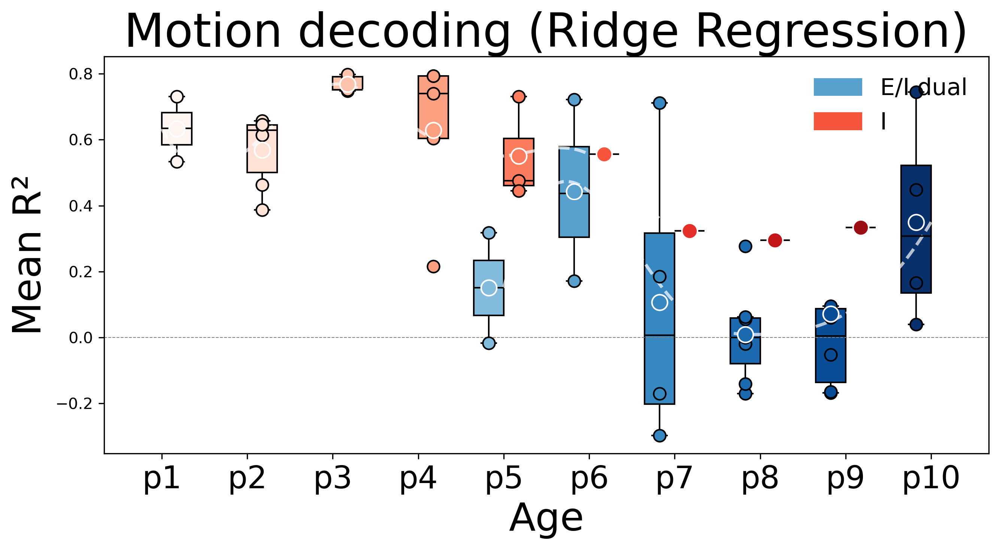

In [343]:
## plot for poster 

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
from scipy.interpolate import make_interp_spline

# Define colormaps
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues = [plt.cm.Blues(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]

width = 0.35
offset = width / 2

# --- Plot R² with boxplots and mean points ---
fig, ax = plt.subplots(figsize=(9,5), dpi=300)

dual_means = []
gaba_means = []

for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]

    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=blues[i], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=blues[i], edgecolor='black', s=60, zorder=3)
    dual_means.append(np.mean(dual_data) if len(dual_data) > 0 else np.nan)
    # Plot mean point larger
    ax.scatter(i - offset, dual_means[-1], color=blues[i], s=100, edgecolor='white', zorder=4)

    # GABA (red)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=reds[i], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                color=reds[i], edgecolor='black', s=60, zorder=3)
    gaba_means.append(np.mean(gaba_data) if len(gaba_data) > 0 else np.nan)
    # Plot mean point larger
    ax.scatter(i + offset, gaba_means[-1], color=reds[i], s=100, edgecolor='white', zorder=4)

# Smooth curves for means
x = np.arange(len(unique_ages))

# Dual Imaging smooth
dual_means_arr = np.array(dual_means)
mask_dual = ~np.isnan(dual_means_arr)
if mask_dual.sum() > 2:
    x_dual = x[mask_dual]
    y_dual = dual_means_arr[mask_dual]
    x_smooth = np.linspace(x_dual.min(), x_dual.max(), 300)
    spline = make_interp_spline(x_dual, y_dual, k=3)
    y_smooth = spline(x_smooth)
    ax.plot(x_smooth, y_smooth, color='white', linestyle='--', linewidth=2, alpha=0.7)

# GABA smooth
gaba_means_arr = np.array(gaba_means)
mask_gaba = ~np.isnan(gaba_means_arr)
if mask_gaba.sum() > 2:
    x_gaba = x[mask_gaba]
    y_gaba = gaba_means_arr[mask_gaba]
    x_smooth = np.linspace(x_gaba.min(), x_gaba.max(), 300)
    spline = make_interp_spline(x_gaba, y_gaba, k=3)
    y_smooth = spline(x_smooth)
    ax.plot(x_smooth, y_smooth, color='white', linestyle='--', linewidth=2, alpha=0.7)

# Axes labels and formatting
ax.set_xticks(range(len(unique_ages)))
ax.set_xticklabels(unique_ages, fontsize=20)
ax.set_xlabel("Age", fontsize=25)
ax.set_ylabel("Mean R²", fontsize=25)
ax.set_title("Motion decoding (Ridge Regression)", fontsize=30)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)

# Custom legend
legend_handles = [
    Patch(color=blues[len(blues)//2], label='E/I dual'),
    Patch(color=reds[len(reds)//2], label='I')
]
ax.legend(handles=legend_handles, fontsize=15, frameon=False, loc='upper right')

plt.tight_layout()
plt.show()

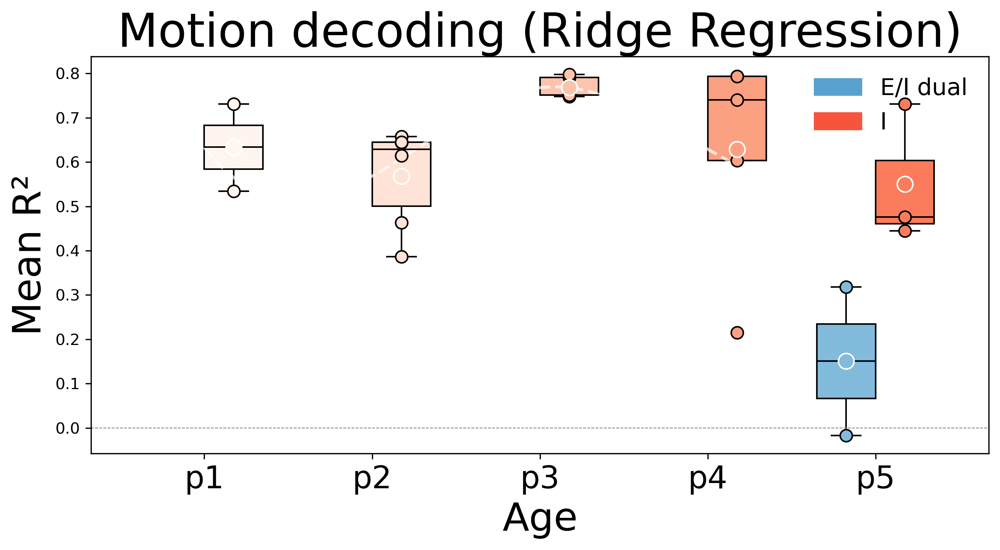

In [344]:
# Define colormaps
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues = [plt.cm.Blues(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]

width = 0.35
offset = width / 2

# --- Plot R² with boxplots and mean points (up to P5 GABA) ---
fig, ax = plt.subplots(figsize=(9,5), dpi=300)

dual_means = []
gaba_means = []

# Only consider ages up to P5
ages_to_plot = [age for age in unique_ages if int(age[1:]) <= 5]

for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]

    # Dual Imaging (blue)
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=blues[i], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                color=blues[i], edgecolor='black', s=60, zorder=3)
    dual_means.append(np.mean(dual_data) if len(dual_data) > 0 else np.nan)
    ax.scatter(i - offset, dual_means[-1], color=blues[i], s=100, edgecolor='white', zorder=4)

    # GABA (red)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=reds[i], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                color=reds[i], edgecolor='black', s=60, zorder=3)
    gaba_means.append(np.mean(gaba_data) if len(gaba_data) > 0 else np.nan)
    ax.scatter(i + offset, gaba_means[-1], color=reds[i], s=100, edgecolor='white', zorder=4)

# Smooth curves for means
x = np.arange(len(ages_to_plot))

# Dual Imaging smooth
dual_means_arr = np.array(dual_means)
mask_dual = ~np.isnan(dual_means_arr)
if mask_dual.sum() > 2:
    x_dual = x[mask_dual]
    y_dual = dual_means_arr[mask_dual]
    x_smooth = np.linspace(x_dual.min(), x_dual.max(), 300)
    spline = make_interp_spline(x_dual, y_dual, k=3)
    y_smooth = spline(x_smooth)
    ax.plot(x_smooth, y_smooth, color='white', linestyle='--', linewidth=2, alpha=0.7)

# GABA smooth
gaba_means_arr = np.array(gaba_means)
mask_gaba = ~np.isnan(gaba_means_arr)
if mask_gaba.sum() > 2:
    x_gaba = x[mask_gaba]
    y_gaba = gaba_means_arr[mask_gaba]
    x_smooth = np.linspace(x_gaba.min(), x_gaba.max(), 300)
    spline = make_interp_spline(x_gaba, y_gaba, k=3)
    y_smooth = spline(x_smooth)
    ax.plot(x_smooth, y_smooth, color='white', linestyle='--', linewidth=2, alpha=0.7)

# Axes labels and formatting
ax.set_xticks(range(len(ages_to_plot)))
ax.set_xticklabels(ages_to_plot, fontsize=20)
ax.set_xlabel("Age", fontsize=25)
ax.set_ylabel("Mean R²", fontsize=25)
ax.set_title("Motion decoding (Ridge Regression)", fontsize=30)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)

# Custom legend
legend_handles = [
    Patch(color=blues[len(blues)//2], label='E/I dual'),
    Patch(color=reds[len(reds)//2], label='I')
]
ax.legend(handles=legend_handles, fontsize=15, frameon=False, loc='upper right')

plt.tight_layout()
plt.show()

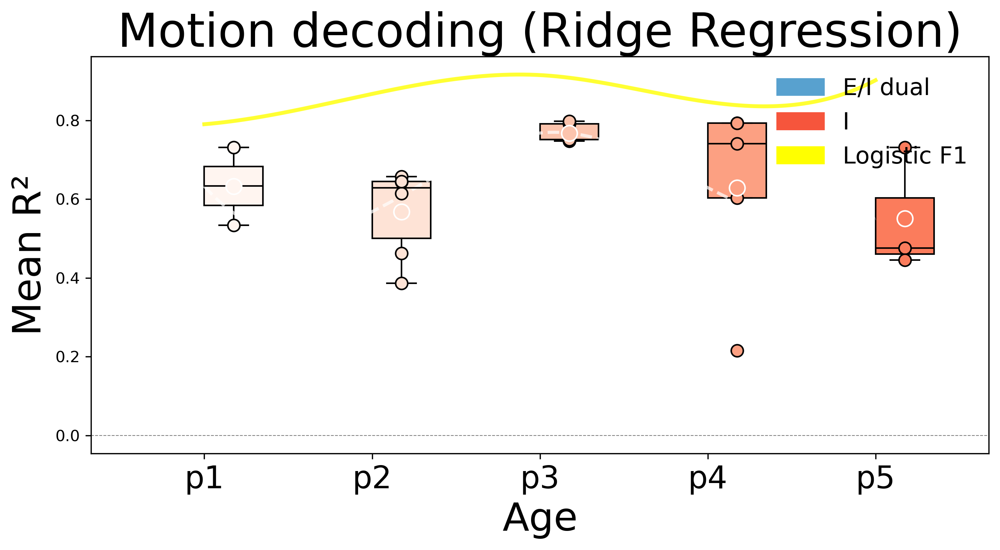

In [345]:
from matplotlib.patches import Patch
from scipy.interpolate import make_interp_spline

# Define colormaps
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues = [plt.cm.Blues(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]

width = 0.35
offset = width / 2

# --- Plot R² with boxplots and mean points (up to P5 GABA, remove Dual P5) ---
fig, ax = plt.subplots(figsize=(9,5), dpi=300)

dual_means = []
gaba_means = []
logistic_f1_means = []

# Only consider ages up to P5
ages_to_plot = [age for age in unique_ages if int(age[1:]) <= 5]

for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]

    # Dual Imaging (blue) - remove last point (P5)
    if int(age[1:]) < 5:
        dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
        plt.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
                    boxprops=dict(facecolor=blues[i], color='black'),
                    medianprops=dict(color='black'))
        plt.scatter(np.full(len(dual_data), i - offset), dual_data,
                    color=blues[i], edgecolor='black', s=60, zorder=3)
        mean_dual = np.mean(dual_data) if len(dual_data) > 0 else np.nan
        dual_means.append(mean_dual)
        ax.scatter(i - offset, mean_dual, color=blues[i], s=100, edgecolor='white', zorder=4)
    else:
        dual_means.append(np.nan)

    # GABA (red)
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    plt.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
                boxprops=dict(facecolor=reds[i], color='black'),
                medianprops=dict(color='black'))
    plt.scatter(np.full(len(gaba_data), i + offset), gaba_data,
                color=reds[i], edgecolor='black', s=60, zorder=3)
    mean_gaba = np.mean(gaba_data) if len(gaba_data) > 0 else np.nan
    gaba_means.append(mean_gaba)
    ax.scatter(i + offset, mean_gaba, color=reds[i], s=100, edgecolor='white', zorder=4)

    # Logistic F1 mean
    f1_data = age_data[age_data['group'] == 'GABA']['f1_score_logistic']  # or Dual if needed
    mean_f1 = np.mean(f1_data) if len(f1_data) > 0 else np.nan
    logistic_f1_means.append(mean_f1)

# Smooth curves for means
x = np.arange(len(ages_to_plot))

# Dual Imaging smooth
dual_means_arr = np.array(dual_means)
mask_dual = ~np.isnan(dual_means_arr)
if mask_dual.sum() > 2:
    x_dual = x[mask_dual]
    y_dual = dual_means_arr[mask_dual]
    x_smooth = np.linspace(x_dual.min(), x_dual.max(), 300)
    spline = make_interp_spline(x_dual, y_dual, k=3)
    y_smooth = spline(x_smooth)
    ax.plot(x_smooth, y_smooth, color='white', linestyle='--', linewidth=2, alpha=0.7)

# GABA smooth
gaba_means_arr = np.array(gaba_means)
mask_gaba = ~np.isnan(gaba_means_arr)
if mask_gaba.sum() > 2:
    x_gaba = x[mask_gaba]
    y_gaba = gaba_means_arr[mask_gaba]
    x_smooth = np.linspace(x_gaba.min(), x_gaba.max(), 300)
    spline = make_interp_spline(x_gaba, y_gaba, k=3)
    y_smooth = spline(x_smooth)
    ax.plot(x_smooth, y_smooth, color='white', linestyle='--', linewidth=2, alpha=0.7)

# Logistic F1 smooth line
f1_means_arr = np.array(logistic_f1_means)
mask_f1 = ~np.isnan(f1_means_arr)
if mask_f1.sum() > 2:
    x_f1 = x[mask_f1]
    y_f1 = f1_means_arr[mask_f1]
    x_smooth = np.linspace(x_f1.min(), x_f1.max(), 300)
    spline = make_interp_spline(x_f1, y_f1, k=3)
    y_smooth = spline(x_smooth)
    ax.plot(x_smooth, y_smooth, color='yellow', linestyle='-', linewidth=2.5, alpha=0.8, label='Logistic F1')

# Axes labels and formatting
ax.set_xticks(range(len(ages_to_plot)))
ax.set_xticklabels(ages_to_plot, fontsize=20)
ax.set_xlabel("Age", fontsize=25)
ax.set_ylabel("Mean R²", fontsize=25)
ax.set_title("Motion decoding (Ridge Regression)", fontsize=30)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)

# Custom legend
legend_handles = [
    Patch(color=blues[len(blues)//2], label='E/I dual'),
    Patch(color=reds[len(reds)//2], label='I'),
    Patch(color='yellow', label='Logistic F1')
]
ax.legend(handles=legend_handles, fontsize=15, frameon=False, loc='upper right')

plt.tight_layout()
plt.show()

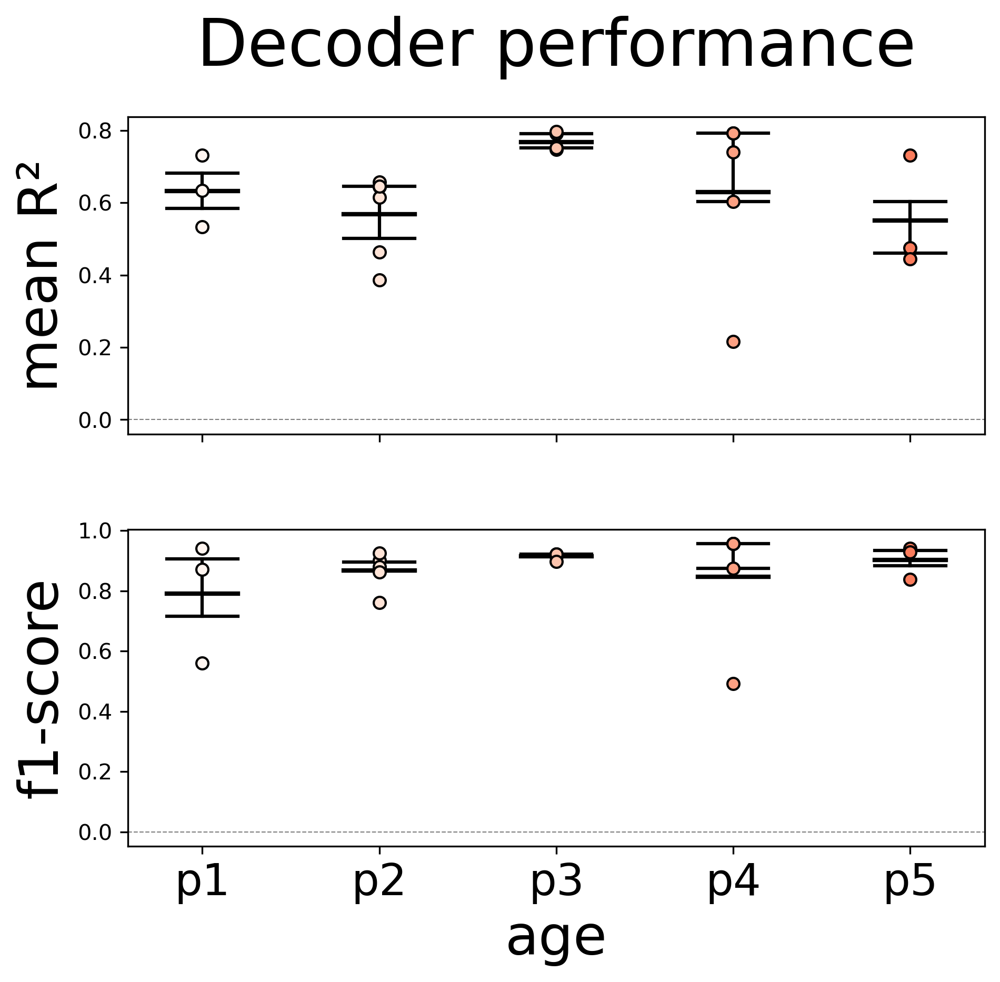

In [346]:
import matplotlib.pyplot as plt
import numpy as np

# Reds colormap
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]

# Ages up to P5
ages_to_plot = [age for age in unique_ages if int(age[1:]) <= 5]

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7,6), dpi=300, sharex=True, gridspec_kw={'hspace':0.3})

# for i, age in enumerate(ages_to_plot):
#     age_data = combined_df[combined_df['age'] == age]

#     # Top: R² boxplot
#     gaba_r2 = age_data[age_data['group'] == 'GABA']['r2_linear']
#     if len(gaba_r2) > 0:
#         bp = ax1.boxplot(gaba_r2, positions=[i], widths=0.4, patch_artist=True,
#                          boxprops=dict(facecolor=reds[i], color='black'),
#                          medianprops=dict(color='black'),  # can leave or remove
#                          showmeans=True, meanprops=dict(marker='o', markerfacecolor='white', markeredgecolor='black', markersize=5))
#         ax1.scatter(np.full(len(gaba_r2), i), gaba_r2, color=reds[i], edgecolor='black', s=30, zorder=3)

#     # Bottom: F1 boxplot
#     gaba_f1 = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
#     if len(gaba_f1) > 0:
#         bp = ax2.boxplot(gaba_f1, positions=[i], widths=0.4, patch_artist=True,
#                          boxprops=dict(facecolor=reds[i], color='black'),
#                          medianprops=dict(color='black'),
#                          showmeans=True, meanprops=dict(marker='o', markerfacecolor='white', markeredgecolor='black', markersize=5))
#         ax2.scatter(np.full(len(gaba_f1), i), gaba_f1, color=reds[i], edgecolor='black', s=30, zorder=3)
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]

    # Top: R² boxplot
    gaba_r2 = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_r2) > 0:
        mean_val = np.mean(gaba_r2)
        q1, q3 = np.percentile(gaba_r2, [25, 75])
        
        # Draw box manually
        ax1.plot([i-0.2, i+0.2], [q3, q3], color='black', lw=1.5)  # top of box
        ax1.plot([i-0.2, i+0.2], [q1, q1], color='black', lw=1.5)  # bottom of box
        ax1.plot([i, i], [q1, q3], color='black', lw=1.5)          # vertical line
        ax1.plot([i-0.2, i+0.2], [mean_val, mean_val], color='black', lw=2)  # mean line
        
        # Optional: scatter points
        ax1.scatter(np.full(len(gaba_r2), i), gaba_r2, color=reds[i], edgecolor='black', s=30, zorder=3)

    # Bottom: F1 boxplot
    gaba_f1 = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_f1) > 0:
        mean_val = np.mean(gaba_f1)
        q1, q3 = np.percentile(gaba_f1, [25, 75])
        
        ax2.plot([i-0.2, i+0.2], [q3, q3], color='black', lw=1.5)
        ax2.plot([i-0.2, i+0.2], [q1, q1], color='black', lw=1.5)
        ax2.plot([i, i], [q1, q3], color='black', lw=1.5)
        ax2.plot([i-0.2, i+0.2], [mean_val, mean_val], color='black', lw=2)
        
        ax2.scatter(np.full(len(gaba_f1), i), gaba_f1, color=reds[i], edgecolor='black', s=30, zorder=3)
# Axes formatting
ax1.set_ylabel("mean R²", fontsize=25)
ax1.set_title("Decoder performance", fontsize=30, y=1.12)
ax1.axhline(0, linestyle='--', color='grey', lw=0.5)

ax2.set_xticks(range(len(ages_to_plot)))
ax2.set_xticklabels(ages_to_plot, fontsize=20)
ax2.set_xlabel("age", fontsize=25)
ax2.set_ylabel("f1-score", fontsize=25)
ax2.axhline(0, linestyle='--', color='grey', lw=0.5)

plt.tight_layout()
plt.show()


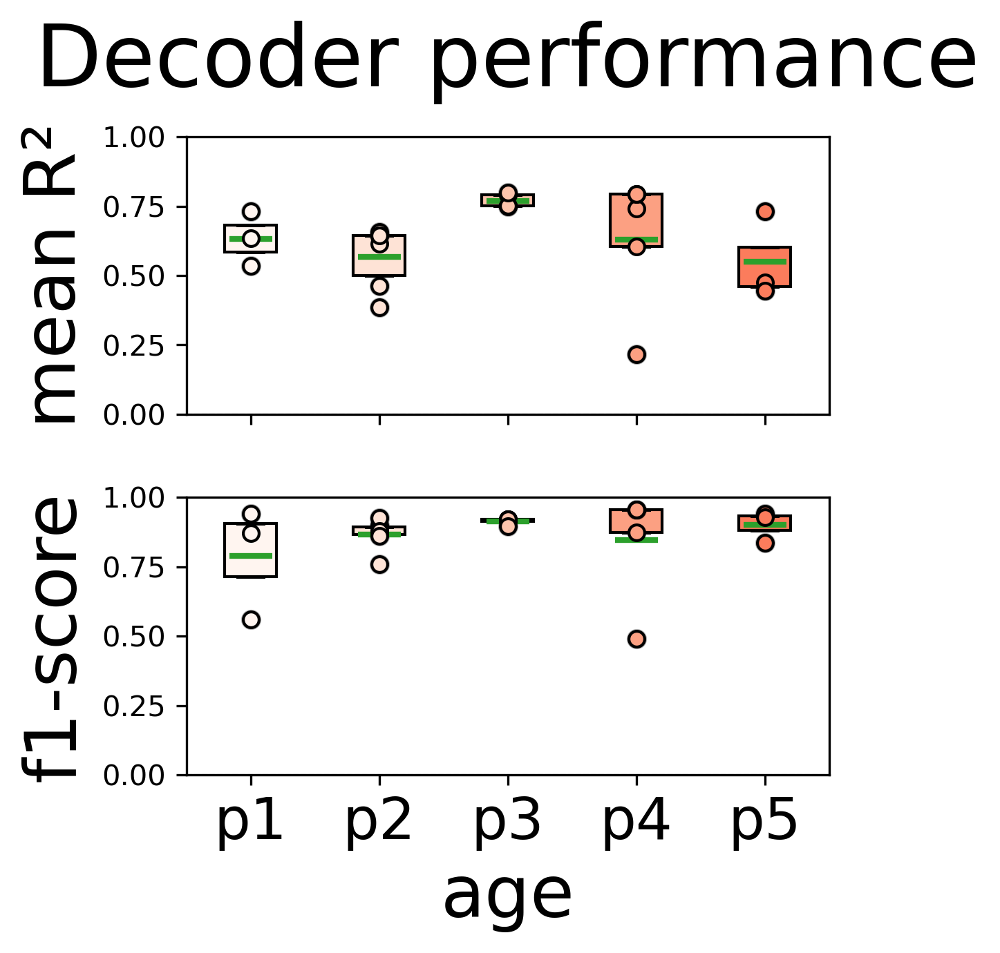

In [347]:
# Reds colormap
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]

# Ages up to P5
ages_to_plot = [age for age in unique_ages if int(age[1:]) <= 5]

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(4,4), dpi=300, sharex=True, gridspec_kw={'hspace':0.3})

for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]

    # Top: R² boxplot
    gaba_r2 = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_r2) > 0:
        bp = ax1.boxplot(gaba_r2,
                         positions=[i],
                         widths=0.4,
                         patch_artist=True,
                         boxprops=dict(facecolor=reds[i], color='black'),
                         medianprops=dict(visible=False),
                         showmeans=True,
                         meanprops=dict(marker='_', color='grey', markersize=15, markeredgewidth=2),
                         whiskerprops=dict(color='black', linewidth=1.2),
                         capprops=dict(color='black', linewidth=1.2),
                         flierprops=dict(marker='o', color='black', alpha=0.3),
                         whis=[25,75])
        # overlay points
        ax1.scatter(np.full(len(gaba_r2), i), gaba_r2, color=reds[i], edgecolor='black', s=30, zorder=3)

    # Bottom: F1 boxplot
    gaba_f1 = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_f1) > 0:
        # Ensure box shows up even with whis=[25,75] by specifying boxprops facecolor
        bp = ax2.boxplot(gaba_f1,
                         positions=[i],
                         widths=0.4,
                         patch_artist=True,
                         boxprops=dict(facecolor=reds[i], color='black'),
                         medianprops=dict(visible=False),
                         showmeans=True,
                         meanprops=dict(marker='_', color='grey', markersize=15, markeredgewidth=2),
                         whiskerprops=dict(color='black', linewidth=1.2),
                         capprops=dict(color='black', linewidth=1.2),
                         flierprops=dict(marker='o', color='black', alpha=0.3),
                         whis=[25,75])
        ax2.scatter(np.full(len(gaba_f1), i), gaba_f1, color=reds[i], edgecolor='black', s=30, zorder=3)

# Axes formatting
ax1.set_ylabel("mean R²", fontsize=25)
ax1.set_title("Decoder performance", fontsize=30, y=1.12)
ax1.axhline(0, linestyle='--', color='grey', lw=0.5)
ax1.set_ylim(0,1)


ax2.set_xticks(range(len(ages_to_plot)))
ax2.set_xticklabels(ages_to_plot, fontsize=20)
ax2.set_xlabel("age", fontsize=25)
ax2.set_ylabel("f1-score", fontsize=25)
ax2.axhline(0, linestyle='--', color='grey', lw=0.5)
ax2.set_ylim(0,1)


plt.tight_layout()
plt.show()

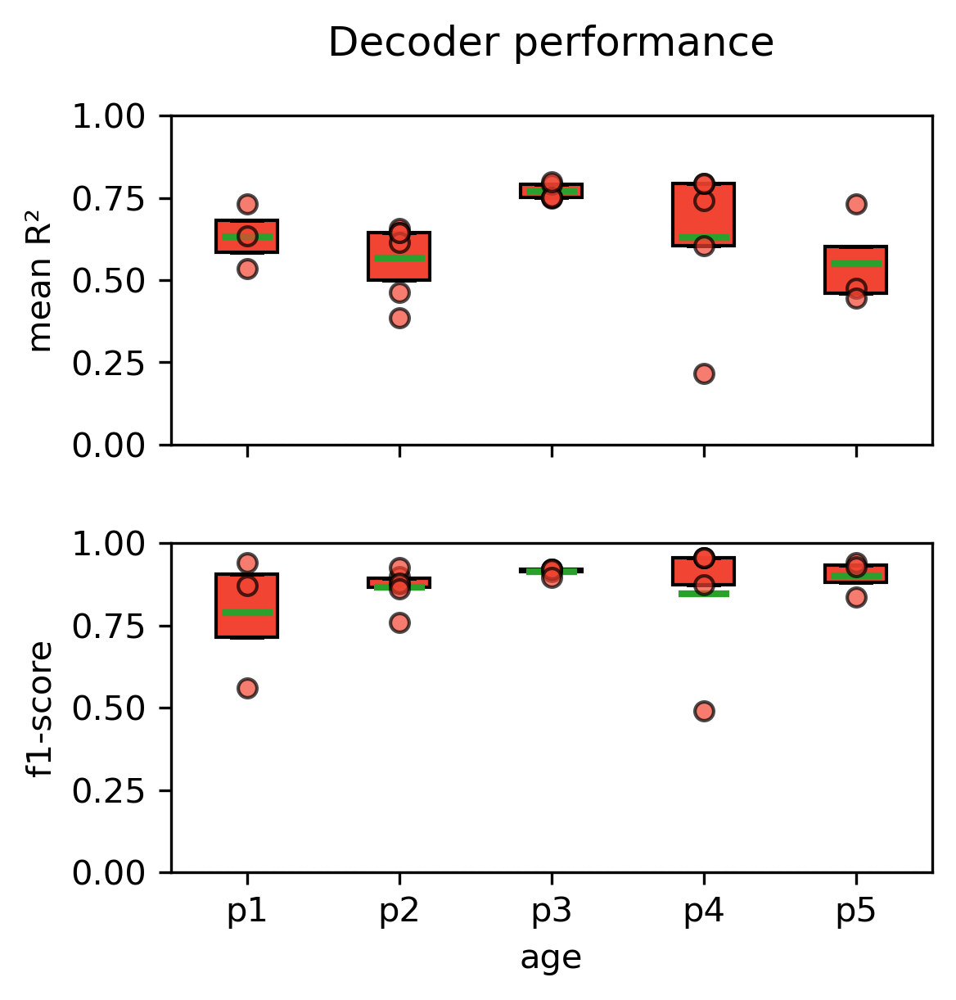

In [348]:
import matplotlib.pyplot as plt
import numpy as np

# Reds colormap for all ages
reds = [plt.cm.Reds(0.6) for _ in ages_to_plot]  # homogeneous red

# Ages up to P5
ages_to_plot = [age for age in unique_ages if int(age[1:]) <= 5]

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(4,4), dpi=300, sharex=True, gridspec_kw={'hspace':0.3})

for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]

    # --- Top: Linear decoder R² ---
    gaba_r2 = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_r2) > 0:
        bp = ax1.boxplot(gaba_r2,
                         positions=[i],
                         widths=0.4,
                         patch_artist=True,
                         boxprops=dict(facecolor=reds[i], color='black'),
                         medianprops=dict(visible=False),
                         showmeans=True,
                         meanprops=dict(marker='_', color='white', markersize=15, markeredgewidth=2),
                         whiskerprops=dict(color='black', linewidth=1.2),
                         capprops=dict(color='black', linewidth=1.2),
                         flierprops=dict(marker=''),  # hide outliers
                         whis=[25,75])
        # overlay points
        ax1.scatter(np.full(len(gaba_r2), i), gaba_r2, color=reds[i], edgecolor='black', s=30, alpha=0.7, zorder=3)

    # --- Bottom: Logistic decoder F1 ---
    gaba_f1 = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_f1) > 0:
        bp = ax2.boxplot(gaba_f1,
                         positions=[i],
                         widths=0.4,
                         patch_artist=True,
                         boxprops=dict(facecolor=reds[i], color='black'),
                         medianprops=dict(visible=False),
                         showmeans=True,
                         meanprops=dict(marker='_', color='white', markersize=15, markeredgewidth=2),
                         whiskerprops=dict(color='black', linewidth=1.2),
                         capprops=dict(color='black', linewidth=1.2),
                         flierprops=dict(marker=''),  # hide outliers
                         whis=[25,75])
        ax2.scatter(np.full(len(gaba_f1), i), gaba_f1, color=reds[i], edgecolor='black', s=30, alpha=0.7, zorder=3)

# Axes formatting
ax1.set_ylabel("mean R²")
ax1.set_title("Decoder performance", y=1.12)
ax1.axhline(0, linestyle='--', color='grey', lw=0.5)
ax1.set_ylim(0,1)

ax2.set_xticks(range(len(ages_to_plot)))
ax2.set_xticklabels(ages_to_plot)
ax2.set_xlabel("age")
ax2.set_ylabel("f1-score")
ax2.axhline(0, linestyle='--', color='grey', lw=0.5)
ax2.set_ylim(0,1)

plt.tight_layout()
plt.show()

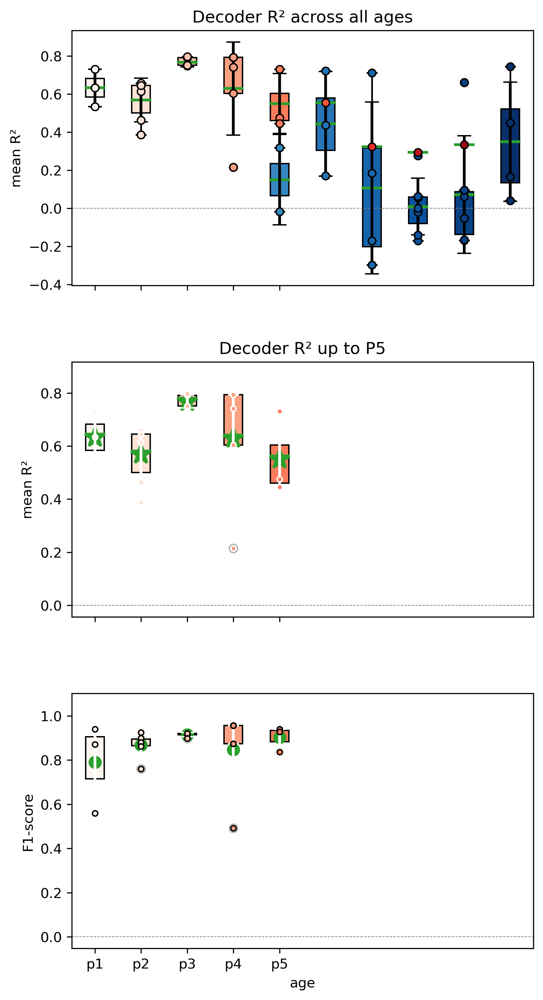

In [349]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Colors
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues_light = [plt.cm.Blues(0.4 + 0.6*i/max(1,len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

# Boxplot parameters
width = 0.4

# Prepare ages up to P5
ages_to_plot = [age for age in unique_ages if int(age[1:]) <= 5]

fig, (ax0, ax1, ax2) = plt.subplots(3, 1, figsize=(6,12), dpi=300, sharex=True, gridspec_kw={'hspace':0.3})

# --- Top: Full R² per age ---
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]

    # Dual Imaging
    dual_data = age_data[age_data['group']=='Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        mean = dual_data.mean()
        sd = dual_data.std()
        bp = ax0.boxplot(dual_data, positions=[i], widths=width,
                         patch_artist=True,
                         boxprops=dict(facecolor=blues_light[i], color='black'),
                         medianprops=dict(visible=False),
                         showmeans=True,
                         meanprops=dict(marker='_', color='black', markersize=15, markeredgewidth=2),
                         whiskerprops=dict(color='black', linewidth=1.2),
                         capprops=dict(color='black', linewidth=1.2),
                         flierprops=dict(marker='o', color='black', alpha=0.3))
        ax0.errorbar(i, mean, yerr=sd, fmt='none', ecolor='black', elinewidth=2, capsize=5, zorder=3)
        ax0.scatter(np.full(len(dual_data), i), dual_data, color=blues_light[i], edgecolor='black', s=30, zorder=3)

    # GABA
    gaba_data = age_data[age_data['group']=='GABA']['r2_linear']
    if len(gaba_data) > 0:
        mean = gaba_data.mean()
        sd = gaba_data.std()
        bp = ax0.boxplot(gaba_data, positions=[i], widths=width,
                         patch_artist=True,
                         boxprops=dict(facecolor=reds[i], color='black'),
                         medianprops=dict(visible=False),
                         showmeans=True,
                         meanprops=dict(marker='_', color='black', markersize=15, markeredgewidth=2),
                         whiskerprops=dict(color='black', linewidth=1.2),
                         capprops=dict(color='black', linewidth=1.2),
                         flierprops=dict(marker='o', color='black', alpha=0.3))
        ax0.errorbar(i, mean, yerr=sd, fmt='none', ecolor='black', elinewidth=2, capsize=5, zorder=3)
        ax0.scatter(np.full(len(gaba_data), i), gaba_data, color=reds[i], edgecolor='black', s=30, zorder=3)

    # # EMX
    # emx_data = age_data[age_data['group']=='EMX']['r2_linear']
    # if len(emx_data) > 0:
    #     mean = emx_data.mean()
    #     sd = emx_data.std()
    #     ax0.errorbar(i, mean, yerr=sd, fmt='o', color=green_color, ecolor=green_color, elinewidth=2, capsize=5, zorder=3)
    #     ax0.scatter(np.full(len(emx_data), i), emx_data, color=green_color, edgecolor='black', s=30, zorder=3)

ax0.set_ylabel("mean R²")
ax0.axhline(0, linestyle='--', color='grey', lw=0.5)
ax0.set_title("Decoder R² across all ages")

# --- Middle: R² up to P5 ---
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]
    gaba_r2 = age_data[age_data['group']=='GABA']['r2_linear']
    if len(gaba_r2) > 0:
        mean = gaba_r2.mean()
        sd = gaba_r2.std()
        bp = ax1.boxplot(gaba_r2, positions=[i], widths=width,
                         patch_artist=True,
                         boxprops=dict(facecolor=reds[i], color='black'),
                         medianprops=dict(visible=False),
                         showmeans=True,
                         meanprops=dict(marker='*', color='w', markersize=15, markeredgewidth=2),
                         whiskerprops=dict(color='w', linewidth=1.2),
                         capprops=dict(color='w', linewidth=1.2),
                         flierprops=dict(marker='o', color='white', alpha=0.3))
        ax1.errorbar(i, mean, yerr=sd, fmt='none', ecolor='white', elinewidth=2, capsize=5, zorder=3)
        ax1.scatter(np.full(len(gaba_r2), i), gaba_r2, color=reds[i], edgecolor='white', s=15, zorder=3)

ax1.set_ylabel("mean R²")
ax1.axhline(0, linestyle='--', color='grey', lw=0.5)
ax1.set_title("Decoder R² up to P5")

# --- Bottom: F1-score up to P5 ---
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]
    gaba_f1 = age_data[age_data['group']=='GABA']['f1_score_logistic']
    if len(gaba_f1) > 0:
        mean = gaba_f1.mean()
        sd = gaba_f1.std()
        bp = ax2.boxplot(gaba_f1, positions=[i], widths=width,
                         patch_artist=True,
                         boxprops=dict(facecolor=reds[i], color='black'),
                         medianprops=dict(visible=False),
                         showmeans=True,
                         meanprops=dict(marker='.', color='white', markersize=15, markeredgewidth=2),
                         whiskerprops=dict(color='w', linewidth=1.2),
                         capprops=dict(color='w', linewidth=1.2),
                         flierprops=dict(marker='o', color='w', alpha=0.3))
        ax2.errorbar(i, mean, yerr=sd, fmt='none', ecolor='w', elinewidth=2, capsize=5, zorder=3)
        ax2.scatter(np.full(len(gaba_f1), i), gaba_f1, color=reds[i], edgecolor='black', s=15, zorder=3)

ax2.set_ylabel("F1-score")
ax2.set_xlabel("age")
ax2.axhline(0, linestyle='--', color='grey', lw=0.5)
ax2.set_xticks(range(len(ages_to_plot)))
ax2.set_xticklabels(ages_to_plot)

plt.tight_layout()
plt.show()


ValueError: x and y must have same first dimension, but have shapes (5,) and (1,)

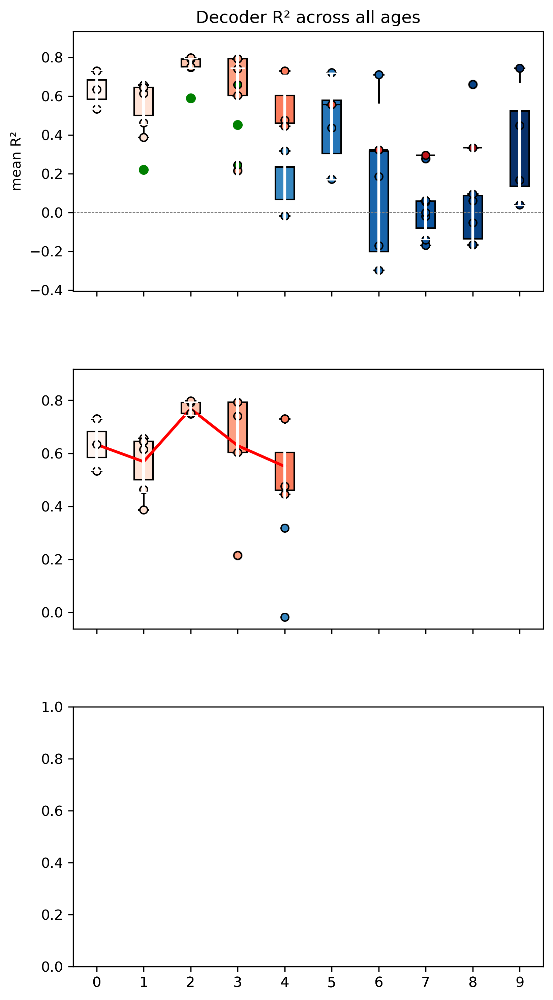

In [350]:
import matplotlib.pyplot as plt
import numpy as np

# Colors
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues_light = [plt.cm.Blues(0.4 + 0.6*i/max(1,len(unique_ages)-1)) for i in range(len(unique_ages))]
green_color = 'green'

width = 0.4
ages_to_plot = [age for age in unique_ages if int(age[1:]) <= 5]

fig, (ax0, ax1, ax2) = plt.subplots(3,1,figsize=(6,12), dpi=300, sharex=True, gridspec_kw={'hspace':0.3})

# --- Top: Full R² per age ---
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]

    # Dual Imaging
    dual_data = age_data[age_data['group']=='Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        mean = dual_data.mean()
        sd = dual_data.std()
        bp = ax0.boxplot(dual_data, positions=[i], widths=width,
                         patch_artist=True,
                         boxprops=dict(facecolor=blues_light[i], color='black'),
                         medianprops=dict(visible=False),
                         showmeans=False,
                         whiskerprops=dict(color='black', linewidth=1.2),
                         capprops=dict(color='black', linewidth=1.2),
                         flierprops=dict(marker='o', color='black', alpha=0.3))
        # White error bar
        ax0.errorbar(i, mean, yerr=sd, fmt='none', ecolor='white', elinewidth=2, capsize=5, zorder=4)
        ax0.scatter(np.full(len(dual_data), i), dual_data, color=blues_light[i],
                    edgecolor='black', s=30, zorder=3)

    # GABA
    gaba_data = age_data[age_data['group']=='GABA']['r2_linear']
    if len(gaba_data) > 0:
        mean = gaba_data.mean()
        sd = gaba_data.std()
        bp = ax0.boxplot(gaba_data, positions=[i], widths=width,
                         patch_artist=True,
                         boxprops=dict(facecolor=reds[i], color='black'),
                         medianprops=dict(visible=False),
                         showmeans=False,
                         whiskerprops=dict(color='black', linewidth=1.2),
                         capprops=dict(color='black', linewidth=1.2),
                         flierprops=dict(marker='o', color='black', alpha=0.3))
        ax0.errorbar(i, mean, yerr=sd, fmt='none', ecolor='white', elinewidth=2, capsize=5, zorder=4)
        ax0.scatter(np.full(len(gaba_data), i), gaba_data, color=reds[i],
                    edgecolor='black', s=30, zorder=3)

    # EMX
    emx_data = age_data[age_data['group']=='EMX']['r2_linear']
    if len(emx_data) > 0:
        mean = emx_data.mean()
        sd = emx_data.std()
        ax0.errorbar(i, mean, yerr=sd, fmt='o', color=green_color, ecolor='white', elinewidth=2, capsize=5, zorder=4)
        ax0.scatter(np.full(len(emx_data), i), emx_data, color=green_color,
                    edgecolor='black', s=30, zorder=3)

ax0.set_ylabel("mean R²")
ax0.axhline(0, linestyle='--', color='grey', lw=0.5)
ax0.set_title("Decoder R² across all ages")

# --- Middle: R² up to P5 ---
mean_gaba_r2 = []
mean_dual_r2 = []
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]

    # GABA
    gaba_data = age_data[age_data['group']=='GABA']['r2_linear']
    if len(gaba_data) > 0:
        mean = gaba_data.mean()
        sd = gaba_data.std()
        mean_gaba_r2.append(mean)
        bp = ax1.boxplot(gaba_data, positions=[i], widths=width,
                         patch_artist=True,
                         boxprops=dict(facecolor=reds[i], color='black'),
                         medianprops=dict(visible=False),
                         showmeans=False,
                         whiskerprops=dict(color='black', linewidth=1.2),
                         capprops=dict(color='black', linewidth=1.2),
                         flierprops=dict(marker='o', color='black', alpha=0.3))
        ax1.errorbar(i, mean, yerr=sd, fmt='none', ecolor='white', elinewidth=2, capsize=5, zorder=4)
        ax1.scatter(np.full(len(gaba_data), i), gaba_data, color=reds[i], edgecolor='black', s=30, zorder=3)
    
    # Dual Imaging
    dual_data = age_data[age_data['group']=='Dual Imaging']['r2_linear']
    if len(dual_data) > 0:
        mean = dual_data.mean()
        mean_dual_r2.append(mean)
        ax1.scatter(np.full(len(dual_data), i), dual_data, color=blues_light[i], edgecolor='black', s=30, zorder=3)

# Mean lines
ax1.plot(range(len(ages_to_plot)), mean_gaba_r2, color='red', lw=2, label='GABA mean')
ax1.plot(range(len(ages_to_plot)), mean_dual_r2, color='blue', lw=2, label='Dual mean')
ax1.set_ylabel("mean R²")
ax1.axhline(0, linestyle='--', color='grey', lw=0.5)
ax1.set_title("Decoder R² up to P5")
ax1.legend()

# --- Bottom: F1-score up to P5 ---
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]
    gaba_f1 = age_data[age_data['group']=='GABA']['f1_score_logistic']
    if len(gaba_f1) > 0:
        mean = gaba_f1.mean()
        sd = gaba_f1.std()
        bp = ax2.boxplot(gaba_f1, positions=[i], widths=width,
                         patch_artist=True,
                         boxprops=dict(facecolor=reds[i], color='black'),
                         medianprops=dict(visible=False),
                         showmeans=False,
                         whiskerprops=dict(color='black', linewidth=1.2),
                         capprops=dict(color='black', linewidth=1.2),
                         flierprops=dict(marker='o', color='black', alpha=0.3))
        ax2.errorbar(i, mean, yerr=sd, fmt='none', ecolor='white', elinewidth=2, capsize=5, zorder=4)
        ax2.scatter(np.full(len(gaba_f1), i), gaba_f1, color=reds[i], edgecolor='black', s=30, zorder=3)

ax2.set_ylabel("F1-score")
ax2.set_xlabel("Age")
ax2.axhline(0, linestyle='--', color='grey', lw=0.5)
ax2.set_xticks(range(len(ages_to_plot)))
ax2.set_xticklabels(ages_to_plot)

plt.tight_layout()
plt.show()


In [386]:
for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]

    # Top: R² boxplot
    gaba_r2 = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_r2) > 0:
        ax1.boxplot(gaba_r2, positions=[i], widths=0.4, patch_artist=True,
                    boxprops=dict(facecolor=reds[i], color='black'),
                    medianprops=dict(visible=False),           # hide median
                    showmeans=True, meanprops=dict(marker='o', markerfacecolor='white',
                                                    markeredgecolor='black', markersize=8),
                    whiskerprops=dict(color='black', linewidth=1.2),
                    capprops=dict(color='black', linewidth=1.2),
                    flierprops=dict(marker='o', color='black', alpha=0.3),
                    whis=[25,75])  # set whiskers to Q1 and Q3 only

        # Optional: overlay individual points
        ax1.scatter(np.full(len(gaba_r2), i), gaba_r2, color=reds[i], edgecolor='black', s=30, zorder=3)

    # Bottom: F1 boxplot
    gaba_f1 = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_f1) > 0:
        ax2.boxplot(gaba_f1, positions=[i], widths=0.4, patch_artist=True,
                    boxprops=dict(facecolor=reds[i], color='black'),
                    medianprops=dict(visible=False),
                    showmeans=True, meanprops=dict(marker='o', markerfacecolor='white',
                                                    markeredgecolor='black', markersize=8),
                    whiskerprops=dict(color='black', linewidth=1.2),
                    capprops=dict(color='black', linewidth=1.2),
                    flierprops=dict(marker='o', color='black', alpha=0.3),
                    whis=[25,75])

        ax2.scatter(np.full(len(gaba_f1), i), gaba_f1, color=reds[i], edgecolor='black', s=30, zorder=3)


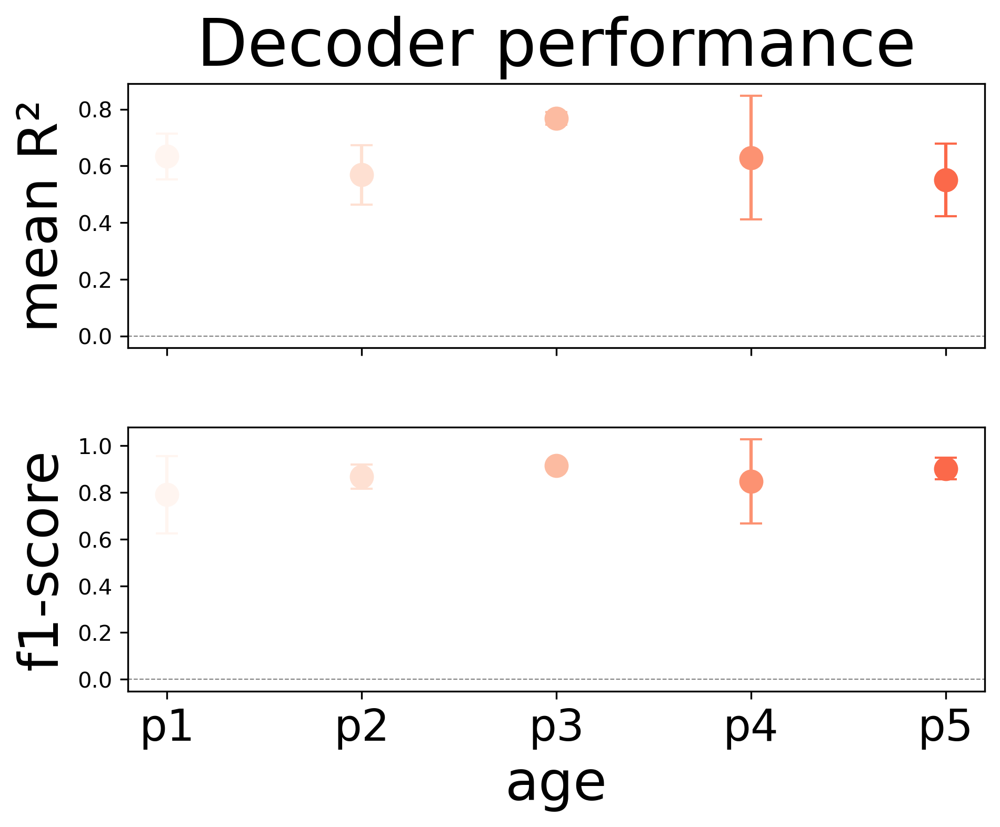

In [387]:
import matplotlib.pyplot as plt
import numpy as np

# Reds colormap
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]

# Ages up to P5
ages_to_plot = [age for age in unique_ages if int(age[1:]) <= 5]

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7,5), dpi=300, sharex=True, gridspec_kw={'hspace':0.3})

for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]

    # Top: mean R² with SD
    gaba_r2 = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_r2) > 0:
        mean_r2 = np.mean(gaba_r2)
        sd_r2 = np.std(gaba_r2)
        ax1.errorbar(i, mean_r2, yerr=sd_r2, fmt='o', color=reds[i], markersize=10, capsize=5)

    # Bottom: mean F1 with SD
    gaba_f1 = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_f1) > 0:
        mean_f1 = np.mean(gaba_f1)
        sd_f1 = np.std(gaba_f1)
        ax2.errorbar(i, mean_f1, yerr=sd_f1, fmt='o', color=reds[i], markersize=10, capsize=5)

# Axes formatting
ax1.set_ylabel("mean R²", fontsize=25)
ax1.set_title("Decoder performance", fontsize=30, y=1.02)
ax1.axhline(0, linestyle='--', color='grey', lw=0.5)

ax2.set_xticks(range(len(ages_to_plot)))
ax2.set_xticklabels(ages_to_plot, fontsize=20)
ax2.set_xlabel("age", fontsize=25)
ax2.set_ylabel("f1-score", fontsize=25)
ax2.axhline(0, linestyle='--', color='grey', lw=0.5)

plt.tight_layout()
plt.show()


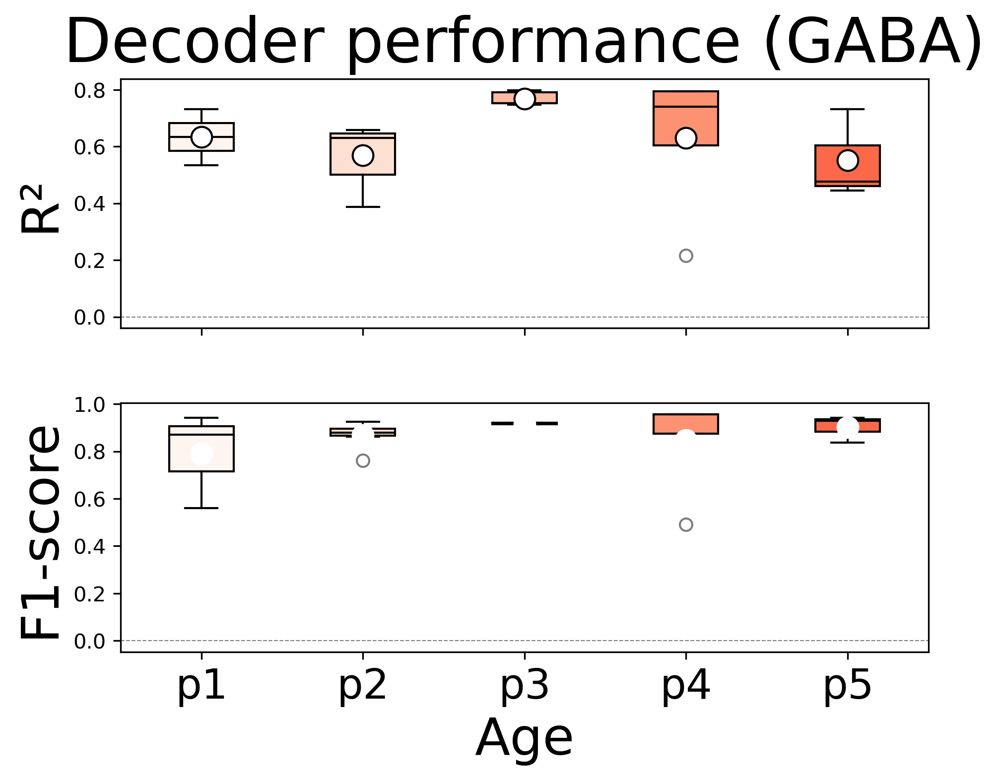

In [388]:
import matplotlib.pyplot as plt
import numpy as np

# Reds colormap
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]

# Ages up to P5
ages_to_plot = [age for age in unique_ages if int(age[1:]) <= 5]

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7,5), dpi=300, sharex=True, gridspec_kw={'hspace':0.3})

for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]

    # --- Top: R² boxplot ---
    gaba_r2 = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_r2) > 0:
        bp = ax1.boxplot(gaba_r2, positions=[i], widths=0.4, patch_artist=True,
                         boxprops=dict(facecolor=reds[i], color='black'),
                         medianprops=dict(color='black'),
                         whiskerprops=dict(color='black'),
                         capprops=dict(color='black'),
                         flierprops=dict(marker='o', color='black', alpha=0.5),
                         showfliers=True)
        # overlay mean line/point
        mean_r2 = np.mean(gaba_r2)
        ax1.scatter(i, mean_r2, color='white', edgecolor='black', s=100, zorder=4)

    # --- Bottom: F1 boxplot ---
    gaba_f1 = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_f1) > 0:
        bp = ax2.boxplot(gaba_f1, positions=[i], widths=0.4, patch_artist=True,
                         boxprops=dict(facecolor=reds[i], color='black'),
                         medianprops=dict(color='black'),
                         whiskerprops=dict(color='black'),
                         capprops=dict(color='black'),
                         flierprops=dict(marker='o', color='black', alpha=0.5),
                         showfliers=True)
        # overlay mean line/point
        mean_f1 = np.mean(gaba_f1)
        ax2.scatter(i, mean_f1, color='white', edgecolor='white', s=100, zorder=4)

# Axes formatting
ax1.set_ylabel("R²", fontsize=25)
ax1.set_title("Decoder performance (GABA)", fontsize=30, y=1.02)
ax1.axhline(0, linestyle='--', color='grey', lw=0.5)

ax2.set_xticks(range(len(ages_to_plot)))
ax2.set_xticklabels(ages_to_plot, fontsize=20)
ax2.set_xlabel("Age", fontsize=25)
ax2.set_ylabel("F1-score", fontsize=25)
ax2.axhline(0, linestyle='--', color='grey', lw=0.5)

plt.tight_layout()
plt.show()


ValueError: not enough values to unpack (expected 2, got 1)

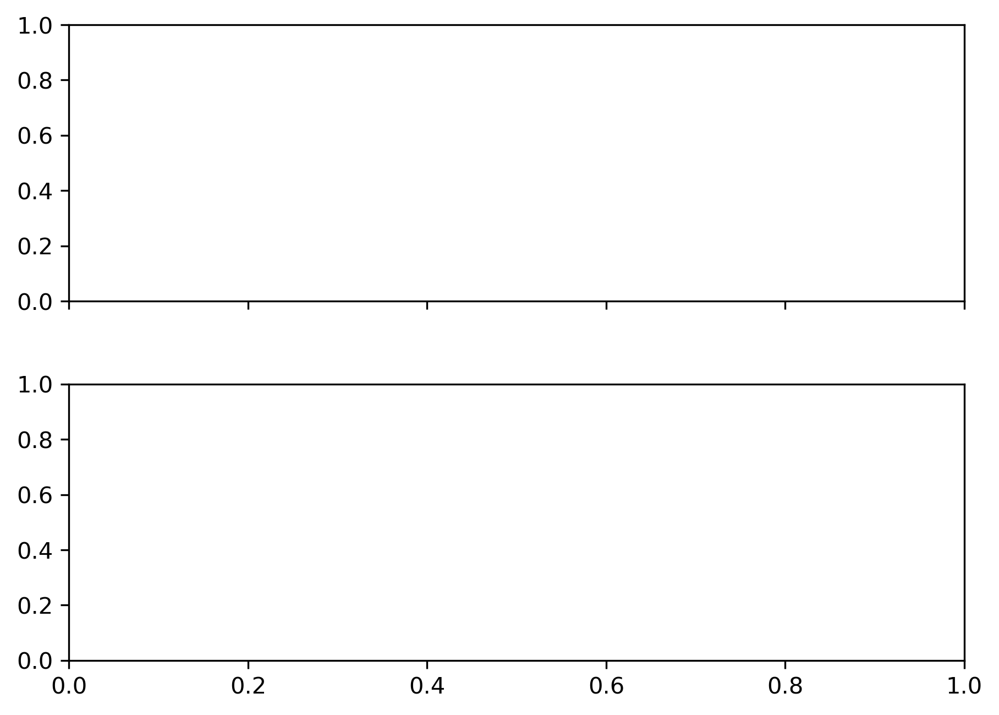

In [389]:
import matplotlib.pyplot as plt
import numpy as np

# Reds colormap
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]

# Ages up to P5
ages_to_plot = [age for age in unique_ages if int(age[1:]) <= 5]

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7,5), dpi=300, sharex=True, gridspec_kw={'hspace':0.3})

for i, age in enumerate(ages_to_plot):
    age_data = combined_df[combined_df['age'] == age]

    # --- Top: R² ---
    gaba_r2 = age_data[age_data['group'] == 'GABA']['r2_linear']
    if len(gaba_r2) > 0:
        mean_r2 = np.mean(gaba_r2)
        sd_r2 = np.std(gaba_r2)
        # Boxplot with whiskers at mean ± SD
        ax1.boxplot(gaba_r2, positions=[i], widths=0.4, patch_artist=True,
                    boxprops=dict(facecolor=reds[i], color='black'),
                    medianprops=dict(color='black'),
                    whiskerprops=dict(color='black'),
                    capprops=dict(color='black'),
                    flierprops=dict(marker='o', color='black', alpha=0.5),
                    showfliers=True,
                    whis=[(mean_r2 - sd_r2, mean_r2 + sd_r2)])
        # Individual points
        ax1.scatter(np.full(len(gaba_r2), i), gaba_r2, color=reds[i], edgecolor='black', s=60, zorder=3)

    # --- Bottom: F1 ---
    gaba_f1 = age_data[age_data['group'] == 'GABA']['f1_score_logistic']
    if len(gaba_f1) > 0:
        mean_f1 = np.mean(gaba_f1)
        sd_f1 = np.std(gaba_f1)
        ax2.boxplot(gaba_f1, positions=[i], widths=0.4, patch_artist=True,
                    boxprops=dict(facecolor=reds[i], color='black'),
                    medianprops=dict(color='black'),
                    whiskerprops=dict(color='black'),
                    capprops=dict(color='black'),
                    flierprops=dict(marker='o', color='black', alpha=0.5),
                    showfliers=True,
                    whis=[(mean_f1 - sd_f1, mean_f1 + sd_f1)])
        ax2.scatter(np.full(len(gaba_f1), i), gaba_f1, color=reds[i], edgecolor='black', s=60, zorder=3)

# Axes formatting
ax1.set_ylabel("mean R²", fontsize=25)
ax1.set_title("Decoder performance", fontsize=30, y=1.02)
ax1.axhline(0, linestyle='--', color='grey', lw=0.5)

ax2.set_xticks(range(len(ages_to_plot)))
ax2.set_xticklabels(ages_to_plot, fontsize=20)
ax2.set_xlabel("age", fontsize=25)
ax2.set_ylabel("f1-score", fontsize=25)
ax2.axhline(0, linestyle='--', color='grey', lw=0.5)

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import re

# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

threshold = 0.90  # variance explained threshold

# Organize sessions by group and age
group_age_dims = {'dual imaging': {}, 'gaba': {}}
for _, age, var_exp, group in valid_rows:
    grp = group.lower()
    if grp in group_age_dims:
        if age not in group_age_dims[grp]:
            group_age_dims[grp][age] = []
        cum_var = np.cumsum(var_exp) / np.sum(var_exp)  # normalize
        n_pcs_thresh = np.argmax(cum_var >= threshold) + 1
        group_age_dims[grp][age].append(n_pcs_thresh)

# Prepare mean and SEM per age
unique_ages_sorted = sorted(unique_ages, key=extract_age_num)
blues = [cm.Blues(i / max(1, len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]
oranges = [cm.Reds(i / max(1, len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]

# Plot small barplots
bar_width = 0.4
x = np.arange(len(unique_ages_sorted))

fig, ax = plt.subplots(figsize=(8,5), dpi=300)

# Dual Imaging bars
dual_means = [np.mean(group_age_dims['dual imaging'].get(age, [0])) for age in unique_ages_sorted]
dual_sems = [np.std(group_age_dims['dual imaging'].get(age, [0]))/np.sqrt(len(group_age_dims['dual imaging'].get(age, [1]))) for age in unique_ages_sorted]
ax.bar(x - bar_width/2, dual_means, yerr=dual_sems, width=bar_width, edgecolor='grey',ecolor='grey', color=blues, capsize=5, label='E/I')

# GABA bars
gaba_means = [np.mean(group_age_dims['gaba'].get(age, [0])) for age in unique_ages_sorted]
gaba_sems = [np.std(group_age_dims['gaba'].get(age, [0]))/np.sqrt(len(group_age_dims['gaba'].get(age, [1]))) for age in unique_ages_sorted]
ax.bar(x + bar_width/2, gaba_means, yerr=gaba_sems, width=bar_width, color=oranges, edgecolor='grey',ecolor='grey', capsize=5, label='I')

ax.set_xticks(x)
ax.set_xticklabels(unique_ages_sorted, fontsize=25)
ax.set_xlabel("age", fontsize=30)
ax.set_ylabel(f"# PCs exp.{threshold*100:.0f}% var", fontsize=25)
ax.set_title("Dimensionality")
ax.legend(fontsize=9)
import matplotlib.patches as mpatches

blue_patch = mpatches.Patch(color=cm.Blues(0.6), label='E/I')   # mid blue
orange_patch = mpatches.Patch(color=cm.Reds(0.6), label='I') # mid orange

ax.legend(handles=[blue_patch, orange_patch], fontsize=15, frameon=False)

plt.tight_layout()
plt.show()


In [390]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

# --- Prepare data ---
# Assuming all_plot_df has a column 'active_state_fraction' (0-1)
# If you only have mean_active_motion_duration, convert it to % active:
# all_plot_df['active_fraction'] = all_plot_df['mean_active_motion_duration'] / total_time

# For example, if duration is already fraction:
all_plot_df['active_percent'] = all_plot_df['mean_active_motion_duration'] * 100

# Optional: define order of groups
group_order = ['GABA', 'Dual Imaging', 'EMX', 'Both']

# --- Bar plot per group ---
plt.figure(figsize=(8,5), dpi=300)

sns.barplot(
    data=all_plot_df,
    x='group',
    y='active_percent',
    order=group_order,
    ci='sd',           # show mean ± SD
    palette=['orange', 'blue', 'green', 'purple']
)

# Overlay scatter points for individual datasets
for i, group in enumerate(group_order):
    group_data = all_plot_df[all_plot_df['group'] == group]['active_percent']
    x_jitter = np.random.normal(i, 0.05, size=len(group_data))  # small jitter
    plt.scatter(x_jitter, group_data, color='black', s=50, zorder=3, alpha=0.8)

plt.ylabel('% Time Active', fontsize=13)
plt.xlabel('Group', fontsize=13)
plt.title('Percentage of Active State per Dataset', fontsize=15)
plt.ylim(0, 100)
plt.tight_layout()
plt.show()


ConversionError: Failed to convert value(s) to axis units: masked_array(data=[--, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --],
             mask=[ True,  True,  True,  True,  True,  True,  True,  True,
                    True,  True,  True,  True,  True,  True,  True,  True,
                    True,  True,  True,  True,  True,  True,  True,  True,
                    True,  True],
       fill_value=1e+20,
            dtype=float64)

<Figure size 2400x1500 with 1 Axes>

In [391]:
# Prepare colors
unique_ages_sorted = sorted(unique_ages, key=extract_age_num)
blues = [cm.Blues(i / max(1, len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]
Reds = [cm.Reds(i / max(1, len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]

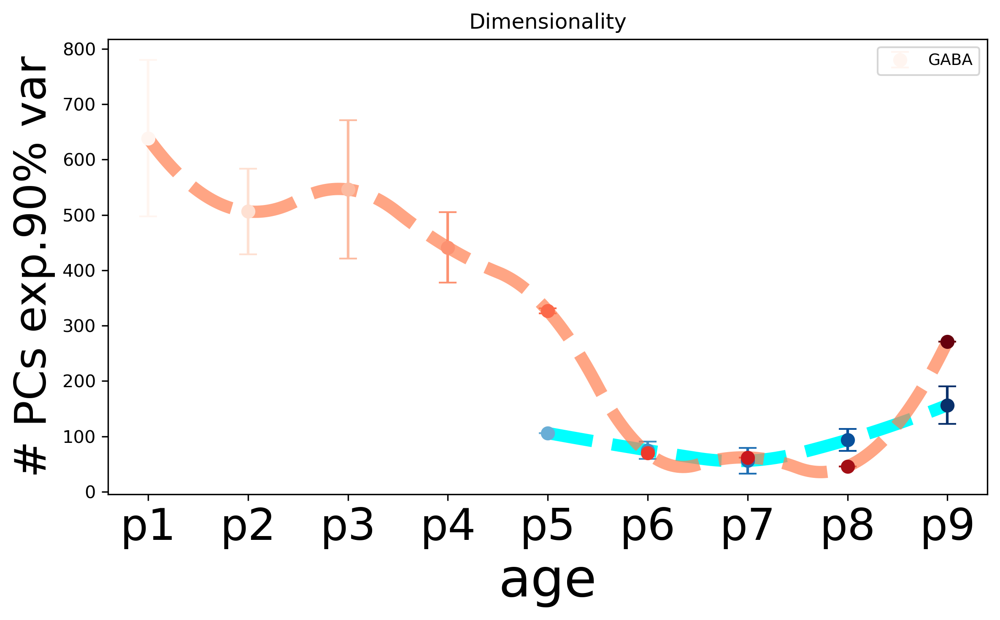

In [392]:
from scipy.interpolate import make_interp_spline
import numpy as np
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8,5), dpi=300)

x = np.arange(len(unique_ages_sorted))

# Plot mean points with error bars
for i, age in enumerate(unique_ages_sorted):
    # Dual Imaging
    dual_values = group_age_dims['dual imaging'].get(age, [])
    if dual_values:
        mean_dual = np.mean(dual_values)
        sem_dual = np.std(dual_values)/np.sqrt(len(dual_values))
        ax.errorbar(i, mean_dual, yerr=sem_dual, fmt='o', color=blues[i], capsize=5, label='Dual Imaging' if i==0 else "", markersize=7)

    # GABA
    gaba_values = group_age_dims['gaba'].get(age, [])
    if gaba_values:
        mean_gaba = np.mean(gaba_values)
        sem_gaba = np.std(gaba_values)/np.sqrt(len(gaba_values))
        ax.errorbar(i, mean_gaba, yerr=sem_gaba, fmt='o', color=Reds[i], capsize=5, label='GABA' if i==0 else "", markersize=7)

# Convert to arrays for spline
dual_means_arr = np.array([np.mean(group_age_dims['dual imaging'].get(age, [np.nan])) for age in unique_ages_sorted])
gaba_means_arr = np.array([np.mean(group_age_dims['gaba'].get(age, [np.nan])) for age in unique_ages_sorted])

# Smooth curve for Dual Imaging
mask_dual = ~np.isnan(dual_means_arr)
if mask_dual.sum() > 2:
    x_dual = x[mask_dual]
    y_dual = dual_means_arr[mask_dual]
    x_smooth = np.linspace(x_dual.min(), x_dual.max(), 300)
    spline = make_interp_spline(x_dual, y_dual, k=2)
    y_smooth = spline(x_smooth)
    ax.plot(x_smooth, y_smooth, color='cyan', linestyle='--', linewidth=7)

# Smooth curve for GABA
mask_gaba = ~np.isnan(gaba_means_arr)
if mask_gaba.sum() > 2:
    x_gaba = x[mask_gaba]
    y_gaba = gaba_means_arr[mask_gaba]
    x_smooth = np.linspace(x_gaba.min(), x_gaba.max(), 300)
    spline = make_interp_spline(x_gaba, y_gaba, k=2)
    y_smooth = spline(x_smooth)
    ax.plot(x_smooth, y_smooth, color='coral', linestyle='--', linewidth=7, alpha=0.7)

ax.set_xticks(range(len(unique_ages_sorted)))
ax.set_xticklabels(unique_ages_sorted, fontsize=25)
ax.set_xlabel("age", fontsize=30)
ax.set_ylabel(f"# PCs exp.{threshold*100:.0f}% var", fontsize=25)
ax.set_title("Dimensionality")
ax.legend(fontsize=9)
# ax.set_title("Dimensionality", fontsize=30)
# ax.legend(fontsize=10)
plt.tight_layout()
plt.show()

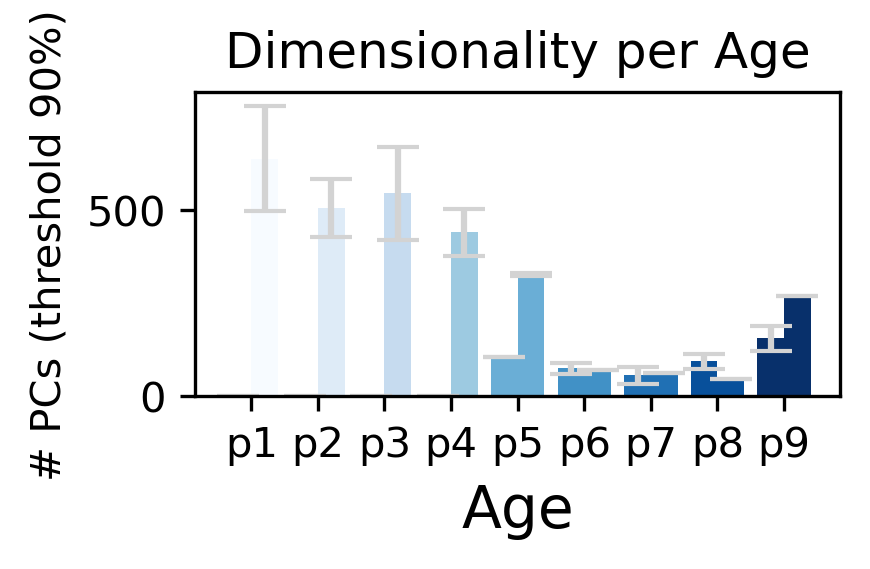

In [393]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import re

# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

threshold = 0.90  # variance explained threshold

# Example: group_age_dims[group][age] = list of n_pcs_thresh
# group_age_dims = {'dual imaging': {...}, 'gaba': {...}}

# Sort ages
unique_ages_sorted = sorted(unique_ages, key=extract_age_num)
n_ages = len(unique_ages_sorted)
x = np.arange(n_ages)
bar_width = 0.4

# Color palette based on age
age_colors = [cm.Blues(i / max(1, n_ages-1)) for i in range(n_ages)]

fig, ax = plt.subplots(figsize=(3,2), dpi=300)

for i, age in enumerate(unique_ages_sorted):
    # Dual Imaging
    vals_dual = group_age_dims['dual imaging'].get(age, [0])
    mean_dual = np.mean(vals_dual)
    sem_dual = np.std(vals_dual)/np.sqrt(len(vals_dual))
    ax.bar(x[i] - bar_width/2, mean_dual, yerr=sem_dual, width=bar_width,
           color=age_colors[i], ecolor='lightgrey', capsize=5, label=age if i==0 else "")

    # GABA
    vals_gaba = group_age_dims['gaba'].get(age, [0])
    mean_gaba = np.mean(vals_gaba)
    sem_gaba = np.std(vals_gaba)/np.sqrt(len(vals_gaba))
    ax.bar(x[i] + bar_width/2, mean_gaba, yerr=sem_gaba, width=bar_width,
           color=age_colors[i], ecolor='lightgrey', capsize=5)

ax.set_xticks(x)
ax.set_xticklabels(unique_ages_sorted)
ax.set_xlabel("Age", fontsize=14)
ax.set_ylabel(f"# PCs (threshold {threshold*100:.0f}%)")
ax.set_title("Dimensionality per Age")

# Only one legend entry since color = age
# handles = [plt.Rectangle((0,0),1,1, color=age_colors[i]) for i in range(n_ages)]
# ax.legend(handles, unique_ages_sorted, title='Age', frameon=False)

plt.tight_layout()
plt.show()


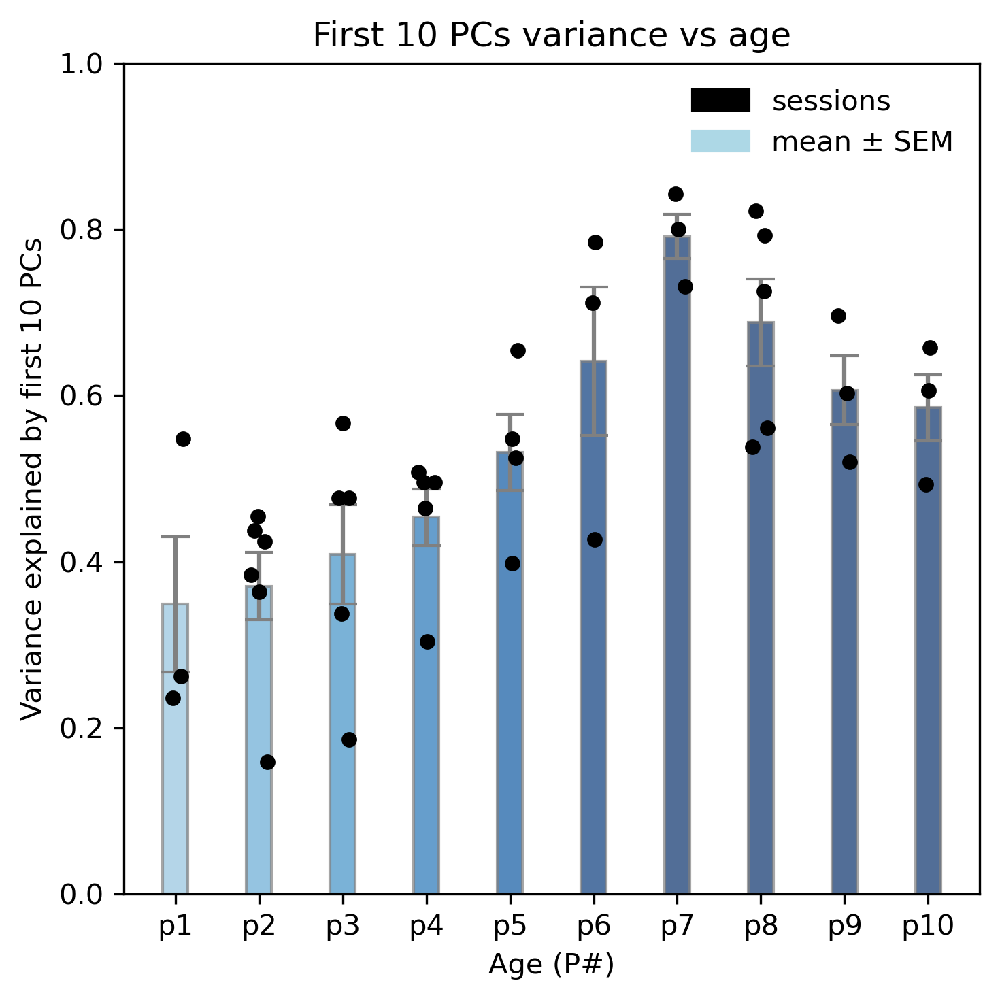

In [394]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import re

# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

threshold = 0.90  # variance explained threshold

# Collect sessions
rows = []
for idx, row in combined_df.iterrows():
    var_exp_cell = row.get('var_exp_time', None)
    group = row.get('group', '').lower()
    if var_exp_cell is not None:
        age_val = str(row.get('age', ''))
        age_label = f'p{age_val.lower().lstrip("p")}'
        rows.append((row['session'], age_label, var_exp_cell, group))

# Unique ages
unique_ages = sorted(set(age for _, age, _, _ in rows), key=extract_age_num)
n_ages = len(unique_ages)
x = np.arange(n_ages)
bar_width = 0.3  # wider bars if merged

# Blues adjusted for visibility
age_colors = [cm.Blues(0.4 + i/max(1, n_ages-1)) for i in range(n_ages)]

# Organize variance explained by first 10 PCs per age and group
age_group_var10 = {age: {'gaba': [], 'dual imaging': []} for age in unique_ages}
for _, age, var_exp, group in rows:
    var10 = np.sum(var_exp[:10])
    if group in age_group_var10[age]:
        age_group_var10[age][group].append(var10)

# Merge for interneurons only (GABA)
merge_interneuron_only = True
fig, ax = plt.subplots(figsize=(5,5), dpi=300)

for i, age in enumerate(unique_ages):
    if merge_interneuron_only:
        # Merge GABA and dual imaging
        merged_vals = age_group_var10[age]['gaba'] + age_group_var10[age]['dual imaging']
        if merged_vals:
            mean_val = np.mean(merged_vals)
            sem_val = np.std(merged_vals)/np.sqrt(len(merged_vals))
            ax.bar(x[i], mean_val, yerr=sem_val, width=bar_width,
                   color=age_colors[i], edgecolor='grey', ecolor='grey', capsize=5, alpha=0.7)
            # Overlay individual points
            jitter = (np.random.rand(len(merged_vals)) - 0.5) * bar_width * 0.7
            ax.scatter(x[i]+jitter, merged_vals, color='black', s=20, zorder=3)
    else:
        # Keep separate
        for j, group in enumerate(['gaba', 'dual imaging']):
            vals = age_group_var10[age][group]
            if vals:
                mean_val = np.mean(vals)
                sem_val = np.std(vals)/np.sqrt(len(vals))
                offset = -bar_width/4 if group=='gaba' else bar_width/4
                ax.bar(x[i]+offset, mean_val, yerr=sem_val, width=bar_width/2,
                       color=age_colors[i], edgecolor='grey', ecolor='grey', capsize=5, alpha=0.7)
                jitter = (np.random.rand(len(vals)) - 0.5) * bar_width * 0.35
                ax.scatter(x[i]+offset+jitter, vals, color='black', s=20, zorder=3)

# Axes formatting
ax.set_xticks(x)
ax.set_xticklabels(unique_ages)
ax.set_xlabel("Age (P#)")
ax.set_ylabel("Variance explained by first 10 PCs")
ax.set_title("First 10 PCs variance vs age")
ax.set_ylim(0,1)

# Legend
from matplotlib.patches import Patch
handles = [Patch(color='black', label='sessions'),
           Patch(color='lightblue', label='mean ± SEM')]
ax.legend(handles=handles, frameon=False)

plt.tight_layout()
plt.show()


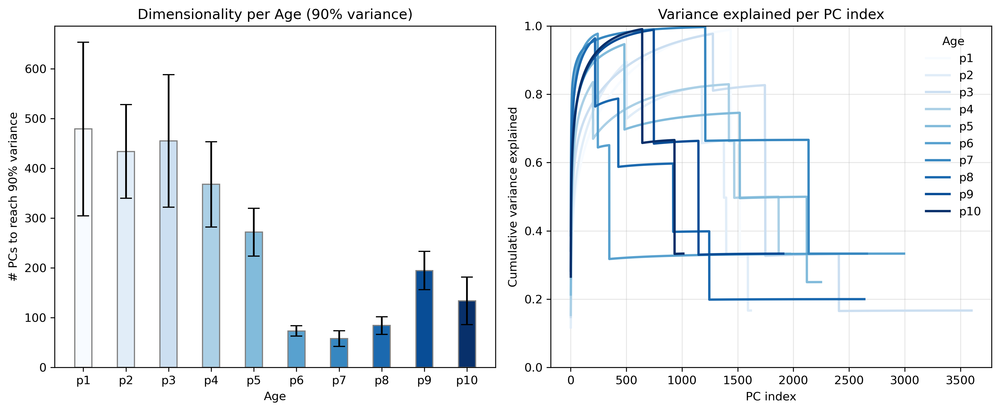

In [355]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import re

# Helper to extract numeric age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

# Sort ages
unique_ages_sorted = sorted(unique_ages, key=extract_age_num)
n_ages = len(unique_ages_sorted)
age_colors = [cm.Blues(i / max(1, n_ages-1)) for i in range(n_ages)]

# --- First subplot: bar plot for number of PCs to reach threshold ---
threshold = 0.90  # 90% variance
fig, axes = plt.subplots(1, 2, figsize=(12,5), dpi=300)

bar_width = 0.4
x = np.arange(n_ages)

for i, age in enumerate(unique_ages_sorted):
    # Combine all sessions (dual + gaba) for this age
    vals_dual = group_age_dims['dual imaging'].get(age, [0])
    vals_gaba = group_age_dims['gaba'].get(age, [0])
    all_vals = vals_dual + vals_gaba
    
    mean_val = np.mean(all_vals) if all_vals else 0
    sem_val = np.std(all_vals)/np.sqrt(len(all_vals)) if all_vals else 0
    
    axes[0].bar(x[i], mean_val, yerr=sem_val, width=bar_width,
                color=age_colors[i], edgecolor='gray', capsize=5)

axes[0].set_xticks(x)
axes[0].set_xticklabels(unique_ages_sorted)
axes[0].set_ylabel(f"# PCs to reach {int(threshold*100)}% variance")
axes[0].set_xlabel("Age")
axes[0].set_title("Dimensionality per Age (90% variance)")

# --- Second subplot: variance explained as function of PC index ---
# Pick sessions per age and compute average cumulative variance
for i, age in enumerate(unique_ages_sorted):
    all_var_exp = []

    # Gather variance arrays
    for _, a, var_exp, grp in valid_rows:
        if a == age:
            all_var_exp.append(var_exp)  # var_exp is a vector per session

    # Compute average cumulative variance across sessions
    if all_var_exp:
        max_len = max(len(v) for v in all_var_exp)
        aligned_var = np.zeros((len(all_var_exp), max_len))
        for j, v in enumerate(all_var_exp):
            aligned_var[j, :len(v)] = np.cumsum(v)/np.sum(v)
        mean_cumvar = np.nanmean(aligned_var, axis=0)
        axes[1].plot(range(1, max_len+1), mean_cumvar, color=age_colors[i],
                     lw=2, label=age)

axes[1].set_xlabel("PC index")
axes[1].set_ylabel("Cumulative variance explained")
axes[1].set_title("Variance explained per PC index")
axes[1].legend(title="Age", frameon=False)
axes[1].set_ylim(0,1)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()


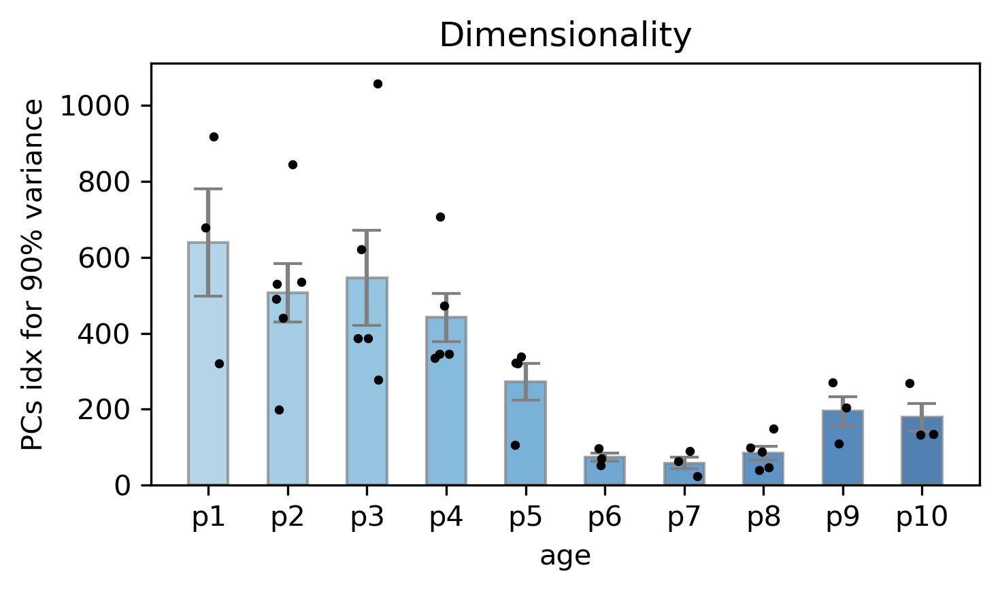

In [356]:
# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

threshold = 0.90  # variance explained threshold

# Collect sessions
rows = []
for idx, row in combined_df.iterrows():
    var_exp_cell = row.get('var_exp_time', None)
    group = row.get('group', '').lower()
    if var_exp_cell is not None:
        age_val = str(row.get('age', ''))
        age_label = f'p{age_val.lower().lstrip("p")}'
        rows.append((row['session'], age_label, var_exp_cell, group))

# Unique ages
unique_ages = sorted(set(age for _, age, _, _ in rows), key=extract_age_num)
n_ages = len(unique_ages)
x = np.arange(n_ages)
bar_width = 0.5  # wider bar for merged

# Blues adjusted for visibility
age_colors = [cm.Blues(0.4 + 0.5*i/max(1, n_ages-1)) for i in range(n_ages)]

# Organize n PCs to reach 90% variance
age_group_npcs = {age: {'gaba': [], 'dual imaging': []} for age in unique_ages}
for _, age, var_exp, group in rows:
    cum_var = np.cumsum(var_exp) / np.sum(var_exp)
    n_pcs = np.argmax(cum_var >= threshold) + 1
    if group in age_group_npcs[age]:
        age_group_npcs[age][group].append(n_pcs)

# Merge GABA & Dual Imaging if desired
merge_interneuron_only = True

fig, ax = plt.subplots(figsize=(5,3), dpi=300)

for i, age in enumerate(unique_ages):
    if merge_interneuron_only:
        merged_vals = age_group_npcs[age]['gaba'] + age_group_npcs[age]['dual imaging']
        if merged_vals:
            mean_val = np.mean(merged_vals)
            sem_val = np.std(merged_vals)/np.sqrt(len(merged_vals))
            ax.bar(x[i], mean_val, yerr=sem_val, width=bar_width,
                   color=age_colors[i], edgecolor='grey', ecolor='grey', capsize=5, alpha=0.7)
            jitter = (np.random.rand(len(merged_vals)) - 0.5) * bar_width * 0.7
            ax.scatter(x[i]+jitter, merged_vals, color='black', s=5, zorder=3)
    else:
        for j, group in enumerate(['gaba', 'dual imaging']):
            vals = age_group_npcs[age][group]
            if vals:
                mean_val = np.mean(vals)
                sem_val = np.std(vals)/np.sqrt(len(vals))
                offset = -bar_width/4 if group=='gaba' else bar_width/4
                ax.bar(x[i]+offset, mean_val, yerr=sem_val, width=bar_width/2,
                       color=age_colors[i], edgecolor='grey', ecolor='grey', capsize=5, alpha=0.7)
                jitter = (np.random.rand(len(vals)) - 0.5) * bar_width * 0.35
                ax.scatter(x[i]+offset+jitter, vals, color='black', s=5, zorder=3)

# Axes formatting
ax.set_xticks(x)
ax.set_xticklabels(unique_ages)
ax.set_xlabel("age")
ax.set_ylabel(f"PCs idx for {threshold*100:.0f}% variance")
ax.set_title("Dimensionality")

plt.tight_layout()
plt.show()

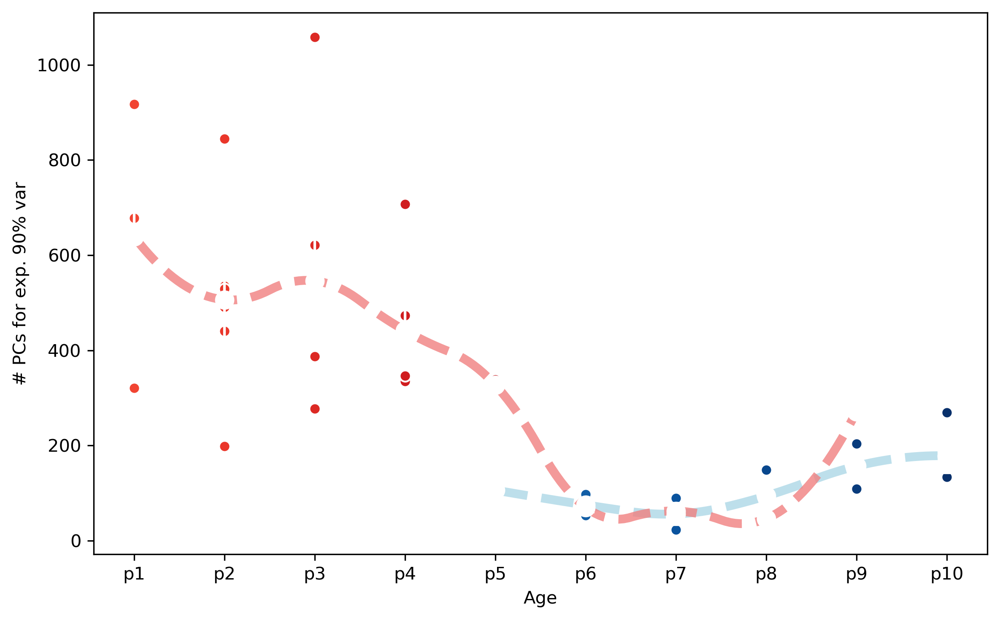

In [357]:
from scipy.interpolate import make_interp_spline
import numpy as np
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8,5), dpi=300)

x = np.arange(len(unique_ages_sorted))

# Light age-related colors
light_blues = [cm.Blues(0.6 + 0.4*i/max(1,len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]
light_reds = [cm.Reds(0.6 + 0.4*i/max(1,len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]
light_greens = [cm.Greens(0.6 + 0.4*i/max(1,len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]  # EMX

# Plot individual points and mean ± SEM
for i, age in enumerate(unique_ages_sorted):
    # Dual Imaging
    dual_values = group_age_dims['dual imaging'].get(age, [])
    if dual_values:
        ax.scatter(np.full(len(dual_values), i), dual_values, 
                   color=light_blues[i], edgecolor='white', s=40, zorder=2)
        mean_dual = np.mean(dual_values)
        sem_dual = np.std(dual_values)/np.sqrt(len(dual_values))
        ax.errorbar(i, mean_dual, yerr=sem_dual, fmt='o', color='white', capsize=5, markersize=10, zorder=3)

    # GABA
    gaba_values = group_age_dims['gaba'].get(age, [])
    if gaba_values:
        ax.scatter(np.full(len(gaba_values), i), gaba_values, 
                   color=light_reds[i], edgecolor='white', s=40, zorder=2)
        mean_gaba = np.mean(gaba_values)
        sem_gaba = np.std(gaba_values)/np.sqrt(len(gaba_values))
        ax.errorbar(i, mean_gaba, yerr=sem_gaba, fmt='o', color='white', capsize=5, markersize=10, zorder=3)

    # EMX
    emx_values = group_age_dims.get('emx', {}).get(age, [])
    if emx_values:
        ax.scatter(np.full(len(emx_values), i), emx_values, 
                   color=light_greens[i], edgecolor='white', s=40, zorder=2)
        mean_emx = np.mean(emx_values)
        sem_emx = np.std(emx_values)/np.sqrt(len(emx_values))
        ax.errorbar(i, mean_emx, yerr=sem_emx, fmt='o', color='white', capsize=5, markersize=10, zorder=3)

# Smooth curves
def smooth_curve(values_arr, color):
    mask = ~np.isnan(values_arr)
    if mask.sum() > 2:
        x_vals = x[mask]
        y_vals = values_arr[mask]
        x_smooth = np.linspace(x_vals.min(), x_vals.max(), 150)
        spline = make_interp_spline(x_vals, y_vals, k=2)
        y_smooth = spline(x_smooth)
        ax.plot(x_smooth, y_smooth, color=color, linestyle='--', linewidth=5, alpha=0.8)

dual_means_arr = np.array([np.mean(group_age_dims['dual imaging'].get(age, [np.nan])) for age in unique_ages_sorted])
gaba_means_arr = np.array([np.mean(group_age_dims['gaba'].get(age, [np.nan])) for age in unique_ages_sorted])
emx_means_arr = np.array([np.mean(group_age_dims.get('emx', {}).get(age, [np.nan])) for age in unique_ages_sorted])

smooth_curve(dual_means_arr, 'lightblue')
smooth_curve(gaba_means_arr, 'lightcoral')
smooth_curve(emx_means_arr, 'lightgreen')

# Axes
ax.set_xticks(range(len(unique_ages_sorted)))
ax.set_xticklabels(unique_ages_sorted)
ax.set_xlabel("Age")
ax.set_ylabel(f"# PCs for exp. {threshold*100:.0f}% var")
plt.tight_layout()
plt.show()

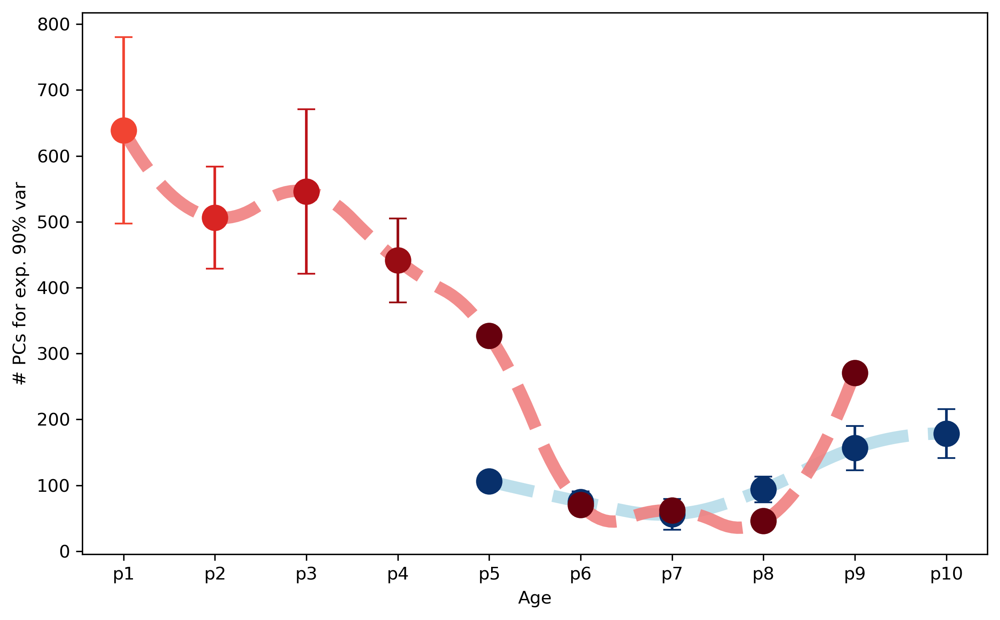

In [358]:
fig, ax = plt.subplots(figsize=(8,5), dpi=300)

x = np.arange(len(unique_ages_sorted))

# Age-related light colors
light_blues = [cm.Blues(0.6 + 0.9*i/max(1,len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]
light_reds = [cm.Reds(0.6 + 0.9*i/max(1,len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]

# Plot mean points with error bars (larger markersize)
for i, age in enumerate(unique_ages_sorted):
    # Dual Imaging
    dual_values = group_age_dims['dual imaging'].get(age, [])
    if dual_values:
        mean_dual = np.mean(dual_values)
        sem_dual = np.std(dual_values)/np.sqrt(len(dual_values))
        ax.errorbar(i, mean_dual, yerr=sem_dual, fmt='o', 
                    color=light_blues[i], capsize=5, 
                    label='Dual Imaging' if i==0 else "", markersize=14)  # bigger marker

    # GABA
    gaba_values = group_age_dims['gaba'].get(age, [])
    if gaba_values:
        mean_gaba = np.mean(gaba_values)
        sem_gaba = np.std(gaba_values)/np.sqrt(len(gaba_values))
        ax.errorbar(i, mean_gaba, yerr=sem_gaba, fmt='o', 
                    color=light_reds[i], capsize=5, 
                    label='GABA' if i==0 else "", markersize=14)  # bigger marker

# Convert to arrays for spline
dual_means_arr = np.array([np.mean(group_age_dims['dual imaging'].get(age, [np.nan])) for age in unique_ages_sorted])
gaba_means_arr = np.array([np.mean(group_age_dims['gaba'].get(age, [np.nan])) for age in unique_ages_sorted])

# Smooth curve for Dual Imaging (less curvature)
mask_dual = ~np.isnan(dual_means_arr)
if mask_dual.sum() > 2:
    x_dual = x[mask_dual]
    y_dual = dual_means_arr[mask_dual]
    x_smooth = np.linspace(x_dual.min(), x_dual.max(), 150)
    spline = make_interp_spline(x_dual, y_dual, k=2)
    y_smooth = spline(x_smooth)
    ax.plot(x_smooth, y_smooth, color='lightblue', linestyle='--', linewidth=7, alpha=0.8)

# Smooth curve for GABA (less curvature)
mask_gaba = ~np.isnan(gaba_means_arr)
if mask_gaba.sum() > 2:
    x_gaba = x[mask_gaba]
    y_gaba = gaba_means_arr[mask_gaba]
    x_smooth = np.linspace(x_gaba.min(), x_gaba.max(), 150)
    spline = make_interp_spline(x_gaba, y_gaba, k=2)
    y_smooth = spline(x_smooth)
    ax.plot(x_smooth, y_smooth, color='lightcoral', linestyle='--', linewidth=7, alpha=0.9)

# Scatter all individual GABA points
ax.scatter(np.full(len(gaba_values), i), gaba_values, 
           color=light_reds[i], edgecolor='white', s=40, zorder=2)

# Overlay mean ± SEM
ax.errorbar(i, mean_gaba, yerr=sem_gaba, fmt='o', 
            color='white', capsize=5, markersize=10, zorder=3)

ax.set_xticks(range(len(unique_ages_sorted)))
ax.set_xticklabels(unique_ages_sorted)
ax.set_xlabel("Age")
ax.set_ylabel(f"# PCs for exp. {threshold*100:.0f}% var")

plt.tight_layout()
plt.show()

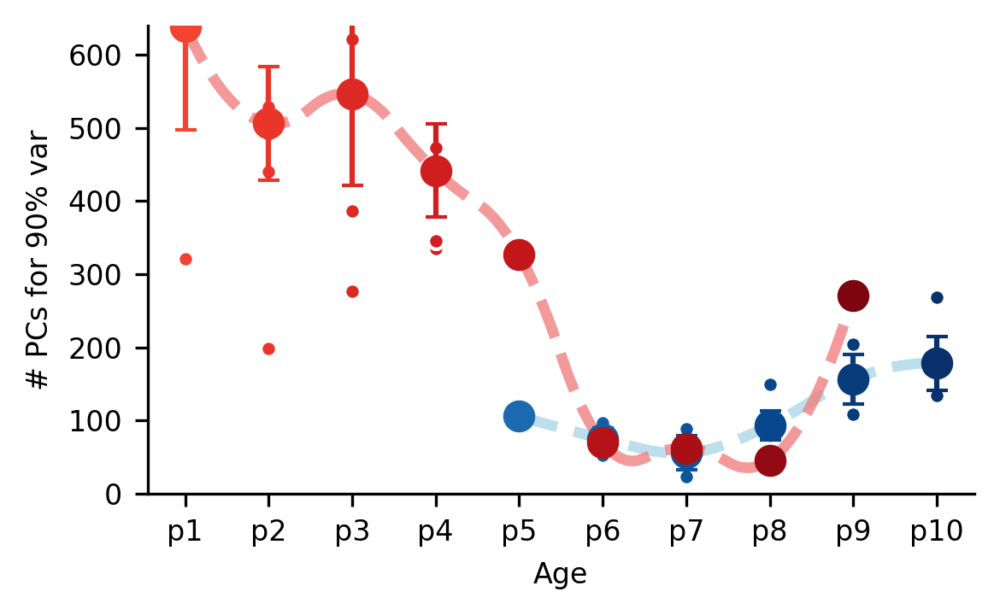

In [369]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from scipy.interpolate import make_interp_spline

# --- Example inputs ---
# unique_ages_sorted = sorted list of ages as strings, e.g., ['p0', 'p1', ...]
# group_age_dims = {'gaba': {age: [vals]}, 'dual imaging': {age: [vals]}}
# threshold = fraction of variance explained, e.g., 0.3

fig, ax = plt.subplots(figsize=(4,2.5), dpi=300)

x = np.arange(len(unique_ages_sorted))

# Age-related light colors
light_blues = [cm.Blues(0.6 + 0.4*i/max(1,len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]
light_reds = [cm.Reds(0.6 + 0.4*i/max(1,len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]

dual_means_arr = []
gaba_means_arr = []

for i, age in enumerate(unique_ages_sorted):
    # Dual Imaging
    dual_values = group_age_dims['dual imaging'].get(age, [])
    if dual_values:
        mean_dual = np.mean(dual_values)
        sem_dual = np.std(dual_values)/np.sqrt(len(dual_values))
        ax.errorbar(i, mean_dual, yerr=sem_dual, fmt='o', 
                    color=light_blues[i], capsize=3, markersize=8, zorder=4)
        # Scatter individual points
        ax.scatter(np.full(len(dual_values), i), dual_values, color=light_blues[i],
                   edgecolor='white', s=20, zorder=2)
        dual_means_arr.append(mean_dual)
    else:
        dual_means_arr.append(np.nan)
    
    # GABA
    gaba_values = group_age_dims['gaba'].get(age, [])
    if gaba_values:
        mean_gaba = np.mean(gaba_values)
        sem_gaba = np.std(gaba_values)/np.sqrt(len(gaba_values))
        ax.errorbar(i, mean_gaba, yerr=sem_gaba, fmt='o', 
                    color=light_reds[i], capsize=3, markersize=8, zorder=4)
        # Scatter individual points
        ax.scatter(np.full(len(gaba_values), i), gaba_values, color=light_reds[i],
                   edgecolor='white', s=20, zorder=2)
        gaba_means_arr.append(mean_gaba)
    else:
        gaba_means_arr.append(np.nan)

# Smooth line for Dual Imaging
dual_means_arr = np.array(dual_means_arr)
mask = ~np.isnan(dual_means_arr)
if mask.sum() > 2:
    spline = make_interp_spline(x[mask], dual_means_arr[mask], k=2)
    xsmooth = np.linspace(x[mask].min(), x[mask].max(), 150)
    ysmooth = spline(xsmooth)
    ax.plot(xsmooth, ysmooth, color='lightblue', linestyle='--', linewidth=3, alpha=0.8, zorder=3)

# Smooth line for GABA
gaba_means_arr = np.array(gaba_means_arr)
mask = ~np.isnan(gaba_means_arr)
if mask.sum() > 2:
    spline = make_interp_spline(x[mask], gaba_means_arr[mask], k=2)
    xsmooth = np.linspace(x[mask].min(), x[mask].max(), 150)
    ysmooth = spline(xsmooth)
    ax.plot(xsmooth, ysmooth, color='lightcoral', linestyle='--', linewidth=3, alpha=0.8, zorder=3)

# --- Axis formatting ---
ax.set_xticks(x)
ax.set_xticklabels(unique_ages_sorted, fontsize=8)
ax.set_xlabel("Age", fontsize=8)
ax.set_ylabel(f"# PCs for {threshold*100:.0f}% var", fontsize=8)
ax.set_ylim(0, max(np.nanmax(dual_means_arr), np.nanmax(gaba_means_arr)) + 1)

# Minimal style
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.tick_params(axis='both', which='major', labelsize=8)

plt.tight_layout()
plt.show()


NameError: name 'all_age_values' is not defined

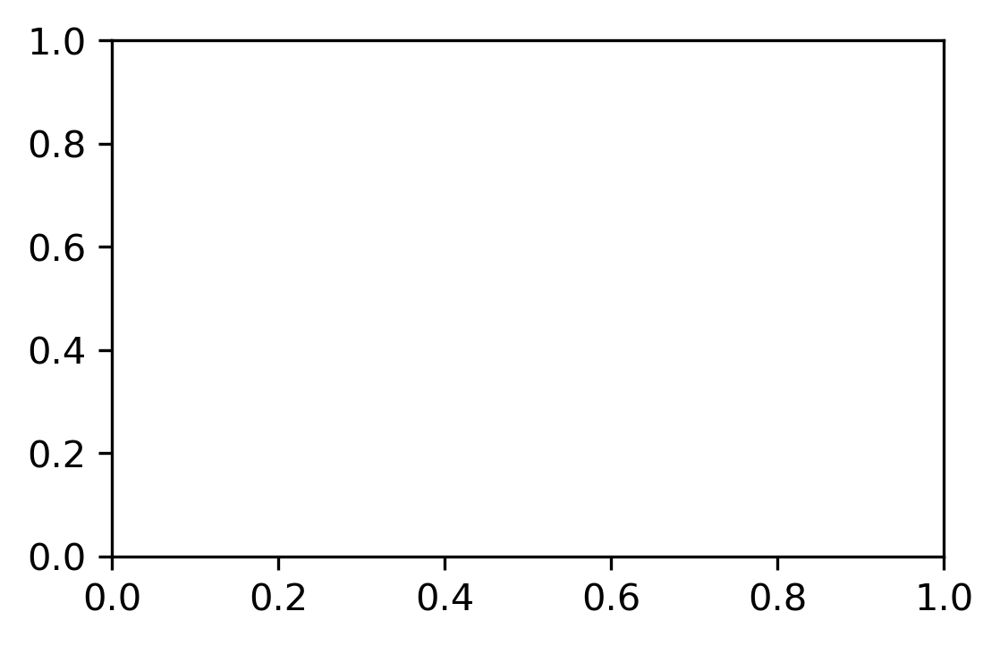

In [371]:
fig, ax = plt.subplots(figsize=(4,2.5), dpi=300)

x = np.arange(len(unique_ages_sorted))

# Age-related colors
age_colors = [cm.Blues(0.6 + 0.4*i/max(1,len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]

mean_arr = []

for i, age in enumerate(unique_ages_sorted):
    vals = all_age_values.get(age, [])
    if vals:
        vals = np.array(vals)
        mean_val = np.mean(vals)
        sem_val = np.std(vals)/np.sqrt(len(vals))
        mean_arr.append(mean_val)

        # Scatter individual points
        ax.scatter(np.full(len(vals), i), vals, color=age_colors[i], edgecolor='white', s=20, zorder=2)
        # Mean ± SEM
        ax.errorbar(i, mean_val, yerr=sem_val, fmt='o', color='black', capsize=3, markersize=8, zorder=4)
    else:
        mean_arr.append(np.nan)

# Smooth line connecting means
mean_arr = np.array(mean_arr)
mask = ~np.isnan(mean_arr)
if mask.sum() > 2:
    spline = make_interp_spline(x[mask], mean_arr[mask], k=2)
    xsmooth = np.linspace(x[mask].min(), x[mask].max(), 150)
    ysmooth = spline(xsmooth)
    ax.plot(xsmooth, ysmooth, color='dodgerblue', linestyle='--', linewidth=3, alpha=0.8, zorder=3)

# --- Axis formatting ---
ax.set_xticks(x)
ax.set_xticklabels(unique_ages_sorted, fontsize=8)
ax.set_xlabel("Age", fontsize=8)
ax.set_ylabel(f"# PCs for {threshold*100:.0f}% var", fontsize=8)
ax.set_ylim(0, np.nanmax(mean_arr) + 1)

# Minimal style
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.tick_params(axis='both', which='major', labelsize=8)

plt.tight_layout()
plt.show()

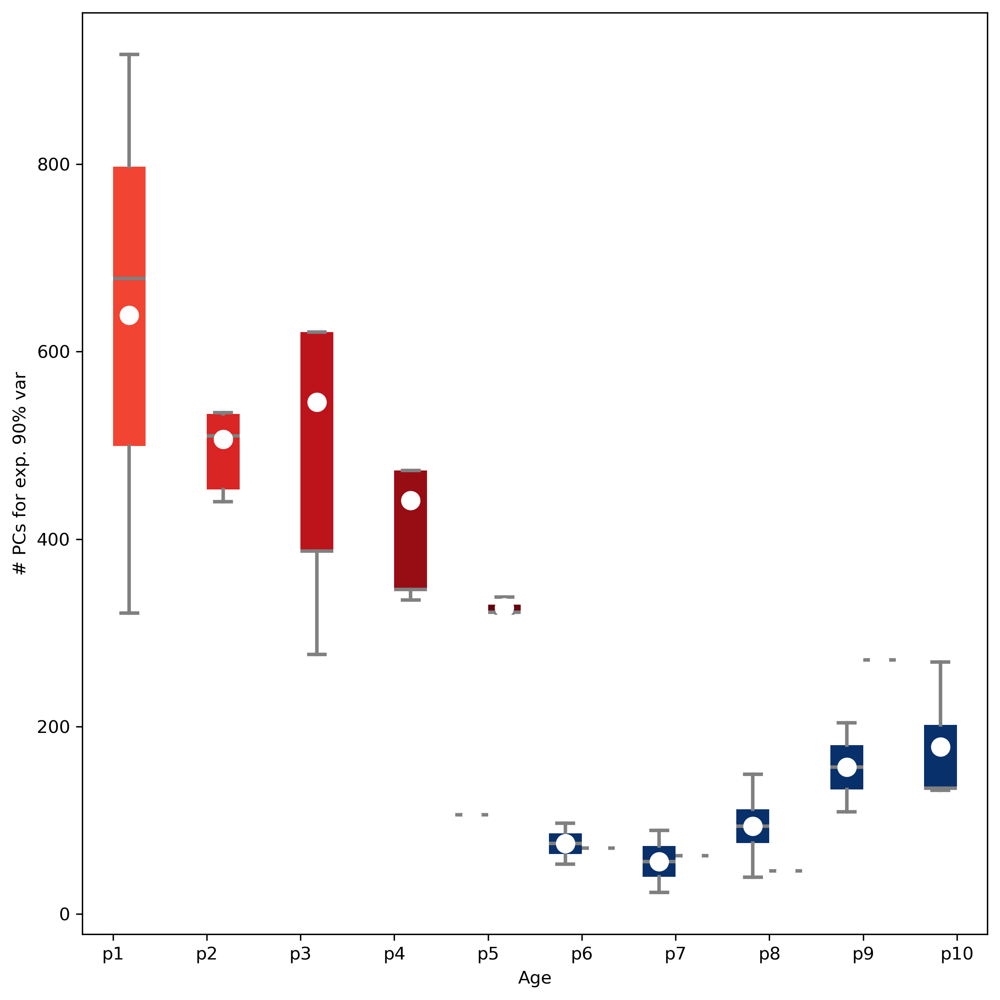

In [359]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

fig, axes = plt.subplots(1, 1, figsize=(8,8), dpi=300)

x = np.arange(len(unique_ages_sorted))
width = 0.35  # half-width offset for group separation

# Age-related light colors
light_blues = [cm.Blues(0.6 + 0.9*i/max(1,len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]
light_reds = [cm.Reds(0.6 + 0.9*i/max(1,len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]

ax = axes

for i, age in enumerate(unique_ages_sorted):
    # Dual Imaging
    dual_data = group_age_dims['dual imaging'].get(age, [])
    if dual_data:
        bp = ax.boxplot(dual_data, positions=[i - width/2], widths=width,
                        patch_artist=True, showfliers=False,
                        boxprops=dict(facecolor=light_blues[i], color='none'),
                        whiskerprops=dict(color='grey', linewidth=2),
                        capprops=dict(color='grey', linewidth=2),
                        medianprops=dict(color='grey', linewidth=2),
                        meanline=False, showmeans=True,
                        meanprops=dict(marker='o', markerfacecolor='white', markeredgecolor='white', markersize=10))
    
    # GABA
    gaba_data = group_age_dims['gaba'].get(age, [])
    if gaba_data:
        bp = ax.boxplot(gaba_data, positions=[i + width/2], widths=width,
                        patch_artist=True, showfliers=False,
                        boxprops=dict(facecolor=light_reds[i], color='none'),
                        whiskerprops=dict(color='grey', linewidth=2),
                        capprops=dict(color='grey', linewidth=2),
                        medianprops=dict(color='grey', linewidth=2),
                        meanline=False, showmeans=True,
                        meanprops=dict(marker='o', markerfacecolor='white', markeredgecolor='white', markersize=10))

ax.set_xticks(range(len(unique_ages_sorted)))
ax.set_xticklabels(unique_ages_sorted)
ax.set_xlabel("Age")
ax.set_ylabel(f"# PCs for exp. {threshold*100:.0f}% var")
plt.tight_layout()
plt.show()


# behavior coupling 

ValueError: The palette dictionary is missing keys: {'EMX'}

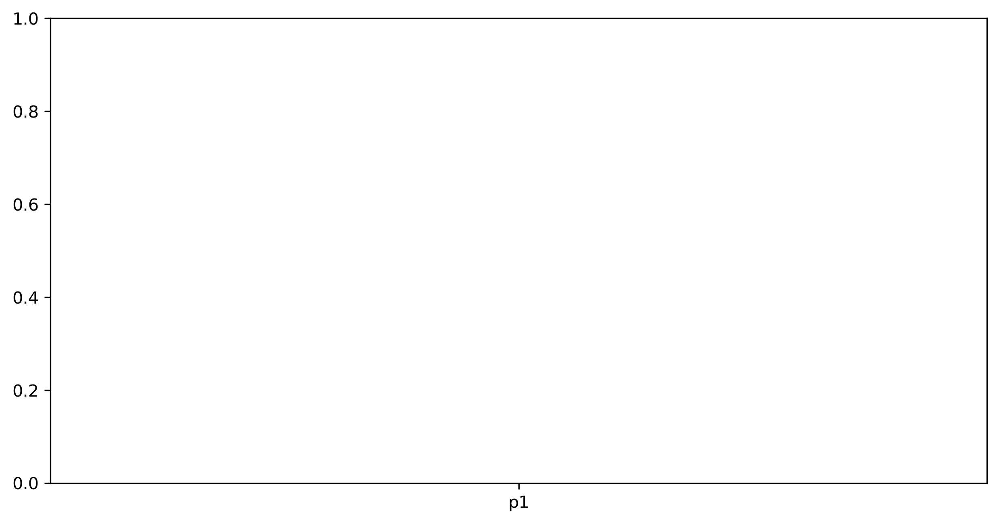

In [360]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Copy DataFrame and drop missing
combined_df = all_plot_df.copy()
combined_df = combined_df.dropna(subset=['behavior_coupling'])

# Expand arrays into long format
long_df = []
for _, row in combined_df.iterrows():
    values = row['behavior_coupling']
    if values is None or (isinstance(values, float) and pd.isna(values)):
        continue
    for v in np.atleast_1d(values):  # ensure iterable
        long_df.append({
            'age': row['age'],
            'group': row['group'],
            'behavior_coupling': v
        })

long_df = pd.DataFrame(long_df)

# Define palette
palette = {
    'GABA': 'orange',
    'Dual Imaging': 'steelblue'
}

plt.figure(figsize=(10, 5), dpi=300)

# Violin plot per age & group
sns.violinplot(
    x='age', y='behavior_coupling', data=long_df, hue='group',
    palette=palette,
    cut=0,        # don’t extend beyond data
    inner=None,   # no quartiles inside
    linewidth=0.7,
    scale='width'
)

# Overlay mean values
sns.pointplot(
    x='age', y='behavior_coupling', data=long_df, hue='group',
    dodge=0.4,     # shift points so groups don't overlap
    join=False,    # don't connect across ages
    markers='o',
    ci='sd',       # show mean ± SD (use 'se' for SEM)
    color='black',
    errwidth=1.2,
    capsize=0.2
)

plt.title('behavioral corr - age ', fontsize=16, y=1.05)
plt.ylabel('behavioral coupling', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.axhline(y=0, linestyle='--', color='grey', lw=0.5)
plt.xticks(rotation=45, fontsize=11)

# Fix legend duplication
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), title='Group')

plt.tight_layout()
plt.show()


KeyError: 'f1_class1'

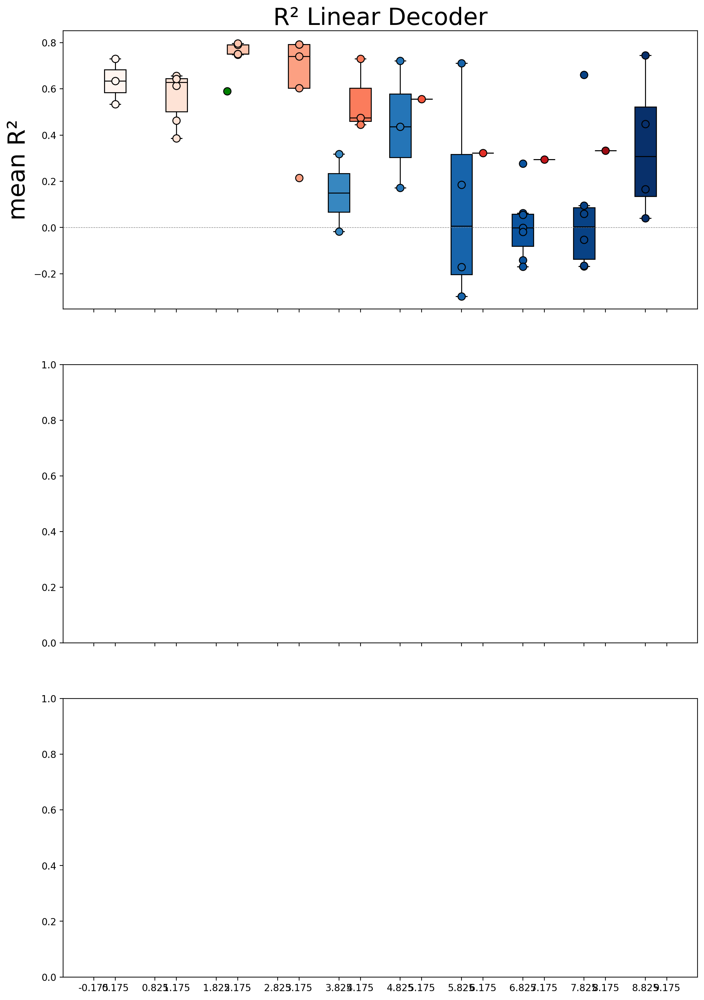

In [361]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from matplotlib.patches import Patch
import re

# --- Prepare colors ---
reds = [plt.cm.Reds(i / max(1, len(unique_ages)-1)) for i in range(len(unique_ages))]
blues_light = [plt.cm.Blues(0.4 + 0.6*i/max(1,len(unique_ages)-1)) for i in range(len(unique_ages))]  # lighter blues
green_color = 'green'

# Boxplot parameters
width = 0.35
offset = width / 2

# --- Prepare dimensionality data ---
unique_ages_sorted = sorted(unique_ages, key=lambda x: int(re.search(r'\d+', x).group(0)))
group_age_dims = {'dual imaging': {}, 'gaba': {}}
for _, age, var_exp, group in valid_rows:
    grp = group.lower()
    if grp in group_age_dims:
        if age not in group_age_dims[grp]:
            group_age_dims[grp][age] = []
        cum_var = np.cumsum(var_exp) / np.sum(var_exp)
        n_pcs_thresh = np.argmax(cum_var >= 0.90) + 1
        group_age_dims[grp][age].append(n_pcs_thresh)

# --- Create figure with 3 vertical subplots ---
fig, axs = plt.subplots(3, 1, figsize=(12,18), dpi=200, sharex=True)

# --- Subplot 1: Linear decoder R² ---
ax = axs[0]
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['r2_linear']
    ax.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
               boxprops=dict(facecolor=blues_light[i], color='black'),
               medianprops=dict(color='black'))
    ax.scatter(np.full(len(dual_data), i - offset), dual_data,
               color=blues_light[i], edgecolor='black', s=60, zorder=3)
    
    gaba_data = age_data[age_data['group'] == 'GABA']['r2_linear']
    ax.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
               boxprops=dict(facecolor=reds[i], color='black'),
               medianprops=dict(color='black'))
    ax.scatter(np.full(len(gaba_data), i + offset), gaba_data,
               color=reds[i], edgecolor='black', s=60, zorder=3)
    
    emx_data = age_data[age_data['group'] == 'EMX']['r2_linear']
    ax.scatter(np.full(len(emx_data), i), emx_data, color=green_color,
               edgecolor='black', s=60, zorder=3, label='EMX' if i==0 else "")

ax.set_ylabel('mean R²', fontsize=25)
ax.set_title('R² Linear Decoder', fontsize=25)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)

# --- Subplot 2: Logistic decoder F1 ---
ax = axs[1]
for i, age in enumerate(unique_ages):
    age_data = combined_df[combined_df['age'] == age]
    
    dual_data = age_data[age_data['group'] == 'Dual Imaging']['f1_class1']
    ax.boxplot(dual_data, positions=[i - offset], widths=width, patch_artist=True,
               boxprops=dict(facecolor=blues_light[i], color='black'),
               medianprops=dict(color='black'))
    ax.scatter(np.full(len(dual_data), i - offset), dual_data,
               color=blues_light[i], edgecolor='black', s=60, zorder=3)
    
    gaba_data = age_data[age_data['group'] == 'GABA']['f1_class1']
    ax.boxplot(gaba_data, positions=[i + offset], widths=width, patch_artist=True,
               boxprops=dict(facecolor=reds[i], color='black'),
               medianprops=dict(color='black'))
    ax.scatter(np.full(len(gaba_data), i + offset), gaba_data,
               color=reds[i], edgecolor='black', s=60, zorder=3)
    
    emx_data = age_data[age_data['group'] == 'EMX']['f1_class1']
    ax.scatter(np.full(len(emx_data), i), emx_data, color=green_color,
               edgecolor='black', s=60, zorder=3)

ax.set_ylabel('F1 Score', fontsize=25)
ax.set_title('F1 Logistic Decoder', fontsize=25)
ax.axhline(0, linestyle='--', color='grey', lw=0.5)

# --- Subplot 3: Dimensionality ---
ax = axs[2]
bar_width = 0.35
x = np.arange(len(unique_ages_sorted))

dual_means = [np.mean(group_age_dims['dual imaging'].get(age, [0])) for age in unique_ages_sorted]
dual_sems = [np.std(group_age_dims['dual imaging'].get(age, [0]))/np.sqrt(len(group_age_dims['dual imaging'].get(age, [1]))) for age in unique_ages_sorted]
gaba_means = [np.mean(group_age_dims['gaba'].get(age, [0])) for age in unique_ages_sorted]
gaba_sems = [np.std(group_age_dims['gaba'].get(age, [0]))/np.sqrt(len(group_age_dims['gaba'].get(age, [1]))) for age in unique_ages_sorted]

ax.bar(x - bar_width/2, dual_means, yerr=dual_sems, width=bar_width, ecolor='white', color=blues_light, capsize=5, label='E/I dual')
ax.bar(x + bar_width/2, gaba_means, yerr=gaba_sems, width=bar_width, color=reds, ecolor='white', capsize=5, label='I')

ax.set_xticks(x)
ax.set_xticklabels(unique_ages_sorted, rotation=45, fontsize=25)
ax.set_xlabel("age", fontsize=25)
ax.set_ylabel(f"# PCs exp. 90% var", fontsize=25)
ax.set_title("Dimensionality", fontsize=25)
ax.legend(fontsize=20)

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import re

# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

threshold = 0.90  # variance explained threshold

# Organize sessions by group and age
group_age_dims = {'dual imaging': {}, 'gaba': {}}
for _, age, var_exp, group in valid_rows:
    grp = group.lower()
    if grp in group_age_dims:
        if age not in group_age_dims[grp]:
            group_age_dims[grp][age] = []
        cum_var = np.cumsum(var_exp) / np.sum(var_exp)  # normalize
        n_pcs_thresh = np.argmax(cum_var >= threshold) + 1
        group_age_dims[grp][age].append(n_pcs_thresh)

# Prepare mean and SEM per age
unique_ages_sorted = sorted(unique_ages, key=extract_age_num)
blues = [cm.Blues(i / max(1, len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]
reds = [cm.Reds(i / max(1, len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]

# Plot small barplots
bar_width = 0.35
x = np.arange(len(unique_ages_sorted))

fig, ax = plt.subplots(figsize=(8,5), dpi=300)

# Dual Imaging bars (blue)
dual_means = [np.mean(group_age_dims['dual imaging'].get(age, [0])) for age in unique_ages_sorted]
dual_sems = [np.std(group_age_dims['dual imaging'].get(age, [0]))/np.sqrt(len(group_age_dims['dual imaging'].get(age, [1]))) for age in unique_ages_sorted]
for i in range(len(unique_ages_sorted)):
    ax.bar(x[i] - bar_width/2, dual_means[i], yerr=dual_sems[i], width=bar_width, 
           color=blues[i], ecolor=blues[i], capsize=5)

# GABA bars (red)
gaba_means = [np.mean(group_age_dims['gaba'].get(age, [0])) for age in unique_ages_sorted]
gaba_sems = [np.std(group_age_dims['gaba'].get(age, [0]))/np.sqrt(len(group_age_dims['gaba'].get(age, [1]))) for age in unique_ages_sorted]
for i in range(len(unique_ages_sorted)):
    ax.bar(x[i] + bar_width/2, gaba_means[i], yerr=gaba_sems[i], width=bar_width, 
           color=reds[i], ecolor=reds[i], capsize=5)

# Axis labels
ax.set_xticks(x)
ax.set_xticklabels(unique_ages_sorted, fontsize=14)
ax.set_xlabel("age", fontsize=25)
ax.set_ylabel(f"# PCs for exp.{threshold*100:.0f}% var ", fontsize=25)
ax.set_title("Dimensionality", fontsize=25, y=1.02)

# Legend
from matplotlib.patches import Patch
legend_handles = [Patch(color=blues[len(blues)//2], label='E/I dual'),
                  Patch(color=reds[len(reds)//2], label='I')]
ax.legend(handles=legend_handles, fontsize=20, frameon=False)

plt.tight_layout()
plt.show()


In [362]:
# import matplotlib.pyplot as plt
# import matplotlib.cm as cm
# import numpy as np
# import re

# # Helper: extract numeric part of age
# def extract_age_num(label):
#     match = re.search(r'\d+', str(label))
#     return int(match.group(0)) if match else -1

# threshold = 0.90  # cumulative variance threshold

# # Organize sessions by group and age
# group_age_dims = {'dual imaging': {}, 'gaba': {}}
# for _, age, var_exp, group in valid_rows:
#     grp = group.lower()
#     if grp in group_age_dims:
#         if age not in group_age_dims[grp]:
#             group_age_dims[grp][age] = []
#         var_exp = np.array(var_exp)
#         if var_exp.sum() == 0:
#             continue  # skip empty datasets
#         # Normalize by total variance
#         norm_var_exp = var_exp / var_exp.sum()
#         cum_var = np.cumsum(norm_var_exp)
#         # Find number of PCs to reach threshold
#         n_pcs_thresh = np.argmax(cum_var >= threshold) + 1
#         group_age_dims[grp][age].append(n_pcs_thresh)

# # Prepare colors
# unique_ages_sorted = sorted(unique_ages, key=extract_age_num)
# blues = [cm.Blues(i / max(1, len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]
# oranges = [cm.Oranges(i / max(1, len(unique_ages_sorted)-1)) for i in range(len(unique_ages_sorted))]

# # Plot mean number of PCs per age
# plt.figure(figsize=(6,5), dpi=300)

# for i, age in enumerate(unique_ages_sorted):
#     # Dual Imaging
#     dual_values = group_age_dims['dual imaging'].get(age, [])
#     if dual_values:
#         mean_dual = np.mean(dual_values)
#         sem_dual = np.std(dual_values)/np.sqrt(len(dual_values))
#         plt.errorbar(i - 0.05, mean_dual, yerr=sem_dual, fmt='o',
#                      color=blues[i], label=f'{age} Dual' if i==0 else None, capsize=3)
    
#     # GABA
#     gaba_values = group_age_dims['gaba'].get(age, [])
#     if gaba_values:
#         mean_gaba = np.mean(gaba_values)
#         sem_gaba = np.std(gaba_values)/np.sqrt(len(gaba_values))
#         plt.errorbar(i + 0.05, mean_gaba, yerr=sem_gaba, fmt='o',
#                      color=oranges[i], label=f'{age} GABA' if i==0 else None, capsize=3)

# plt.xticks(range(len(unique_ages_sorted)), unique_ages_sorted)
# plt.xlabel("Age")
# plt.ylabel(f"# PCs to reach {threshold*100:.0f}% cumulative variance")
# plt.title("Dimensionality per age (normalized, mean ± SEM)")
# plt.legend(fontsize=8)



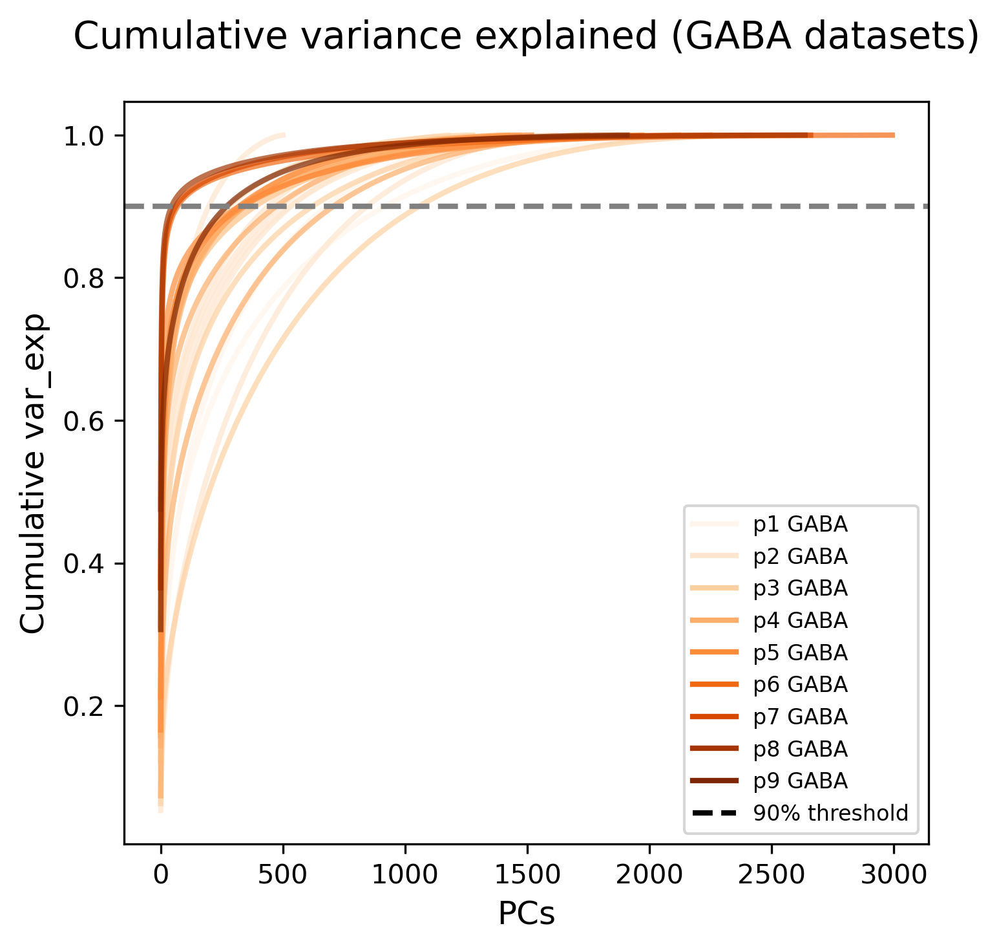

In [363]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import re

# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

# Collect only GABA datasets with valid var_exp_time
gaba_rows = []
for idx, row in combined_df.iterrows():
    var_exp_cell = row.get('var_exp_time', None)
    group = row.get('group', '')
    if var_exp_cell is not None and group.lower() == 'gaba':
        age_val = str(row.get('age', ''))
        age_label = f'p{age_val}' if not age_val.lower().startswith('p') else age_val
        gaba_rows.append((row['session'], age_label, var_exp_cell))

# Sort by numeric age
gaba_rows = sorted(gaba_rows, key=lambda x: extract_age_num(x[1]))
unique_ages = sorted(set(age for _, age, _ in gaba_rows), key=extract_age_num)
num_ages = len(unique_ages)

# Assign age-colormap (Oranges)
oranges = [cm.Oranges(i / max(1, num_ages-1)) for i in range(num_ages)]
age2orange = dict(zip(unique_ages, oranges))

# Plot cumulative variance curves
plt.figure(figsize=(5,5), dpi=300)
threshold = 0.90

for session, age, var_exp in gaba_rows:
    cum_var = np.cumsum(var_exp) / np.sum(var_exp)  # normalize
    plt.plot(cum_var, color=age2orange[age], lw=2, alpha=0.7)

# Reference line
plt.axhline(y=threshold, color='grey', linestyle='--', lw=2, label=f'{threshold*100:.0f}% threshold')

plt.title("Cumulative variance explained (GABA datasets)", fontsize=14, y=1.05)
plt.xlabel("PCs", fontsize=12)
plt.ylabel("Cumulative var_exp", fontsize=12)

# Legend: one entry per age
handles, labels = [], []
for age in unique_ages:
    handles.append(plt.Line2D([], [], color=age2orange[age], lw=2))
    labels.append(f'{age} GABA')

# Add threshold line
handles.append(plt.Line2D([], [], color='black', lw=2, linestyle='--'))
labels.append(f'{threshold*100:.0f}% threshold')

plt.legend(handles, labels, fontsize=8, loc='lower right')
plt.tight_layout()
plt.show()


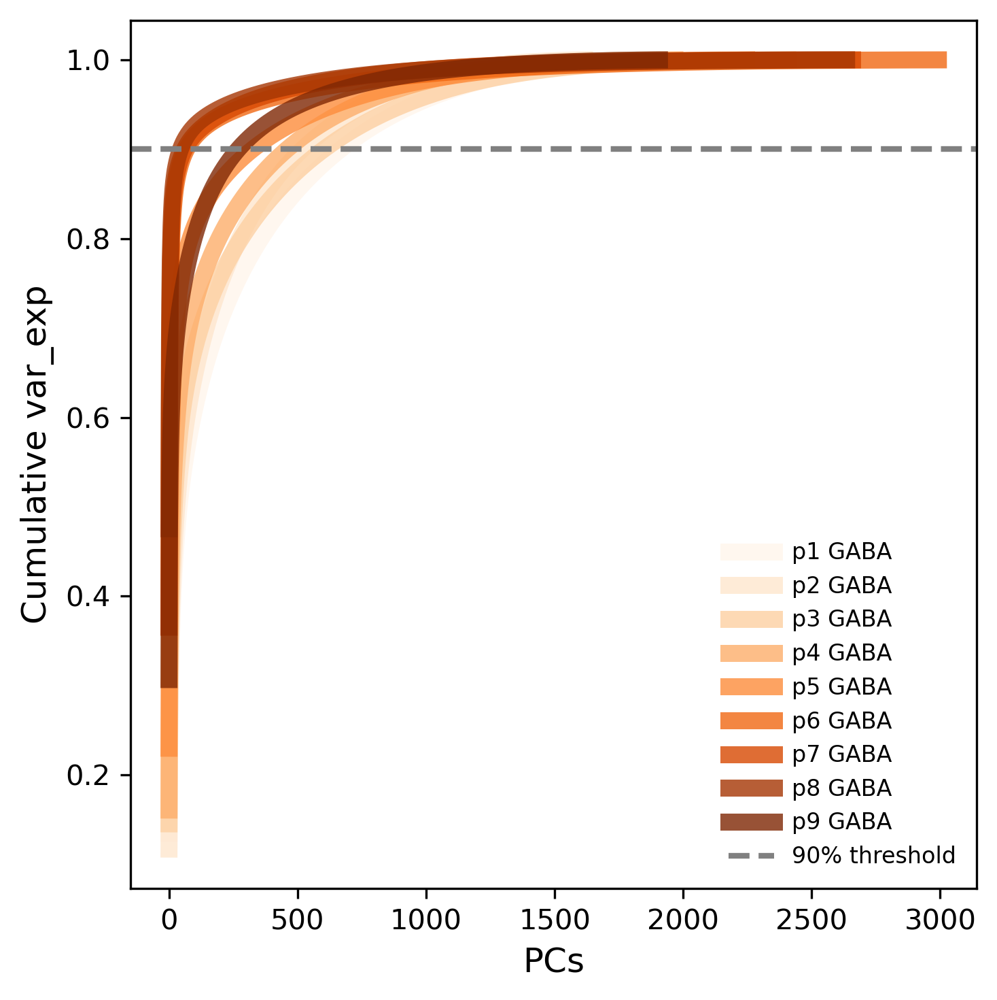

In [364]:
# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

# Collect only GABA datasets with valid var_exp_time
gaba_rows = []
for idx, row in combined_df.iterrows():
    var_exp_cell = row.get('var_exp_time', None)
    group = row.get('group', '')
    if var_exp_cell is not None and group.lower() == 'gaba':
        age_val = str(row.get('age', ''))
        age_label = f'p{age_val}' if not age_val.lower().startswith('p') else age_val
        gaba_rows.append((row['session'], age_label, var_exp_cell))

# Sort by numeric age
gaba_rows = sorted(gaba_rows, key=lambda x: extract_age_num(x[1]))
unique_ages = sorted(set(age for _, age, _ in gaba_rows), key=extract_age_num)
num_ages = len(unique_ages)

# Assign age-colormap (Oranges)
oranges = [cm.Oranges(i / max(1, num_ages-1)) for i in range(num_ages)]
age2orange = dict(zip(unique_ages, oranges))

# Organize sessions by age
age_data = {age: [] for age in unique_ages}
for _, age, var_exp in gaba_rows:
    cum_var = np.cumsum(var_exp) / np.sum(var_exp)  # normalize
    age_data[age].append(cum_var)

# Plot mean cumulative variance curves per age
plt.figure(figsize=(5,5), dpi=300)
threshold = 0.90

for age in unique_ages:
    if age_data[age]:
        # Make all curves same length by padding with last value if needed
        max_len = max(len(c) for c in age_data[age])
        padded_curves = [np.pad(c, (0, max_len - len(c)), mode='edge') for c in age_data[age]]
        mean_curve = np.mean(padded_curves, axis=0)
        plt.plot(mean_curve, color=age2orange[age], lw=6, alpha=0.8, label=f'{age} GABA')

# Reference line
plt.axhline(y=threshold, color='grey', linestyle='--', lw=2, label=f'{threshold*100:.0f}% threshold')

# plt.title("Mean cumulative variance explained per age (GABA datasets)", fontsize=14, y=1.05)
plt.xlabel("PCs", fontsize=12)
plt.ylabel("Cumulative var_exp", fontsize=12)
plt.legend(fontsize=8, loc='lower right', frameon=False)
plt.tight_layout()
plt.show()

In [373]:
# Define age groups (lowercase to match age_data keys)
age_groups = {
    "P1-P2": ["p1", "p2"],
    "P3-P5": ["p3", "p4", "p5"],
    "P6-P8": ["p6", "p7", "p8"],
    "P9-P10": ["p9", "p10"]
}

# Assign colors
colors = [cm.Oranges(0.3), cm.Oranges(0.5), cm.Oranges(0.7), cm.Oranges(0.9)]

# Organize data per age group
grouped_data = {grp: [] for grp in age_groups.keys()}

for age in unique_ages:
    age_lower = age.lower()  # lowercase for matching
    # Find which group this age belongs to
    for grp_name, ages_in_group in age_groups.items():
        if age_lower in ages_in_group:
            grouped_data[grp_name].extend(age_data[age])  # combine sessions in the group

# Plot
plt.figure(figsize=(5,5), dpi=300)
threshold = 0.90

for grp_idx, (grp_name, curves) in enumerate(grouped_data.items()):
    if curves:
        # Pad curves to same length
        max_len = max(len(c) for c in curves)
        padded_curves = [np.pad(c, (0, max_len - len(c)), mode='edge') for c in curves]
        mean_curve = np.mean(padded_curves, axis=0)
        # Optionally compute SEM
        sem_curve = np.std(padded_curves, axis=0) / np.sqrt(len(padded_curves))
        plt.plot(mean_curve, color=colors[grp_idx], lw=6, alpha=0.8, label=grp_name)
        plt.fill_between(np.arange(len(mean_curve)), mean_curve - sem_curve, mean_curve + sem_curve,
                         color=colors[grp_idx], alpha=0.2)

# Reference line for threshold
plt.axhline(y=threshold, color='grey', linestyle='--', lw=2, label=f'{threshold*100:.0f}% threshold')

plt.xlabel("PC index", fontsize=12)
plt.ylabel("Cumulative variance explained", fontsize=12)
plt.legend(fontsize=10, frameon=False, loc="lower right")
plt.xlim(0,800)
plt.tight_layout()
plt.show()

KeyError: 'p10'

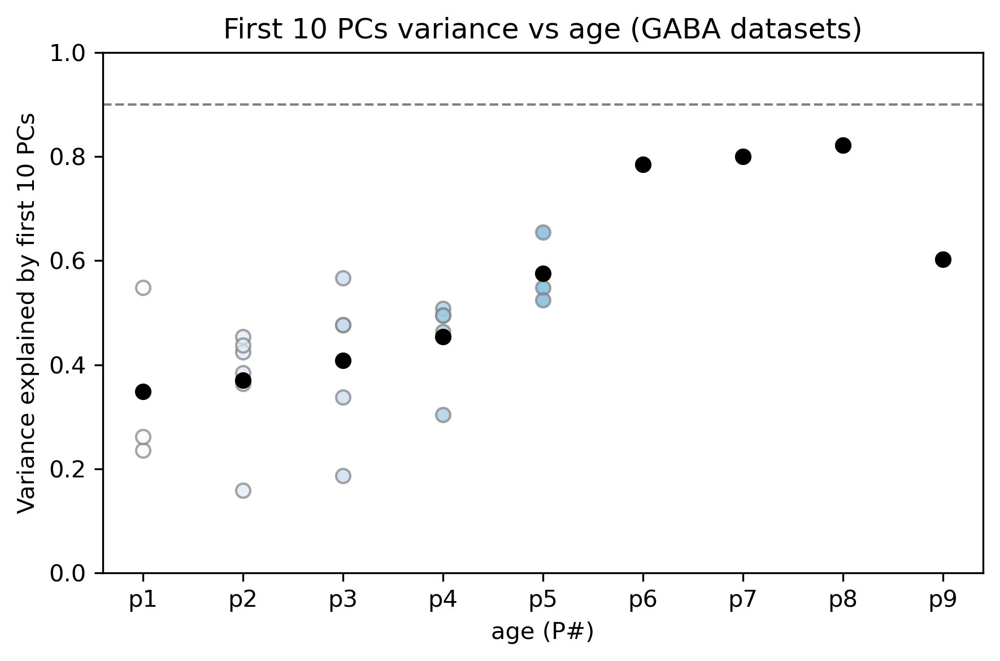

In [374]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import re

# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

# Collect GABA sessions
gaba_rows = []
for idx, row in combined_df.iterrows():
    var_exp_cell = row.get('var_exp_time', None)
    group = row.get('group', '')
    if var_exp_cell is not None and group.lower() == 'gaba':
        age_val = str(row.get('age', ''))
        age_label = f'p{age_val.lower().lstrip("p")}'
        gaba_rows.append((row['session'], age_label, var_exp_cell))

# Sort and get unique ages
unique_ages = sorted(set(age for _, age, _ in gaba_rows), key=extract_age_num)
num_ages = len(unique_ages)

# Age color palette
colors = [cm.Blues(i / max(1, num_ages-1)) for i in range(num_ages)]
age2color = dict(zip(unique_ages, colors))

# Collect variance explained by first 10 PCs per age
age_var10 = {age: [] for age in unique_ages}

for _, age, var_exp in gaba_rows:
    var10 = np.sum(var_exp[:10])  # sum first 10 PCs
    age_var10[age].append(var10)

# Plot
plt.figure(figsize=(6,4), dpi=300)

for age in unique_ages:
    vals = age_var10[age]
    x = np.full(len(vals), extract_age_num(age))  # numeric age for x-axis
    plt.scatter(x, vals, color=age2color[age], edgecolor='grey', alpha=0.7, label=age if len(vals)>0 else "")
    if vals:
        mean_val = np.mean(vals)
        plt.plot(extract_age_num(age), mean_val, 'o', color='black')  # mean point

plt.xlabel("age (P#)")
plt.ylabel("Variance explained by first 10 PCs")
plt.title("First 10 PCs variance vs age (GABA datasets)")
plt.ylim(0,1)
plt.xticks([extract_age_num(a) for a in unique_ages], unique_ages)
plt.axhline(y=0.9, color='grey', linestyle='--', lw=1)  # optional reference
plt.tight_layout()
plt.show()


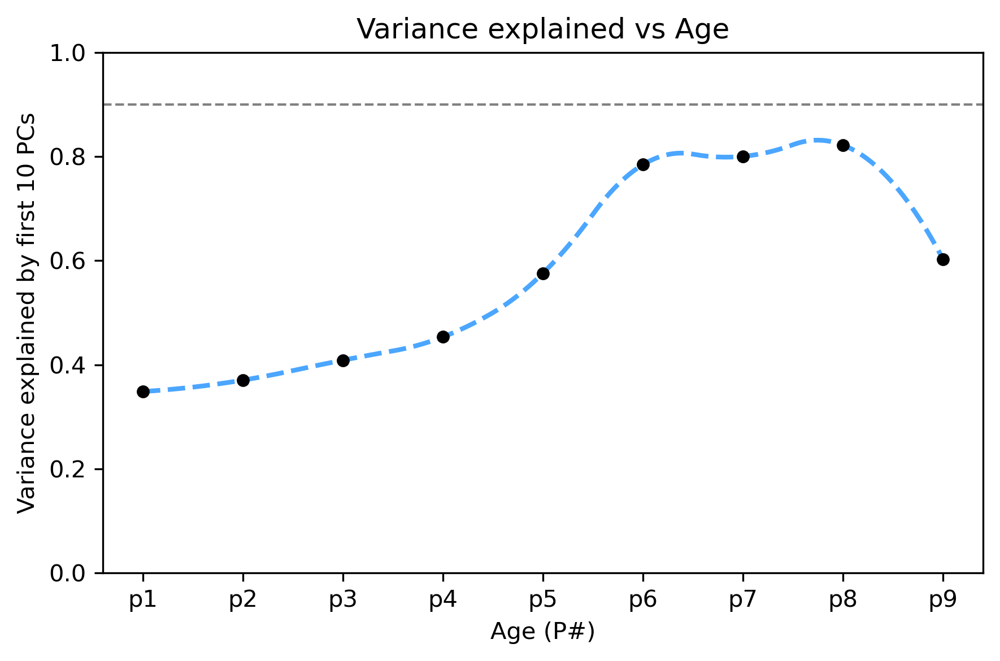

In [376]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from scipy.interpolate import make_interp_spline

# Numeric x-axis
x_vals = np.array([extract_age_num(age) for age in unique_ages])

# Compute mean variance for each age
mean_vals = np.array([np.mean(age_var10[age]) if age_var10[age] else np.nan for age in unique_ages])

# Remove NaNs for smoothing
mask = ~np.isnan(mean_vals)
x_clean = x_vals[mask]
y_clean = mean_vals[mask]

# Smooth line
if len(x_clean) > 2:
    spline = make_interp_spline(x_clean, y_clean, k=2)  # quadratic spline
    x_smooth = np.linspace(x_clean.min(), x_clean.max(), 200)
    y_smooth = spline(x_smooth)

plt.figure(figsize=(6,4), dpi=300)
plt.plot(x_smooth, y_smooth, color='dodgerblue', linestyle='--', linewidth=2, alpha=0.8, zorder=3)
plt.scatter(x_clean, y_clean, color='black', s=20, zorder=4)  # mean points

plt.xlabel("Age (P#)")
plt.ylabel("Variance explained by first 10 PCs")
plt.title("Variance explained vs Age")
plt.ylim(0, 1)
plt.xticks(x_vals, unique_ages)
plt.axhline(0.9, color='grey', linestyle='--', lw=1)
plt.tight_layout()
plt.show()


In [233]:
from matplotlib import rcParams

rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False

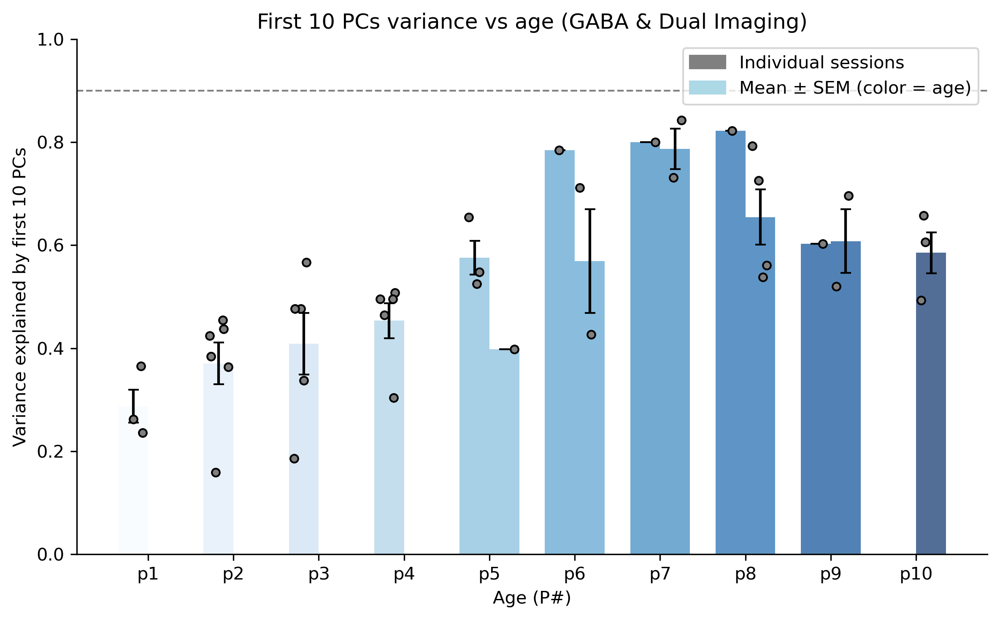

In [234]:

# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

# Collect sessions for GABA and Dual Imaging
rows = []
for idx, row in combined_df.iterrows():
    var_exp_cell = row.get('var_exp_time', None)
    group = row.get('group', '').lower()
    if var_exp_cell is not None and group in ['gaba', 'dual imaging']:
        age_val = str(row.get('age', ''))
        age_label = f'p{age_val.lower().lstrip("p")}'
        rows.append((row['session'], age_label, var_exp_cell, group))

# Unique ages and colors
unique_ages = sorted(set(age for _, age, _, _ in rows), key=extract_age_num)
num_ages = len(unique_ages)
colors = [cm.Blues(i / max(1, num_ages-1)) for i in range(num_ages)]
age2color = dict(zip(unique_ages, colors))

# Organize variance explained by first 10 PCs per group and age
age_group_var10 = {age: {'gaba': [], 'dual imaging': []} for age in unique_ages}

for _, age, var_exp, group in rows:
    var10 = np.sum(var_exp[:10])
    age_group_var10[age][group].append(var10)

# Plot bar plot with individual points
bar_width = 0.35
x = np.arange(num_ages)

fig, ax = plt.subplots(figsize=(8,5), dpi=300)

for i, age in enumerate(unique_ages):
    for j, group in enumerate(['gaba', 'dual imaging']):
        vals = age_group_var10[age][group]
        if vals:
            mean_val = np.mean(vals)
            sem_val = np.std(vals) / np.sqrt(len(vals))
            offset = -bar_width/2 if group=='gaba' else bar_width/2
            # Bar
            ax.bar(x[i]+offset, mean_val, yerr=sem_val, width=bar_width,
                   color=age2color[age], ecolor='black', capsize=3, alpha=0.7)
            # Overlay individual points
            jitter = (np.random.rand(len(vals)) - 0.5) * bar_width * 0.7
            ax.scatter(x[i]+offset+jitter, vals, color='grey', edgecolor='black', s=20, zorder=3)

# Axes formatting
ax.set_xticks(x)
ax.set_xticklabels(unique_ages)
ax.set_xlabel("Age (P#)")
ax.set_ylabel("Variance explained by first 10 PCs")
ax.set_title("First 10 PCs variance vs age (GABA & Dual Imaging)")
ax.axhline(y=0.9, color='grey', linestyle='--', lw=1)
ax.set_ylim(0,1)

# Legend
from matplotlib.patches import Patch
handles = [Patch(color='grey', label='Individual sessions'),
           Patch(color='lightblue', label='Mean ± SEM (color = age)')]
ax.legend(handles=handles)

plt.tight_layout()

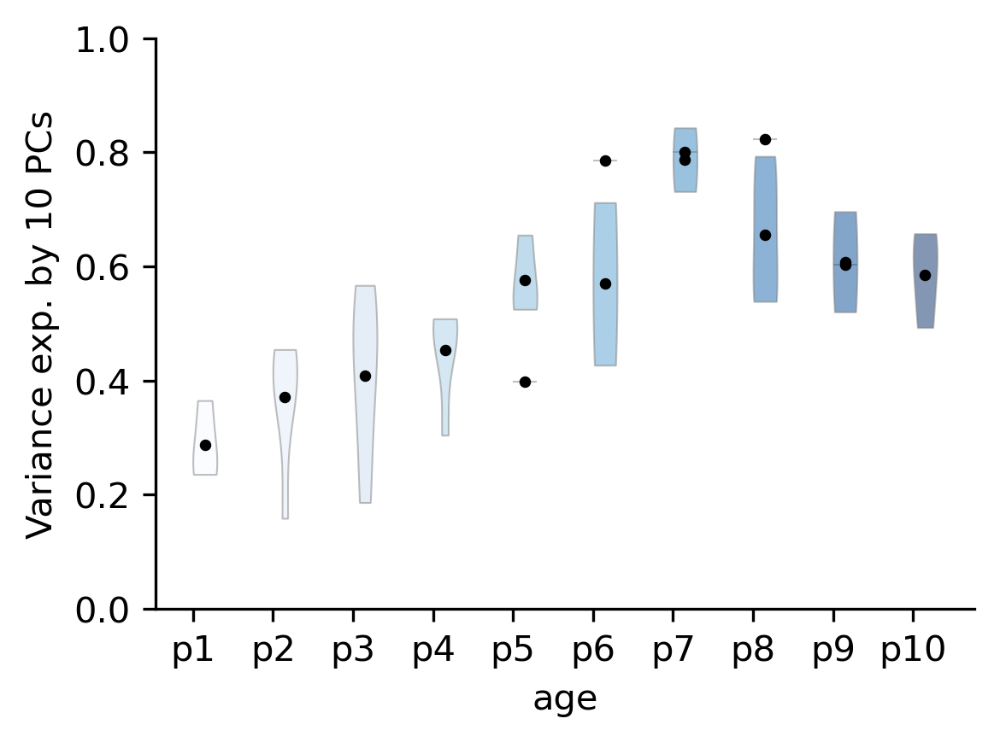

In [235]:
# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

# Collect sessions for GABA and Dual Imaging
rows = []
for idx, row in combined_df.iterrows():
    var_exp_cell = row.get('var_exp_time', None)
    group = row.get('group', '').lower()
    if var_exp_cell is not None and group in ['gaba', 'dual imaging']:
        age_val = str(row.get('age', ''))
        age_label = f'p{age_val.lower().lstrip("p")}'
        rows.append((row['session'], age_label, var_exp_cell, group))

# Unique ages and colors
unique_ages = sorted(set(age for _, age, _, _ in rows), key=extract_age_num)
num_ages = len(unique_ages)
colors = [cm.Blues(i / max(1, num_ages-1)) for i in range(num_ages)]
age2color = dict(zip(unique_ages, colors))

# Organize variance explained by first 10 PCs per group and age
age_group_var10 = {age: {'gaba': [], 'dual imaging': []} for age in unique_ages}
for _, age, var_exp, group in rows:
    var10 = np.sum(var_exp[:10])
    age_group_var10[age][group].append(var10)

# --- Violin plot ---
fig, ax = plt.subplots(figsize=(4,3), dpi=300)
width = 0.3
offset = 0.15

for i, age in enumerate(unique_ages):
    for j, group in enumerate(['gaba', 'dual imaging']):
        vals = age_group_var10[age][group]
        if vals:
            pos = i + offset
            parts = ax.violinplot([vals], positions=[pos], widths=width,
                                  showmeans=False, showextrema=False, showmedians=False)
            for pc in parts['bodies']:
                pc.set_facecolor(age2color[age])
                pc.set_edgecolor('grey')
                pc.set_alpha(0.5)
                pc.set_linewidth(0.5)
            # Add mean point
            mean_val = np.mean(vals)
            ax.scatter(pos, mean_val, color='black', s=5, zorder=3)

# Axes formatting
ax.set_xticks(range(num_ages))
ax.set_xticklabels(unique_ages)
ax.set_xlabel("age")
ax.set_ylabel("Variance exp. by 10 PCs")
# ax.set_title("First 10 PCs variance vs age (GABA & Dual Imaging)")
# ax.axhline(y=0.9, color='grey', linestyle='--', lw=1)
ax.set_ylim(0,1)

plt.tight_layout()
plt.show()

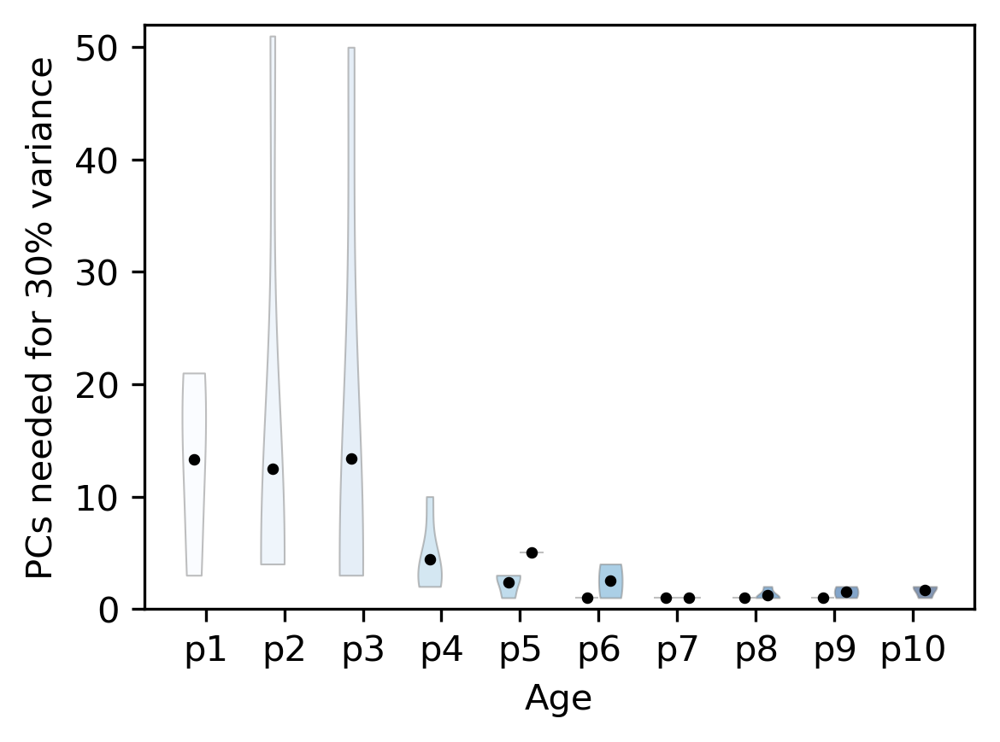

In [367]:
import numpy as np
import matplotlib.pyplot as plt
import re
from matplotlib import cm

# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

# Collect sessions for GABA and Dual Imaging
rows = []
for idx, row in combined_df.iterrows():
    var_exp_cell = row.get('var_exp_time', None)
    group = row.get('group', '').lower()
    if var_exp_cell is not None and group in ['gaba', 'dual imaging']:
        age_val = str(row.get('age', ''))
        age_label = f'p{age_val.lower().lstrip("p")}'
        rows.append((row['session'], age_label, var_exp_cell, group))

# Unique ages and colors
unique_ages = sorted(set(age for _, age, _, _ in rows), key=extract_age_num)
num_ages = len(unique_ages)
colors = [cm.Blues(i / max(1, num_ages-1)) for i in range(num_ages)]
age2color = dict(zip(unique_ages, colors))

# Compute number of PCs to explain >= 30% variance
age_group_npcs30 = {age: {'gaba': [], 'dual imaging': []} for age in unique_ages}

for _, age, var_exp, group in rows:
    var_exp = np.array(var_exp)
    cumvar = np.cumsum(var_exp)
    n_pcs = np.searchsorted(cumvar, 0.3) + 1  # +1 because searchsorted returns index
    age_group_npcs30[age][group].append(n_pcs)

# --- Violin plot ---
fig, ax = plt.subplots(figsize=(4,3), dpi=300)
width = 0.3
offset = 0.15

for i, age in enumerate(unique_ages):
    for j, group in enumerate(['gaba', 'dual imaging']):
        vals = age_group_npcs30[age][group]
        if vals:
            pos = i + (-offset if group == 'gaba' else offset)
            parts = ax.violinplot([vals], positions=[pos], widths=width,
                                  showmeans=False, showextrema=False, showmedians=False)
            for pc in parts['bodies']:
                pc.set_facecolor(age2color[age])
                pc.set_edgecolor('grey')
                pc.set_alpha(0.5)
                pc.set_linewidth(0.5)
            # Overlay mean
            mean_val = np.mean(vals)
            ax.scatter(pos, mean_val, color='black', s=5, zorder=3)

# Axes formatting
ax.set_xticks(range(num_ages))
ax.set_xticklabels(unique_ages)
ax.set_xlabel("Age")
ax.set_ylabel("PCs needed for 30% variance")
ax.set_ylim(0, max([max(vals) for age in unique_ages for vals in age_group_npcs30[age].values() if vals]) + 1)

plt.tight_layout()
plt.show()


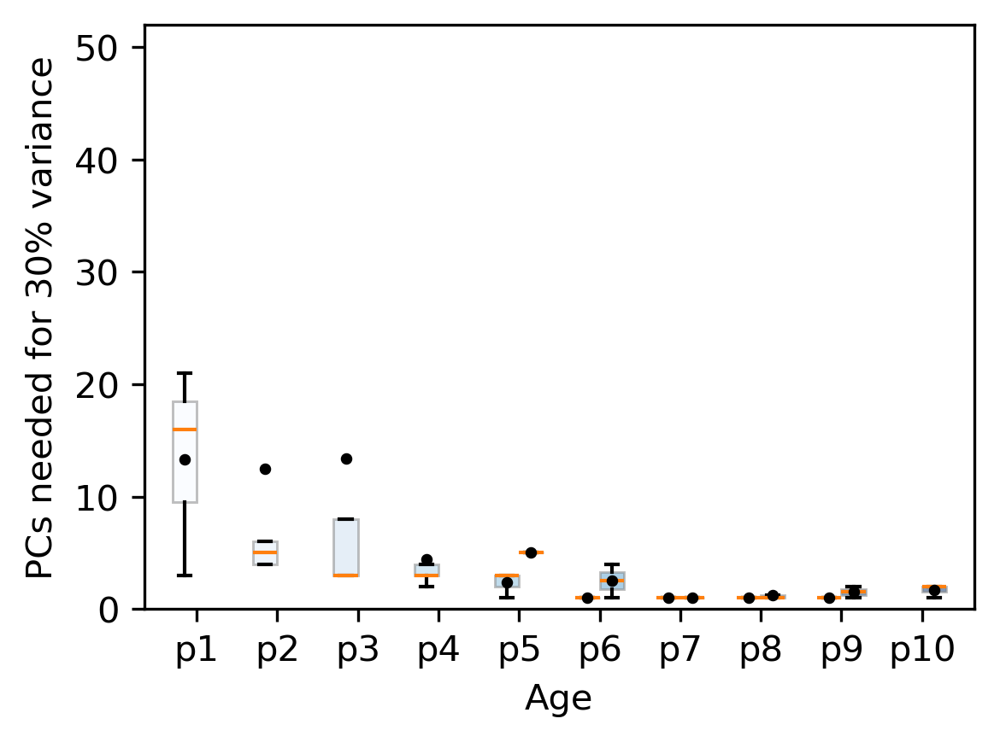

In [368]:
import numpy as np
import matplotlib.pyplot as plt
import re
from matplotlib import cm

# Helper: extract numeric part of age
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

# Collect sessions for GABA and Dual Imaging
rows = []
for idx, row in combined_df.iterrows():
    var_exp_cell = row.get('var_exp_time', None)
    group = row.get('group', '').lower()
    if var_exp_cell is not None and group in ['gaba', 'dual imaging']:
        age_val = str(row.get('age', ''))
        age_label = f'p{age_val.lower().lstrip("p")}'
        rows.append((row['session'], age_label, var_exp_cell, group))

# Unique ages and colors
unique_ages = sorted(set(age for _, age, _, _ in rows), key=extract_age_num)
num_ages = len(unique_ages)
colors = [cm.Blues(i / max(1, num_ages-1)) for i in range(num_ages)]
age2color = dict(zip(unique_ages, colors))

# Compute number of PCs to explain >= 30% variance
age_group_npcs30 = {age: {'gaba': [], 'dual imaging': []} for age in unique_ages}

for _, age, var_exp, group in rows:
    var_exp = np.array(var_exp)
    cumvar = np.cumsum(var_exp)
    n_pcs = np.searchsorted(cumvar, 0.3) + 1  # +1 because searchsorted returns index
    age_group_npcs30[age][group].append(n_pcs)

# --- Boxplot ---
fig, ax = plt.subplots(figsize=(4,3), dpi=300)
width = 0.3
offset = 0.15

for i, age in enumerate(unique_ages):
    for j, group in enumerate(['gaba', 'dual imaging']):
        vals = age_group_npcs30[age][group]
        if vals:
            pos = i + (-offset if group == 'gaba' else offset)
            # Boxplot
            bp = ax.boxplot([vals], positions=[pos], widths=width, patch_artist=True, showfliers=False)
            for patch in bp['boxes']:
                patch.set_facecolor(age2color[age])
                patch.set_alpha(0.5)
                patch.set_edgecolor('grey')
                patch.set_linewidth(0.7)
            # Overlay mean
            mean_val = np.mean(vals)
            ax.scatter(pos, mean_val, color='black', s=5, zorder=3)

# Axes formatting
ax.set_xticks(range(num_ages))
ax.set_xticklabels(unique_ages)
ax.set_xlabel("Age")
ax.set_ylabel("PCs needed for 30% variance")
ax.set_ylim(0, max([max(vals) for age in unique_ages for vals in age_group_npcs30[age].values() if vals]) + 1)

plt.tight_layout()
plt.show()


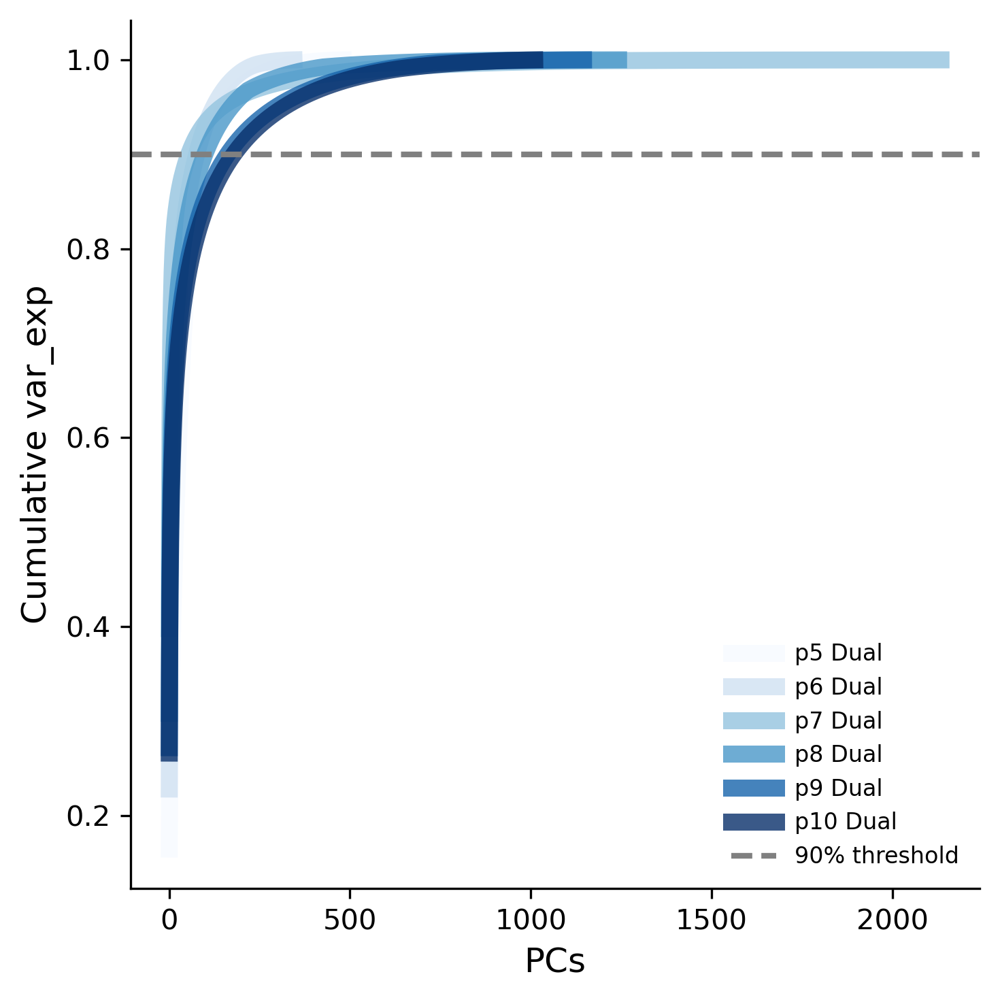

In [253]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm

# --- Dual Imaging datasets ---
dual_rows = []
for idx, row in combined_df.iterrows():
    var_exp_cell = row.get('var_exp_time', None)
    group = row.get('group', '')
    if var_exp_cell is not None and group.lower() == 'dual imaging':
        age_val = str(row.get('age', ''))
        age_label = f'p{age_val}' if not age_val.lower().startswith('p') else age_val
        dual_rows.append((row['session'], age_label, var_exp_cell))

# Sort by numeric age
dual_rows = sorted(dual_rows, key=lambda x: extract_age_num(x[1]))
unique_ages = sorted(set(age for _, age, _ in dual_rows), key=extract_age_num)
num_ages = len(unique_ages)

# Assign age-colormap (Blues)
blues = [cm.Blues(i / max(1, num_ages-1)) for i in range(num_ages)]
age2blue = dict(zip(unique_ages, blues))

# Organize sessions by age
age_data = {age: [] for age in unique_ages}
for _, age, var_exp in dual_rows:
    cum_var = np.cumsum(var_exp) / np.sum(var_exp)  # normalize
    age_data[age].append(cum_var)

# Plot mean cumulative variance curves per age
plt.figure(figsize=(5,5), dpi=300)
threshold = 0.90

for age in unique_ages:
    if age_data[age]:
        # Make all curves same length by padding with last value
        max_len = max(len(c) for c in age_data[age])
        padded_curves = [np.pad(c, (0, max_len - len(c)), mode='edge') for c in age_data[age]]
        mean_curve = np.mean(padded_curves, axis=0)
        plt.plot(mean_curve, color=age2blue[age], lw=6, alpha=0.8, label=f'{age} Dual')

# Reference line
plt.axhline(y=threshold, color='grey', linestyle='--', lw=2, label=f'{threshold*100:.0f}% threshold')

plt.xlabel("PCs", fontsize=12)
plt.ylabel("Cumulative var_exp", fontsize=12)
plt.legend(fontsize=8, loc='lower right', frameon=False)
plt.tight_layout()
plt.show()


In [ ]:
# Plot cumulative variance curves (normalized per dataset)
plt.figure(figsize=(5,5), dpi=300)
threshold = 0.90

for session, age, var_exp, group in valid_rows:
    var_exp = np.array(var_exp)
    if var_exp.sum() == 0:
        continue  # skip empty datasets
    
    # Normalize cumulative variance by total variance
    cum_var = np.cumsum(var_exp) / var_exp.sum()
    
    if group.lower() == 'dual imaging':
        plt.plot(cum_var, color=age2blue[age], lw=1, alpha=0.7)
    elif group.lower() == 'gaba':
        plt.plot(cum_var, color=age2orange[age], lw=1, alpha=0.7)
    else:
        plt.plot(cum_var, color='grey', lw=1, alpha=0.5)

# Reference line
plt.axhline(y=threshold, color='black', linestyle='--', lw=0.8, label=f'{threshold*100:.0f}% threshold')

plt.title("Norm. variance explained (all datasets)", fontsize=14, y=1.05)
plt.xlabel("PCs", fontsize=12)
plt.ylabel("cumulative var_exp", fontsize=12)

# Legend: one entry per age per group
handles, labels = [], []
for age in unique_ages:
    handles.append(plt.Line2D([], [], color=age2blue[age], lw=2))
    labels.append(f'{age} Dual')
    handles.append(plt.Line2D([], [], color=age2orange[age], lw=2))
    labels.append(f'{age} GABA')

# Add threshold line
handles.append(plt.Line2D([], [], color='black', lw=5, linestyle='--'))
labels.append(f'{threshold*100:.0f}% threshold')

plt.legend(handles, labels, fontsize=8, loc='lower right')
plt.tight_layout()
plt.show()

In [ ]:
age_group_means = {'dual imaging': {}, 'gaba': {}}

for grp in ['dual imaging', 'gaba']:
    for age in unique_ages:
        # Collect all sessions for this group and age
        session_vars = [np.array(var_exp) for s, a, var_exp, g in valid_rows 
                        if g.lower() == grp and a == age and np.array(var_exp).sum() > 0]
        if len(session_vars) == 0:
            continue
        
        # Compute normalized cumulative variance per session
        cum_vars = [np.cumsum(v)/v.sum() for v in session_vars]
        # Pad with NaN if different lengths
        max_len = max([len(cv) for cv in cum_vars])
        cum_vars_padded = [np.pad(cv, (0, max_len - len(cv)), constant_values=np.nan) for cv in cum_vars]
        # Compute mean across sessions (ignoring NaNs)
        mean_cum_var = np.nanmean(cum_vars_padded, axis=0)
        age_group_means[grp][age] = mean_cum_var

# Plot mean cumulative variance curves
plt.figure(figsize=(5,5), dpi=300)

for age in unique_ages:
    if age in age_group_means['dual imaging']:
        plt.plot(age_group_means['dual imaging'][age], color=age2blue[age], lw=2, label=f'{age} Dual')
    if age in age_group_means['gaba']:
        plt.plot(age_group_means['gaba'][age], color=age2orange[age], lw=2, label=f'{age} GABA')

# Reference line
plt.axhline(y=threshold, color='black', linestyle='--', lw=0.8, label=f'{threshold*100:.0f}% threshold')

plt.title("Mean Norm. variance explained", fontsize=14, y=1.05)
plt.xlabel("PCs", fontsize=12)
plt.ylabel("Cumulative variance explained", fontsize=12)
plt.legend(fontsize=8, loc='lower right')
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

threshold = 0.90

# --- Split datasets ---
gaba_rows = [r for r in valid_rows if r[3].lower() == "gaba"]
dual_rows = [r for r in valid_rows if r[3].lower() == "dual imaging"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=300, sharey=True)

# --- Plot GABA ---
ax = axes[0]
for session, age, var_exp, group in gaba_rows:
    var_exp = np.array(var_exp)
    if var_exp.sum() == 0:
        continue
    cum_var = np.cumsum(var_exp) / var_exp.sum()
    ax.plot(cum_var, color=age2orange[age], lw=2, alpha=0.7)

ax.axhline(y=threshold, color='black', linestyle='--', lw=0.8)
ax.set_title("Norm. variance explained (GABA)", fontsize=14, y=1.05)
ax.set_xlabel("PCs", fontsize=12)
ax.set_ylabel("Cumulative var_exp", fontsize=12)

# --- Plot Dual Imaging ---
ax = axes[1]
for session, age, var_exp, group in dual_rows:
    var_exp = np.array(var_exp)
    if var_exp.sum() == 0:
        continue
    cum_var = np.cumsum(var_exp) / var_exp.sum()
    ax.plot(cum_var, color=age2blue[age], lw=2, alpha=0.7)

ax.axhline(y=threshold, color='black', linestyle='--', lw=0.8)
ax.set_title("Norm. variance explained (Dual Imaging)", fontsize=14, y=1.05)
ax.set_xlabel("PCs", fontsize=12)

# --- Legends ---
handles, labels = [], []
for age in unique_ages:
    handles.append(plt.Line2D([], [], color=age2orange[age], lw=2))
    labels.append(f"{age} GABA")
    handles.append(plt.Line2D([], [], color=age2blue[age], lw=2))
    labels.append(f"{age} Dual")
handles.append(plt.Line2D([], [], color="black", lw=1, linestyle="--"))
labels.append(f"{threshold*100:.0f}% threshold")

fig.legend(handles, labels, fontsize=8, loc="lower right", ncol=3)

plt.tight_layout(rect=[0, 0.05, 1, 1])  # leave space for legend
plt.show()


In [ ]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Copy DataFrame and drop missing
# combined_df = all_plot_df.copy()
# combined_df = combined_df.dropna(subset=['behavior_coupling'])

# # Expand arrays into long format
# long_df = []
# for _, row in combined_df.iterrows():
#     values = row['behavior_coupling']
#     if values is None or (isinstance(values, float) and pd.isna(values)):
#         continue
#     for v in np.atleast_1d(values):  # make sure it's iterable
#         long_df.append({
#             'age': row['age'],
#             'group': row['group'],
#             'behavior_coupling': v
#         })

# long_df = pd.DataFrame(long_df)

# # Define palette
# palette = {
#     'GABA': 'orange',
#     'Dual Imaging': 'steelblue'
# }

# plt.figure(figsize=(10, 6), dpi=200)

# # Boxplot per age & group
# sns.boxplot(
#     x='age', y='behavior_coupling', data=long_df, hue='group',
#     palette=palette,
#     width=0.6, linewidth=0.7
# )

# # # Overlay individual points
# # sns.stripplot(
# #     x='age', y='behavior_coupling', data=long_df,
# #     hue='group',
# #     palette=palette,
# #     dodge=True,
# #     jitter=True,
# #     alpha=0.6,
# #     size=3,
# #     edgecolor='black',
# #     linewidth=0.3
# # )

# plt.title('Behavioral Coupling per Age', fontsize=16, y=1.05)
# plt.ylabel('Behavioral Coupling', fontsize=14)
# plt.xlabel('Age', fontsize=14)
# plt.axhline(y=0, linestyle='--', color='grey', lw=0.5)
# plt.xticks(rotation=45, fontsize=11)

# # Fix legend duplication
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = dict(zip(labels, handles))
# plt.legend(by_label.values(), by_label.keys(), title='Group')

# plt.tight_layout()
# plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Copy DataFrame and drop missing
combined_df = all_plot_df.copy()
combined_df = combined_df.dropna(subset=['behavior_coupling'])

# Expand arrays into long format
long_df = []
for _, row in combined_df.iterrows():
    values = row['behavior_coupling']
    if values is None or (isinstance(values, float) and pd.isna(values)):
        continue
    for v in np.atleast_1d(values):  # ensure iterable
        long_df.append({
            'age': row['age'],
            'group': row['group'],
            'behavior_coupling': v
        })

long_df = pd.DataFrame(long_df)

# Define palette
palette = {
    'GABA': 'orange',
    'Dual Imaging': 'steelblue'
}

plt.figure(figsize=(10, 5), dpi=300)

# Violin plot per age & group
sns.violinplot(
    x='age', y='behavior_coupling', data=long_df, hue='group',
    palette=palette,
    cut=0,        # don’t extend beyond data
    inner=None,   # no quartiles inside
    linewidth=0.7,
    scale='width'
)

# Overlay mean values
sns.pointplot(
    x='age', y='behavior_coupling', data=long_df, hue='group',
    dodge=0.4,     # shift points so groups don't overlap
    join=False,    # don't connect across ages
    markers='o',
    ci='sd',       # show mean ± SD (use 'se' for SEM)
    color='black',
    errwidth=1.2,
    capsize=0.2
)

plt.title('behavioral corr - age ', fontsize=16, y=1.05)
plt.ylabel('behavioral coupling', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.axhline(y=0, linestyle='--', color='grey', lw=0.5)
plt.xticks(rotation=45, fontsize=11)

# Fix legend duplication
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), title='Group')

plt.tight_layout()
plt.show()


# SCEs

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import re

# --- Prepare GABA dataframe ---
gaba_only = gaba_plot_df.copy()

# Ensure numeric values
for col in ['SCE_frequency_active_state', 'SCE_frequency_rest_state',
            'SCE_peak_amplitude_active_percentage', 'SCE_peak_amplitude_rest_percentage']:
    gaba_only[col] = pd.to_numeric(gaba_only[col], errors='coerce')

# Sort ages properly
def extract_age_num(label):
    match = re.search(r'\d+', str(label))
    return int(match.group(0)) if match else -1

age_order = sorted(gaba_only['age'].unique(), key=extract_age_num)

# --- Melt frequency and amplitude for paired violins ---
freq_df = gaba_only.melt(
    id_vars='age',
    value_vars=['SCE_frequency_active_state', 'SCE_frequency_rest_state'],
    var_name='state',
    value_name='SCE_frequency'
)
freq_df['state'] = freq_df['state'].map({
    'SCE_frequency_active_state': 'Active',
    'SCE_frequency_rest_state': 'Rest'
})

amp_df = gaba_only.melt(
    id_vars='age',
    value_vars=['SCE_peak_amplitude_active_percentage', 'SCE_peak_amplitude_rest_percentage'],
    var_name='state',
    value_name='SCE_amplitude'
)
amp_df['state'] = amp_df['state'].map({
    'SCE_peak_amplitude_active_percentage': 'Active',
    'SCE_peak_amplitude_rest_percentage': 'Rest'
})


In [ ]:
# --- Plotting side by side ---
fig, axs = plt.subplots(1, 2, figsize=(20,5), dpi=300)

# SCE frequency
sns.violinplot(data=freq_df, x='age', y='SCE_frequency', hue='state',
               order=age_order, palette=['red','blue'], ax=axs[0], split=True)
sns.stripplot(data=freq_df, x='age', y='SCE_frequency', hue='state',
              order=age_order, dodge=True, color='black', size=4, alpha=0.6, ax=axs[0], legend=False)
axs[0].set_ylabel('SCE frequency (Hz)')
axs[0].set_title('SCE frequency per age')
axs[0].legend(title='State')

# SCE amplitude
sns.violinplot(data=amp_df, x='age', y='SCE_amplitude', hue='state',
               order=age_order, palette=['red','blue'], ax=axs[1], split=True)
sns.stripplot(data=amp_df, x='age', y='SCE_amplitude', hue='state',
              order=age_order, dodge=True, color='black', size=4, alpha=0.6, ax=axs[1], legend=False)
axs[1].set_ylabel('% cell participation')
axs[1].set_title('SCE amplitude per age')
axs[1].legend(title='State')

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# --- Collect frequency per age ---
records_freq = []

for sess in gaba_data:
    age = sess.get('age', 'unknown')
    val_active = sess.get('SCE_frequency_active_state', None)
    val_rest = sess.get('SCE_frequency_rest_state', None)
    
    # Active
    if val_active is not None:
        if isinstance(val_active, (list, np.ndarray)):
            for v in val_active:
                records_freq.append({'age': age, 'state': 'Active', 'SCE_frequency': v})
        else:
            records_freq.append({'age': age, 'state': 'Active', 'SCE_frequency': val_active})
    
    # Rest
    if val_rest is not None:
        if isinstance(val_rest, (list, np.ndarray)):
            for v in val_rest:
                records_freq.append({'age': age, 'state': 'Rest', 'SCE_frequency': v})
        else:
            records_freq.append({'age': age, 'state': 'Rest', 'SCE_frequency': val_rest})

# Convert to DataFrame
freq_df = pd.DataFrame(records_freq)

# Sort ages numerically
def extract_age_num(label):
    import re
    m = re.search(r'\d+', str(label))
    return int(m.group(0)) if m else -1

age_order = sorted(freq_df['age'].unique(), key=extract_age_num)

# --- Plot paired boxplots for frequency ---
plt.figure(figsize=(12,5), dpi=300)
alpha_val =0.7
width = 0.25
for i, age in enumerate(age_order):
    data_active = freq_df[(freq_df['age'] == age) & (freq_df['state'] == 'Active')]['SCE_frequency']
    data_rest = freq_df[(freq_df['age'] == age) & (freq_df['state'] == 'Rest')]['SCE_frequency']
    
    pos_active = i - width/2
    pos_rest = i + width/2
    
    plt.boxplot(data_active, positions=[pos_active], widths=width, patch_artist=True,
                boxprops=dict(facecolor='orange', alpha=alpha_val),
                medianprops=dict(color='black'), showfliers=False)
    
    plt.boxplot(data_rest, positions=[pos_rest], widths=width, patch_artist=True,
                boxprops=dict(facecolor='blue', alpha=alpha_val),
                medianprops=dict(color='black'), showfliers=False)

# X-axis labels at middle of each pair
plt.xticks(range(len(age_order)), age_order, rotation=45)
plt.ylabel('SCE frequency (Hz)', fontsize=13)
plt.title('SCE frequency per state — Active (orange) vs Rest (blue)')
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# --- Collect amplitude per age (already done) ---
# amp_df = ...

# Sort ages numerically
def extract_age_num(label):
    import re
    m = re.search(r'\d+', str(label))
    return int(m.group(0)) if m else -1

age_order = sorted(amp_df['age'].unique(), key=extract_age_num)

# --- Plot paired boxplots closer together ---
plt.figure(figsize=(10,5), dpi=300)

width = 0.25  # width of each box
for i, age in enumerate(age_order):
    data_active = amp_df[(amp_df['age'] == age) & (amp_df['state'] == 'Active')]['SCE_amplitude']
    data_rest = amp_df[(amp_df['age'] == age) & (amp_df['state'] == 'Rest')]['SCE_amplitude']
    
    pos_active = i - width/2
    pos_rest = i + width/2
    
    plt.boxplot(data_active, positions=[pos_active], widths=width, patch_artist=True,
                boxprops=dict(facecolor='orange'), medianprops=dict(color='black'), showfliers=False)
    
    plt.boxplot(data_rest, positions=[pos_rest], widths=width, patch_artist=True,
                boxprops=dict(facecolor='blue'), medianprops=dict(color='black'), showfliers=False)

# X-axis labels at middle of each pair
plt.xticks(range(len(age_order)), age_order)
plt.ylabel('% cell participation', fontsize=15)
plt.title('SCE (event) amplitude per state')
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os

# Example: gaba_data is a list of session dicts as you described
# Each session dict contains keys like 'age', 'peri_twitch_SCE_avg', 'time_axis/framerate_avg'

# --- Collect peri-twitch traces per age ---
peri_sce_by_age = {}

for sess in gaba_data:
    age = sess.get('age', 'unknown')
    peri_avg = sess.get('peri_twitch_SCE_avg', None)
    time_axis = sess.get('time_axis/framerate_avg', None)

    if peri_avg is None or time_axis is None:
        continue

    peri_sce_by_age.setdefault(age, []).append(np.array(peri_avg))

# --- Plotting ---
plt.figure(figsize=(8,5), dpi=200)
colors = plt.cm.viridis(np.linspace(0, 1, len(peri_sce_by_age)))

for i, (age, traces_list) in enumerate(peri_sce_by_age.items()):
    # Stack all traces (in case multiple sessions per age)
    all_traces = np.vstack(traces_list)
    peri_mean = all_traces.mean(axis=0)
    peri_sem = all_traces.std(axis=0) / np.sqrt(all_traces.shape[0])
    
    plt.plot(time_axis, peri_mean, label=f"{age}", color=colors[i])
    plt.fill_between(time_axis, peri_mean - peri_sem, peri_mean + peri_sem, color=colors[i], alpha=0.3)

plt.axvline(0, color="red", linestyle="--", label="Twitch onset")
plt.xlabel("Time (sec)")
plt.ylabel("Summed SCE activity")
plt.title("Peri-twitch mean SCE activity by age")
plt.legend(title="Age", bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

In [ ]:
for sess in gaba_data:
    if sess.get('peri_twitch_SCE_avg') is None:
        print(f"Missing peri_twitch_SCE_avg in session {sess.get('age')}")
    else:
        print(f"Session {sess.get('age')} has trace length: {len(sess['peri_twitch_SCE_avg'])}")


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

framerate_avg = 3  # already defined

# --- Collect all peri-twitch traces ---
peri_sce_all = []
ages_all = []

for sess in gaba_data:
    trace = sess.get('peri_twitch_SCE_avg', None)
    age = sess.get('age', 'unknown')
    if trace is not None:
        peri_sce_all.append(trace)
        ages_all.append(age)

# Find minimum length
min_len = min(map(len, peri_sce_all))

# Trim all traces to same length
peri_sce_trimmed = np.array([trace[:min_len] for trace in peri_sce_all])

# Compute mean across sessions
peri_avg = peri_sce_trimmed.mean(axis=0)

# Time axis centered on twitch onset
window_before = int(min_len / 4)  # adjust as needed
time_axis = np.arange(-window_before, min_len - window_before) / framerate_avg

# --- Plot all individual traces in gray ---
plt.figure(figsize=(5,7), dpi=300)
for trace in peri_sce_trimmed:
    plt.plot(time_axis, trace, color='gray', alpha=0.2)

# Overlay mean trace
plt.plot(time_axis, peri_avg, color='b', linewidth=2, label="Peri-twitch mean activity")

# Twitch onset line
plt.axvline(0, color="black", linestyle="--", label="Twitch onset")

plt.xlabel("Time (s)")
plt.ylabel("Summed activity")
plt.title("Peri-twitch activity — individual (gray) + mean (red)")
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
from scipy.ndimage import gaussian_filter1d

sigma = 1  # smoothing strength (adjust as needed)

# --- Collect all peri-twitch traces ---
peri_sce_all = []
ages_all = []

for sess in gaba_data:
    trace = sess.get('peri_twitch_SCE_avg', None)
    age = sess.get('age', 'unknown')
    if trace is not None:
        peri_sce_all.append(trace)
        ages_all.append(age)

# Find minimum length
min_len = min(map(len, peri_sce_all))

# Trim all traces to same length
peri_sce_trimmed = np.array([trace[:min_len] for trace in peri_sce_all])

# Smooth all traces
peri_sce_smoothed = np.array([gaussian_filter1d(trace, sigma=sigma) for trace in peri_sce_trimmed])

# Compute mean across sessions (smoothed)
peri_avg_smoothed = peri_sce_smoothed.mean(axis=0)

# Time axis centered on twitch onset
window_before = int(min_len / 4)  # adjust as needed
time_axis = np.arange(-window_before, min_len - window_before) / framerate_avg

# --- Plot all individual traces in gray ---
plt.figure(figsize=(3,3), dpi=300)
for trace in peri_sce_smoothed:
    plt.plot(time_axis, trace, color='gray', alpha=0.2)

# Overlay smoothed mean trace
plt.plot(time_axis, peri_avg_smoothed, color='b', linewidth=2, label="Peri-twitch mean activity")

# Twitch onset line
plt.axvline(0, color="black", linestyle="--", label="Twitch onset")

plt.xlabel("Time (s)")
plt.ylabel("SCE amplitude")
plt.title("Peri-twitch activity — smoothed individual + mean")
plt.legend(fontsize=5, loc='upper right')
plt.tight_layout()
plt.show()

## Data Exploration and Validation


In [ ]:
# Convert to DataFrame for easier analysis
df = pd.DataFrame(all_data)

print("Data Summary:")
print(f"Total records: {len(df)}")
print(f"\nBy group:")
print(df['group'].value_counts())
print(f"\nBy age:")
print(df['age'].value_counts().sort_index())

# Check available metrics
print(f"\nAvailable metrics:")
print(f"R² (Linear): {df['r2_linear'].notna().sum()} records")
print(f"F1-score (Logistic): {df['f1_score_logistic'].notna().sum()} records")
print(f"Active percentage: {df['active_percentage'].notna().sum()} records")

# Show sample data
print(f"\nSample data:")
print(df[['age', 'group', 'r2_linear', 'f1_score_logistic', 'active_percentage']].head())


## Plotting Functions


In [ ]:
def plot_metric_vs_age(df, metric_col, metric_name, save_path=None):
    """Plot metric vs age with color coding by group"""
    
    # Filter data with valid metric values
    plot_data = df[df[metric_col].notna()].copy()
    
    if len(plot_data) == 0:
        print(f"No data available for {metric_name}")
        return
    
    # Create figure
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Define colors for groups
    colors = {'GABA': 'red', 'Dual Imaging': 'blue'}
    
    # Plot each group separately
    for group in plot_data['group'].unique():
        group_data = plot_data[plot_data['group'] == group]
        
        # Convert age to numeric for plotting
        age_mapping = {
            'p1': 1, 'p2': 2, 'p3': 3, 'p4':4, 'p5': 5, 'p4': 4, 'p5': 5,
            'p6': 6, 'p7': 7, 'p8': 8, 'p9': 9, 'p10': 10
        }
        
        group_data = group_data.copy()
        group_data['age_numeric'] = group_data['age'].map(age_mapping)
        
        # Scatter plot
        ax.scatter(group_data['age_numeric'], group_data[metric_col], 
                  c=colors[group], label=group, alpha=0.7, s=100)
        
        # Add trend line
        if len(group_data) > 1:
            z = np.polyfit(group_data['age_numeric'], group_data[metric_col], 1)
            p = np.poly1d(z)
            ax.plot(group_data['age_numeric'], p(group_data['age_numeric']), 
                   color=colors[group], linestyle='--', alpha=0.8)
    
    # Customize plot
    ax.set_xlabel('Age (Postnatal Days)', fontsize=14)
    ax.set_ylabel(metric_name, fontsize=14)
    ax.set_title(f'{metric_name} vs Age: GABA-only vs Dual Imaging', fontsize=16)
    ax.legend(fontsize=12)
    ax.grid(True, alpha=0.3)
    
    # Set x-axis ticks
    ax.set_xticks(range(1, 11))
    ax.set_xticklabels(['P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10'])
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()

def plot_box_plots(df, metric_col, metric_name, save_path=None):
    """Create box plots for metric by age and group"""
    
    # Filter data with valid metric values
    plot_data = df[df[metric_col].notna()].copy()
    
    if len(plot_data) == 0:
        print(f"No data available for {metric_name}")
        return
    
    # Create figure
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Create box plot
    sns.boxplot(data=plot_data, x='age', y=metric_col, hue='group', ax=ax)
    
    # Customize plot
    ax.set_xlabel('Age (Postnatal Days)', fontsize=14)
    ax.set_ylabel(metric_name, fontsize=14)
    ax.set_title(f'{metric_name} Distribution by Age and Group', fontsize=16)
    ax.legend(fontsize=12)
    
    # Rotate x-axis labels
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()
